# Coca leaf shape, v. 3

__________

The following is a `jupyter notebook` ([Kluyver et al. 2016](https://ebooks.iospress.nl/doi/10.3233/978-1-61499-649-1-87)) tutorial written using the `python` coding language. Text written in `markdown cells` is used to explain code presented and executed in `coding cells`. This tutorial assumes a working knowledge of `python` and the ability to use `jupyter notebooks`.  

If you are new to `python` or do not know how to use `jupyter notebooks`, we recommend that you familiarize yourself with them through a tutorial. For the context of plant biology and leaf shape presented here, we recommend `Plants&Python` ([VanBuren et al., 2022](https://doi.org/10.1093/plcell/koac187)), accessible using this [link](https://plantsandpython.github.io/PlantsAndPython). There you will find instructions for downloading and installing [Anaconda](https://docs.anaconda.com/anaconda/install/) and how to get going with `jupyter notebooks` and `python`.

### Import modules

We first import modules which contain functions and other code necessary to perform the analysis in this `jupyter notebook`.

Below, we provide references for some of the modules used in this notebook:  

- `pandas`, [McKinney, 2010](http://conference.scipy.org.s3.amazonaws.com/proceedings/scipy2010/pdfs/mckinney.pdf)
- `numpy`, [Harris et al., 2020](https://www.nature.com/articles/s41586-020-2649-2)
- `matplotlib`, [Hunter, 2007](https://www.computer.org/csdl/magazine/cs/2007/03/c3090/13rRUwbJD0A)
- `scikit-learn`, [Pedregosa et al., 2011](https://www.jmlr.org/papers/volume12/pedregosa11a/pedregosa11a.pdf?ref=https:/)
- `scipy`, [Virtanen et al., 2020](https://www.nature.com/articles/s41592-019-0686-2)
- `seaborn`, [Waskom, 2021](https://joss.theoj.org/papers/10.21105/joss.03021.pdf)
- `OpenCV`, [Bradski and Kaehler, 2008](https://www.google.com/books/edition/Learning_OpenCV/seAgiOfu2EIC?hl=en&gbpv=0)

In [1]:
#######################
### LOAD IN MODULES ###
#######################

import cv2 # to install on mac: pip install opencv-python
from scipy.interpolate import interp1d # for interpolating points
from sklearn.decomposition import PCA # for principal component analysis
from scipy.spatial import procrustes # for Procrustes analysis
from scipy.spatial import ConvexHull # for convex hull
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis # for LDA
from sklearn.metrics import confusion_matrix # for confusion matrix
import scipy.stats as stats # for kruskal wallis test
import statsmodels.stats.multitest as multitest # multiple test adjustment
import itertools # for pairwise combinations
from os import listdir # for retrieving files from directory
from os.path import isfile, join # for retrieving files from directory
import matplotlib.pyplot as plt # for plotting
import numpy as np # for using arrays
import math # for mathematical operations
import pandas as pd # for using pandas dataframes
import seaborn as sns # for plotting in seaborn
from matplotlib.colors import LogNorm # for log scale
import phate # for using PHATE 
import scprep # for using PHATE

### Define functions

The following functions define useful operations used in the analysis.

In [2]:
#################
### FUNCTIONS ###
#################

def angle_between(p1, p2, p3):
    """
    define a function to find the angle between 3 points anti-clockwise in degrees, p2 being the vertex
    inputs: three angle points, as tuples
    output: angle in degrees
    """
    x1, y1 = p1
    x2, y2 = p2
    x3, y3 = p3
    deg1 = (360 + math.degrees(math.atan2(x1 - x2, y1 - y2))) % 360
    deg2 = (360 + math.degrees(math.atan2(x3 - x2, y3 - y2))) % 360
    return deg2 - deg1 if deg1 <= deg2 else 360 - (deg1 - deg2)

def rotate_points(xvals, yvals, degrees):
    """"
    define a function to rotate 2D x and y coordinate points around the origin
    inputs: x and y vals (can take pandas dataframe columns) and the degrees (positive, anticlockwise) to rotate
    outputs: rotated and y vals
    """
    angle_to_move = 90-degrees
    rads = np.deg2rad(angle_to_move)
    
    new_xvals = xvals*np.cos(rads)-yvals*np.sin(rads)
    new_yvals = xvals*np.sin(rads)+yvals*np.cos(rads)
    
    return new_xvals, new_yvals

def interpolation(x, y, number): 
    """
    define a function to return equally spaced, interpolated points for a given polyline
    inputs: arrays of x and y values for a polyline, number of points to interpolate
    ouputs: interpolated points along the polyline, inclusive of start and end points
    """
    distance = np.cumsum(np.sqrt( np.ediff1d(x, to_begin=0)**2 + np.ediff1d(y, to_begin=0)**2 ))
    distance = distance/distance[-1]

    fx, fy = interp1d( distance, x ), interp1d( distance, y )

    alpha = np.linspace(0, 1, number)
    x_regular, y_regular = fx(alpha), fy(alpha)
    
    return x_regular, y_regular

def euclid_dist(x1, y1, x2, y2):
    """
    define a function to return the euclidean distance between two points
    inputs: x and y values of the two points
    output: the eulidean distance
    """
    return np.sqrt((x2-x1)**2 + (y2-y1)**2)

def poly_area(x,y):
    """
    define a function to calculate the area of a polygon using the shoelace algorithm
    inputs: separate numpy arrays of x and y coordinate values
    outputs: the area of the polygon
    """
    return 0.5*np.abs(np.dot(x,np.roll(y,1))-np.dot(y,np.roll(x,1)))

def gpa_mean(leaf_arr, landmark_num, dim_num):
    
    """
    define a function that given an array of landmark data returns the Generalized Procrustes Analysis mean
    inputs: a 3 dimensional array of samples by landmarks by coordinate values, number of landmarks, number of dimensions
    output: an array of the Generalized Procrustes Analysis mean shape
    
    """

    ref_ind = 0 # select arbitrary reference index to calculate procrustes distances to
    ref_shape = leaf_arr[ref_ind, :, :] # select the reference shape

    mean_diff = 10**(-30) # set a distance between means to stop the algorithm

    old_mean = ref_shape # for the first comparison between means, set old_mean to an arbitrary reference shape

    d = 1000000 # set d initially arbitraily high

    while d > mean_diff: # set boolean criterion for Procrustes distance between mean to stop calculations

        arr = np.zeros( ((len(leaf_arr)),landmark_num,dim_num) ) # empty 3D array: # samples, landmarks, coord vals

        for i in range(len(leaf_arr)): # for each leaf shape 

            s1, s2, distance = procrustes(old_mean, leaf_arr[i]) # calculate procrustes adjusted shape to ref for current leaf
            arr[i] = s2 # store procrustes adjusted shape to array

        new_mean = np.mean(arr, axis=(0)) # calculate mean of all shapes adjusted to reference

        s1, s2, d = procrustes(old_mean, new_mean) # calculate procrustes distance of new mean to old mean

        old_mean = new_mean # set the old_mean to the new_mea before beginning another iteration

    return new_mean


_________
### Wild leaf data
__________

Leaf shape data from wild coca species is the same as that analyzed in [Przelomska *et al*. (2024)](https://doi.org/10.1093/molbev/msae114). 450 leaves from wild coca species were analyzed in total, including 200 *E. gracilipes*, 189 *E. cataractarum*, 43 *E. foetidum*, and 18 *E. lineolatum* leaves. Leaf shape data was saved as outline `x` and `y` coordinate data with pixels per centimeter scale information for each leaf. 

### Read in *wild* data

In [3]:
########################
### READ IN METADATA ###
########################

mdata = pd.read_csv("./wild_metadata.csv") # read in csv

mdata.head() # head data to check

,full_species,species,id,px_cm
0,cataractarum,cata,151,62.0
1,cataractarum,cata,1383,76.0
2,cataractarum,cata,1422,75.0
3,cataractarum,cata,2614,58.0
4,cataractarum,cata,3565,85.0


In [4]:
#######################################
### MAKE A LIST OF IMAGE FILE NAMES ###
#######################################

data_dir = "./wild_outlines/" # set data directory

file_names = [f for f in listdir(data_dir) if isfile(join(data_dir, f))] # create a list of file names

file_names.remove('.DS_Store') # remove .DS_Store file

file_names.sort() # sort the list of file names

file_names # check list of file names

['cata_13277_1.txt',
 'cata_13277_2.txt',
 'cata_13277_3.txt',
 'cata_13277_4.txt',
 'cata_13277_5.txt',
 'cata_1383_1.txt',
 'cata_1383_2.txt',
 'cata_1383_3.txt',
 'cata_1383_5.txt',
 'cata_1422_2.txt',
 'cata_1422_3.txt',
 'cata_1422_4.txt',
 'cata_1422_5.txt',
 'cata_1422_6.txt',
 'cata_151_1.txt',
 'cata_151_2.txt',
 'cata_151_3.txt',
 'cata_151_4.txt',
 'cata_151_5.txt',
 'cata_1773994_1.txt',
 'cata_1773994_2.txt',
 'cata_1773994_3.txt',
 'cata_1773994_4.txt',
 'cata_2171745_1.txt',
 'cata_2171745_2.txt',
 'cata_2171745_3.txt',
 'cata_2171745_4.txt',
 'cata_2171746_1.txt',
 'cata_2171746_2.txt',
 'cata_2171746_3.txt',
 'cata_2171746_4.txt',
 'cata_2171746_5.txt',
 'cata_2253071_1.txt',
 'cata_2253071_2.txt',
 'cata_2253071_3.txt',
 'cata_2253071_4.txt',
 'cata_2253071_5.txt',
 'cata_2458022_1.txt',
 'cata_2458022_2.txt',
 'cata_2614_1.txt',
 'cata_2614_2.txt',
 'cata_2614_3.txt',
 'cata_2614_4.txt',
 'cata_2614_5.txt',
 'cata_2690426_1.txt',
 'cata_2690426_2.txt',
 'cata_2690426

### Process and landmark *wild* data

- Read in outline
- Collect information and calculate area in centimeters squared
- Orient leaf along length by PCA 
- Find the base as the narrowest end
- Interpolate with a high resolution of pseudo-landmarks
- Reset the base index to zero
- Interpolate each side with desired number of equidistant pseudo-landmarks
- Rotate leaves and scale to centimeters
- Save pseudo-landmarks scaled to centimeters in an array

PARAMETERS AND INDEXING:
- `high_res_pts` is an arbitrarily high number of points to initially interpolate
- `res` is the desired number of points to interpolate on each side of the leaf
- The total number of pseudo-landmarks will be `2*res - 1`
- The base index will be `0`
- The tip index will be `res-1`
- The returned leaves in `cm_arr` are scaled in size to centimeters

Each wild coca species leaf shape outline was read in as a numpy array from text file and its scale and identification information saved to list. A principal component analysis (PCA) was used to orient the leaves along their longest axis. In order to estimate the base and tip points of the leaf, we assumed that the base of the leaf would be more pointed, and petiole-like than the wider tip. Taking 2 percent of the length of the first principal component length on each side of the leaf, we compared the width of the leaf on each side, and assigned the base to the narrower and the tip to the wider side of the leaf. We then interpolated a large number of equidistant points (10,000) around the leaf outline, assigned the base and tip index to the closest point to the estimated base and tip points, and then interpolated the desired number of equidistant pseudo-landmark points on each side of the leaf. For this study, 50 pseudo-landmarks were placed on each side of the leaf, with care taken to remove a redundant point at the tip, resulting in 99 equidistant pseudo-landmarks per leaf. Leaves were rotated so tip points upwards, scaled to centimeters, and then saved to numpy array with corresponding label information stored in a pandas dataframe.

In [5]:
######################
### SET PARAMETERS ###
######################

# the number of equidistant points to create
# an initial high resolution outline of the leaf
high_res_pts = 10000

# the percent length of the leaf to identify the tip and base
percent = 0.02

# the ultimate number of equidistant points on each side of the leaf
# (-1 for the tip)
# the leaf will have res*2-1 pseudo-landmarks
#################
#################
#################
res = 50 ########
#################
#################

# get species and herbarium id for each file
# get leaf area for each file
spe_list = [] # to store species identification
herb_id_list = [] # to store hebarium identification
cm_area_list = [] # to store the area in cm

# an array to store pseudo-landmarks
wild_cm_arr = np.zeros((len(file_names),(res*2)-1,2))

for i in range(len(file_names)): # for each leaf
    
    #############################################
    ### READ IN DATA AND RETRIEVE INFORMATION ###
    #############################################

    name = file_names[i] # get current file name
    
    print(i, name) # print current file name for trouble shooting

    spe = name[:4] # get species name

    herb_id = name[5:-6] # get herbarium id

    lf_coords = np.loadtxt(data_dir + name) # load in leaf coordinates

    px_area = poly_area(lf_coords[:,0],lf_coords[:,1]) # calculate area in pixels

    mdata_spe = mdata[mdata["species"]==spe] # mask metadata by species
    mdata_id = mdata_spe[mdata_spe["id"]==herb_id] # mask metadata by herbarium id

    scale = float(mdata_id["px_cm"].iloc[0]) # retrieve the px per cm scale

    cm_area = px_area*(1/scale**2) # retrieve cm2 area
    
    spe_list.append(spe) # store species id
    herb_id_list.append(herb_id) # store herbarium id
    cm_area_list.append(cm_area) # store area in cm2
    
    ################################################
    ### ORIENT LEAF AND FIND BASE AND TIP POINTS ###
    ################################################
    
    pca = PCA(n_components=2) # perform PCA to align along longest axis
    pca = pca.fit_transform(lf_coords)

    left_side = pca[
        (pca[:,0])<
        np.min(pca[:,0])+((np.max(pca[:,0])-np.min(pca[:,0]))*percent)] # isolate left tip

    right_side = pca[
        (pca[:,0])>
        np.max(pca[:,0])-((np.max(pca[:,0])-np.min(pca[:,0]))*percent)] # isolate right tip

    left_height = np.abs(left_side[0,1]-left_side[-1,1]) # get left tip height

    right_height = np.abs(right_side[0,1]-right_side[-1,1]) # get right tip height

    if left_height>=right_height:
        bigger_tip=left_side
        smaller_tip=right_side
    else:
        bigger_tip=right_side
        smaller_tip=left_side

    base_pt = smaller_tip[np.abs(smaller_tip[:,0])==np.max(np.abs(smaller_tip[:,0]))][0]
    tip_pt = bigger_tip[np.abs(bigger_tip[:,0])==np.max(np.abs(bigger_tip[:,0]))][0]
    
    ################################################
    ### INTERPOLATE HIGH RES NUMBER OF LANDMARKS ###
    ################################################

    # convert the leaf to high resolution number of landmarks
    # using high_res_pt value
    # need to convert arrays of pixel int to floats first
    high_res_x, high_res_y = interpolation(pca[:,0], 
                                           pca[:,1], high_res_pts)
    
    ###############################
    ### FIND BASE AND TIP INDEX ###
    ###############################

    base_dists = [] # store distance of each high res point to base
    tip_dists = [] # store distance of each high res point to tip

    for pt in range(len(high_res_x)): # for each of the high resolution points

        # euclidean distance of the current point from the base and tip landmark
        ed_base = euclid_dist(base_pt[0], base_pt[1], high_res_x[pt], high_res_y[pt])
        ed_tip = euclid_dist(tip_pt[0], tip_pt[1], high_res_x[pt], high_res_y[pt])

        # store distance of current point from base/tip
        base_dists.append(ed_base)
        tip_dists.append(ed_tip)

    # get index of base and tip points
    base_ind = np.argmin(base_dists)
    tip_ind = np.argmin(tip_dists)
    
    ################################
    ### RESET BASE INDEX TO ZERO ###
    ################################

    # reset base index position to zero
    high_res_x = np.concatenate((high_res_x[base_ind:],high_res_x[:base_ind]))
    high_res_y = np.concatenate((high_res_y[base_ind:],high_res_y[:base_ind]))

    # recalculate indices with new indexing
    tip_ind = tip_ind-base_ind # note: negative index if tip_ind<base_ind
    base_ind = base_ind-base_ind

    # create single array for leaf coordinates
    lf_contour = np.column_stack((high_res_x, high_res_y))
    
    ##############################################################
    ### INTERPOLATE EACH SIDE WITH DESIRED NUMBER OF LANDMARKS ###
    ##############################################################

    # interpolate at desired resolution the left and right sides of the leaf
    left_inter_x, left_inter_y = interpolation(lf_contour[base_ind:tip_ind+1,0],lf_contour[base_ind:tip_ind+1,1],res)
    right_inter_x, right_inter_y = interpolation(lf_contour[tip_ind:,0],lf_contour[tip_ind:,1],res)

    # the start of the right side and end of the left side
    # both contain the tip landmark
    # delete the last point on the left side
    left_inter_x = np.delete(left_inter_x, -1)
    left_inter_y = np.delete(left_inter_y, -1)

    # BASE OF LEAF IS INDEX 0
    # TIP INDEX IS RES-1 IF BOTH LEFT & RIGHT POINTS
    # TOTAL PSEUDOLANDMARKS IS 2*RES-1
    lf_pts_left = np.column_stack((left_inter_x, left_inter_y))
    lf_pts_right = np.column_stack((right_inter_x, right_inter_y))
    lf_pts = np.row_stack((lf_pts_left, lf_pts_right))
    
    ##########################################################
    ### ROTATE LEAVES UPWARD AND SCALE SIZE TO CENTIMETERS ###
    ##########################################################

    tip_point = lf_pts[res-1,:] # get tip point
    base_point = lf_pts[0,:] # get base point

    # calculate angle between tip. base, and an arbitrary reference
    ang = angle_between(tip_point, base_point, (base_point[0]+1,base_point[1]) )

    # rotate points upwards
    rot_x, rot_y = rotate_points(lf_pts[:,0], lf_pts[:,1], ang) 
    rot_pts = np.column_stack((rot_x, rot_y))
    
    # calculate leaf area in pixels^2
    lf_area_px2 = poly_area(rot_pts[:,0], rot_pts[:,1])
    
    # get px_cm
    px_cm = np.sqrt(lf_area_px2/cm_area)

    # scale leaf into cm
    cm_lf = rot_pts/(px_cm)
    
    # store the leaf scaled into cm into the cm_arr
    wild_cm_arr[i,:,:] = cm_lf


0 cata_13277_1.txt
1 cata_13277_2.txt
2 cata_13277_3.txt
3 cata_13277_4.txt
4 cata_13277_5.txt
5 cata_1383_1.txt
6 cata_1383_2.txt
7 cata_1383_3.txt
8 cata_1383_5.txt
9 cata_1422_2.txt
10 cata_1422_3.txt
11 cata_1422_4.txt
12 cata_1422_5.txt
13 cata_1422_6.txt
14 cata_151_1.txt
15 cata_151_2.txt
16 cata_151_3.txt
17 cata_151_4.txt
18 cata_151_5.txt
19 cata_1773994_1.txt
20 cata_1773994_2.txt
21 cata_1773994_3.txt
22 cata_1773994_4.txt
23 cata_2171745_1.txt
24 cata_2171745_2.txt
25 cata_2171745_3.txt
26 cata_2171745_4.txt
27 cata_2171746_1.txt
28 cata_2171746_2.txt
29 cata_2171746_3.txt
30 cata_2171746_4.txt
31 cata_2171746_5.txt
32 cata_2253071_1.txt
33 cata_2253071_2.txt
34 cata_2253071_3.txt
35 cata_2253071_4.txt
36 cata_2253071_5.txt
37 cata_2458022_1.txt
38 cata_2458022_2.txt
39 cata_2614_1.txt
40 cata_2614_2.txt
41 cata_2614_3.txt
42 cata_2614_4.txt
43 cata_2614_5.txt
44 cata_2690426_1.txt
45 cata_2690426_2.txt
46 cata_2690426_3.txt
47 cata_2690426_4.txt
48 cata_2690427_1.txt
49 c

_________
### Cultivated leaf data
__________

Leaf shape data from cultivated varieties includes four types from 16 varieties. Except for Amazona, for which 19 leaves were measured, 20 leaves were measured for all other varieties, resulting in 319 cultivated leaves that were analyzed. From Ipadu types the varieties include Amazona, Boliviana Blanca, Gigante, and Trujillense Caucana; from Coca types the varieties include Bolivana Rojo, Chiparra, Chirosa, Dulce, Guayaba Roja, Patirroja, Peruana Roja, Tingo Maria, and Tingo Peruana; from Truxillense types the varieties include Crespa; and from Novogranatense types the varieties include Tingo Pajarita and Tingo Pajarita Caucana. Leaf shape data was saved as binary image files with pixels per centimeter scale information for each leaf and estimated base and tip landmark data that was manually placed using FIJI ([Schindelin et al., 2012](https://www.nature.com/articles/nmeth.2019)).

### Read in *cultivated* data

In [6]:
########################
### READ IN METADATA ###
########################

mdata = pd.read_csv("./cultivated_metadata.csv") # read in csv

mdata.head() # head data to check

,file,variety,full_name,type,plant,leaf,px_cm,base_x,base_y,tip_x,tip_y
0,AMA1_d.tif,AMA,amazona,ipadu,1,d,28.42,95.5,180.5,305.5,197.5
1,AMA1_c.tif,AMA,amazona,ipadu,1,c,28.42,107.0,206.0,293.5,193.5
2,AMA1_b.tif,AMA,amazona,ipadu,1,b,28.42,94.0,203.0,305.5,194.5
3,AMA1_a.tif,AMA,amazona,ipadu,1,a,28.42,94.5,201.5,306.5,191.5
4,AMA4_e.tif,AMA,amazona,ipadu,4,e,28.42,85.5,203.5,313.5,200.5


In [7]:
#######################################
### MAKE A LIST OF IMAGE FILE NAMES ###
#######################################

data_dir = "./cultivated_images_no_petiole/" # set data directory

file_names = [f for f in listdir(data_dir) if isfile(join(data_dir, f))] # create a list of file names

file_names.remove('.DS_Store') # remove .DS_Store file

file_names.sort() # sort the list of file names

file_names # check list of file names

['AMA1_a.tif',
 'AMA1_b.tif',
 'AMA1_c.tif',
 'AMA1_d.tif',
 'AMA2_a.tif',
 'AMA2_b.tif',
 'AMA2_c.tif',
 'AMA2_d.tif',
 'AMA2_e.tif',
 'AMA3_a.tif',
 'AMA3_b.tif',
 'AMA3_c.tif',
 'AMA3_d.tif',
 'AMA3_e.tif',
 'AMA4_a.tif',
 'AMA4_b.tif',
 'AMA4_c.tif',
 'AMA4_d.tif',
 'AMA4_e.tif',
 'BOB1_a.tif',
 'BOB1_b.tif',
 'BOB1_c.tif',
 'BOB1_d.tif',
 'BOB1_e.tif',
 'BOB2_a.tif',
 'BOB2_b.tif',
 'BOB2_c.tif',
 'BOB2_d.tif',
 'BOB2_e.tif',
 'BOB3_a.tif',
 'BOB3_b.tif',
 'BOB3_c.tif',
 'BOB3_d.tif',
 'BOB3_e.tif',
 'BOB4_a.tif',
 'BOB4_b.tif',
 'BOB4_c.tif',
 'BOB4_d.tif',
 'BOB4_e.tif',
 'BRO1_a.tif',
 'BRO1_b.tif',
 'BRO1_c.tif',
 'BRO1_d.tif',
 'BRO1_e.tif',
 'BRO2_a.tif',
 'BRO2_b.tif',
 'BRO2_c.tif',
 'BRO2_d.tif',
 'BRO2_e.tif',
 'BRO3_a.tif',
 'BRO3_b.tif',
 'BRO3_c.tif',
 'BRO3_d.tif',
 'BRO3_e.tif',
 'BRO4_a.tif',
 'BRO4_b.tif',
 'BRO4_c.tif',
 'BRO4_d.tif',
 'BRO4_e.tif',
 'CHA1_a.tif',
 'CHA1_b.tif',
 'CHA1_c.tif',
 'CHA1_d.tif',
 'CHA1_e.tif',
 'CHA2_a.tif',
 'CHA2_b.tif',
 'CHA2_c.t

### Process and landmark *cultivated* data

- Read in image in grayscale
- Select the contour of the largest object (the leaf)
- Interpolate with a high resolution of pseudo-landmarks
- Find the base and tip index point on the high resolution contour
- Reset the base index to zero
- Interpolate each side with desired number of equidistant pseudo-landmarks
- Rotate leaves and scale to centimeters
- Save pseudo-landmarks scaled to centimeters in an array

PARAMETERS AND INDEXING:
- `high_res_pts` is an arbitrarily high number of points to initially interpolate
- `res` is the desired number of points to interpolate on each side of the leaf
- The total number of pseudo-landmarks will be `2*res - 1`
- The base index will be `0`
- The tip index will be `res-1`
- The returned leaves in `cm_arr` are scaled in size to centimeters

Each cultivated coca variety leaf was read in as a binary image file using the python module OpenCV ([Bradski and Kaehler, 2008](https://www.google.com/books/edition/Learning_OpenCV/seAgiOfu2EIC?hl=en&gbpv=0)). The largest contour was selected as the leaf outline and the manually placed estimations of base and tip points used to find the respective points. Otherwise, pseudo-landmarks were similarly placed for cultivated leaves as they were for wild.

In [8]:
######################
### SET PARAMETERS ###
######################

# the number of equidistant points to create
# an initial high resolution outline of the leaf
high_res_pts = 10000

# the ultimate number of equidistant points on each side of the leaf
# (-1 for the tip)
# the leaf will have res*2-1 pseudo-landmarks
#################
#################
#################
res = 50 ########
#################
#################
#################

# an array to store pseudo-landmarks
cult_cm_arr = np.zeros((len(mdata),(res*2)-1,2))

# for each leaf . . .
for lf in range(len(mdata)):

    ###############################
    ### READ IN GRAYSCALE IMAGE ###
    ###############################

    curr_image = mdata["file"][lf] # select the current image
    print(lf, curr_image) # print each leaf in case there are problems later

    # read in image
    # convert to grayscale
    # invert the binary
    img = cv2.bitwise_not(cv2.cvtColor(cv2.imread(data_dir + curr_image),cv2.COLOR_BGR2GRAY))

    # find contours of binary objects
    contours, hierarchy = cv2.findContours(img,  
        cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    ##############################
    ### SELECT LARGEST CONTOUR ###
    ##############################

    # ideally there is only one leaf in the image
    # in the case there are smaller objects
    # this code selects the largest object (the leaf)
    # if there is one and only one object in the image
    # then the following code is not necessary

    x_conts = [] # list of lists of contour x vals
    y_conts = [] # list of lists of contour y vals
    areas_conts = [] # list of bounding box areas of contours
    for c in contours: # for each contour
        x_vals = [] # store x vals for current contour 
        y_vals = [] # store y vals for current contour
        for i in range(len(c)): # for each point in current contour
            x_vals.append(c[i][0][0]) # isolate x val
            y_vals.append(c[i][0][1]) # isolate y val
        area = (max(x_vals) - min(x_vals))*(max(y_vals) - min(y_vals)) # calculate bounding box area of contour
        x_conts.append(x_vals) # append the current contour x vals
        y_conts.append(y_vals) # append the current contour y vals
        areas_conts.append(area) # append the current contour bounding box areas

    area_inds = np.flip(np.argsort(areas_conts)) # get indices to sort contours by area
    sorted_x_conts = np.array(x_conts, dtype=object)[area_inds][0:] # areas sorted largest to smallest, x vals
    sorted_y_conts = np.array(y_conts, dtype=object)[area_inds][0:] # areas sorted largest to smallest, y vals

    ################################################
    ### INTERPOLATE HIGH RES NUMBER OF LANDMARKS ###
    ################################################

    # convert the leaf to high resolution number of landmarks
    # using high_res_pt value
    # need to convert arrays of pixel int to floats first
    high_res_x, high_res_y = interpolation(np.array(sorted_x_conts[0], dtype=np.float32), 
                                           np.array(sorted_y_conts[0], dtype=np.float32), high_res_pts)

    ###############################
    ### FIND BASE AND TIP INDEX ###
    ###############################

    # get the base and tip landmark point values
    base_pt = np.array((mdata["base_x"][lf], mdata["base_y"][lf]))
    tip_pt = np.array((mdata["tip_x"][lf], mdata["tip_y"][lf]))

    base_dists = [] # store distance of each high res point to base
    tip_dists = [] # store distance of each high res point to tip

    for pt in range(len(high_res_x)): # for each of the high resolution points

        # euclidean distance of the current point from the base and tip landmark
        ed_base = euclid_dist(base_pt[0], base_pt[1], high_res_x[pt], high_res_y[pt])
        ed_tip = euclid_dist(tip_pt[0], tip_pt[1], high_res_x[pt], high_res_y[pt])

        # store distance of current point from base/tip
        base_dists.append(ed_base)
        tip_dists.append(ed_tip)

    # get index of base and tip points
    base_ind = np.argmin(base_dists)
    tip_ind = np.argmin(tip_dists)

    ################################
    ### RESET BASE INDEX TO ZERO ###
    ################################

    # reset base index position to zero
    high_res_x = np.concatenate((high_res_x[base_ind:],high_res_x[:base_ind]))
    high_res_y = np.concatenate((high_res_y[base_ind:],high_res_y[:base_ind]))

    # recalculate indices with new indexing
    tip_ind = tip_ind-base_ind # note: negative index if tip_ind<base_ind
    base_ind = base_ind-base_ind

    # create single array for leaf coordinates
    lf_contour = np.column_stack((high_res_x, high_res_y))

    ##############################################################
    ### INTERPOLATE EACH SIDE WITH DESIRED NUMBER OF LANDMARKS ###
    ##############################################################

    # interpolate at desired resolution the left and right sides of the leaf
    left_inter_x, left_inter_y = interpolation(lf_contour[base_ind:tip_ind+1,0],lf_contour[base_ind:tip_ind+1,1],res)
    right_inter_x, right_inter_y = interpolation(lf_contour[tip_ind:,0],lf_contour[tip_ind:,1],res)

    # the start of the right side and end of the left side
    # both contain the tip landmark
    # delete the last point on the left side
    left_inter_x = np.delete(left_inter_x, -1)
    left_inter_y = np.delete(left_inter_y, -1)

    # BASE OF LEAF IS INDEX 0
    # TIP INDEX IS RES-1 IF BOTH LEFT & RIGHT POINTS
    # TOTAL PSEUDOLANDMARKS IS 2*RES-1
    lf_pts_left = np.column_stack((left_inter_x, left_inter_y))
    lf_pts_right = np.column_stack((right_inter_x, right_inter_y))
    lf_pts = np.row_stack((lf_pts_left, lf_pts_right))

    ##########################################################
    ### ROTATE LEAVES UPWARD AND SCALE SIZE TO CENTIMETERS ###
    ##########################################################

    tip_point = lf_pts[res-1,:] # get tip point
    base_point = lf_pts[0,:] # get base point

    # calculate angle between tip. base, and an arbitrary reference
    ang = angle_between(tip_point, base_point, (base_point[0]+1,base_point[1]) )

    # rotate points upwards
    rot_x, rot_y = rotate_points(lf_pts[:,0], lf_pts[:,1], ang) 
    rot_pts = np.column_stack((rot_x, rot_y))
    
    # calculate leaf area in pixels^2
    lf_area_px2 = poly_area(rot_pts[:,0], rot_pts[:,1])
    
    # get px_cm
    px_cm = mdata["px_cm"][lf]

    # scale leaf into cm
    cm_lf = rot_pts/(px_cm)
    
    # store the leaf scaled into cm into the cm_arr
    cult_cm_arr[lf,:,:] = cm_lf

0 AMA1_d.tif
1 AMA1_c.tif
2 AMA1_b.tif
3 AMA1_a.tif
4 AMA4_e.tif
5 AMA4_d.tif
6 AMA4_c.tif
7 AMA4_b.tif
8 AMA4_a.tif
9 AMA3_e.tif
10 AMA3_d.tif
11 AMA3_c.tif
12 AMA3_b.tif
13 AMA3_a.tif
14 AMA2_e.tif
15 AMA2_d.tif
16 AMA2_c.tif
17 AMA2_b.tif
18 AMA2_a.tif
19 BOB4_e.tif
20 BOB4_d.tif
21 BOB4_c.tif
22 BOB4_b.tif
23 BOB4_a.tif
24 BOB3_e.tif
25 BOB3_d.tif
26 BOB3_c.tif
27 BOB3_b.tif
28 BOB3_a.tif
29 BOB2_e.tif
30 BOB2_d.tif
31 BOB2_c.tif
32 BOB2_b.tif
33 BOB2_a.tif
34 BOB1_e.tif
35 BOB1_d.tif
36 BOB1_c.tif
37 BOB1_b.tif
38 BOB1_a.tif
39 BRO4_e.tif
40 BRO4_d.tif
41 BRO4_c.tif
42 BRO4_b.tif
43 BRO4_a.tif
44 BRO3_e.tif
45 BRO3_d.tif
46 BRO3_c.tif
47 BRO3_b.tif
48 BRO3_a.tif
49 BRO2_e.tif
50 BRO2_d.tif
51 BRO2_c.tif
52 BRO2_b.tif
53 BRO2_a.tif
54 BRO1_e.tif
55 BRO1_d.tif
56 BRO1_c.tif
57 BRO1_b.tif
58 BRO1_a.tif
59 CHA4_e.tif
60 CHA4_d.tif
61 CHA4_c.tif
62 CHA4_b.tif
63 CHA4_a.tif
64 CHA3_e.tif
65 CHA3_d.tif
66 CHA3_c.tif
67 CHA3_b.tif
68 CHA3_a.tif
69 CHA2_e.tif
70 CHA2_d.tif
71 CHA2_c.tif
72

_______
### Combine cultivated and wild data

Once pseudo-landmark points had been placed along rotated and scaled wild species and cultivated varieties leaves, the point data was combined into a single numpy array and the associated labels into a single pandas dataframe for further analysis.

In [9]:
# lists to store different names
short_name_list = []
full_name_list = []
type_name_list = []

for i in range(len(spe_list)): # for each wild species
    
    spe = spe_list[i] # select the current species
    
    if spe=="cata": # assign the short name, full_name, and type
        short = "wild_CATA"
        full = "wild_cataractarum"
        typ = "wild_cataractarum"
        
    elif spe=="foet":
        short = "wild_FOET"
        full = "wild_foetidum"
        typ = "wild_foetidum"
        
    elif spe=="grac":
        short = "wild_GRAC"
        full = "wild_gracilipes"
        typ = "wild_gracilipes"
        
    elif spe=="line":
        short = "wild_LINE"
        full = "wild_lineolatum"
        typ = "wild_lineolatum"
        
    short_name_list.append(short) # store names
    full_name_list.append(full)
    type_name_list.append(typ)

# create a dataframe of wild names
wild_names = pd.DataFrame(
    {
        "short_name":short_name_list,
        "full_name":full_name_list,
        "type_name":type_name_list
    })

# create a dataframe of cultivated names
cult_names = mdata.iloc[:,1:4]

# rename column names to match for concatenating by row
cult_names = cult_names.rename(columns={
    "variety":"short_name",
    "full_name":"full_name",
    "type":"type_name"
    
})


# concatenate cultivated and wild dataframes
all_mdata = pd.concat([cult_names, wild_names], axis=0).reset_index(drop=True)

# concatenate cultivated and wild landmark centimeter arrays
all_cm_arr = np.row_stack((cult_cm_arr, wild_cm_arr))


### Check by plotting random leaves

To visually inspect differences between varities and to insure the accuracy of the pseudo-landmark placement method, random leaves from each wild species and cultivated variety type were plotted.

In [10]:
# create a list of the order we want to plot

type_order = [

"amazona","boliviana blanca","gigante","tujillense caucana", # ipadu --#trujillense caucana is misspelled--
"boliviana rojo","chiparra","chirosa","dulce","guayaba roja","patirroja","peruana roja","tingo maria","tingo peruana", #coca
"crespa", # truxillense
"tingo pajarita", "tingo pajarita caucana", # novogranatense
'wild_cataractarum', 'wild_foetidum', 'wild_gracilipes', 'wild_lineolatum'] # wild species

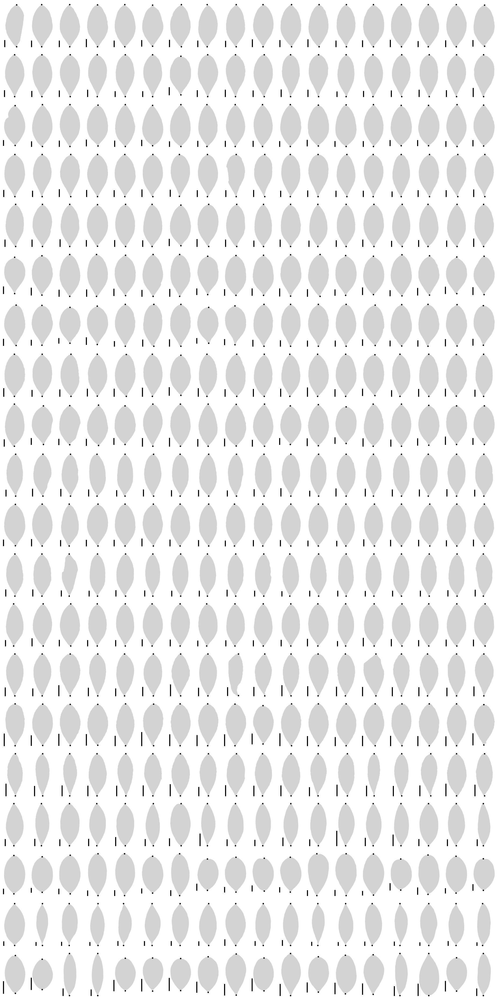

In [11]:
plt.figure(figsize=(20,40)) # set figure size

counter = 1 # set counter for subplot initially to 1

for i in range(len(type_order)): # for each coca type

    curr_type = type_order[i] # select current type

    curr_df = all_mdata[all_mdata["full_name"]==curr_type] # mask dataframe for current type
    
    indices = curr_df.sample(18, random_state=42).index # select 18 random indices
    
    curr_arr = all_cm_arr[indices,:,:] # retrieve point data for current leaves
    
    for j in range(len(curr_arr)): # for each of 18 leaves of current type, plot
    
        plt.subplot(20,18,counter)
        plt.fill(curr_arr[j,:,0], curr_arr[j,:,1], c="lightgray", lw=0.1) # outline
        plt.plot([min(curr_arr[j,:,0])-0.1,min(curr_arr[j,:,0])-0.1],[curr_arr[j,0,1], curr_arr[j,0,1]+1], c="k", lw=3) # cm scale
        plt.scatter(curr_arr[j,0,0], curr_arr[j,0,1], s=10, c="k") # base
        plt.scatter(curr_arr[j,res-1,0], curr_arr[j,res-1,1], s=10, c="k") # tip
        plt.gca().set_aspect("equal")
        plt.gca().set_axis_off()
        counter+=1

plt.tight_layout()

#plt.savefig("figure_2.png")

### Analyze leaf dimensions

Using placed pseudo-landmarks representing leaves that are rotated upwards and scaled in centimeters, the following dimensions were calculated: width, as the difference in centimeters between minimum and maximum x values in an oriented leaf; length, as the difference in centimeters between minimum and maximum y values in an oriented leaf, and area was calculated from the area of the polygon.

In [12]:
# lists to store variables
width_list = []
length_list = []
area_list = []
solidity_list = []
asymmetry_list = []

# for each leaf . . .
for lf in range(len(all_cm_arr)):
    
    # for calculating dimensions, we need non-scaled leaves in centimeters
    curr_lf = all_cm_arr[lf,:,:] # select current leaf
    
    ############################
    ### CALCULATE DIMENSIONS ###
    ############################
    
    width = np.max(curr_lf[:,0])-np.min(curr_lf[:,0]) # calculate width
    length = np.max(curr_lf[:,1])-np.min(curr_lf[:,1]) # calculate length
    area = poly_area(curr_lf[:,0],curr_lf[:,1]) # calcualte area
    
    ##########################
    ### CALCULATE SOLIDITY ###
    ##########################
    
    hull = ConvexHull(curr_lf) # calculate convex hull of current leaf
    vertices = hull.vertices # isolate vertex indices of convex hull
    convex_area = poly_area(curr_lf[vertices,0], curr_lf[vertices,1]) # calculate convex area
    solidity = area / convex_area # calculate solidity
    
    ##########################
    ### CALCULATE SYMMETRY ###
    ##########################
    
    left_side = curr_lf[:(res-1)+1,] # isolate left side of leaf
    right_side = curr_lf[(res-1):,] # isolate right side of leaf
    right_side = right_side[::-1] # reverse the right side to align indices with left

    # calculate procrustes distance between left and right side of leaf
    s1, s2, distance = procrustes(left_side, right_side) 
    
    # store data in lists
    width_list.append(width)
    length_list.append(length)
    area_list.append(area)
    solidity_list.append(solidity)
    asymmetry_list.append(distance)
    
# add data to the mdata dataframe
all_mdata["width"] = width_list
all_mdata["length"] = length_list
all_mdata["area"] = area_list
all_mdata["solidity"] = solidity_list
all_mdata["asymmetry"] = asymmetry_list
    

### Pair plots by types

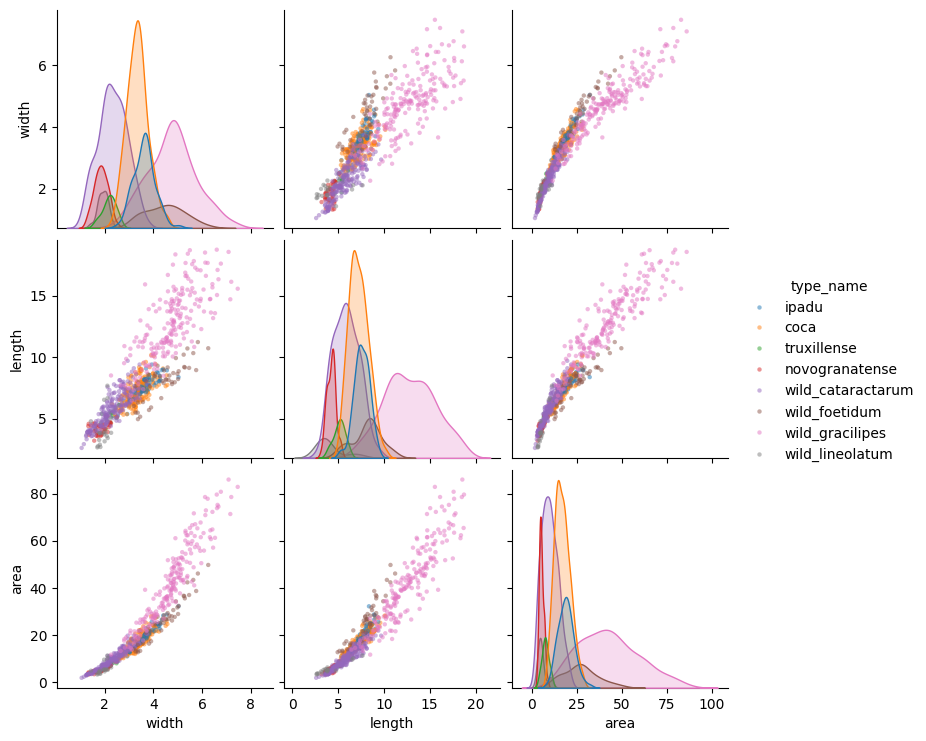

In [13]:
sns.pairplot(all_mdata,
             x_vars=["width", "length", "area"],
             y_vars=["width", "length", "area"],
             hue="type_name",
             plot_kws={"s": 10, "alpha":0.5, "lw":0}
            )


### Allometry

To analyze allometry, or changes in relative leaf dimensions with respect to size, linear models were calculated for length as a function of width using the numpy `polyfit()` and `poly1d` functions. Length was modeled as a function of width to the least to most wide leaf for each cultivated variety type and wild species and plotted on a log-scaled axis.

In [14]:
# ipadu
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="ipadu"],
                   all_mdata["length"][all_mdata["type_name"]=="ipadu"],
                  1)
ipadu_func = np.poly1d(coefs)
ipadu_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="ipadu"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="ipadu"]), 100)


# coca
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="coca"],
                   all_mdata["length"][all_mdata["type_name"]=="coca"],
                  1)
coca_func = np.poly1d(coefs)
coca_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="coca"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="coca"]), 100)

# truxillense
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="truxillense"],
                   all_mdata["length"][all_mdata["type_name"]=="truxillense"],
                  1)
truxillense_func = np.poly1d(coefs)
truxillense_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="truxillense"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="truxillense"]), 100)

# novogranatense
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="novogranatense"],
                   all_mdata["length"][all_mdata["type_name"]=="novogranatense"],
                  1)
novogranatense_func = np.poly1d(coefs)
novogranatense_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="novogranatense"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="novogranatense"]), 100)

# cataractarum
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="wild_cataractarum"],
                   all_mdata["length"][all_mdata["type_name"]=="wild_cataractarum"],
                  1)
cataractarum_func = np.poly1d(coefs)
cataractarum_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="wild_cataractarum"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="wild_cataractarum"]), 100)

# foetidum
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="wild_foetidum"],
                   all_mdata["length"][all_mdata["type_name"]=="wild_foetidum"],
                  1)
foetidum_func = np.poly1d(coefs)
foetidum_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="wild_foetidum"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="wild_foetidum"]), 100)

# gracilipes
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="wild_gracilipes"],
                   all_mdata["length"][all_mdata["type_name"]=="wild_gracilipes"],
                  1)
gracilipes_func = np.poly1d(coefs)
gracilipes_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="wild_gracilipes"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="wild_gracilipes"]), 100)

# lineolatum
coefs = np.polyfit(all_mdata["width"][all_mdata["type_name"]=="wild_lineolatum"],
                   all_mdata["length"][all_mdata["type_name"]=="wild_lineolatum"],
                  1)
lineolatum_func = np.poly1d(coefs)
lineolatum_xvals = np.linspace(np.min(all_mdata["width"][all_mdata["type_name"]=="wild_lineolatum"]),
                         np.max(all_mdata["width"][all_mdata["type_name"]=="wild_lineolatum"]), 100)

# x and y vals for one-to-one line
xvals = np.linspace(np.min(all_mdata["width"]),
                         np.max(all_mdata["width"]), 100)
yvals = xvals

Plot length vs width on a log scale and lines for each species/type

Text(0, 0.5, 'length, cm')

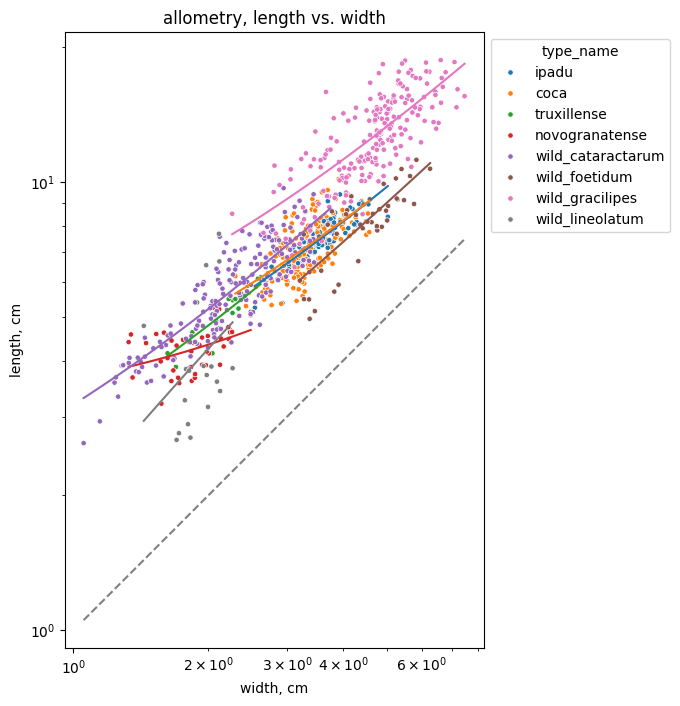

In [15]:
plt.figure(figsize=(8,8)) # set figure size

ax = sns.scatterplot(data=all_mdata, x="width", y="length", hue="type_name", linewidth=0.5, s=15) # plot

# plot allometric lines
plt.plot(ipadu_xvals, ipadu_func(ipadu_xvals))
plt.plot(coca_xvals, coca_func(coca_xvals))
plt.plot(truxillense_xvals, truxillense_func(truxillense_xvals))
plt.plot(novogranatense_xvals, novogranatense_func(novogranatense_xvals))
plt.plot(cataractarum_xvals, cataractarum_func(cataractarum_xvals))
plt.plot(foetidum_xvals, foetidum_func(foetidum_xvals))
plt.plot(gracilipes_xvals, gracilipes_func(gracilipes_xvals))
plt.plot(lineolatum_xvals, lineolatum_func(lineolatum_xvals))

# plot one-to-one line
plt.plot(xvals, yvals, c="gray", linestyle="dashed")

sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1)) # move legend outside plot
plt.xscale("log") # x axis log scale
plt.yscale("log") # y axis log scale
plt.gca().set_aspect("equal") # equal aspect ratio
plt.title("allometry, length vs. width") # title
plt.xlabel("width, cm") # x axis title
plt.ylabel("length, cm") # y axis title

#plt.savefig("figure_3a.png")

### Procrustes analysis

Perform a Procrustes analysis to translate, scale, and rotate leaf shapes

- Select number of pseudo-landmarks and dimensions
- Calculate the GPA mean leaf shape using the `gpa_mean` function
- Align all leaves to the GPA mean
- Store Procrustes super-imposed leaves in an array, `proc_arr`
- Calculate a PCA for all possible axes and their variance (the number of leaves)
- Calculate a PCA for just the axes needed for reconstruction of eigenleaves for morphospace (probably 2)

Procrustean alignment was carried out for all leaves together. To superimpose contours by minimizing the overall distance between pseudo-landmark values through the functions of translation, scaling, rotation, and reflection, a generalized Procrustes analysis (GPA) is used ([Gower, 1975](https://link.springer.com/article/10.1007/BF02291478)). A function was defined to calculate a GPA mean. To calculate the GPA mean, an arbitrary leaf is first chosen and all other leaves are aligned to it using Procrustean superimposition. A mean from the aligned shapes is calculated, which is used as the reference shape for alignment in the next iteration. The algorithm stops when the Procrustes distance between means calculated between two successive iterations falls below an arbitrarily low value. All leaves are then aligned to the final GPA mean shape. The Procrustean superimposition was visualized for all leaves by plotting each leaf with high transparency together with overall GPA mean and for each cultivated type and each wild species with respect to group means.

In [16]:
landmark_num = (res*2)-1 # select number of landmarks
dim_num = 2 # select number of coordinate value dimensions

##########################
### CALCULATE GPA MEAN ###
##########################

mean_shape = gpa_mean(all_cm_arr, landmark_num, dim_num)

################################
### ALIGN LEAVES TO GPA MEAN ###
################################

# array to store Procrustes aligned shapes
proc_arr = np.zeros(np.shape(all_cm_arr)) 

for i in range(len(all_cm_arr)):
    s1, s2, distance = procrustes(mean_shape, all_cm_arr[i,:,:]) # calculate procrustes adjusted shape to ref for current leaf
    proc_arr[i] = s2 # store procrustes adjusted shape to array
    

Visualize all leaves plotted against the mean Procrustes leaf

Text(0.5, 1.0, 'overall mean leaf')

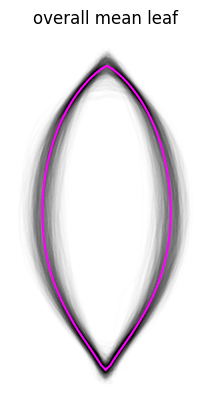

In [17]:
for i in range(len(proc_arr)):
    plt.plot(proc_arr[i,:,0], proc_arr[i,:,1], c="k", alpha=0.006)

plt.plot(np.mean(proc_arr, axis=0)[:,0], np.mean(proc_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("overall mean leaf")

#plt.savefig("figure_3b.png")

Text(0.5, 1.0, 'foetidum')

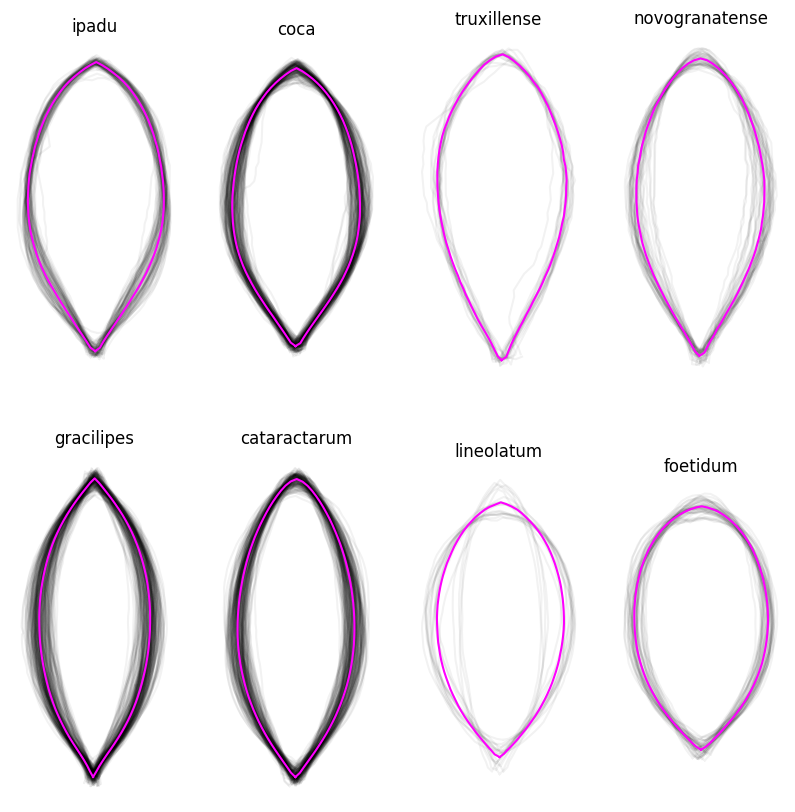

In [18]:
# create arrays for each type
ipadu_arr = proc_arr[all_mdata[all_mdata["type_name"]=="ipadu"].index.values,:,:]

coca_arr = proc_arr[all_mdata[all_mdata["type_name"]=="coca"].index.values,:,:]
truxillense_arr = proc_arr[all_mdata[all_mdata["type_name"]=="truxillense"].index.values,:,:]
novogranatense_arr = proc_arr[all_mdata[all_mdata["type_name"]=="novogranatense"].index.values,:,:]
cataractarum_arr = proc_arr[all_mdata[all_mdata["type_name"]=="wild_cataractarum"].index.values,:,:]
foetidum_arr = proc_arr[all_mdata[all_mdata["type_name"]=="wild_foetidum"].index.values,:,:]
gracilipes_arr = proc_arr[all_mdata[all_mdata["type_name"]=="wild_gracilipes"].index.values,:,:]
lineolatum_arr = proc_arr[all_mdata[all_mdata["type_name"]=="wild_lineolatum"].index.values,:,:]


lf_alpha = 0.05
plt.figure(figsize=(10,10))

plt.subplot(2,4,1)
for i in range(len(ipadu_arr)):
    plt.plot(ipadu_arr[i,:,0], ipadu_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(ipadu_arr, axis=0)[:,0], np.mean(ipadu_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("ipadu")

plt.subplot(2,4,2)
for i in range(len(coca_arr)):
    plt.plot(coca_arr[i,:,0], coca_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(coca_arr, axis=0)[:,0], np.mean(coca_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("coca")

plt.subplot(2,4,3)
for i in range(len(truxillense_arr)):
    plt.plot(truxillense_arr[i,:,0], truxillense_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(truxillense_arr, axis=0)[:,0], np.mean(truxillense_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("truxillense")

plt.subplot(2,4,4)
for i in range(len(novogranatense_arr)):
    plt.plot(novogranatense_arr[i,:,0], novogranatense_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(novogranatense_arr, axis=0)[:,0], np.mean(novogranatense_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("novogranatense")

plt.subplot(2,4,5)
for i in range(len(gracilipes_arr)):
    plt.plot(gracilipes_arr[i,:,0], gracilipes_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(gracilipes_arr, axis=0)[:,0], np.mean(gracilipes_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("gracilipes")

plt.subplot(2,4,6)
for i in range(len(cataractarum_arr)):
    plt.plot(cataractarum_arr[i,:,0], cataractarum_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(cataractarum_arr, axis=0)[:,0], np.mean(cataractarum_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("cataractarum")

plt.subplot(2,4,7)
for i in range(len(lineolatum_arr)):
    plt.plot(lineolatum_arr[i,:,0], lineolatum_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(lineolatum_arr, axis=0)[:,0], np.mean(lineolatum_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("lineolatum")

plt.subplot(2,4,8)
for i in range(len(foetidum_arr)):
    plt.plot(foetidum_arr[i,:,0], foetidum_arr[i,:,1], c="k", alpha=lf_alpha)
plt.plot(np.mean(foetidum_arr, axis=0)[:,0], np.mean(foetidum_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("foetidum")

#plt.savefig("figure_3c.png")

### Principal Component Analysis and Morphospace

Visualize a morphospace and classify leaves by the factor of genotype

- Plot a morphospace using the inverse transform of the PCA
- Perform a Linear Discriminant Analysis
- Visualize LDA results as a confusion matrix
- Plot out LDA scores

A morphospace was created and visualized using principal component analysis (PCA) and the inverse PCA transform. To determine the variance associated with each principal component (PC), PCA was first performed with the maximum number of PCs, which in this case is twice the pseudo-landmark number (the number of coordinate values). PCA was fitted again using only 2 PCs for simplicity of morphospace visualization. Along regular intervals of PC1 and PC2 the inverse transform was used to visualize representative leaves, or so-called `eigenleaves`. Data was projected back onto the calcualted PCA and morphospace. A linear discriminant analysis (LDA) model was fitted modeling 198 coordinate values as a function of leaf class. Confusion matrices and LDA scores were calculated by projecting samples back onto the fitted model.

In [19]:
#################################################
### FIRST, CALCULATE PERCENT VARIANCE ALL PCs ###
#################################################

######
PC_NUMBER = 198 # PC number = not number of leaves, but features
#######

# use the reshape function to flatten to 2D
flat_arr = proc_arr.reshape(np.shape(proc_arr)[0], 
                                 np.shape(proc_arr)[1]*np.shape(proc_arr)[2]) 

pca_all = PCA(n_components=PC_NUMBER) 
PCs_all = pca_all.fit_transform(flat_arr) # fit a PCA for all data

# print out explained variance for each PC
print("PC: " + "var, " + "overall ") 
for i in range(len(pca_all.explained_variance_ratio_)):
    print("PC" + str(i+1) + ": " + str(round(pca_all.explained_variance_ratio_[i]*100,1)) + 
          "%, " + str(round(pca_all.explained_variance_ratio_.cumsum()[i]*100,1)) + "%"  )


PC: var, overall 
PC1: 77.9%, 77.9%
PC2: 9.7%, 87.6%
PC3: 4.4%, 91.9%
PC4: 2.4%, 94.4%
PC5: 1.5%, 95.8%
PC6: 0.9%, 96.7%
PC7: 0.6%, 97.3%
PC8: 0.5%, 97.8%
PC9: 0.3%, 98.2%
PC10: 0.3%, 98.4%
PC11: 0.2%, 98.7%
PC12: 0.2%, 98.8%
PC13: 0.1%, 99.0%
PC14: 0.1%, 99.1%
PC15: 0.1%, 99.2%
PC16: 0.1%, 99.2%
PC17: 0.1%, 99.3%
PC18: 0.1%, 99.4%
PC19: 0.1%, 99.4%
PC20: 0.0%, 99.5%
PC21: 0.0%, 99.5%
PC22: 0.0%, 99.5%
PC23: 0.0%, 99.6%
PC24: 0.0%, 99.6%
PC25: 0.0%, 99.6%
PC26: 0.0%, 99.6%
PC27: 0.0%, 99.6%
PC28: 0.0%, 99.7%
PC29: 0.0%, 99.7%
PC30: 0.0%, 99.7%
PC31: 0.0%, 99.7%
PC32: 0.0%, 99.7%
PC33: 0.0%, 99.7%
PC34: 0.0%, 99.7%
PC35: 0.0%, 99.7%
PC36: 0.0%, 99.7%
PC37: 0.0%, 99.8%
PC38: 0.0%, 99.8%
PC39: 0.0%, 99.8%
PC40: 0.0%, 99.8%
PC41: 0.0%, 99.8%
PC42: 0.0%, 99.8%
PC43: 0.0%, 99.8%
PC44: 0.0%, 99.8%
PC45: 0.0%, 99.8%
PC46: 0.0%, 99.8%
PC47: 0.0%, 99.8%
PC48: 0.0%, 99.8%
PC49: 0.0%, 99.8%
PC50: 0.0%, 99.8%
PC51: 0.0%, 99.8%
PC52: 0.0%, 99.8%
PC53: 0.0%, 99.8%
PC54: 0.0%, 99.9%
PC55: 0.0%, 99.9%


In [20]:
#################################################
### NEXT, CALCULATE THE DESIRED NUMBER OF PCs ###
#################################################

######
PC_NUMBER = 2 # keep to 2 for now for reconstruction
#######

pca = PCA(n_components=PC_NUMBER) 
PCs = pca.fit_transform(flat_arr) # fit a PCA for only desired PCs

# print out explained variance for each PC
print("PC: " + "var, " + "overall ") 
for i in range(len(pca.explained_variance_ratio_)):
    print("PC" + str(i+1) + ": " + str(round(pca.explained_variance_ratio_[i]*100,1)) + 
          "%, " + str(round(pca.explained_variance_ratio_.cumsum()[i]*100,1)) + "%"  )
    
# add PCs to dataframe for plotting
all_mdata["PC1"] = PCs[:,0]
all_mdata["PC2"] = PCs[:,1]
    

PC: var, overall 
PC1: 77.9%, 77.9%
PC2: 9.7%, 87.6%


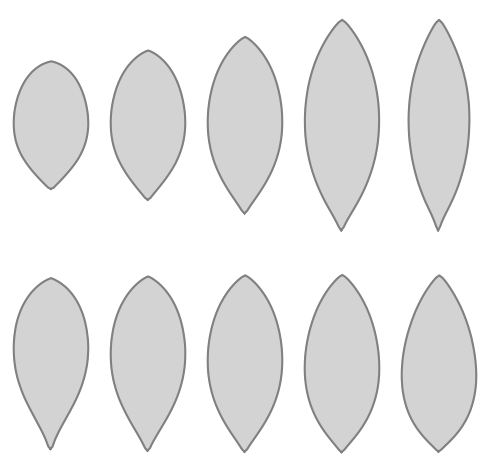

In [21]:
###################################################
### CREATE EIGEN REPRESENTATIONS OF FIRST 2 PCs ###
###################################################

# calculate standard deviations for each PC
PC1_std = all_mdata["PC1"].std()
PC2_std = all_mdata["PC2"].std()

# create list of lists of PC values to reconstruct
PC_vals = [[-2*PC1_std,0],
           [-1*PC1_std,0],
           [0*PC1_std,0],
           [1*PC1_std,0],
           [2*PC1_std,0],
           [0,-2*PC2_std],
           [0,-1*PC2_std],
           [0,0*PC2_std],
           [0,1*PC2_std],
           [0,2*PC2_std],
]

plt.figure(figsize=(5,5))

counter = 1

for i in range(len(PC_vals)):
    
    # create inverse leaf
    inv_leaf = pca.inverse_transform(np.array(PC_vals[i]))
    inv_x = inv_leaf[0::2] # select just inverse x vals
    inv_y = inv_leaf[1::2] # select just inverse y vals
    
    # plot inverse leaf
    plt.subplot(2,5,counter)
    plt.fill(inv_x, inv_y, c="lightgray")
    plt.plot(inv_x, inv_y, c="gray")
    plt.gca().set_aspect("equal")
    plt.axis("off")
    
    counter += 1

plt.tight_layout()

Text(0.5, 1.0, 'Procrustean morphospace')

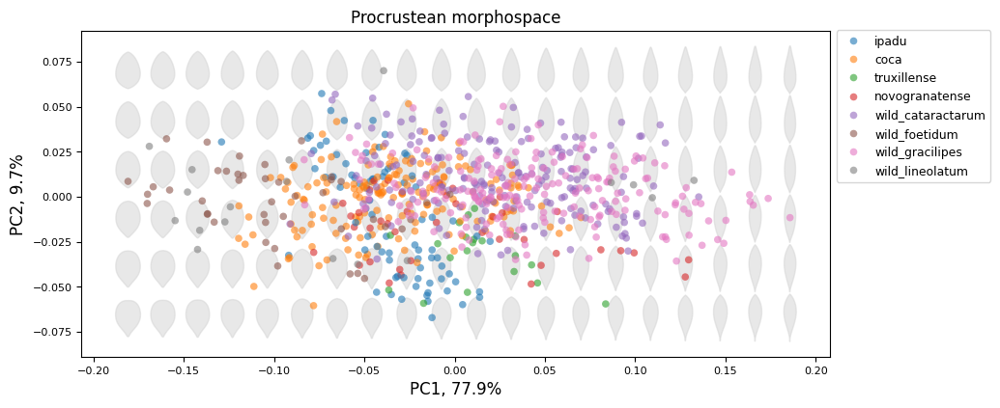

In [22]:
##########################
### CREATE MORPHOSPACE ###
##########################

# set plot parameters

plot_length= 10 # plot length in inches
plot_width= 10 # plot length in inches
numPC1 = 20 # set number of PC1 intervals
numPC2 = 6 # set number of PC2 intervals
hue = "type_name" # select the factor to color by
s = 0.08 # set the scale of the eigenleaves
lf_col = "lightgray" # color of inverse eigenleaf
lf_alpha = 0.5 # alpha of inverse eigenleaf
pt_size = 30 # size of data points
pt_linewidth = 0 # lw of data points, set to 0 for no edges
pt_alpha = 0.6 # alpha of the data points
ax_label_fs = 12 # font size of the x and y axis titles
ax_tick_fs = 8 # font size of the axis ticks
face_col = "white" # color of the plot background
grid_alpha = 0.5 # set the alpha of the grid
title = "Procrustean morphospace" # set title

plt.figure(figsize=(plot_length, plot_width))

PC1_vals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]), numPC1 ) # create PC intervals
PC2_vals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), numPC2 )

for i in PC1_vals: # for each PC1 interval
    for j in PC2_vals: # for each PC2 interval
        
        pc1_val = i # select the current PC1 val
        pc2_val = j # select the current PC2 val

        # calculate the inverse eigenleaf
        inv_leaf = pca.inverse_transform(np.array([pc1_val,pc2_val]))
        inv_x = inv_leaf[0::2] # select just inverse x vals
        inv_y = inv_leaf[1::2] # select just inverse y vals
        
        # plot the inverse eigenleaf
        plt.fill(inv_x*s+pc1_val, inv_y*s+pc2_val, c=lf_col, alpha=lf_alpha)
   
# plot the data on top of the morphospace
sns.scatterplot(data=all_mdata, x="PC1", y="PC2", hue=hue, s=pt_size, linewidth=pt_linewidth, alpha=pt_alpha)

plt.legend(bbox_to_anchor=(1.00, 1.02), prop={'size': 8.9})
xlab = "PC1, " + str(round(pca.explained_variance_ratio_[0]*100,1)) + "%"
ylab = "PC2, " + str(round(pca.explained_variance_ratio_[1]*100,1)) + "%"
plt.xlabel(xlab, fontsize=ax_label_fs)
plt.ylabel(ylab, fontsize=ax_label_fs)
plt.xticks(fontsize=ax_tick_fs)
plt.yticks(fontsize=ax_tick_fs)
plt.gca().set_aspect("equal")
plt.gca().set_facecolor(face_col)
plt.gca().set_axisbelow(True)
plt.title(title)

#plt.savefig("figure_3d.png")

________________
# PREDICTION:
# CULTIGENS AND WILD SPECIES
________________

In [33]:
# Initialize this dictionary ONCE at the start of your notebook session
# This will store all comparison results for plotting later
results_storage = {}

# --- RUN THIS BLOCK FOR 'full_name' ---
TARGET_COLUMN = 'full_name'
# Initialize target_column entry in results_storage if it doesn't exist
if TARGET_COLUMN not in results_storage:
    results_storage[TARGET_COLUMN] = {
        'class_counts': {},
        'model_metrics': {} # This will store precision/recall for each model
    }

## Unbalanced LDA

--- Running Unbalanced LDA for TARGET_COLUMN: full_name ---

--- Performing LDA with 5-Fold Stratified Cross-Validation on 'full_name' ---

Fold 1/5

Fold 2/5

Fold 3/5

Fold 4/5

Fold 5/5


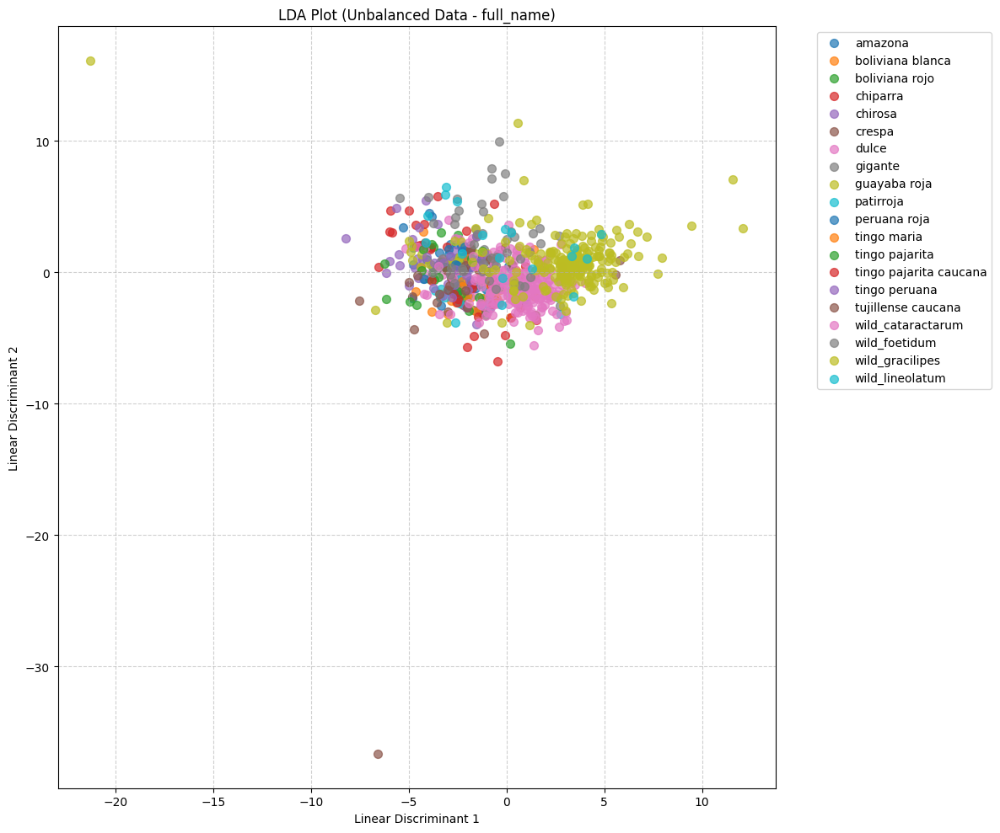


--- Overall Accuracy (Unbalanced Data - full_name): 0.5332 ---

--- Classification Report (Unbalanced Data - full_name) ---
                        precision    recall  f1-score   support

               amazona       0.36      0.21      0.27        19
      boliviana blanca       0.19      0.35      0.25        20
        boliviana rojo       0.04      0.05      0.04        20
              chiparra       0.28      0.40      0.33        20
               chirosa       0.31      0.25      0.28        20
                crespa       0.33      0.15      0.21        20
                 dulce       0.26      0.30      0.28        20
               gigante       0.31      0.25      0.28        20
          guayaba roja       0.06      0.05      0.06        20
             patirroja       0.26      0.25      0.26        20
          peruana roja       0.21      0.35      0.26        20
           tingo maria       0.37      0.35      0.36        20
        tingo pajarita       0.17      0.1

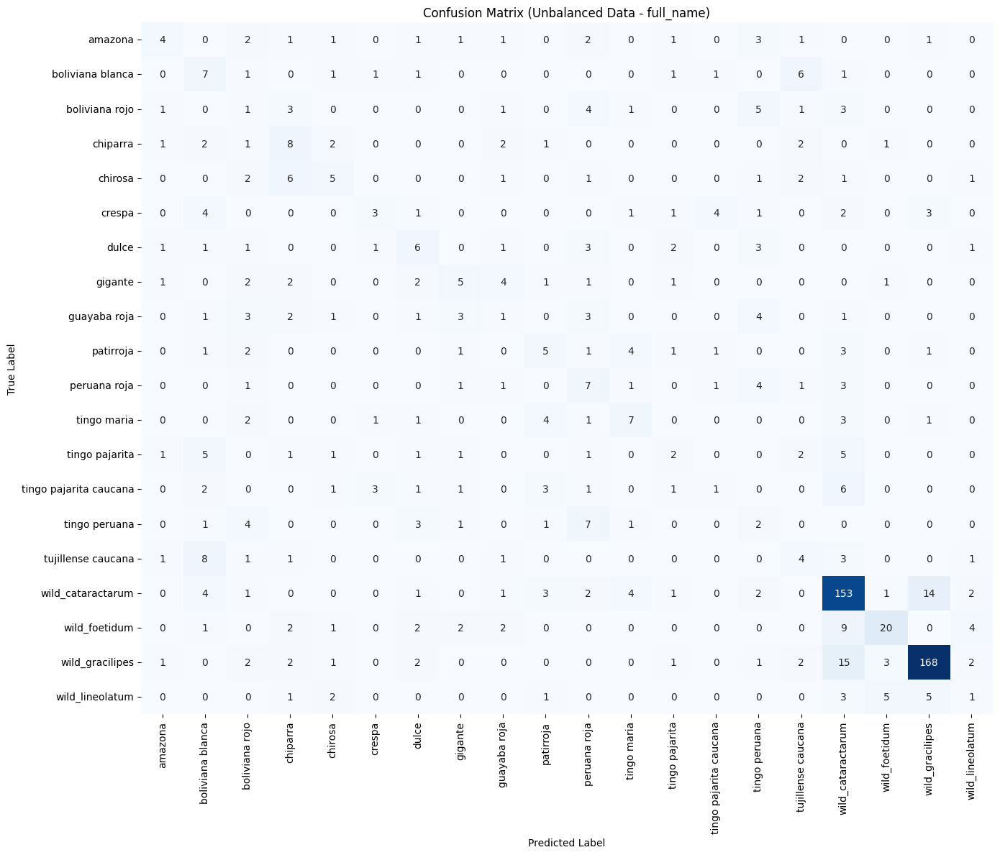

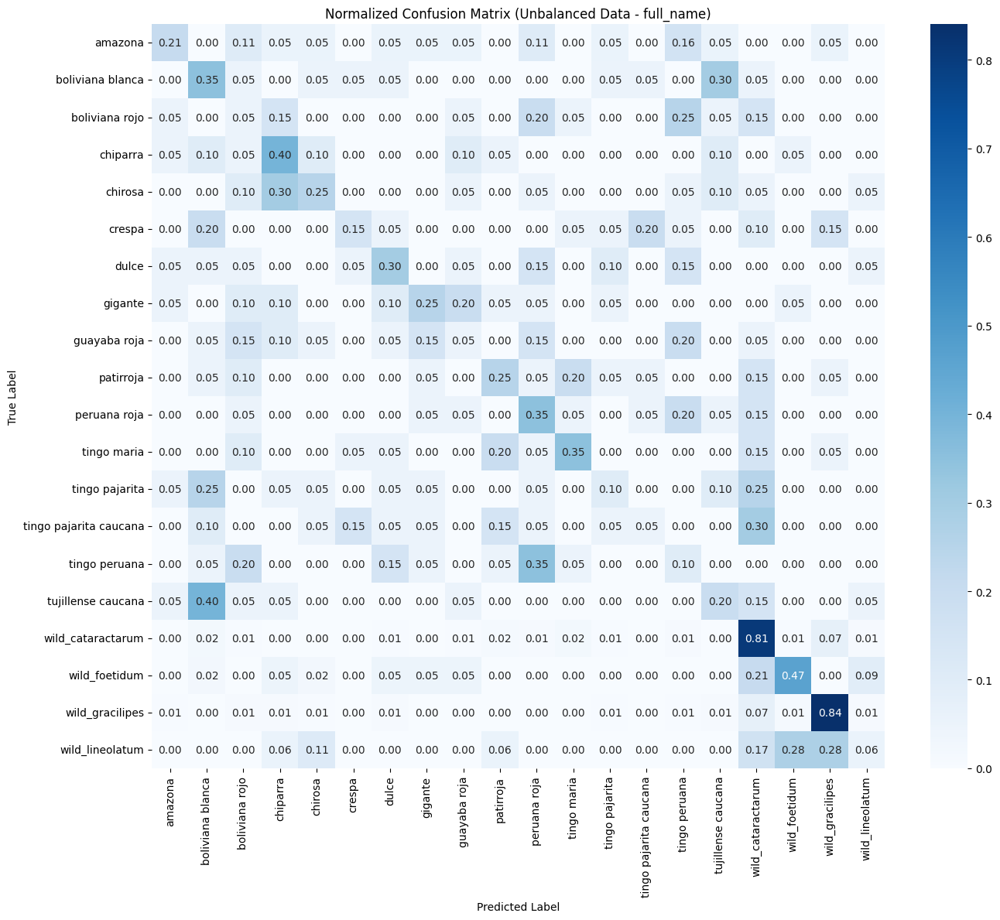

In [34]:
import numpy as np
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# --- ASSUMPTION: Data (proc_arr, all_mdata, pca) is already loaded/defined. ---
# --- ASSUMPTION: TARGET_COLUMN is set (e.g., TARGET_COLUMN = 'full_name') ---
# --- ASSUMPTION: results_storage dictionary is initialized (see instructions above) ---

print(f"--- Running Unbalanced LDA for TARGET_COLUMN: {TARGET_COLUMN} ---")

# 1. Prepare Data for LDA
# Flatten the 3D proc_arr to a 2D array (samples, features)
X = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])

# Get the target variable (labels) using the specified TARGET_COLUMN
y = all_mdata[TARGET_COLUMN]

# --- Store class counts for the current TARGET_COLUMN (only needs to be done once per TARGET_COLUMN) ---
if not results_storage[TARGET_COLUMN]['class_counts']: # Only populate if empty
    results_storage[TARGET_COLUMN]['class_counts'] = y.value_counts().sort_index().to_dict()


# --- Check for minimum samples per class for StratifiedKFold ---
min_samples_in_any_class = y.value_counts().min()
n_splits = 5 # Default, a good starting point

if min_samples_in_any_class < n_splits:
    print(f"Warning: Smallest class has {min_samples_in_any_class} samples for '{TARGET_COLUMN}', which is less than n_splits={n_splits}.")
    print("Consider adjusting n_splits or excluding very small classes if errors occur.")
    # StratifiedKFold will raise an error if a class has fewer than n_splits samples.
    # For now, we'll proceed assuming this is handled or `n_splits` is adjusted if truly necessary.

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Store results for aggregation
all_y_true = []
all_y_pred = []
all_lda_scores = []
all_y_labels_for_plot = [] # Use a different name to avoid confusion with overall y

print(f"\n--- Performing LDA with {n_splits}-Fold Stratified Cross-Validation on '{TARGET_COLUMN}' ---")

# Iterate through folds
for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"\nFold {fold_idx + 1}/{n_splits}")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Initialize and fit LDA model
    # The number of components for LDA is at most n_classes - 1.
    # Let's set it to the minimum of n_classes - 1 or the number of features.
    n_components_lda = min(len(y.unique()) - 1, X.shape[1])
    lda = LinearDiscriminantAnalysis(n_components=n_components_lda)

    # Fit LDA on training data and transform both train and test data
    X_train_lda = lda.fit_transform(X_train, y_train)
    X_test_lda = lda.transform(X_test)

    # Make predictions on the test set
    y_pred = lda.predict(X_test)

    # Store true and predicted labels for overall confusion matrix
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    # Store LDA scores and corresponding true labels for plotting
    all_lda_scores.append(X_test_lda)
    all_y_labels_for_plot.extend(y_test)

# Concatenate all LDA scores for plotting
all_lda_scores = np.vstack(all_lda_scores)
all_y_labels_for_plot = np.array(all_y_labels_for_plot)


# 2. Visualize LDA Plot with LDA Scores

# Get unique class names in sorted order for consistent plotting
class_names = sorted(y.unique())
# num_classes = len(class_names) # Already defined when checking n_components_lda, if needed

# Plotting LDA scores (first two components if available)
plt.figure(figsize=(12, 10))
if all_lda_scores.shape[1] >= 2:
    for i, class_name in enumerate(class_names):
        # Filter data for the current class
        class_data = all_lda_scores[all_y_labels_for_plot == class_name]
        plt.scatter(class_data[:, 0], class_data[:, 1], label=class_name, alpha=0.7, s=50)
    plt.xlabel('Linear Discriminant 1')
    plt.ylabel('Linear Discriminant 2')
    plt.title(f'LDA Plot (Unbalanced Data - {TARGET_COLUMN})')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
elif all_lda_scores.shape[1] == 1:
    # If only one component, plot as a 1D scatter or histogram
    plt.figure(figsize=(10, 6))
    for i, class_name in enumerate(class_names):
        class_data = all_lda_scores[all_y_labels_for_plot == class_name]
        plt.scatter(class_data[:, 0], np.zeros_like(class_data[:, 0]), label=class_name, alpha=0.7, s=50, jitter=0.1)
    plt.xlabel('Linear Discriminant 1')
    plt.title(f'LDA Plot (Unbalanced Data - {TARGET_COLUMN}) - 1D Projection')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print(f"LDA resulted in less than 1 discriminant component for '{TARGET_COLUMN}'. Cannot plot LDA scores.")


# 3. Calculate and Visualize Confusion Matrix & Store Results

# Convert lists to numpy arrays for sklearn metrics
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)

# Overall Accuracy
overall_accuracy = accuracy_score(all_y_true, all_y_pred)
print(f"\n--- Overall Accuracy (Unbalanced Data - {TARGET_COLUMN}): {overall_accuracy:.4f} ---")

# Classification Report (provides precision, recall, f1-score per class)
print(f"\n--- Classification Report (Unbalanced Data - {TARGET_COLUMN}) ---")
report_dict = classification_report(all_y_true, all_y_pred, target_names=class_names, output_dict=True, zero_division=0)
print(classification_report(all_y_true, all_y_pred, target_names=class_names, zero_division=0))

# --- STORE PER-CLASS PRECISION AND RECALL ---
model_name = 'unbalanced_lda'
results_storage[TARGET_COLUMN]['model_metrics'][model_name] = {
    'precision': {cls: report_dict[cls]['precision'] for cls in class_names},
    'recall': {cls: report_dict[cls]['recall'] for cls in class_names}
}
print(f"--- Stored metrics for '{model_name}' for '{TARGET_COLUMN}'. ---")

# Confusion Matrix
cm = confusion_matrix(all_y_true, all_y_pred, labels=class_names) # Use labels for consistent order

plt.figure(figsize=(14, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (Unbalanced Data - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Optional: Normalized Confusion Matrix (to see proportions)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # Normalize by true class
cm_normalized[np.isnan(cm_normalized)] = 0 # Handle potential NaN for classes with no true samples

plt.figure(figsize=(14, 12))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (Unbalanced Data - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## Data augmentation LDA

--- Running Augmented LDA for TARGET_COLUMN: full_name ---
Shape of X_original: (769, 198)
Number of components in your fitted PCA object (`pca_full`): 198
Shape of X_pca_original_full (after pca_full.transform): (769, 198)

--- Starting Data Augmentation ---
Augmenting class 'wild_cataractarum': generating 11 new samples.
Augmenting class 'wild_foetidum': generating 157 new samples.
Augmenting class 'tujillense caucana': generating 180 new samples.
Augmenting class 'tingo peruana': generating 180 new samples.
Augmenting class 'tingo pajarita caucana': generating 180 new samples.
Augmenting class 'tingo maria': generating 180 new samples.
Augmenting class 'tingo pajarita': generating 180 new samples.
Augmenting class 'boliviana blanca': generating 180 new samples.
Augmenting class 'peruana roja': generating 180 new samples.
Augmenting class 'guayaba roja': generating 180 new samples.
Augmenting class 'gigante': generating 180 new samples.
Augmenting class 'dulce': generating 180 new sa

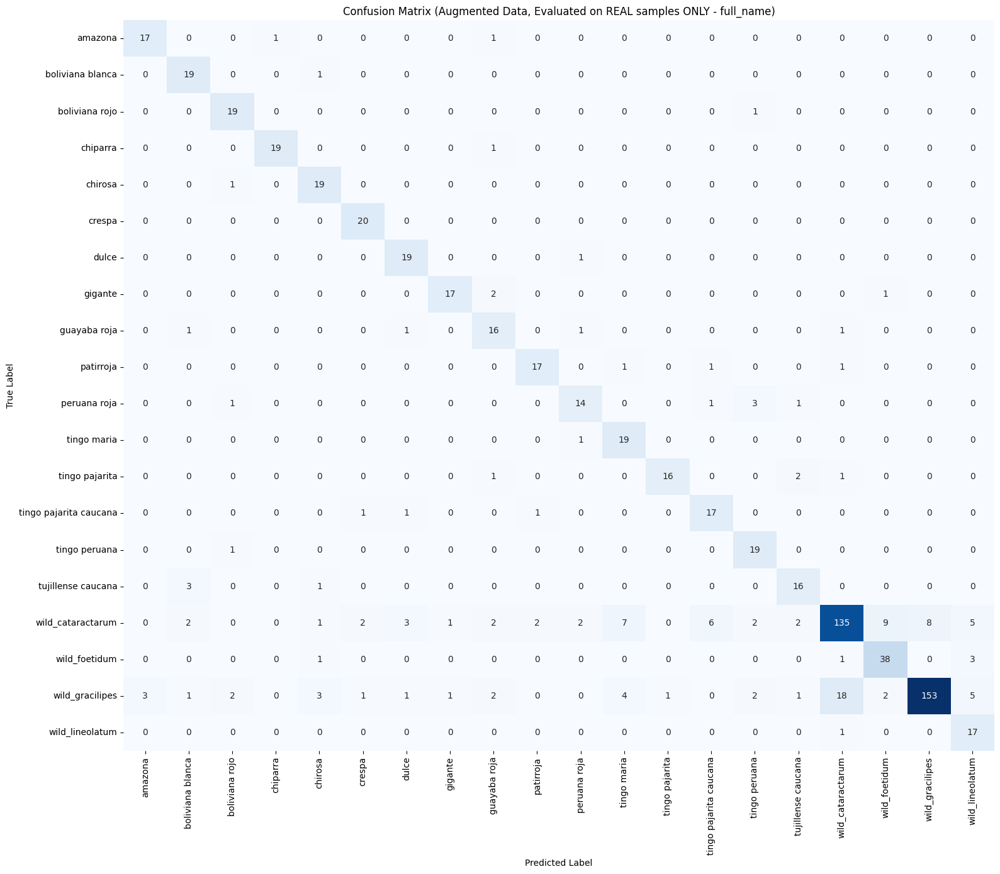

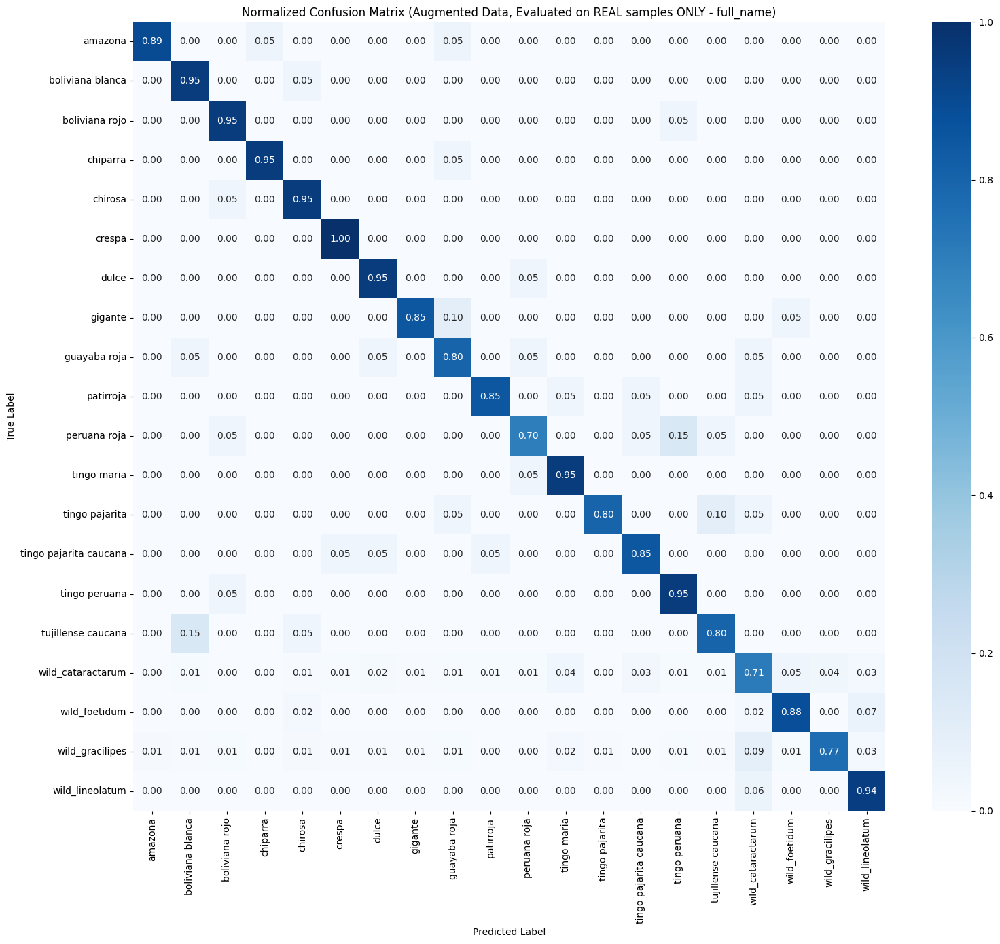

In [35]:
import numpy as np
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# --- ASSUMPTION: Data (proc_arr, all_mdata) is already loaded/defined. ---
# --- ASSUMPTION: TARGET_COLUMN is set (e.g., TARGET_COLUMN = 'full_name') ---
# --- ASSUMPTION: results_storage dictionary is initialized (from a previous cell) ---

print(f"--- Running Augmented LDA for TARGET_COLUMN: {TARGET_COLUMN} ---")

# --- PCA setup and Data Augmentation (SMOTE-like in FULL PCA space) ---
# X_original is the flattened proc_arr
X_original = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])
y_original = all_mdata[TARGET_COLUMN] # Use the specified TARGET_COLUMN

# Fit PCA on the full features
# n_components=None means keep all components up to min(n_samples, n_features) - 1
pca_full = PCA(n_components=None, random_state=42)
pca_full.fit(X_original)

# Now, transform X_original to get scores for ALL components
X_pca_original_full = pca_full.transform(X_original)

print(f"Shape of X_original: {X_original.shape}")
print(f"Number of components in your fitted PCA object (`pca_full`): {pca_full.n_components_}")
print(f"Shape of X_pca_original_full (after pca_full.transform): {X_pca_original_full.shape}")

print("\n--- Starting Data Augmentation ---")

# Calculate value counts to determine target size and identify minority classes
class_counts = y_original.value_counts()
max_samples = class_counts.max() # Target size for all classes

# Initialize lists to store augmented data AND a flag for real/synthetic
augmented_X_pca = X_pca_original_full.tolist()
augmented_y = y_original.tolist()
is_real_flag = [True] * len(y_original) # All original samples are real

# Iterate through each class to perform augmentation
for class_name, count in class_counts.items():
    if count < max_samples:
        samples_to_generate = max_samples - count
        print(f"Augmenting class '{class_name}': generating {samples_to_generate} new samples.")

        class_indices = y_original[y_original == class_name].index
        class_pca_samples = X_pca_original_full[class_indices]

        n_neighbors_for_class = min(len(class_pca_samples) - 1, 6) # Ensure at least 1 neighbor available
        if n_neighbors_for_class < 1: # Needs at least 1 for NearestNeighbors, 2 for interpolation
            print(f"Warning: Class '{class_name}' has too few samples ({len(class_pca_samples)}) for meaningful augmentation. Skipping.")
            continue
        
        # Ensure n_neighbors is at least 1 for NearestNeighbors, but needs 2 for alpha * (neighbor - sample)
        # If n_neighbors_for_class is 1, it means we can only pick the sample itself as a neighbor.
        # So, if only 1 sample, we can't interpolate.
        if len(class_pca_samples) < 2:
             print(f"Warning: Class '{class_name}' has less than 2 samples. Cannot perform SMOTE-like augmentation for interpolation. Skipping.")
             continue

        nn = NearestNeighbors(n_neighbors=n_neighbors_for_class).fit(class_pca_samples)
        distances, indices = nn.kneighbors(class_pca_samples)

        generated_count = 0
        while generated_count < samples_to_generate:
            idx_in_class = np.random.randint(0, len(class_pca_samples))
            sample = class_pca_samples[idx_in_class]

            # Select a random neighbor, ensuring it's not the sample itself (hence neighbor_idx_in_nn_output starts from 1)
            # Make sure there is at least one actual neighbor (indices[idx_in_class] has more than 1 element)
            if len(indices[idx_in_class]) < 2:
                # This should ideally not happen if n_neighbors_for_class was set > 1 and len(class_pca_samples) > 1
                continue

            neighbor_idx_in_nn_output = np.random.randint(1, len(indices[idx_in_class]))
            neighbor_original_idx_in_class_pca = indices[idx_in_class][neighbor_idx_in_nn_output]
            neighbor = class_pca_samples[neighbor_original_idx_in_class_pca]

            alpha = np.random.rand()
            synthetic_pca_sample = sample + alpha * (neighbor - sample)

            augmented_X_pca.append(synthetic_pca_sample)
            augmented_y.append(class_name)
            is_real_flag.append(False) # Mark as synthetic
            generated_count += 1

print("--- Data Augmentation Complete ---")

# Convert augmented data lists to numpy arrays
X_pca_augmented_full = np.array(augmented_X_pca)
y_augmented = np.array(augmented_y)
is_real_flag = np.array(is_real_flag) # Convert flag to numpy array

# Inverse transform the augmented PCA data back to original feature space (198 features)
X_augmented = pca_full.inverse_transform(X_pca_augmented_full)

# Verify shapes
print(f"\nOriginal data shape (X_original): {X_original.shape}")
print(f"Augmented data shape (X_augmented): {X_augmented.shape}")
print(f"Augmented real/synthetic flag shape: {is_real_flag.shape}")
print(f"Original label counts for {TARGET_COLUMN}:\n{y_original.value_counts()}")
print(f"Augmented label counts for {TARGET_COLUMN}:\n{pd.Series(y_augmented).value_counts()}")


# --- Re-run LDA with Stratified K-Fold on Augmented Data, Evaluate on REAL samples ---

n_splits_cv = 5 # Use a distinct variable name to avoid confusion with the previous block's n_splits
skf_augmented = StratifiedKFold(n_splits=n_splits_cv, shuffle=True, random_state=42)

# Store results for aggregation (ONLY for real samples)
all_y_true_real = []
all_y_pred_real = []

print(f"\n--- Performing LDA with {n_splits_cv}-Fold Stratified Cross-Validation on AUGMENTED '{TARGET_COLUMN}' data (Evaluating on REAL samples) ---")


# Iterate through folds on augmented data
for fold_idx, (train_index, test_index) in enumerate(skf_augmented.split(X_augmented, y_augmented)):
    print(f"\nFold {fold_idx + 1}/{n_splits_cv} (Augmented Data Split)")

    # TRAIN on the full (real + synthetic) training fold
    X_train_aug, X_test_aug = X_augmented[train_index], X_augmented[test_index]
    y_train_aug, y_test_aug = y_augmented[train_index], y_augmented[test_index]
    is_real_test_fold = is_real_flag[test_index] # Get real/synthetic flags for current test fold

    n_components_lda = min(len(np.unique(y_augmented)) - 1, X_augmented.shape[1])
    lda_aug = LinearDiscriminantAnalysis(n_components=n_components_lda)

    lda_aug.fit(X_train_aug, y_train_aug) # Fit on augmented training data
    y_pred_on_test_fold = lda_aug.predict(X_test_aug) # Predict on augmented test data

    # Filter to get ONLY real samples from the test fold
    y_test_real_samples = y_test_aug[is_real_test_fold]
    y_pred_real_samples = y_pred_on_test_fold[is_real_test_fold]

    # Store true and predicted labels for overall confusion matrix (only real samples)
    all_y_true_real.extend(y_test_real_samples)
    all_y_pred_real.extend(y_pred_real_samples)

# Convert lists to numpy arrays for sklearn metrics
all_y_true_real = np.array(all_y_true_real)
all_y_pred_real = np.array(all_y_pred_real)

# Get unique class names from the ORIGINAL data for consistent plotting/reporting
class_names_original = sorted(y_original.unique())

# --- Calculate and Visualize Confusion Matrix (Evaluation on REAL samples ONLY) & Store Results ---

overall_accuracy_real = accuracy_score(all_y_true_real, all_y_pred_real)
print(f"\n--- Overall Accuracy (Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy_real:.4f} ---")

print(f"\n--- Classification Report (Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
report_dict = classification_report(all_y_true_real, all_y_pred_real, target_names=class_names_original, output_dict=True, zero_division=0)
print(classification_report(all_y_true_real, all_y_pred_real, target_names=class_names_original, zero_division=0))

# --- STORE PER-CLASS PRECISION AND RECALL ---
model_name = 'augmented_lda'
results_storage[TARGET_COLUMN]['model_metrics'][model_name] = {
    'precision': {cls: report_dict[cls]['precision'] for cls in class_names_original},
    'recall': {cls: report_dict[cls]['recall'] for cls in class_names_original}
}
print(f"--- Stored metrics for '{model_name}' for '{TARGET_COLUMN}'. ---")

cm_real = confusion_matrix(all_y_true_real, all_y_pred_real, labels=class_names_original)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names_original, yticklabels=class_names_original)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real = cm_real.astype('float') / cm_real.sum(axis=1)[:, np.newaxis]
cm_normalized_real[np.isnan(cm_normalized_real)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names_original, yticklabels=class_names_original)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- You would not typically plot LDA scores for real-only test data, as the axes
# are learned from the full augmented data. The focus here is on the metrics.

## Image and ECT generation with data augmentation

--- Starting Unified Augmented Data Generation for TARGET_COLUMN: 'full_name' ---
Original data shape (flattened Procrustes): (769, 198)
Number of original samples: 769
Number of classes: 20
Original label counts:
wild_gracilipes           200
wild_cataractarum         189
wild_foetidum              43
tujillense caucana         20
tingo peruana              20
tingo pajarita caucana     20
tingo maria                20
tingo pajarita             20
boliviana blanca           20
peruana roja               20
guayaba roja               20
gigante                    20
dulce                      20
crespa                     20
chirosa                    20
chiparra                   20
boliviana rojo             20
patirroja                  20
amazona                    19
wild_lineolatum            18
Name: count, dtype: int64

Shape of X_pca_original_full (after PCA transform): (769, 198)
Number of components in fitted PCA: 198

--- Performing SMOTE-like Data Augmentation ---
Augment

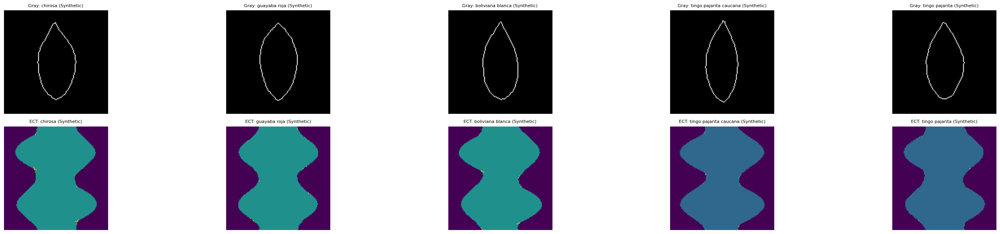

In [53]:
import numpy as np
import pandas as pd
import cv2 # OpenCV for image drawing
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns # For optional visualizations
import ect # For Euler Characteristic Transform
import networkx as nx # For graph representation in ECT

# --- Configuration for Data Generation (can be adjusted) ---
# NOTE: TARGET_COLUMN is now expected to be defined GLOBALLY BEFORE this block.
#       Do NOT uncomment and define it here unless you explicitly want to override
#       the global setting.
# TARGET_COLUMN = 'full_name' # THIS LINE IS NOW REMOVED/COMMENTED OUT

IMAGE_SIZE = 128            # Target size for generated images (e.g., 128x128 pixels)
PADDING = 10                # Pixels of padding around the leaf outline for image generation
# Target number of samples per class for augmentation.
# Setting it to `None` will use the maximum existing class count as the target.
# Set to a specific number (e.g., 180) to pad all classes up to that number.
MAX_SAMPLES_PER_CLASS_TARGET = None 

# --- Assume these are already loaded/defined in your notebook ---
# proc_arr: (N, 99, 2) numpy array (Original Procrustes coordinates)
# all_mdata: pandas DataFrame (Original metadata with 'full_name', 'PC1', 'PC2', etc.)
# Example placeholders (remove/comment out if your data is already loaded):
# proc_arr = np.random.rand(769, 99, 2) # Example (samples, landmarks, coords)
# all_mdata = pd.DataFrame({
#   'full_name': [f'Species_{i % 5}' for i in range(769)],
#   'type_name': [f'Type_{i % 3}' for i in range(769)],
#   'PC1': np.random.rand(769), 'PC2': np.random.rand(769)
# })


# Verify that TARGET_COLUMN is defined (should be from global scope)
if 'TARGET_COLUMN' not in globals():
    raise NameError("TARGET_COLUMN is not defined. Please define it at the top of your notebook.")

print(f"--- Starting Unified Augmented Data Generation for TARGET_COLUMN: '{TARGET_COLUMN}' ---")

# --- 1. Data Preparation (Original Data) ---
X_original_procrustes_flat = proc_arr.reshape(np.shape(proc_arr)[0], -1)
y_original_labels = all_mdata[TARGET_COLUMN].values

# Encode labels
label_encoder = LabelEncoder()
y_original_encoded = label_encoder.fit_transform(y_original_labels)
NUM_CLASSES = len(label_encoder.classes_)
class_names = label_encoder.classes_
num_original_samples = X_original_procrustes_flat.shape[0]

print(f"Original data shape (flattened Procrustes): {X_original_procrustes_flat.shape}")
print(f"Number of original samples: {num_original_samples}")
print(f"Number of classes: {NUM_CLASSES}")
print(f"Original label counts:\n{pd.Series(y_original_labels).value_counts()}")


# --- 2. PCA for SMOTE-like Augmentation ---
# Re-initialize and fit PCA with maximum components (None means min(n_samples, n_features))
# This is CRITICAL for inverse_transform to work correctly later.
pca_full = PCA(n_components=None, random_state=42)
pca_full.fit(X_original_procrustes_flat)
X_pca_original_full = pca_full.transform(X_original_procrustes_flat)

print(f"\nShape of X_pca_original_full (after PCA transform): {X_pca_original_full.shape}")
print(f"Number of components in fitted PCA: {pca_full.n_components_}")


# --- 3. SMOTE-like Data Augmentation in FULL PCA space (198 components) ---
print("\n--- Performing SMOTE-like Data Augmentation ---")

class_counts_original = pd.Series(y_original_encoded).value_counts()
if MAX_SAMPLES_PER_CLASS_TARGET is None:
    max_samples_target = class_counts_original.max() # Target size for all classes based on majority
else:
    max_samples_target = MAX_SAMPLES_PER_CLASS_TARGET

augmented_X_pca_list = X_pca_original_full.tolist()
augmented_y_encoded_list = y_original_encoded.tolist()
is_real_flag_list = [True] * num_original_samples

for class_encoded, count in class_counts_original.items():
    if count < max_samples_target:
        samples_to_generate = max_samples_target - count
        class_name = label_encoder.inverse_transform([class_encoded])[0]
        print(f"Augmenting class '{class_name}' ({class_encoded}): generating {samples_to_generate} new samples.")

        class_indices = np.where(y_original_encoded == class_encoded)[0]
        class_pca_samples = X_pca_original_full[class_indices]

        # Use min(len(class_pca_samples), k+1) for n_neighbors, where k is desired neighbors.
        # Ensure at least 2 samples for KNN to make sense.
        n_neighbors_for_class = min(len(class_pca_samples), 6) # Using 6 to get 5 neighbors + self
        if n_neighbors_for_class < 2:
            print(f"Warning: Class '{class_name}' has too few samples ({len(class_pca_samples)}) for meaningful SMOTE-like augmentation. Skipping.")
            continue 

        nn = NearestNeighbors(n_neighbors=n_neighbors_for_class).fit(class_pca_samples)
        distances, indices = nn.kneighbors(class_pca_samples)

        generated_count = 0
        while generated_count < samples_to_generate:
            idx_in_class_pca_samples = np.random.randint(0, len(class_pca_samples))
            sample = class_pca_samples[idx_in_class_pca_samples]

            # Ensure there's at least one actual neighbor (index 0 is the sample itself)
            if len(indices[idx_in_class_pca_samples]) < 2:
                continue 
            
            # Select a random neighbor (excluding the sample itself)
            neighbor_idx_in_nn_output = np.random.randint(1, len(indices[idx_in_class_pca_samples]))
            neighbor_idx_in_class_pca = indices[idx_in_class_pca_samples][neighbor_idx_in_nn_output]
            neighbor = class_pca_samples[neighbor_idx_in_class_pca]

            alpha = np.random.rand() # Random value between 0 and 1
            synthetic_pca_sample = sample + alpha * (neighbor - sample)

            augmented_X_pca_list.append(synthetic_pca_sample)
            augmented_y_encoded_list.append(class_encoded)
            is_real_flag_list.append(False) # Mark as synthetic
            generated_count += 1

X_pca_augmented_full = np.array(augmented_X_pca_list)
y_augmented_encoded = np.array(augmented_y_encoded_list)
is_real_flag_augmented = np.array(is_real_flag_list)

# Inverse transform augmented PCA data back to original feature space (flattened Procrustes)
X_augmented_procrustes_flat = pca_full.inverse_transform(X_pca_augmented_full)

# Reshape augmented data back to 3D Procrustes coordinates (samples, landmarks, coords)
num_samples_total = X_augmented_procrustes_flat.shape[0]
num_landmarks = np.shape(proc_arr)[1] # Should be 99
num_coords = np.shape(proc_arr)[2]      # Should be 2
proc_arr_augmented_3d = X_augmented_procrustes_flat.reshape(num_samples_total, num_landmarks, num_coords)


print("--- SMOTE-like Data Augmentation Complete ---")
print(f"Total samples after SMOTE-like augmentation: {num_samples_total}")
print(f"Augmented label counts:\n{pd.Series(y_augmented_encoded).value_counts()}")
print(f"Shape of augmented Procrustes data (3D): {proc_arr_augmented_3d.shape}")
print(f"Shape of augmented real/synthetic flag: {is_real_flag_augmented.shape}")


# --- 4. Global Scaling for Image Generation (applied to ALL augmented data) ---

# Determine global min/max coordinates across ALL augmented leaves for consistent scaling
all_x_coords = proc_arr_augmented_3d[:, :, 0].flatten()
all_y_coords = proc_arr_augmented_3d[:, :, 1].flatten()

min_x, max_x = np.min(all_x_coords), np.max(all_x_coords)
min_y, max_y = np.min(all_y_coords), np.max(all_y_coords)

data_width = max_x - min_x
data_height = max_y - min_y

# Calculate scaling factor and offset to fit all data within the image size
scale_factor = min((IMAGE_SIZE - 2 * PADDING) / data_width, (IMAGE_SIZE - 2 * PADDING) / data_height)

# Offset to center the scaled data in the image
offset_x = (IMAGE_SIZE / 2) - (data_width / 2 * scale_factor) - (min_x * scale_factor)
offset_y = (IMAGE_SIZE / 2) - (data_height / 2 * scale_factor) - (min_y * scale_factor)

print(f"\nImage Generation Parameters: IMAGE_SIZE={IMAGE_SIZE}, PADDING={PADDING}")
print(f"Calculated scale_factor: {scale_factor:.4f}, offset_x: {offset_x:.4f}, offset_y: {offset_y:.4f}")


# --- 5. Image Generation Function (Grayscale Outline Images) ---
def create_leaf_image(coords_2d, img_size, scale_factor_val, offset_x_val, offset_y_val):
    """
    Creates a grayscale image of a leaf outline from 2D Procrustes coordinates.
    The coordinates are first scaled and offset globally.
    """
    image = np.zeros((img_size, img_size), dtype=np.uint8)

    scaled_coords = np.copy(coords_2d)

    scaled_coords[:, 0] = (scaled_coords[:, 0] * scale_factor_val) + offset_x_val
    scaled_coords[:, 1] = (scaled_coords[:, 1] * scale_factor_val) + offset_y_val

    pixel_coords = np.array(scaled_coords).astype(np.int32)

    # Clip coordinates to image boundaries to prevent drawing outside
    pixel_coords[:, 0] = np.clip(pixel_coords[:, 0], 0, img_size - 1)
    pixel_coords[:, 1] = np.clip(pixel_coords[:, 1], 0, img_size - 1)

    # Draw the polygon on the image
    cv2.polylines(image, [pixel_coords], isClosed=True, color=255, thickness=1)

    return image

print(f"\n--- Generating {len(proc_arr_augmented_3d)} Grayscale Leaf Images ---")
X_images_augmented_list = []
for i in range(len(proc_arr_augmented_3d)):
    leaf_coords = proc_arr_augmented_3d[i]
    img = create_leaf_image(leaf_coords, IMAGE_SIZE, scale_factor, offset_x, offset_y)
    X_images_augmented_list.append(img)

# Convert list of images to a single NumPy array and reshape for CNN input
X_images_augmented = np.array(X_images_augmented_list).reshape(-1, IMAGE_SIZE, IMAGE_SIZE, 1)

print(f"Shape of generated grayscale image dataset (X_images_augmented): {X_images_augmented.shape}")


# --- 6. ECT Image Generation Function (from Procrustes Coordinates) ---
# This function will now accept the globally determined threshold_range_extent
def coords_to_ect_image(procrustes_coords_for_single_leaf, image_size, threshold_range_extent):
    # We are using Procrustes-aligned coordinates directly, as they are already
    # centered and globally scaled while preserving aspect ratio.
    
    if len(procrustes_coords_for_single_leaf) < 2: # Handle edge case for very few points
        return np.zeros((image_size, image_size), dtype=np.float32)

    G = nx.Graph()
    for i, (x, y) in enumerate(procrustes_coords_for_single_leaf):
        G.add_node(i, pos=(x, y))

    num_landmarks = procrustes_coords_for_single_leaf.shape[0]
    # Assuming points form a closed loop for a leaf outline
    for i in range(num_landmarks):
        G.add_edge(i, (i + 1) % num_landmarks)

    embedded_graph = ect.EmbeddedGraph()
    nodes_with_pos = {n: G.nodes[n]['pos'] for n in G.nodes()}
    embedded_graph.add_nodes_from_dict(nodes_with_pos)
    embedded_graph.add_edges_from(G.edges())

    thetas = np.linspace(0, 2 * np.pi, image_size, endpoint=False) # Angles for directions

    # ******************************************************************
    # CRITICAL: Define thresholds using the provided threshold_range_extent.
    # This range will be symmetric around 0, covering your Procrustes coordinates.
    thresholds = np.linspace(-threshold_range_extent, threshold_range_extent, image_size)
    # ******************************************************************

    direction_vectors = np.column_stack([np.cos(thetas), np.sin(thetas)])

    ect_calculator = ect.ECT(embedded_graph, direction_vectors, thresholds)
    ect_calculator.directions = ect.Directions.from_vectors(direction_vectors)
    ect_calculator.num_thresh = image_size
    ect_calculator.thresholds = thresholds

    ect_matrix = ect_calculator.calculate(embedded_graph)

    # Normalize ECT matrix to 0-1 range for image representation
    ect_min = np.min(ect_matrix)
    ect_max = np.max(ect_matrix)

    if ect_max == ect_min:
        normalized_ect = np.zeros((image_size, image_size), dtype=np.float32)
    else:
        normalized_ect = (ect_matrix - ect_min) / (ect_max - ect_min)

    return normalized_ect

print(f"\n--- Generating {len(proc_arr_augmented_3d)} ECT Images ---")

# --- MODIFICATION START ---
# Calculate the global ECT_THRESHOLD_EXTENT here, based on the augmented Procrustes data.
# This ensures consistency across all generated ECTs.
all_augmented_procrustes_coords_flat = proc_arr_augmented_3d.reshape(-1, 2)
max_abs_procrustes_val_augmented = np.max(np.abs(all_augmented_procrustes_coords_flat))
# Add a small buffer to ensure full coverage without clipping
ECT_THRESHOLD_EXTENT = max_abs_procrustes_val_augmented + 0.02 
print(f"Calculated ECT_THRESHOLD_EXTENT (based on augmented data): {ECT_THRESHOLD_EXTENT:.4f}")
# --- MODIFICATION END ---


X_ect_images_augmented_list = []
for i, procrustes_coords in enumerate(proc_arr_augmented_3d):
    # --- MODIFICATION START ---
    # Pass the calculated ECT_THRESHOLD_EXTENT to the function
    ect_img = coords_to_ect_image(procrustes_coords, IMAGE_SIZE, ECT_THRESHOLD_EXTENT)
    # --- MODIFICATION END ---
    X_ect_images_augmented_list.append(ect_img)

X_ect_images_augmented = np.array(X_ect_images_augmented_list, dtype=np.float32)

# Reshape for PyTorch CNN (num_samples, channels, height, width)
# Assuming ECT images are grayscale, so 1 channel
X_ect_images_augmented = X_ect_images_augmented.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated ECT image dataset (X_ect_images_augmented): {X_ect_images_augmented.shape}")


# --- 7. Final Shuffling of All Augmented Data ---
# It's crucial to shuffle all datasets (images, ECT, labels, real_flag)
# with the same permutation to maintain correspondence.
print("\n--- Shuffling all augmented data consistently ---")
overall_shuffle_indices = np.random.permutation(num_samples_total)

proc_arr_augmented_3d_shuffled = proc_arr_augmented_3d[overall_shuffle_indices]
X_images_augmented_shuffled = X_images_augmented[overall_shuffle_indices]
X_ect_images_augmented_shuffled = X_ect_images_augmented[overall_shuffle_indices]
y_augmented_encoded_shuffled = y_augmented_encoded[overall_shuffle_indices]
is_real_flag_augmented_shuffled = is_real_flag_augmented[overall_shuffle_indices]

# Extract original samples' indices from the shuffled array for evaluation later
# This is used to filter out synthetic samples during evaluation for fairness.
# We need the original indices *before* shuffling to filter the original data.
# Then apply the overall_shuffle_indices to get their new positions.
original_sample_logical_indices_before_shuffle = np.array([True]*num_original_samples + [False]*(num_samples_total - num_original_samples))
original_real_shuffled_logical_indices = original_sample_logical_indices_before_shuffle[overall_shuffle_indices]

# Store the final data variables that subsequent CNNs will use
final_data = {
    'X_images': X_images_augmented_shuffled,
    'X_ect_images': X_ect_images_augmented_shuffled,
    'y_encoded': y_augmented_encoded_shuffled,
    'is_real_flag': is_real_flag_augmented_shuffled,
    'num_original_samples': num_original_samples, # Keep track of how many are real
    'label_encoder': label_encoder,
    'class_names': class_names,
    'image_size': IMAGE_SIZE,
    'original_real_shuffled_logical_indices': original_real_shuffled_logical_indices,
    'target_column_used': TARGET_COLUMN # Store the target column used for generation
}

print("\n--- Unified Augmented Data Generation Complete ---")
print("All generated and augmented data (images, ECT, labels, real/synthetic flags) are available in the 'final_data' dictionary.")

# --- Optional: Visualize a few generated images to verify ---
print("\n--- Displaying a few generated leaf images (Grayscale and ECT) ---")
num_display = min(5, final_data['X_images'].shape[0])
plt.figure(figsize=(num_display * 6, 6))

for i in range(num_display):
    # Grayscale Image
    plt.subplot(2, num_display, i + 1)
    plt.imshow(final_data['X_images'][i, :, :, 0], cmap='gray')
    current_label = final_data['label_encoder'].inverse_transform([final_data['y_encoded'][i]])[0]
    is_real = " (Real)" if final_data['is_real_flag'][i] else " (Synthetic)"
    plt.title(f"Gray: {current_label}{is_real}", fontsize=8)
    plt.axis('off')

    # ECT Image
    plt.subplot(2, num_display, i + 1 + num_display)
    plt.imshow(final_data['X_ect_images'][i, 0, :, :], cmap='viridis')
    plt.title(f"ECT: {current_label}{is_real}", fontsize=8)
    plt.axis('off')
plt.tight_layout()
plt.show()

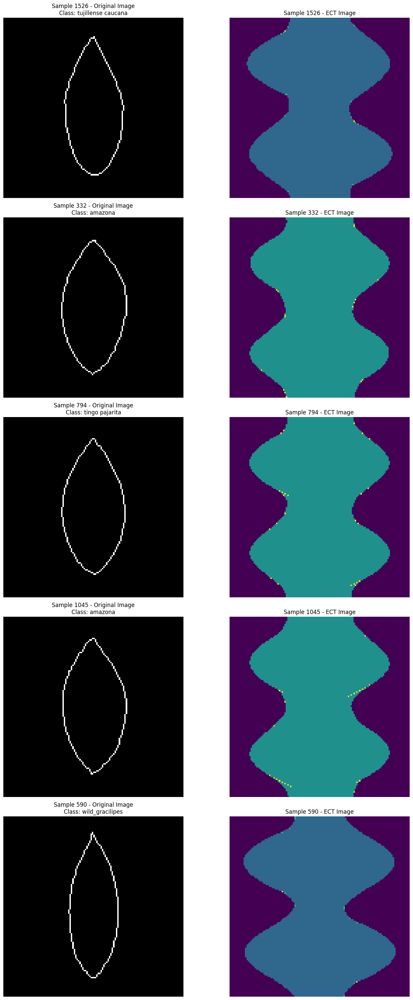

In [54]:
import matplotlib.pyplot as plt
import numpy as np
from torch.utils.data import Dataset # Import Dataset class

# Assuming final_data is available from the Unified Augmented Data Generation block

try:
    X_images = final_data['X_images'] # Original grayscale images (N, H, W, C)
    X_ect_images = final_data['X_ect_images'] # ECT images (N, C, H, W)
    y_encoded = final_data['y_encoded']
    label_encoder = final_data['label_encoder']

    # Select a few random indices to visualize
    num_samples_to_show = 5
    random_indices = np.random.choice(X_images.shape[0], num_samples_to_show, replace=False)

    plt.figure(figsize=(15, 6 * num_samples_to_show))

    for i, idx in enumerate(random_indices):
        # Original Grayscale Image
        ax1 = plt.subplot(num_samples_to_show, 2, i * 2 + 1)
        # X_images is (N, H, W, C), so take the first channel
        img_display = X_images[idx, :, :, 0]
        ax1.imshow(img_display, cmap='gray')
        ax1.set_title(f"Sample {idx} - Original Image\nClass: {label_encoder.inverse_transform([y_encoded[idx]])[0]}")
        ax1.axis('off')

        # ECT Image
        ax2 = plt.subplot(num_samples_to_show, 2, i * 2 + 2)
        # X_ect_images is (N, C, H, W), so take the first channel
        ect_display = X_ect_images[idx, 0, :, :]
        ax2.imshow(ect_display, cmap='viridis') # Viridis or other colormaps often work well for ECTs
        ax2.set_title(f"Sample {idx} - ECT Image")
        ax2.axis('off')

    plt.tight_layout()
    plt.show()

except NameError:
    print("Error: 'final_data' dictionary not found. Please ensure the 'Unified Augmented Data Generation' block has been run.")

## CNN on images

Using device: mps

--- Data Loaded from Unified Generation Block ---
Loaded image data shape: (4000, 128, 128, 1)
Number of classes: 20
Image size: 128x128
Data was generated using TARGET_COLUMN: 'full_name'
Tensor image data shape (after permute): torch.Size([4000, 1, 128, 128])

--- Performing PyTorch CNN with 5-Fold Stratified Cross-Validation (Image Data) ---

--- Fold 1/5 ---
Epoch 1/50, Train Loss: 2.6359, Val Loss: 1.9204, Val Acc: 0.3063
Epoch 2/50, Train Loss: 1.9452, Val Loss: 1.6715, Val Acc: 0.4113
Epoch 3/50, Train Loss: 1.7802, Val Loss: 1.4891, Val Acc: 0.4713
Epoch 4/50, Train Loss: 1.6437, Val Loss: 1.3831, Val Acc: 0.5288
Epoch 5/50, Train Loss: 1.5465, Val Loss: 1.2850, Val Acc: 0.5525
Epoch 6/50, Train Loss: 1.4437, Val Loss: 1.2214, Val Acc: 0.5775
Epoch 7/50, Train Loss: 1.4081, Val Loss: 1.1513, Val Acc: 0.6250
Epoch 8/50, Train Loss: 1.3224, Val Loss: 1.0883, Val Acc: 0.6350
Epoch 9/50, Train Loss: 1.2669, Val Loss: 1.0620, Val Acc: 0.6250
Epoch 10/50, Train Los

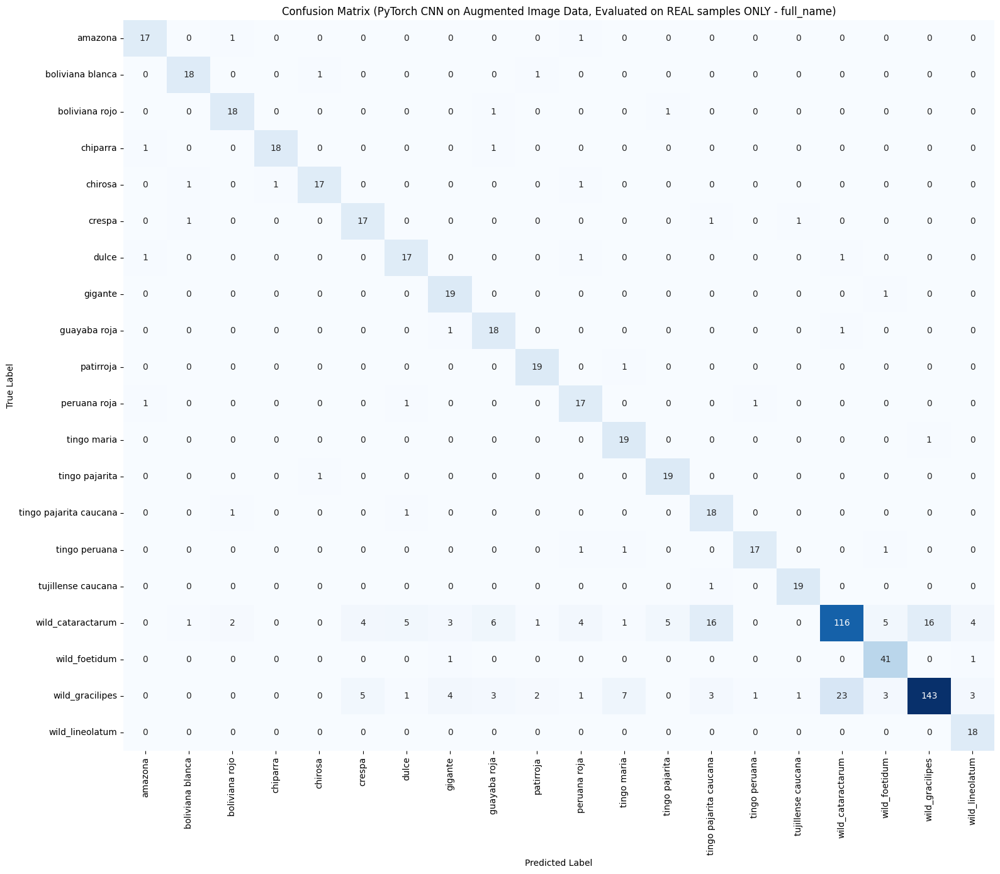

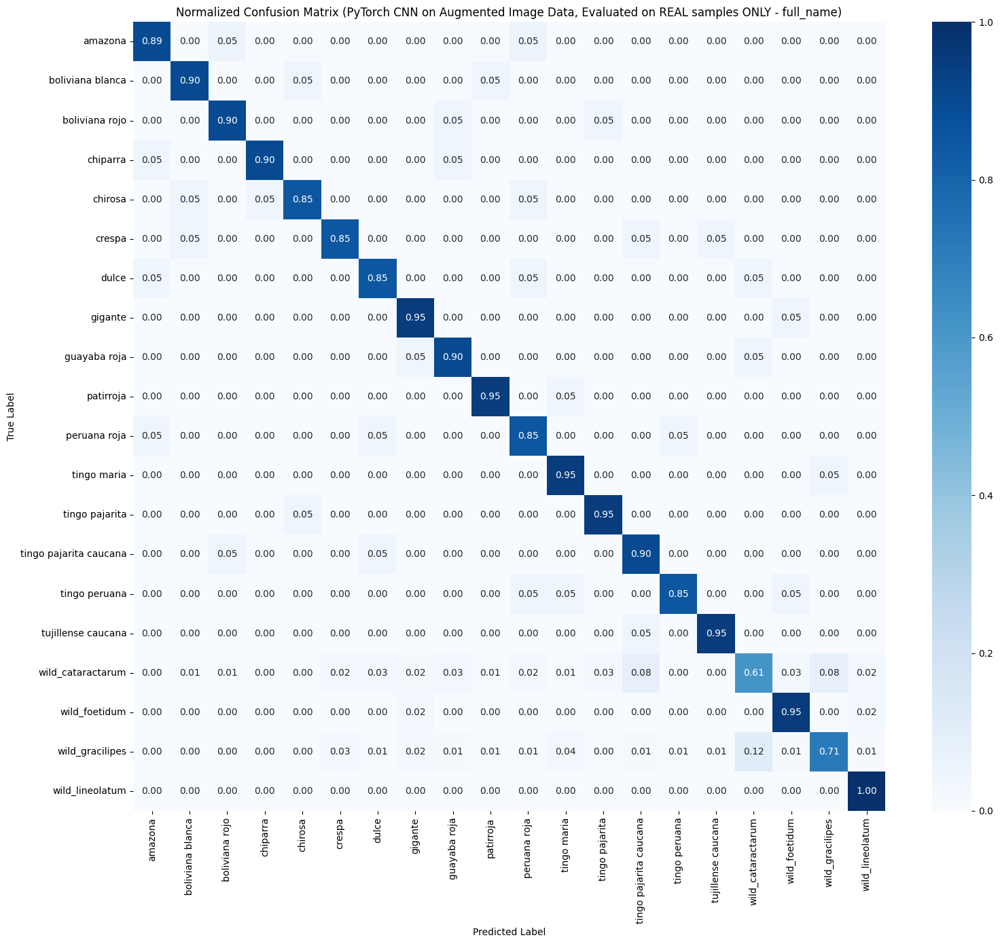

In [37]:
import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch Imports
import torch
import torch.nn as tnn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# --- Configuration (These values are now read from final_data or set here) ---
BATCH_SIZE = 32
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
K_FOLDS = 5 # For stratified cross-validation
PATIENCE = 10 # For early stopping


# Ensure MPS is available (or use CPU)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

# --- Load Data from Unified Generation Output ---
# This assumes the 'Unified Augmented Data Generation' block has been run
# and 'final_data' dictionary is available in the global scope.
try:
    X_images_augmented_shuffled = final_data['X_images']
    y_augmented_encoded_shuffled = final_data['y_encoded']
    is_real_flag_augmented_shuffled = final_data['is_real_flag']
    label_encoder = final_data['label_encoder']
    class_names = final_data['class_names']
    num_classes = len(class_names)
    image_size = final_data['image_size']
    original_real_shuffled_logical_indices = final_data['original_real_shuffled_logical_indices']
    target_column_used_for_data = final_data['target_column_used'] # Get the actual target column used

    print(f"\n--- Data Loaded from Unified Generation Block ---")
    print(f"Loaded image data shape: {X_images_augmented_shuffled.shape}")
    print(f"Number of classes: {num_classes}")
    print(f"Image size: {image_size}x{image_size}")
    print(f"Data was generated using TARGET_COLUMN: '{target_column_used_for_data}'")

except NameError:
    print("Error: 'final_data' dictionary not found. Please run the 'Unified Augmented Data Generation' block first.")
    raise RuntimeError("Required data not found. Please execute the data generation cell.")


# --- PyTorch Data Preparation ---

# Convert to PyTorch Tensors and Normalize Image Data
# Images: Convert to float32, PERMUTE dimensions for PyTorch (N, C, H, W), then normalize (0-255 to 0.0-1.0)
X_images_tensor = torch.from_numpy(X_images_augmented_shuffled).float().permute(0, 3, 1, 2) / 255.0
# Labels: Convert to long tensor (for CrossEntropyLoss)
y_encoded_tensor = torch.from_numpy(y_augmented_encoded_shuffled).long()
# is_real_flag: Convert to boolean tensor (for filtering)
is_real_flag_tensor = torch.from_numpy(is_real_flag_augmented_shuffled).bool()

print(f"Tensor image data shape (after permute): {X_images_tensor.shape}")


# Create a custom PyTorch Dataset
class LeafDataset(Dataset):
    def __init__(self, images, labels, is_real_flags):
        self.images = images
        self.labels = labels
        self.is_real_flags = is_real_flags

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx], self.is_real_flags[idx]


# --- Define PyTorch CNN Model Architecture ---
class LeafCNN(tnn.Module):
    def __init__(self, num_classes, image_size):
        super(LeafCNN, self).__init__()
        self.features = tnn.Sequential(
            # Convolutional Layer 1
            tnn.Conv2d(1, 32, kernel_size=3, padding=0),
            tnn.ReLU(),
            tnn.MaxPool2d(kernel_size=2, stride=2),
            tnn.Dropout(0.25),

            # Convolutional Layer 2
            tnn.Conv2d(32, 64, kernel_size=3, padding=0),
            tnn.ReLU(),
            tnn.MaxPool2d(kernel_size=2, stride=2),
            tnn.Dropout(0.25),

            # Convolutional Layer 3
            tnn.Conv2d(64, 128, kernel_size=3, padding=0),
            tnn.ReLU(),
            tnn.MaxPool2d(kernel_size=2, stride=2),
            tnn.Dropout(0.25)
        )

        # Calculate the size of the flattened features dynamically
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, image_size, image_size)
            flattened_size = self.features(dummy_input).view(1, -1).shape[1]
        
        self.classifier = tnn.Sequential(
            tnn.Flatten(),
            tnn.Linear(flattened_size, 256),
            tnn.ReLU(),
            tnn.Dropout(0.5),
            tnn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


# --- PyTorch CNN Training and Evaluation with Stratified K-Fold (Evaluate on REAL samples ONLY) ---

print(f"\n--- Performing PyTorch CNN with {K_FOLDS}-Fold Stratified Cross-Validation (Image Data) ---")

skf_pytorch = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

all_y_true_real_pt = []
all_y_pred_real_pt = []

for fold_idx, (train_index, test_index) in enumerate(skf_pytorch.split(X_images_tensor.cpu().numpy(), y_encoded_tensor.cpu().numpy())):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    train_dataset = LeafDataset(X_images_tensor[train_index],
                                 y_encoded_tensor[train_index],
                                 is_real_flag_tensor[train_index])
    test_dataset = LeafDataset(X_images_tensor[test_index],
                                y_encoded_tensor[test_index],
                                is_real_flag_tensor[test_index])

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    model = LeafCNN(num_classes=num_classes, image_size=image_size).to(device)
    criterion = tnn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(NUM_EPOCHS):
        model.train()
        running_loss = 0.0
        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_samples = 0
        with torch.no_grad():
            for images, labels, _ in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs.data, 1)
                total_samples += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        avg_train_loss = running_loss / len(train_loader.dataset)
        avg_val_loss = val_loss / len(test_loader.dataset)
        val_accuracy = correct_predictions / total_samples

        # --- IMPORTANT: UNCOMMENTED FOR EPOCH PROGRESS REPORTING ---
        print(f"Epoch {epoch+1}/{NUM_EPOCHS}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == PATIENCE:
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    model.eval()
    y_true_real_fold = []
    y_pred_real_fold = []
    with torch.no_grad():
        for images_batch, labels_batch, is_real_batch in test_loader:
            real_indices_in_batch = is_real_batch
            
            real_images = images_batch[real_indices_in_batch].to(device)
            real_labels = labels_batch[real_indices_in_batch].cpu().numpy()

            if len(real_images) > 0:
                outputs = model(real_images)
                _, predicted_real = torch.max(outputs.data, 1)
                
                y_true_real_fold.extend(real_labels)
                y_pred_real_fold.extend(predicted_real.cpu().numpy())

    all_y_true_real_pt.extend(y_true_real_fold)
    all_y_pred_real_pt.extend(y_pred_real_fold)


all_y_true_real_pt = np.array(all_y_true_real_pt)
all_y_pred_real_pt = np.array(all_y_pred_real_pt)

all_y_true_real_pt_names = label_encoder.inverse_transform(all_y_true_real_pt)
all_y_pred_real_pt_names = label_encoder.inverse_transform(all_y_pred_real_pt)

overall_accuracy_real_pt = accuracy_score(all_y_true_real_pt_names, all_y_pred_real_pt_names)
print(f"\n--- Overall Accuracy (PyTorch CNN on Augmented Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data}): {overall_accuracy_real_pt:.4f} ---")

print(f"\n--- Classification Report (PyTorch CNN on Augmented Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data}) ---")
print(classification_report(all_y_true_real_pt_names, all_y_pred_real_pt_names, target_names=class_names, zero_division=0))

cm_real_pt = confusion_matrix(all_y_true_real_pt_names, all_y_pred_real_pt_names, labels=class_names)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch CNN on Augmented Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch CNN on Augmented Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## CNN on ECTs

Global TARGET_COLUMN for this session: 'full_name'
Using device: mps

--- Data Loaded from Unified Generation Block for ECT CNN ---
Loaded ECT image data shape: (4000, 1, 128, 128)
Number of classes: 20
Image size: 128x128
Data was generated using TARGET_COLUMN: 'full_name'
Tensor ECT image data shape: torch.Size([4000, 1, 128, 128])

--- Performing PyTorch CNN with 5-Fold Stratified Cross-Validation (ECT Image Data) ---

--- Fold 1/5 ---
Epoch 1/50, Train Loss: 2.9964, Val Loss: 2.9877, Val Acc: 0.0525
Epoch 2/50, Train Loss: 2.9443, Val Loss: 2.6352, Val Acc: 0.1512
Epoch 3/50, Train Loss: 2.3199, Val Loss: 1.8577, Val Acc: 0.3825
Epoch 4/50, Train Loss: 1.9352, Val Loss: 1.6287, Val Acc: 0.4275
Epoch 5/50, Train Loss: 1.7357, Val Loss: 1.4740, Val Acc: 0.4788
Epoch 6/50, Train Loss: 1.5996, Val Loss: 1.3570, Val Acc: 0.5112
Epoch 7/50, Train Loss: 1.4799, Val Loss: 1.2830, Val Acc: 0.5300
Epoch 8/50, Train Loss: 1.3883, Val Loss: 1.1913, Val Acc: 0.5787
Epoch 9/50, Train Loss: 1.311

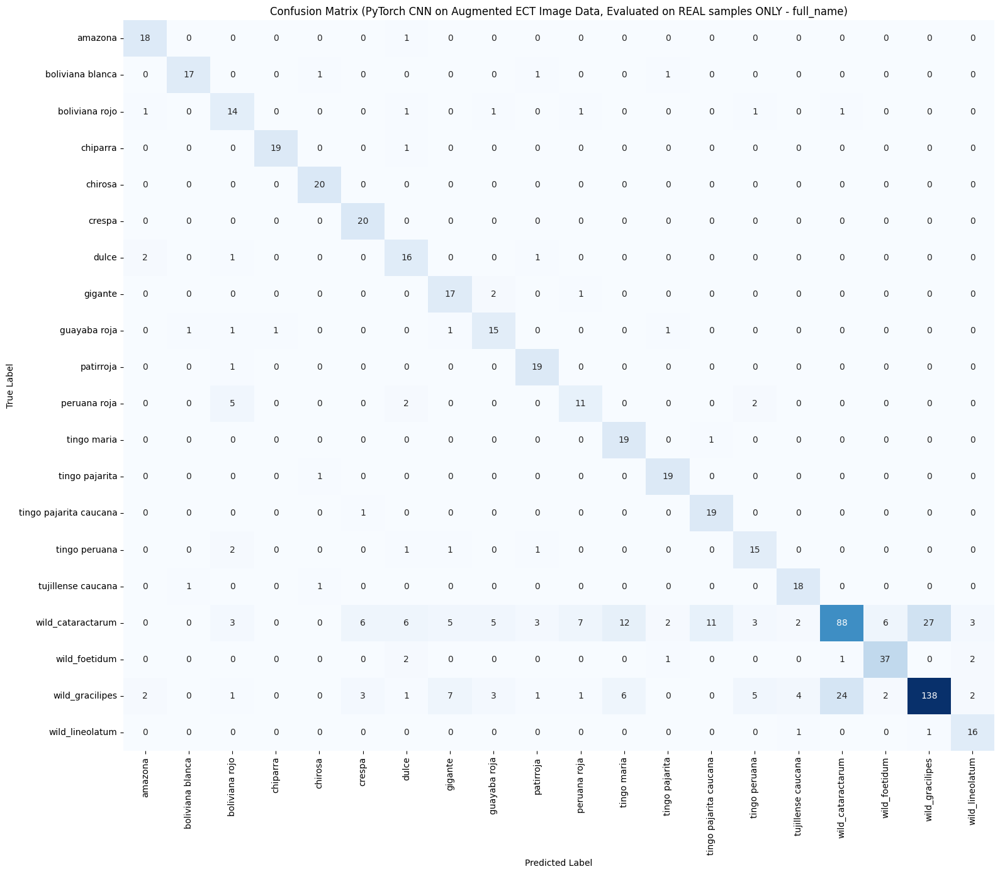

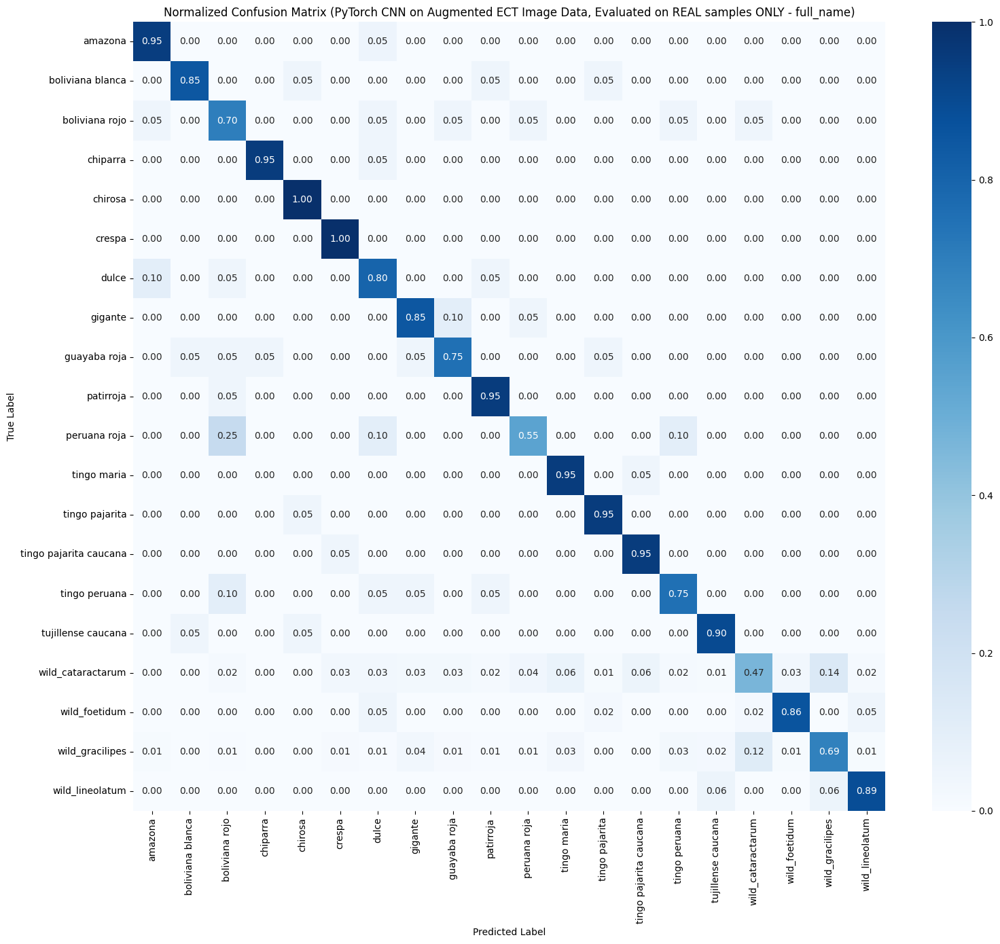

In [55]:
# ======================================================================
# MASTER CONFIGURATION FOR THE ENTIRE NOTEBOOK SESSION
# SET THIS ONCE AT THE VERY BEGINNING!
# ======================================================================
TARGET_COLUMN = 'full_name' # <--- Ensure this matches the target you set in the generation step!
# ======================================================================

# Initialize this dictionary ONCE at the start of your notebook session
# This ensures it's available for storing results from different models
if 'results_storage' not in globals():
    results_storage = {}
if TARGET_COLUMN not in results_storage:
    results_storage[TARGET_COLUMN] = {
        'class_counts': {},
        'model_metrics': {} # This will store precision/recall for each model
    }
print(f"Global TARGET_COLUMN for this session: '{TARGET_COLUMN}'")


import numpy as np
import pandas as pd
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch Imports
import torch
import torch.nn as tnn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# --- Configuration for CNN Training ---
BATCH_SIZE = 32
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
K_FOLDS = 5 # For stratified cross-validation
PATIENCE = 10 # For early stopping


# Ensure MPS is available (or use CPU)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

# --- Load Data from Unified Generation Output ---
# This assumes the 'Unified Augmented Data Generation' block has been run
# and 'final_data' dictionary is available in the global scope.
try:
    # IMPORTANT: Loading X_ect_images_augmented_shuffled for this model
    X_ect_images_augmented_shuffled = final_data['X_ect_images']
    y_augmented_encoded_shuffled = final_data['y_encoded']
    is_real_flag_augmented_shuffled = final_data['is_real_flag']
    label_encoder = final_data['label_encoder']
    class_names = final_data['class_names']
    num_classes = len(class_names)
    image_size = final_data['image_size']
    original_real_shuffled_logical_indices = final_data['original_real_shuffled_logical_indices']
    target_column_used_for_data = final_data['target_column_used'] # Get the actual target column used

    print(f"\n--- Data Loaded from Unified Generation Block for ECT CNN ---")
    print(f"Loaded ECT image data shape: {X_ect_images_augmented_shuffled.shape}")
    print(f"Number of classes: {num_classes}")
    print(f"Image size: {image_size}x{image_size}")
    print(f"Data was generated using TARGET_COLUMN: '{target_column_used_for_data}'")

except NameError:
    print("Error: 'final_data' dictionary not found. Please run the 'Unified Augmented Data Generation' block first.")
    raise RuntimeError("Required data not found. Please execute the data generation cell.")


# --- PyTorch Data Preparation ---

# Convert to PyTorch Tensors and Normalize ECT Image Data
# ECT Images: Are already (N, C, H, W) and should be float32 (0-1.0 from normalization during generation)
X_ect_images_tensor = torch.from_numpy(X_ect_images_augmented_shuffled).float()
# Labels: Convert to long tensor (for CrossEntropyLoss)
y_encoded_tensor = torch.from_numpy(y_augmented_encoded_shuffled).long()
# is_real_flag: Convert to boolean tensor (for filtering)
is_real_flag_tensor = torch.from_numpy(is_real_flag_augmented_shuffled).bool()

print(f"Tensor ECT image data shape: {X_ect_images_tensor.shape}")


# Create a custom PyTorch Dataset (same as before)
class LeafDataset(Dataset):
    def __init__(self, images, labels, is_real_flags):
        self.images = images
        self.labels = labels
        self.is_real_flags = is_real_flags

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx], self.is_real_flags[idx]


# --- Define PyTorch CNN Model Architecture (same as before, input channels is 1) ---
class LeafCNN(tnn.Module):
    def __init__(self, num_classes, image_size):
        super(LeafCNN, self).__init__()
        self.features = tnn.Sequential(
            # Convolutional Layer 1
            tnn.Conv2d(1, 32, kernel_size=3, padding=0), # Input channels is 1 for grayscale ECT images
            tnn.ReLU(),
            tnn.MaxPool2d(kernel_size=2, stride=2),
            tnn.Dropout(0.25),

            # Convolutional Layer 2
            tnn.Conv2d(32, 64, kernel_size=3, padding=0),
            tnn.ReLU(),
            tnn.MaxPool2d(kernel_size=2, stride=2),
            tnn.Dropout(0.25),

            # Convolutional Layer 3
            tnn.Conv2d(64, 128, kernel_size=3, padding=0),
            tnn.ReLU(),
            tnn.MaxPool2d(kernel_size=2, stride=2),
            tnn.Dropout(0.25)
        )

        # Calculate the size of the flattened features dynamically
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, image_size, image_size) # Dummy input for 1 channel
            flattened_size = self.features(dummy_input).view(1, -1).shape[1]
        
        self.classifier = tnn.Sequential(
            tnn.Flatten(),
            tnn.Linear(flattened_size, 256),
            tnn.ReLU(),
            tnn.Dropout(0.5),
            tnn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x


# --- PyTorch CNN Training and Evaluation with Stratified K-Fold (Evaluate on REAL samples ONLY) ---

print(f"\n--- Performing PyTorch CNN with {K_FOLDS}-Fold Stratified Cross-Validation (ECT Image Data) ---")

skf_pytorch = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

all_y_true_real_pt_ect = []
all_y_pred_real_pt_ect = []

for fold_idx, (train_index, test_index) in enumerate(skf_pytorch.split(X_ect_images_tensor.cpu().numpy(), y_encoded_tensor.cpu().numpy())):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    train_dataset = LeafDataset(X_ect_images_tensor[train_index], # Use ECT images for training
                                 y_encoded_tensor[train_index],
                                 is_real_flag_tensor[train_index])
    test_dataset = LeafDataset(X_ect_images_tensor[test_index], # Use ECT images for testing
                                y_encoded_tensor[test_index],
                                is_real_flag_tensor[test_index])

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    model = LeafCNN(num_classes=num_classes, image_size=image_size).to(device)
    criterion = tnn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0

    for epoch in range(NUM_EPOCHS):
        model.train()
        running_loss = 0.0
        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_samples = 0
        with torch.no_grad():
            for images, labels, _ in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs.data, 1)
                total_samples += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        avg_train_loss = running_loss / len(train_loader.dataset)
        avg_val_loss = val_loss / len(test_loader.dataset)
        val_accuracy = correct_predictions / total_samples

        print(f"Epoch {epoch+1}/{NUM_EPOCHS}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == PATIENCE:
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    model.eval()
    y_true_real_fold = []
    y_pred_real_fold = []
    with torch.no_grad():
        for images_batch, labels_batch, is_real_batch in test_loader:
            real_indices_in_batch = is_real_batch
            
            real_images = images_batch[real_indices_in_batch].to(device)
            real_labels = labels_batch[real_indices_in_batch].cpu().numpy()

            if len(real_images) > 0:
                outputs = model(real_images)
                _, predicted_real = torch.max(outputs.data, 1)
                
                y_true_real_fold.extend(real_labels)
                y_pred_real_fold.extend(predicted_real.cpu().numpy())

    all_y_true_real_pt_ect.extend(y_true_real_fold)
    all_y_pred_real_pt_ect.extend(y_pred_real_fold)


# Convert stored results to numpy arrays
all_y_true_real_pt_ect = np.array(all_y_true_real_pt_ect)
all_y_pred_real_pt_ect = np.array(all_y_pred_real_pt_ect)

# Convert integer labels back to original class names for report/matrix
all_y_true_real_pt_ect_names = label_encoder.inverse_transform(all_y_true_real_pt_ect)
all_y_pred_real_pt_ect_names = label_encoder.inverse_transform(all_y_pred_real_pt_ect)

# --- Final Evaluation on REAL samples Only ---

overall_accuracy_real_pt_ect = accuracy_score(all_y_true_real_pt_ect_names, all_y_pred_real_pt_ect_names)
print(f"\n--- Overall Accuracy (PyTorch CNN on Augmented ECT Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data}): {overall_accuracy_real_pt_ect:.4f} ---")

print(f"\n--- Classification Report (PyTorch CNN on Augmented ECT Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data}) ---")
print(classification_report(all_y_true_real_pt_ect_names, all_y_pred_real_pt_ect_names, target_names=class_names, zero_division=0))

# --- Confusion Matrix Visualization ---
cm_real_pt_ect = confusion_matrix(all_y_true_real_pt_ect_names, all_y_pred_real_pt_ect_names, labels=class_names)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real_pt_ect, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch CNN on Augmented ECT Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real_pt_ect = cm_real_pt_ect.astype('float') / cm_real_pt_ect.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt_ect[np.isnan(cm_normalized_real_pt_ect)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real_pt_ect, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch CNN on Augmented ECT Image Data, Evaluated on REAL samples ONLY - {target_column_used_for_data})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## Two stream CNN

Global TARGET_COLUMN for this session: 'full_name'
Using device: mps

--- Data Loaded from Unified Generation Block for Two-Stream CNN ---
Loaded image data shape: (4000, 128, 128, 1)
Loaded ECT image data shape: (4000, 1, 128, 128)
Number of classes: 20
Image size: 128x128
Number of original (real) samples: 769
Data was generated using TARGET_COLUMN: 'full_name'
Tensor image data shape (after permute): torch.Size([4000, 1, 128, 128])
Tensor ECT image data shape: torch.Size([4000, 1, 128, 128])
--- Performing PyTorch Two-Stream CNN with 5-Fold Stratified Cross-Validation on Combined Data (Evaluating on REAL samples) ---

--- Fold 1/5 ---
DEBUG (Model Init): Flattened size of Image Stream: 32768
DEBUG (Model Init): Flattened size of ECT Stream: 32768
DEBUG (Model Init): Total Flattened Size for FC Layer: 65536
Epoch 1/50, Train Loss: 2.7051, Val Loss: 1.9334, Val Acc: 0.3247
Epoch 2/50, Train Loss: 1.8593, Val Loss: 1.7421, Val Acc: 0.3961
Epoch 3/50, Train Loss: 1.6256, Val Loss: 1.470

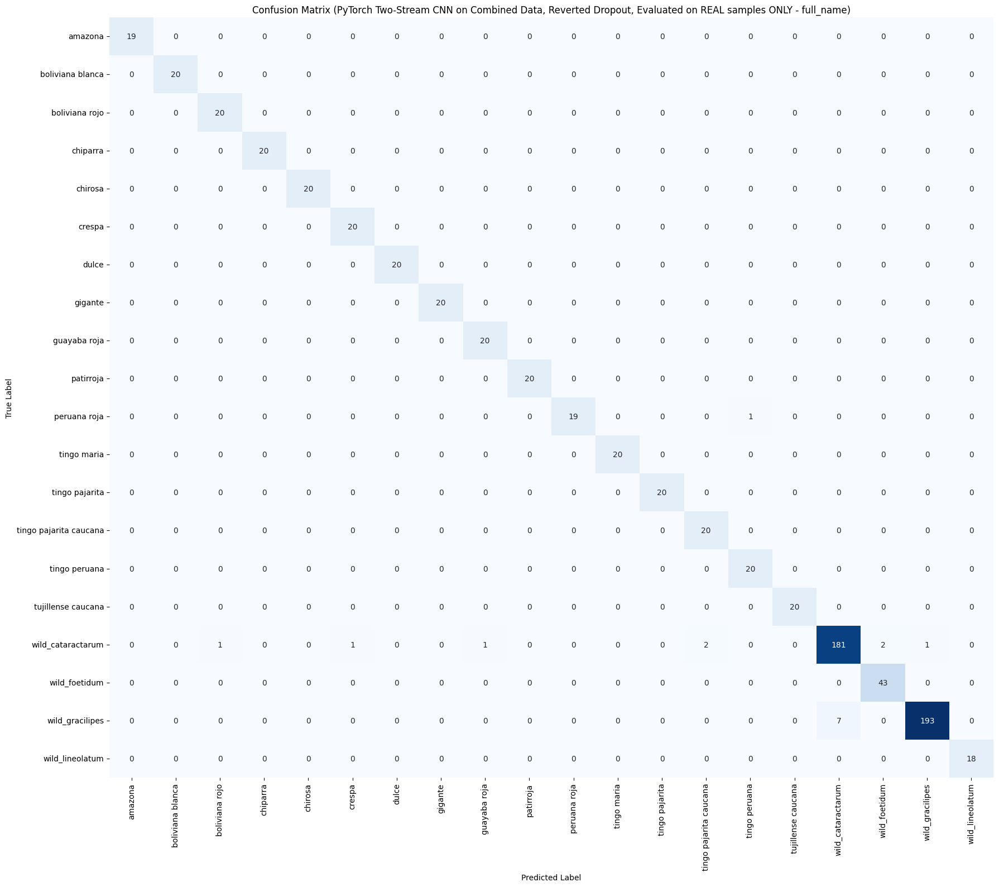

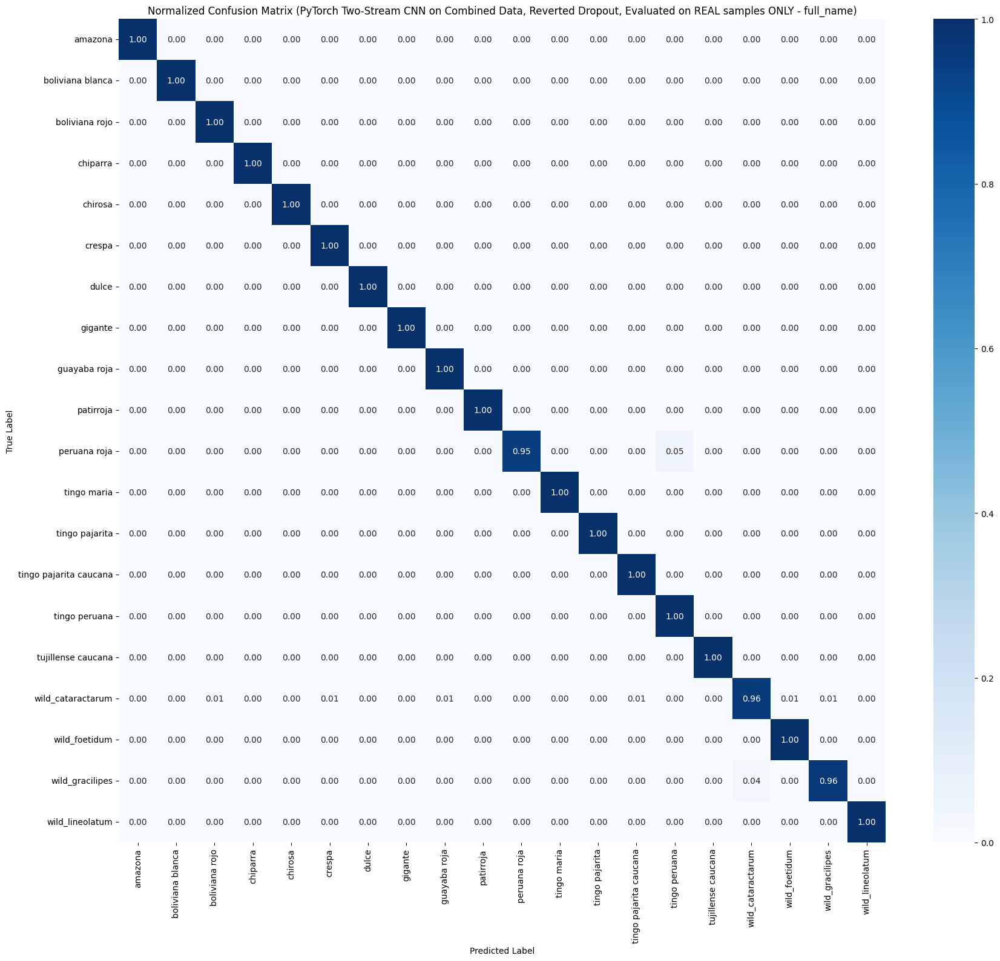


--- Current contents of results_storage (should include new model metrics) ---
{'full_name': {'class_counts': {'amazona': 19, 'boliviana blanca': 20, 'boliviana rojo': 20, 'chiparra': 20, 'chirosa': 20, 'crespa': 20, 'dulce': 20, 'gigante': 20, 'guayaba roja': 20, 'patirroja': 20, 'peruana roja': 20, 'tingo maria': 20, 'tingo pajarita': 20, 'tingo pajarita caucana': 20, 'tingo peruana': 20, 'tujillense caucana': 20, 'wild_cataractarum': 189, 'wild_foetidum': 43, 'wild_gracilipes': 200, 'wild_lineolatum': 18}, 'model_metrics': {'unbalanced_lda': {'precision': {'amazona': 0.36363636363636365, 'boliviana blanca': 0.1891891891891892, 'boliviana rojo': 0.038461538461538464, 'chiparra': 0.27586206896551724, 'chirosa': 0.3125, 'crespa': 0.3333333333333333, 'dulce': 0.2608695652173913, 'gigante': 0.3125, 'guayaba roja': 0.0625, 'patirroja': 0.2631578947368421, 'peruana roja': 0.20588235294117646, 'tingo maria': 0.3684210526315789, 'tingo pajarita': 0.16666666666666666, 'tingo pajarita caucana

In [58]:
# ======================================================================
# MASTER CONFIGURATION FOR THE ENTIRE NOTEBOOK SESSION
# SET THIS ONCE AT THE VERY BEGINNING!
# ======================================================================
TARGET_COLUMN = 'full_name' # <--- Ensure this matches the target you set in the generation step!
# ======================================================================

# Initialize this dictionary ONCE at the start of your notebook session
# This ensures it's available for storing results from different models
if 'results_storage' not in globals():
    results_storage = {}
if TARGET_COLUMN not in results_storage:
    results_storage[TARGET_COLUMN] = {
        'class_counts': {},
        'model_metrics': {} # This will store precision/recall for each model
    }
print(f"Global TARGET_COLUMN for this session: '{TARGET_COLUMN}'")


import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, Dataset # Added Dataset import
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import copy # For deepcopying the best model state

# Set a global random seed for all operations where possible
np.random.seed(42)
torch.manual_seed(42)

# --- Configuration for CNN Training ---
BATCH_SIZE = 32
NUM_EPOCHS = 50 # Maximum epochs, early stopping will likely halt sooner
LEARNING_RATE = 0.001
K_FOLDS = 5
RANDOM_STATE = 42 # For reproducibility of splits and augmentations
PATIENCE = 10 # For early stopping


# --- Device Setup ---
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using device: mps")
else:
    device = torch.device("cpu")
    print("MPS device not found. Using device: cpu")

# --- Load Data from Unified Generation Output ---
# This script ASSUMES the 'Unified Augmented Data Generation' block has been run
# and 'final_data' dictionary is available in the global scope.
try:
    X_images_augmented_shuffled = final_data['X_images']
    X_ect_images_augmented_shuffled = final_data['X_ect_images'] # Load pre-generated ECT images
    y_augmented_encoded_shuffled = final_data['y_encoded']
    is_real_flag_augmented_shuffled = final_data['is_real_flag'] # Keep real/synthetic flag
    label_encoder = final_data['label_encoder']
    class_names = final_data['class_names']
    num_classes = len(class_names)
    image_size = final_data['image_size']
    num_original_samples = final_data['num_original_samples'] # Get the count of real samples

    print(f"\n--- Data Loaded from Unified Generation Block for Two-Stream CNN ---")
    print(f"Loaded image data shape: {X_images_augmented_shuffled.shape}")
    print(f"Loaded ECT image data shape: {X_ect_images_augmented_shuffled.shape}")
    print(f"Number of classes: {num_classes}")
    print(f"Image size: {image_size}x{image_size}")
    print(f"Number of original (real) samples: {num_original_samples}")
    print(f"Data was generated using TARGET_COLUMN: '{final_data['target_column_used']}'")

except NameError:
    print("Error: 'final_data' dictionary not found. Please run the 'Unified Augmented Data Generation' block first.")
    raise RuntimeError("Required data not found. Please execute the data generation cell.")


# --- PyTorch Data Preparation ---

# Convert to PyTorch Tensors and Normalize Image Data
# Images: Convert to float32, PERMUTE dimensions for PyTorch (N, C, H, W), then normalize (0-255 to 0.0-1.0)
X_images_tensor = torch.from_numpy(X_images_augmented_shuffled).float().permute(0, 3, 1, 2) / 255.0
# ECT Images: Are already (N, C, H, W) and should be float32 (0-1.0 from normalization during generation)
X_ect_images_tensor = torch.from_numpy(X_ect_images_augmented_shuffled).float()
# Labels: Convert to long tensor (for CrossEntropyLoss)
y_encoded_tensor = torch.from_numpy(y_augmented_encoded_shuffled).long()
# is_real_flag: Convert to boolean tensor (for filtering)
is_real_flag_tensor = torch.from_numpy(is_real_flag_augmented_shuffled).bool()


print(f"Tensor image data shape (after permute): {X_images_tensor.shape}")
print(f"Tensor ECT image data shape: {X_ect_images_tensor.shape}")


# Create a custom PyTorch Dataset for two inputs
class TwoStreamDataset(Dataset):
    def __init__(self, images, ect_images, labels, is_real_flags):
        self.images = images
        self.ect_images = ect_images
        self.labels = labels
        self.is_real_flags = is_real_flags

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.ect_images[idx], self.labels[idx], self.is_real_flags[idx]


# --- PyTorch Two-Stream CNN Model Definition (MODIFIED for REVERTED DROPOUT) ---
class TwoStreamCNN(nn.Module):
    def __init__(self, num_classes, image_size, img_channels=1, ect_channels=1):
        super(TwoStreamCNN, self).__init__()

        # Stream for Original Images
        self.image_stream = nn.Sequential(
            nn.Conv2d(img_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # nn.Dropout(0.25), # REMOVED DROPOUT

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # nn.Dropout(0.25), # REMOVED DROPOUT

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # nn.Dropout(0.25) # REMOVED DROPOUT
        )

        # Stream for ECT Images
        self.ect_stream = nn.Sequential(
            nn.Conv2d(ect_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # nn.Dropout(0.25), # REMOVED DROPOUT

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # nn.Dropout(0.25), # REMOVED DROPOUT

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
            # nn.Dropout(0.25) # REMOVED DROPOUT
        )

        # Calculate input features for the linear layer dynamically
        with torch.no_grad():
            # Create dummy inputs on the correct device (important for module initialization)
            temp_image_stream = self.image_stream.to(device)
            temp_ect_stream = self.ect_stream.to(device)

            dummy_input_img = torch.zeros(1, img_channels, image_size, image_size).to(device)
            dummy_input_ect = torch.zeros(1, ect_channels, image_size, image_size).to(device)
            
            flattened_size_img = temp_image_stream(dummy_input_img).view(1, -1).shape[1]
            flattened_size_ect = temp_ect_stream(dummy_input_ect).view(1, -1).shape[1]

            total_flattened_size = flattened_size_img + flattened_size_ect

            print(f"DEBUG (Model Init): Flattened size of Image Stream: {flattened_size_img}")
            print(f"DEBUG (Model Init): Flattened size of ECT Stream: {flattened_size_ect}")
            print(f"DEBUG (Model Init): Total Flattened Size for FC Layer: {total_flattened_size}")

        self.fc_layers = nn.Sequential(
            nn.Linear(total_flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5), # <-- This dropout remains as in the PREVIOUS model
            nn.Linear(512, num_classes)
        )

    def forward(self, img_input, ect_input):
        img_features = self.image_stream(img_input)
        ect_features = self.ect_stream(ect_input)

        img_features = img_features.view(img_features.size(0), -1)
        ect_features = ect_features.view(ect_features.size(0), -1)

        # Concatenate features from both streams
        combined_features = torch.cat((img_features, ect_features), dim=1)

        output = self.fc_layers(combined_features)
        return output

# --- 5-Fold Stratified Cross-Validation (Evaluating on REAL samples Only) ---
print(f"--- Performing PyTorch Two-Stream CNN with {K_FOLDS}-Fold Stratified Cross-Validation on Combined Data (Evaluating on REAL samples) ---")

# Populate class_counts for TARGET_COLUMN in results_storage (if not already populated)
if not results_storage[TARGET_COLUMN]['class_counts']:
    class_counts_series = pd.Series(y_encoded_tensor[is_real_flag_tensor].cpu().numpy()).value_counts().sort_index()
    for encoded_label, count in class_counts_series.items():
        class_name = label_encoder.inverse_transform([encoded_label])[0]
        results_storage[TARGET_COLUMN]['class_counts'][class_name] = count
    print(f"Class counts populated for '{TARGET_COLUMN}'.")

# Prepare the 'real' portion of the data for Stratified K-Fold splitting.
real_original_indices = torch.where(is_real_flag_tensor)[0].cpu().numpy()

X_original_images_for_skf = X_images_tensor[real_original_indices]
X_original_ect_for_skf = X_ect_images_tensor[real_original_indices]
y_original_for_skf = y_encoded_tensor[real_original_indices] # These are the encoded (integer) labels for SKF

skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_STATE)

all_predictions_logits = []
all_true_labels_real_validation = [] # To collect all true labels across folds for final report

for fold_idx, (train_original_real_indices, val_original_real_indices) in enumerate(skf.split(X_original_images_for_skf.cpu().numpy(), y_original_for_skf.cpu().numpy())):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    # --- Prepare Validation Data (ONLY REAL SAMPLES for this fold's validation split) ---
    X_val_img_fold = X_original_images_for_skf[val_original_real_indices]
    X_val_ect_fold = X_original_ect_for_skf[val_original_real_indices]
    y_val_fold = y_original_for_skf[val_original_real_indices]
    
    val_dataset = TwoStreamDataset(X_val_img_fold, X_val_ect_fold, y_val_fold, torch.ones_like(y_val_fold, dtype=torch.bool)) # All are 'real' in this validation set
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

    # --- Prepare Training Data (REAL TRAIN SAMPLES + ALL AUGMENTED SAMPLES) ---
    synthetic_indices = torch.where(~is_real_flag_tensor)[0].cpu().numpy()
    global_real_train_indices = real_original_indices[train_original_real_indices]

    all_training_indices_global = np.concatenate((
        global_real_train_indices,
        synthetic_indices
    ))
    
    X_train_img_fold_tensor = X_images_tensor[all_training_indices_global]
    X_train_ect_fold_tensor = X_ect_images_tensor[all_training_indices_global]
    y_train_fold_tensor = y_encoded_tensor[all_training_indices_global]
    is_real_train_fold_tensor = is_real_flag_tensor[all_training_indices_global]

    train_dataset = TwoStreamDataset(X_train_img_fold_tensor, X_train_ect_fold_tensor, y_train_fold_tensor, is_real_train_fold_tensor)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)


    # --- Model Initialization and Training Loop ---
    model = TwoStreamCNN(num_classes=num_classes, image_size=image_size).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss = 0.0
        for img_inputs, ect_inputs, labels, _ in train_loader: # _ for is_real_flag (not used in training loss)
            img_inputs, ect_inputs, labels = img_inputs.to(device), ect_inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(img_inputs, ect_inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * img_inputs.size(0)

        train_loss /= len(train_dataset)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_predictions = 0
        with torch.no_grad():
            for img_inputs, ect_inputs, labels, _ in val_loader: # _ for is_real_flag
                img_inputs, ect_inputs, labels = img_inputs.to(device), ect_inputs.to(device), labels.to(device)
                outputs = model(img_inputs, ect_inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * img_inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        val_loss /= len(val_dataset)
        val_accuracy = correct_predictions / total_predictions

        print(f"Epoch {epoch + 1}/{NUM_EPOCHS}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == PATIENCE: # Early stopping patience
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    model.load_state_dict(best_model_wts)
    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    # --- Evaluate Best Model on ALL ORIGINAL REAL SAMPLES for Ensembling ---
    # We predict on the *entire* set of original real samples in each fold's best model,
    # then average these predictions at the end for final evaluation.
    model.eval()
    fold_predictions_logits = []

    X_real_img_tensor_all = X_original_images_for_skf.to(device)
    X_real_ect_tensor_all = X_original_ect_for_skf.to(device)
    y_real_labels_all = y_original_for_skf.to(device) # Keep true labels here for consistency with all_true_labels_real_validation

    real_dataset_for_pred = TwoStreamDataset(X_real_img_tensor_all, X_real_ect_tensor_all, y_real_labels_all, torch.ones_like(y_real_labels_all, dtype=torch.bool))
    real_loader_for_pred = DataLoader(real_dataset_for_pred, batch_size=BATCH_SIZE, shuffle=False)

    with torch.no_grad():
        for img_inputs, ect_inputs, labels_true, _ in real_loader_for_pred:
            outputs = model(img_inputs, ect_inputs)
            fold_predictions_logits.append(outputs.cpu().numpy())
            # Collect true labels for the entire real dataset
            all_true_labels_real_validation.append(labels_true.cpu().numpy())

    all_predictions_logits.append(np.concatenate(fold_predictions_logits, axis=0))

# --- Final Evaluation on REAL samples Only (using ensemble of fold models) ---

# Average the logits from all folds for each sample
averaged_logits = np.mean(np.array(all_predictions_logits), axis=0)
final_predictions_encoded = np.argmax(averaged_logits, axis=1)

# True labels for the entire original real dataset (make sure it's flattened and consistent)
# Need to concatenate all_true_labels_real_validation only once to avoid duplication
# Ensure it only stores each real sample's true label ONCE
# Since skf.split processes the *same* X_original_images_for_skf each time,
# and we're predicting on *all* X_original_images_for_skf, y_original_for_skf is the correct full set.
final_true_labels_encoded = y_original_for_skf.cpu().numpy()


# Inverse transform to get string names for reporting
final_true_labels_names = label_encoder.inverse_transform(final_true_labels_encoded)
final_predictions_names = label_encoder.inverse_transform(final_predictions_encoded)

overall_accuracy = accuracy_score(final_true_labels_names, final_predictions_names)
print(f"\n--- Overall Accuracy (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy:.4f} ---")

print(f"\n--- Classification Report (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
report = classification_report(final_true_labels_names, final_predictions_names, target_names=list(label_encoder.classes_), zero_division=0, output_dict=True)
print(classification_report(final_true_labels_names, final_predictions_names, target_names=list(label_encoder.classes_), zero_division=0))

# --- Store results in results_storage ---
MODEL_NAME = 'Two_Stream_CNN_RevertedDropout' # Giving it a distinct name for plotting comparison
if TARGET_COLUMN not in results_storage: # Should already be initialized, but for robustness
    results_storage[TARGET_COLUMN] = {'class_counts': {}, 'model_metrics': {}}

# Populate model_metrics for the current run
results_storage[TARGET_COLUMN]['model_metrics'][MODEL_NAME] = {
    'precision': {cls: report[cls]['precision'] for cls in label_encoder.classes_},
    'recall': {cls: report[cls]['recall'] for cls in label_encoder.classes_}
}
print(f"Metrics for '{MODEL_NAME}' stored in results_storage for '{TARGET_COLUMN}'.")


# --- Confusion Matrix Visualization (Raw Counts) ---
cm_real_pt = confusion_matrix(final_true_labels_names, final_predictions_names, labels=label_encoder.classes_)

plt.figure(figsize=(18, 16))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch Two-Stream CNN on Combined Data, Reverted Dropout, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Confusion Matrix Visualization (Normalized) ---
cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0 # Handle cases where a class has no true samples

plt.figure(figsize=(18, 16))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch Two-Stream CNN on Combined Data, Reverted Dropout, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

print("\n--- Current contents of results_storage (should include new model metrics) ---")
print(results_storage)

In [59]:
results_storage

{'full_name': {'class_counts': {'amazona': 19,
   'boliviana blanca': 20,
   'boliviana rojo': 20,
   'chiparra': 20,
   'chirosa': 20,
   'crespa': 20,
   'dulce': 20,
   'gigante': 20,
   'guayaba roja': 20,
   'patirroja': 20,
   'peruana roja': 20,
   'tingo maria': 20,
   'tingo pajarita': 20,
   'tingo pajarita caucana': 20,
   'tingo peruana': 20,
   'tujillense caucana': 20,
   'wild_cataractarum': 189,
   'wild_foetidum': 43,
   'wild_gracilipes': 200,
   'wild_lineolatum': 18},
  'model_metrics': {'unbalanced_lda': {'precision': {'amazona': 0.36363636363636365,
     'boliviana blanca': 0.1891891891891892,
     'boliviana rojo': 0.038461538461538464,
     'chiparra': 0.27586206896551724,
     'chirosa': 0.3125,
     'crespa': 0.3333333333333333,
     'dulce': 0.2608695652173913,
     'gigante': 0.3125,
     'guayaba roja': 0.0625,
     'patirroja': 0.2631578947368421,
     'peruana roja': 0.20588235294117646,
     'tingo maria': 0.3684210526315789,
     'tingo pajarita': 0.166

# UNBALANCED LDA NO PETIOLE DATA


--- Performing LDA with 5-Fold Stratified Cross-Validation on 'full_name' ---

Fold 1/5

Fold 2/5

Fold 3/5

Fold 4/5

Fold 5/5


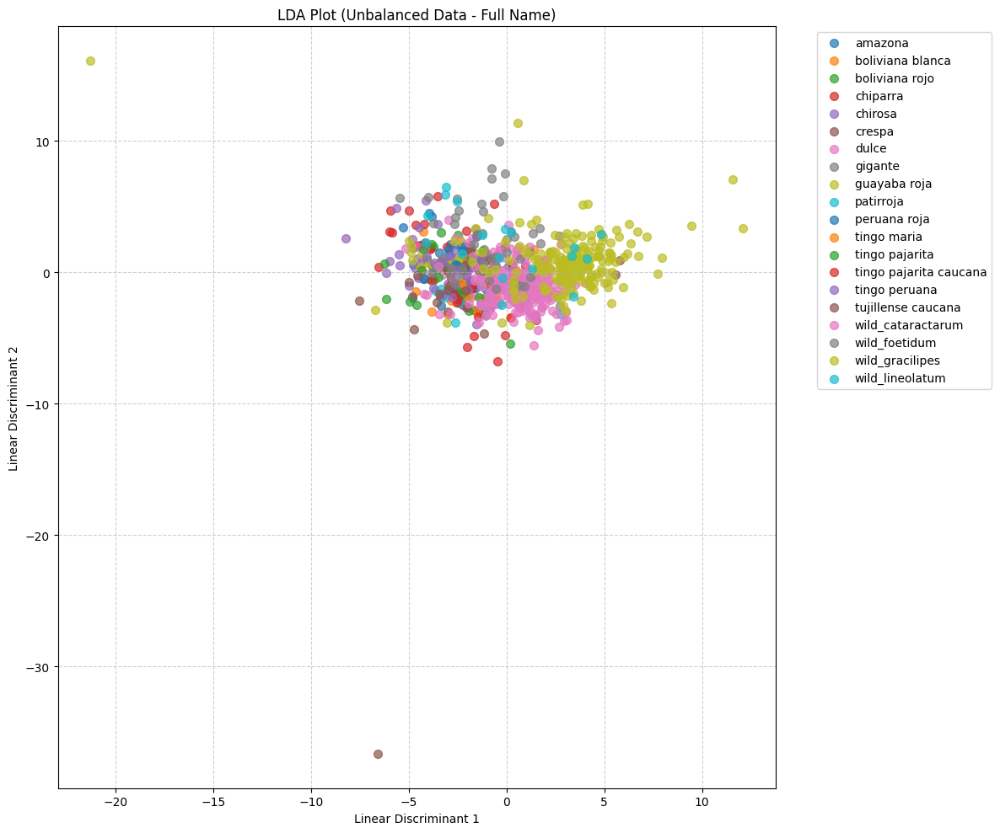


--- Overall Accuracy (Unbalanced Data - Full Name): 0.5332 ---

--- Classification Report (Unbalanced Data - Full Name) ---
                        precision    recall  f1-score   support

               amazona       0.36      0.21      0.27        19
      boliviana blanca       0.19      0.35      0.25        20
        boliviana rojo       0.04      0.05      0.04        20
              chiparra       0.28      0.40      0.33        20
               chirosa       0.31      0.25      0.28        20
                crespa       0.33      0.15      0.21        20
                 dulce       0.26      0.30      0.28        20
               gigante       0.31      0.25      0.28        20
          guayaba roja       0.06      0.05      0.06        20
             patirroja       0.26      0.25      0.26        20
          peruana roja       0.21      0.35      0.26        20
           tingo maria       0.37      0.35      0.36        20
        tingo pajarita       0.17      0.1

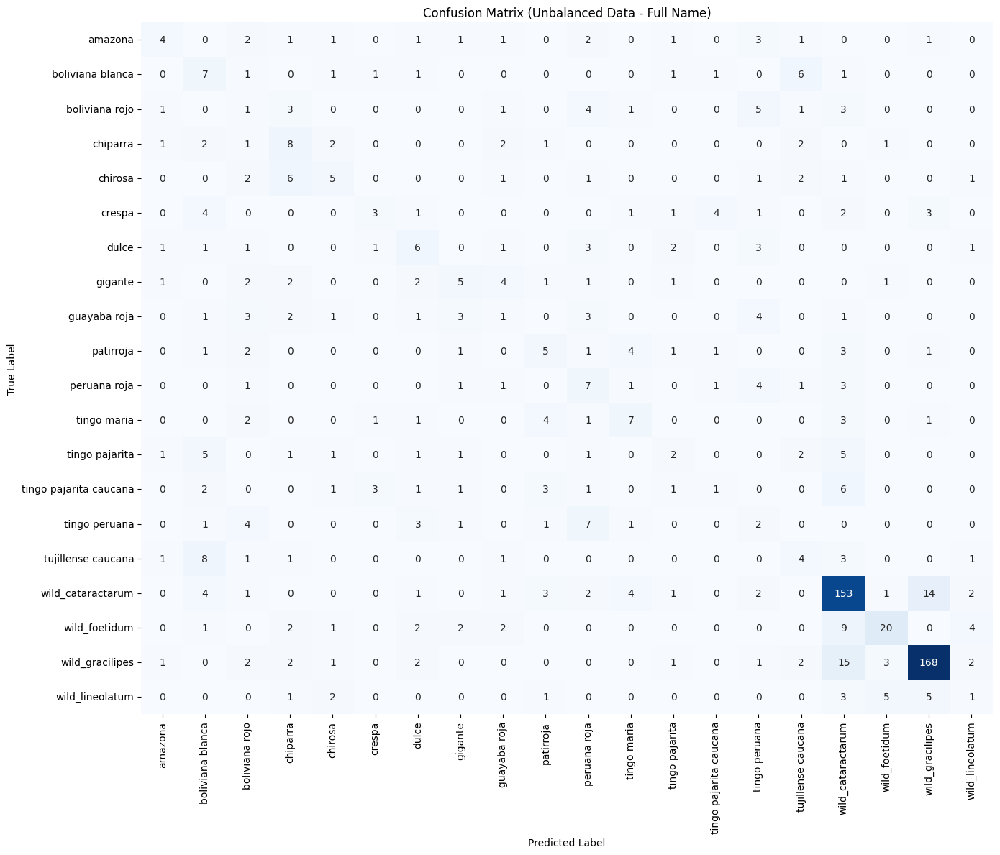

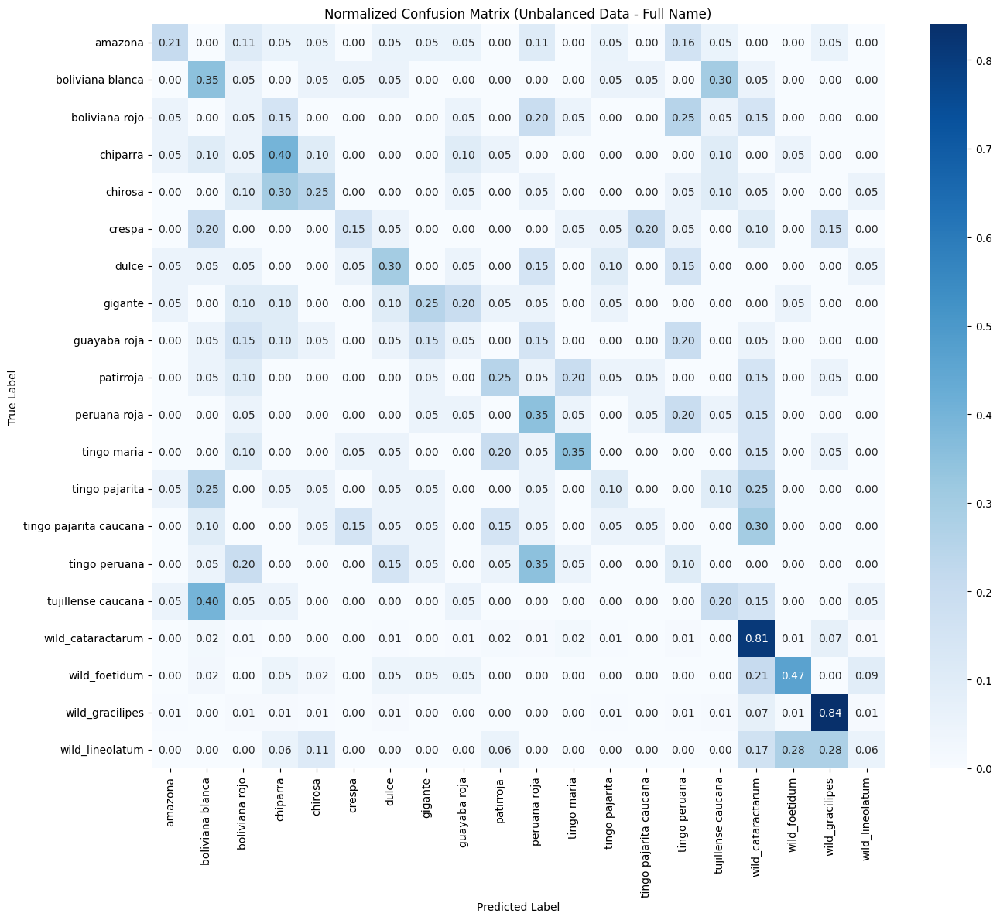

In [25]:
import numpy as np
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
import matplotlib.pyplot as plt
import seaborn as sns

# --- Assume these are already loaded/defined in your notebook ---
# proc_arr: (769, 99, 2) numpy array
# all_mdata: pandas DataFrame
# pca: fitted sklearn.decomposition.PCA object (though not used in this first step,
#      it's good to have it noted for the next part)

# Example dummy data for demonstration if you're running this as a standalone script
# Replace this with your actual loaded data:
# if 'proc_arr' not in locals():
#     # Create dummy proc_arr (769 samples, 99 landmarks, 2 coords)
#     proc_arr = np.random.rand(769, 99, 2) * 10
#
# if 'all_mdata' not in locals():
#     # Create dummy all_mdata
#     full_name_counts = {
#         'wild_gracilipes': 200, 'wild_cataractarum': 189, 'wild_foetidum': 43,
#         'tujillense caucana': 20, 'tingo peruana': 20, 'tingo pajarita caucana': 20,
#         'tingo maria': 20, 'tingo pajarita': 20, 'boliviana blanca': 20,
#         'peruana roja': 20, 'guayaba roja': 20, 'gigante': 20, 'dulce': 20,
#         'crespa': 20, 'chirosa': 20, 'chiparra': 20, 'boliviana rojo': 20,
#         'patirroja': 20, 'amazona': 19, 'wild_lineolatum': 18
#     }
#     type_name_counts = {
#         'wild_gracilipes': 200, 'wild_cataractarum': 189, 'coca': 180,
#         'ipadu': 79, 'wild_foetidum': 43, 'novogranatense': 40,
#         'truxillense': 20, 'wild_lineolatum': 18
#     }
#     all_names = []
#     for name, count in full_name_counts.items():
#         all_names.extend([name] * count)
#     # Ensure total length matches proc_arr[0]
#     all_names.extend(['extra'] * (769 - len(all_names))) # Add extra if needed to match 769
#     np.random.shuffle(all_names) # Shuffle to simulate real data
#     all_mdata = pd.DataFrame({'full_name': all_names[:769], 'PC1': np.random.rand(769), 'PC2': np.random.rand(769)})
#
#     # Ensure 'type_name' is also present for completeness, even if not used immediately
#     type_names = []
#     for name, count in type_name_counts.items():
#         type_names.extend([name] * count)
#     type_names.extend(['extra_type'] * (769 - len(type_names)))
#     np.random.shuffle(type_names)
#     all_mdata['type_name'] = type_names[:769]
#
# if 'pca' not in locals():
#     from sklearn.decomposition import PCA
#     # Dummy PCA object - in your real code, this will be your actual fitted PCA
#     # It's important that this PCA object was fitted on the FLATTENED proc_arr
#     flat_arr_dummy = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])
#     pca = PCA(n_components=2) # Or whatever number of components you used
#     pca.fit(flat_arr_dummy)
# # --- End of dummy data section ---


# 1. Prepare Data for LDA
# Flatten the 3D proc_arr to a 2D array (samples, features)
X = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])

# Get the target variable (labels)
y = all_mdata['full_name']

# --- Check for minimum samples per class for StratifiedKFold ---
# Determine an appropriate k for n_splits.
# A common guideline is that each class should have at least k samples.
min_samples_in_any_class = y.value_counts().min()
n_splits = 5 # Default, a good starting point

if min_samples_in_any_class < n_splits:
    print(f"Warning: Smallest class has {min_samples_in_any_class} samples, which is less than n_splits={n_splits}.")
    print("Adjusting n_splits to accommodate smallest class if necessary, or consider excluding very small classes for overall metrics.")
    # For now, let's proceed with n_splits=5, but be aware of potential issues
    # if a fold ends up with no samples for a specific class during splitting.
    # sklearn's StratifiedKFold will raise an error if a class has fewer than n_splits samples.
    # To be safe, we could set n_splits = min_samples_in_any_class if it's really small,
    # or strategically exclude very small classes from this particular cross-validation.
    # For 'full_name', min is 18 (wild_lineolatum), so n_splits=5 is fine.

# Initialize StratifiedKFold
# Setting shuffle=True and random_state for reproducibility
skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Store results for aggregation
all_y_true = []
all_y_pred = []
all_lda_scores = []
all_y_labels = []

print(f"\n--- Performing LDA with {n_splits}-Fold Stratified Cross-Validation on 'full_name' ---")

# Iterate through folds
for fold_idx, (train_index, test_index) in enumerate(skf.split(X, y)):
    print(f"\nFold {fold_idx + 1}/{n_splits}")
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Initialize and fit LDA model
    # The number of components for LDA is at most n_classes - 1.
    # Let's set it to the minimum of n_classes - 1 or the number of features.
    n_components_lda = min(len(y.unique()) - 1, X.shape[1])
    lda = LinearDiscriminantAnalysis(n_components=n_components_lda)

    # Fit LDA on training data and transform both train and test data
    X_train_lda = lda.fit_transform(X_train, y_train)
    X_test_lda = lda.transform(X_test)

    # Make predictions on the test set
    y_pred = lda.predict(X_test)

    # Store true and predicted labels for overall confusion matrix
    all_y_true.extend(y_test)
    all_y_pred.extend(y_pred)

    # Store LDA scores and corresponding true labels for plotting
    all_lda_scores.append(X_test_lda)
    all_y_labels.extend(y_test)

# Concatenate all LDA scores for plotting
all_lda_scores = np.vstack(all_lda_scores)
all_y_labels = np.array(all_y_labels)


# 2. Visualize LDA Plot with LDA Scores

# Get unique class names in sorted order for consistent plotting
class_names = sorted(y.unique())
num_classes = len(class_names)

# Plotting LDA scores (first two components if available)
plt.figure(figsize=(12, 10))
if all_lda_scores.shape[1] >= 2:
    for i, class_name in enumerate(class_names):
        # Filter data for the current class
        class_data = all_lda_scores[all_y_labels == class_name]
        plt.scatter(class_data[:, 0], class_data[:, 1], label=class_name, alpha=0.7, s=50)
    plt.xlabel('Linear Discriminant 1')
    plt.ylabel('Linear Discriminant 2')
    plt.title('LDA Plot (Unbalanced Data - Full Name)')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
elif all_lda_scores.shape[1] == 1:
    # If only one component, plot as a 1D scatter or histogram
    plt.figure(figsize=(10, 6))
    for i, class_name in enumerate(class_names):
        class_data = all_lda_scores[all_y_labels == class_name]
        plt.scatter(class_data[:, 0], np.zeros_like(class_data[:, 0]), label=class_name, alpha=0.7, s=50, jitter=0.1)
    plt.xlabel('Linear Discriminant 1')
    plt.title('LDA Plot (Unbalanced Data - Full Name) - 1D Projection')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()
else:
    print("LDA resulted in less than 1 discriminant component. Cannot plot LDA scores.")


# 3. Calculate and Visualize Confusion Matrix

# Convert lists to numpy arrays for sklearn metrics
all_y_true = np.array(all_y_true)
all_y_pred = np.array(all_y_pred)

# Overall Accuracy
overall_accuracy = accuracy_score(all_y_true, all_y_pred)
print(f"\n--- Overall Accuracy (Unbalanced Data - Full Name): {overall_accuracy:.4f} ---")

# Classification Report (provides precision, recall, f1-score per class)
print("\n--- Classification Report (Unbalanced Data - Full Name) ---")
print(classification_report(all_y_true, all_y_pred, target_names=class_names, zero_division=0)) # zero_division=0 handles cases where a class has no true or predicted samples

# Confusion Matrix
cm = confusion_matrix(all_y_true, all_y_pred, labels=class_names) # Use labels for consistent order

plt.figure(figsize=(14, 12))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Unbalanced Data - Full Name)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# Optional: Normalized Confusion Matrix (to see proportions)
cm_normalized = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] # Normalize by true class
cm_normalized[np.isnan(cm_normalized)] = 0 # Handle potential NaN for classes with no true samples

plt.figure(figsize=(14, 12))
sns.heatmap(cm_normalized, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Normalized Confusion Matrix (Unbalanced Data - Full Name)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### `full_name` results
```python
--- Overall Accuracy (Unbalanced Data - Full Name): 0.5332 ---

--- Classification Report (Unbalanced Data - Full Name) ---
                        precision    recall  f1-score   support

               amazona       0.36      0.21      0.27        19
      boliviana blanca       0.19      0.35      0.25        20
        boliviana rojo       0.04      0.05      0.04        20
              chiparra       0.28      0.40      0.33        20
               chirosa       0.31      0.25      0.28        20
                crespa       0.33      0.15      0.21        20
                 dulce       0.26      0.30      0.28        20
               gigante       0.31      0.25      0.28        20
          guayaba roja       0.06      0.05      0.06        20
             patirroja       0.26      0.25      0.26        20
          peruana roja       0.21      0.35      0.26        20
           tingo maria       0.37      0.35      0.36        20
        tingo pajarita       0.17      0.10      0.12        20
tingo pajarita caucana       0.12      0.05      0.07        20
         tingo peruana       0.08      0.10      0.09        20
    tujillense caucana       0.19      0.20      0.20        20
     wild_cataractarum       0.73      0.81      0.77       189
         wild_foetidum       0.65      0.47      0.54        43
       wild_gracilipes       0.87      0.84      0.85       200
       wild_lineolatum       0.08      0.06      0.07        18

              accuracy                           0.53       769
             macro avg       0.29      0.28      0.28       769
          weighted avg       0.53      0.53      0.53       769
```

### `type_name` results
```python
--- Overall Accuracy (Unbalanced Data - Full Name): 0.6723 ---

--- Classification Report (Unbalanced Data - Full Name) ---
                   precision    recall  f1-score   support

             coca       0.66      0.68      0.67       180
            ipadu       0.41      0.44      0.43        79
   novogranatense       0.28      0.23      0.25        40
      truxillense       0.33      0.20      0.25        20
wild_cataractarum       0.72      0.83      0.77       189
    wild_foetidum       0.64      0.53      0.58        43
  wild_gracilipes       0.89      0.82      0.85       200
  wild_lineolatum       0.18      0.17      0.17        18

         accuracy                           0.67       769
        macro avg       0.51      0.49      0.50       769
     weighted avg       0.67      0.67      0.67       769
```

# DATA AUGMENTATION LDA NO PETIOLE DATA

Shape of X_original: (769, 198)
Number of components in your fitted PCA object (`pca_full`): 198
Shape of X_pca_original_full (after pca_full.transform): (769, 198)

--- Starting Data Augmentation ---
Augmenting class 'wild_cataractarum': generating 11 new samples.
Augmenting class 'wild_foetidum': generating 157 new samples.
Augmenting class 'tujillense caucana': generating 180 new samples.
Augmenting class 'tingo peruana': generating 180 new samples.
Augmenting class 'tingo pajarita caucana': generating 180 new samples.
Augmenting class 'tingo maria': generating 180 new samples.
Augmenting class 'tingo pajarita': generating 180 new samples.
Augmenting class 'boliviana blanca': generating 180 new samples.
Augmenting class 'peruana roja': generating 180 new samples.
Augmenting class 'guayaba roja': generating 180 new samples.
Augmenting class 'gigante': generating 180 new samples.
Augmenting class 'dulce': generating 180 new samples.
Augmenting class 'crespa': generating 180 new sample

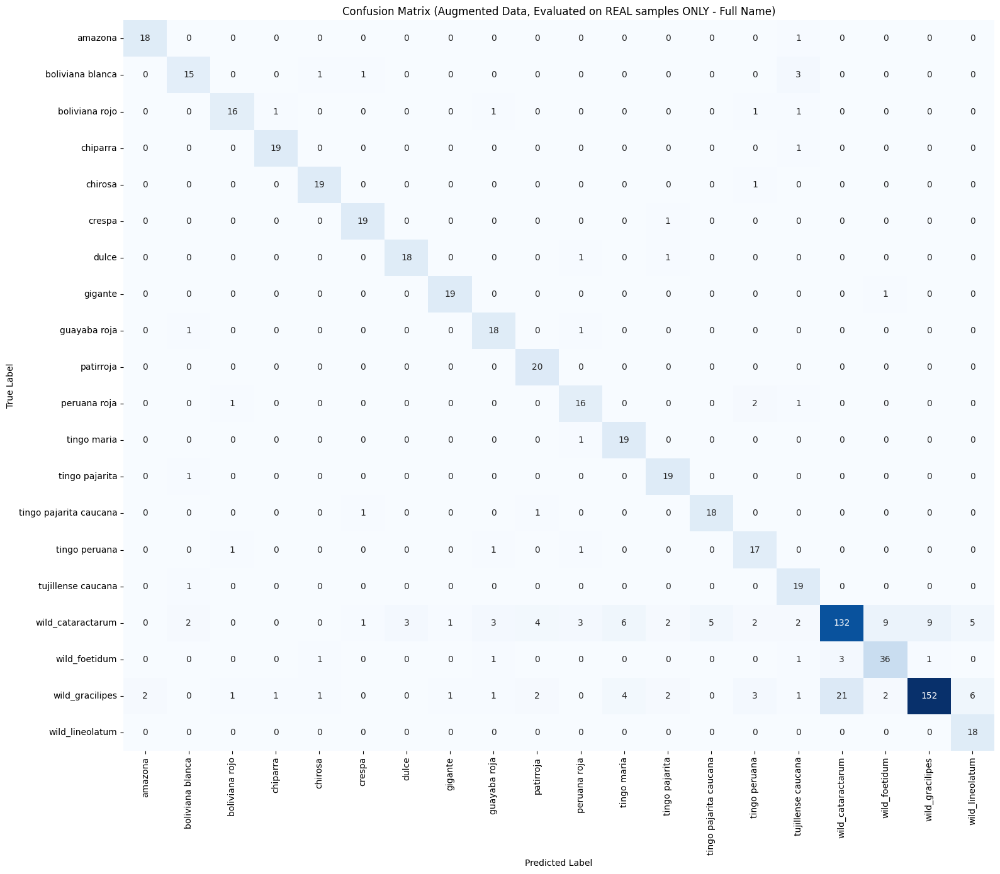

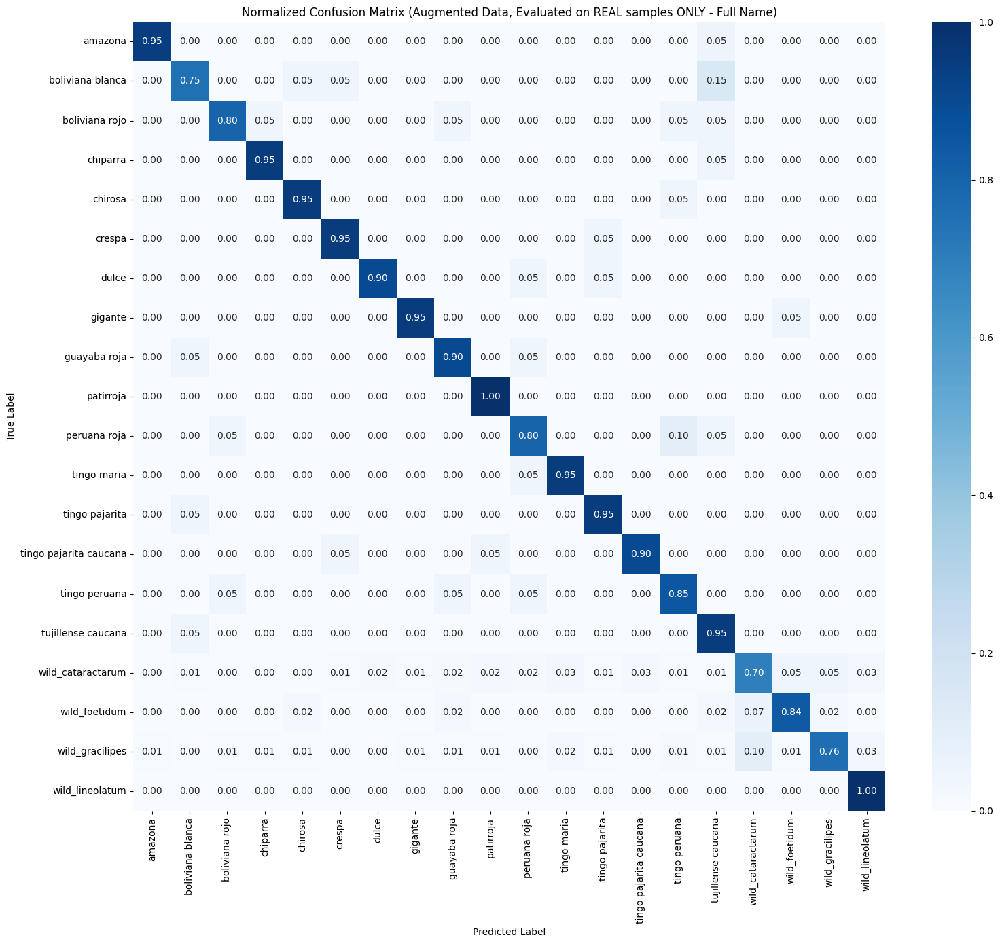

In [24]:
import numpy as np
import pandas as pd
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# --- Assume these are already loaded/defined in your notebook ---
# proc_arr: (769, 99, 2) numpy array (Original Procrustes coordinates)
# all_mdata: pandas DataFrame (Original metadata with 'full_name', 'PC1', 'PC2')

# --- NEW: Re-initialize and fit PCA with maximum components (198) ---
X_original = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])
y_original = all_mdata['full_name'] # Or 'type_name' for the other analysis

# Fit PCA on the full 198 features
pca_full = PCA(n_components=None, random_state=42)
pca_full.fit(X_original)

# Now, transform X_original to get scores for ALL components (198 of them)
X_pca_original_full = pca_full.transform(X_original)

print(f"Shape of X_original: {X_original.shape}")
print(f"Number of components in your fitted PCA object (`pca_full`): {pca_full.n_components_}")
print(f"Shape of X_pca_original_full (after pca_full.transform): {X_pca_original_full.shape}")

# --- Data Augmentation: SMOTE-like in FULL PCA space (198 components) ---

print("\n--- Starting Data Augmentation ---")

# Calculate value counts to determine target size and identify minority classes
class_counts = y_original.value_counts()
max_samples = class_counts.max() # Target size for all classes

# Initialize lists to store augmented data AND a flag for real/synthetic
augmented_X_pca = X_pca_original_full.tolist()
augmented_y = y_original.tolist()
is_real_flag = [True] * len(y_original) # All original samples are real

# Iterate through each class to perform augmentation
for class_name, count in class_counts.items():
    if count < max_samples:
        samples_to_generate = max_samples - count
        print(f"Augmenting class '{class_name}': generating {samples_to_generate} new samples.")

        class_indices = y_original[y_original == class_name].index
        class_pca_samples = X_pca_original_full[class_indices]

        n_neighbors_for_class = min(len(class_pca_samples), 6)
        if n_neighbors_for_class < 2:
            print(f"Warning: Class '{class_name}' has too few samples ({len(class_pca_samples)}) for meaningful augmentation. Skipping.")
            continue

        nn = NearestNeighbors(n_neighbors=n_neighbors_for_class).fit(class_pca_samples)
        distances, indices = nn.kneighbors(class_pca_samples)

        generated_count = 0
        while generated_count < samples_to_generate:
            idx_in_class = np.random.randint(0, len(class_pca_samples))
            sample = class_pca_samples[idx_in_class]

            if len(indices[idx_in_class]) < 2:
                 continue

            neighbor_idx_in_nn_output = np.random.randint(1, len(indices[idx_in_class]))
            neighbor_original_idx_in_class_pca = indices[idx_in_class][neighbor_idx_in_nn_output]
            neighbor = class_pca_samples[neighbor_original_idx_in_class_pca]

            alpha = np.random.rand()
            synthetic_pca_sample = sample + alpha * (neighbor - sample)

            augmented_X_pca.append(synthetic_pca_sample)
            augmented_y.append(class_name)
            is_real_flag.append(False) # Mark as synthetic
            generated_count += 1

print("--- Data Augmentation Complete ---")

# Convert augmented data lists to numpy arrays
X_pca_augmented_full = np.array(augmented_X_pca)
y_augmented = np.array(augmented_y)
is_real_flag = np.array(is_real_flag) # Convert flag to numpy array

# Inverse transform the augmented PCA data back to original feature space (198 features)
X_augmented = pca_full.inverse_transform(X_pca_augmented_full)

# Verify shapes
print(f"\nOriginal data shape (X_original): {X_original.shape}")
print(f"Augmented data shape (X_augmented): {X_augmented.shape}")
print(f"Augmented real/synthetic flag shape: {is_real_flag.shape}")
print(f"Original label counts:\n{y_original.value_counts()}")
print(f"Augmented label counts:\n{pd.Series(y_augmented).value_counts()}")


# --- Re-run LDA with Stratified K-Fold on Augmented Data, Evaluate on REAL samples ---

print(f"\n--- Performing LDA with {n_splits}-Fold Stratified Cross-Validation on AUGMENTED 'full_name' data (Evaluating on REAL samples) ---")

n_splits = 5
skf_augmented = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Store results for aggregation (ONLY for real samples)
all_y_true_real = []
all_y_pred_real = []

# Iterate through folds on augmented data
for fold_idx, (train_index, test_index) in enumerate(skf_augmented.split(X_augmented, y_augmented)):
    print(f"\nFold {fold_idx + 1}/{n_splits} (Augmented Data Split)")

    # TRAIN on the full (real + synthetic) training fold
    X_train_aug, X_test_aug = X_augmented[train_index], X_augmented[test_index]
    y_train_aug, y_test_aug = y_augmented[train_index], y_augmented[test_index]
    is_real_test_fold = is_real_flag[test_index] # Get real/synthetic flags for current test fold

    n_components_lda = min(len(np.unique(y_augmented)) - 1, X_augmented.shape[1])
    lda_aug = LinearDiscriminantAnalysis(n_components=n_components_lda)

    lda_aug.fit(X_train_aug, y_train_aug) # Fit on augmented training data
    y_pred_on_test_fold = lda_aug.predict(X_test_aug) # Predict on augmented test data

    # Filter to get ONLY real samples from the test fold
    y_test_real_samples = y_test_aug[is_real_test_fold]
    y_pred_real_samples = y_pred_on_test_fold[is_real_test_fold]

    # Store true and predicted labels for overall confusion matrix (only real samples)
    all_y_true_real.extend(y_test_real_samples)
    all_y_pred_real.extend(y_pred_real_samples)

# Convert lists to numpy arrays for sklearn metrics
all_y_true_real = np.array(all_y_true_real)
all_y_pred_real = np.array(all_y_pred_real)

# Get unique class names from the ORIGINAL data for consistent plotting/reporting
class_names_original = sorted(y_original.unique())

# --- Calculate and Visualize Confusion Matrix (Evaluation on REAL samples ONLY) ---

overall_accuracy_real = accuracy_score(all_y_true_real, all_y_pred_real)
print(f"\n--- Overall Accuracy (Augmented Data, Evaluated on REAL samples ONLY - Full Name): {overall_accuracy_real:.4f} ---")

print("\n--- Classification Report (Augmented Data, Evaluated on REAL samples ONLY - Full Name) ---")
# Use class_names_original to ensure all original classes are in the report, even if some have 0 support in this specific view
print(classification_report(all_y_true_real, all_y_pred_real, target_names=class_names_original, zero_division=0))

cm_real = confusion_matrix(all_y_true_real, all_y_pred_real, labels=class_names_original)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names_original, yticklabels=class_names_original)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Augmented Data, Evaluated on REAL samples ONLY - Full Name)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real = cm_real.astype('float') / cm_real.sum(axis=1)[:, np.newaxis]
cm_normalized_real[np.isnan(cm_normalized_real)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names_original, yticklabels=class_names_original)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Normalized Confusion Matrix (Augmented Data, Evaluated on REAL samples ONLY - Full Name)')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- You would not typically plot LDA scores for real-only test data, as the axes
# are learned from the full augmented data. The focus here is on the metrics.

### `full_name` results
```python
--- Overall Accuracy (Augmented Data, Evaluated on REAL samples ONLY - Full Name): 0.8140 ---

--- Classification Report (Augmented Data, Evaluated on REAL samples ONLY - Full Name) ---
                        precision    recall  f1-score   support

               amazona       0.82      0.95      0.88        19
      boliviana blanca       0.72      0.90      0.80        20
        boliviana rojo       0.91      1.00      0.95        20
              chiparra       0.83      1.00      0.91        20
               chirosa       0.82      0.90      0.86        20
                crespa       0.95      0.95      0.95        20
                 dulce       0.78      0.90      0.84        20
               gigante       0.86      0.95      0.90        20
          guayaba roja       0.61      0.85      0.71        20
             patirroja       0.79      0.95      0.86        20
          peruana roja       0.71      0.85      0.77        20
           tingo maria       0.70      0.95      0.81        20
        tingo pajarita       0.86      0.90      0.88        20
tingo pajarita caucana       0.79      0.95      0.86        20
         tingo peruana       0.71      0.75      0.73        20
    tujillense caucana       0.70      0.80      0.74        20
     wild_cataractarum       0.82      0.69      0.75       189
         wild_foetidum       0.76      0.81      0.79        43
       wild_gracilipes       0.95      0.77      0.85       200
       wild_lineolatum       0.58      1.00      0.73        18

              accuracy                           0.81       769
             macro avg       0.78      0.89      0.83       769
          weighted avg       0.83      0.81      0.81       769
```

### `type_name` results

```python
--- Overall Accuracy (Augmented Data, Evaluated on REAL samples ONLY - Full Name): 0.7451 ---

--- Classification Report (Augmented Data, Evaluated on REAL samples ONLY - Full Name) ---
                   precision    recall  f1-score   support

             coca       0.77      0.61      0.68       180
            ipadu       0.51      0.65      0.57        79
   novogranatense       0.62      0.95      0.75        40
      truxillense       0.63      0.95      0.76        20
wild_cataractarum       0.81      0.72      0.77       189
    wild_foetidum       0.64      0.98      0.77        43
  wild_gracilipes       0.92      0.80      0.86       200
  wild_lineolatum       0.61      0.94      0.74        18

         accuracy                           0.75       769
        macro avg       0.69      0.82      0.74       769
     weighted avg       0.77      0.75      0.75       769
```

# Convolutional Neural Network on images

Shape of X_original: (769, 198)
Number of components in your fitted PCA object (`pca_full`): 198
Shape of X_pca_original_full (after pca_full.transform): (769, 198)

--- Starting Data Augmentation ---
Augmenting class 'wild_cataractarum': generating 11 new samples.
Augmenting class 'coca': generating 20 new samples.
Augmenting class 'ipadu': generating 121 new samples.
Augmenting class 'wild_foetidum': generating 157 new samples.
Augmenting class 'novogranatense': generating 160 new samples.
Augmenting class 'truxillense': generating 180 new samples.
Augmenting class 'wild_lineolatum': generating 182 new samples.
--- Data Augmentation Complete ---

Original data shape (X_original): (769, 198)
Augmented data shape (X_augmented): (1600, 198)
Augmented real/synthetic flag shape: (1600,)
Original label counts:
type_name
wild_gracilipes      200
wild_cataractarum    189
coca                 180
ipadu                 79
wild_foetidum         43
novogranatense        40
truxillense           

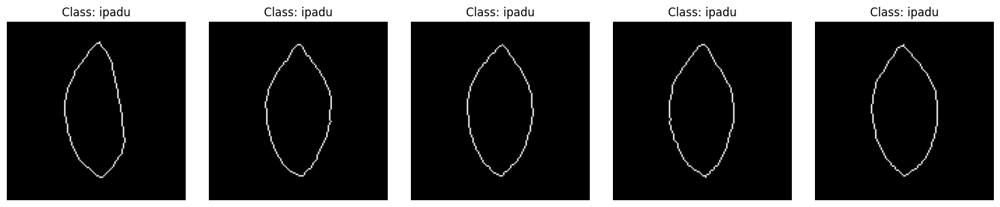

In [25]:
import numpy as np
import pandas as pd
import cv2 # OpenCV for image drawing
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import StratifiedKFold
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# --- Assume these are already loaded/defined in your notebook ---
# proc_arr: (769, 99, 2) numpy array (Original Procrustes coordinates)
# all_mdata: pandas DataFrame (Original metadata with 'full_name', 'PC1', 'PC2')

# Define the target classification task (e.g., 'full_name' or 'type_name')
TARGET_COLUMN = 'type_name' # Change to 'type_name' if you want to analyze type_name images

# --- Data Preparation (Original Data) ---
X_original = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])
y_original = all_mdata[TARGET_COLUMN]

# --- NEW: Re-initialize and fit PCA with maximum components (198) ---
# This is CRITICAL for inverse_transform to work correctly later.
pca_full = PCA(n_components=None, random_state=42)
pca_full.fit(X_original)

# Now, transform X_original to get scores for ALL components (198 of them)
X_pca_original_full = pca_full.transform(X_original)

print(f"Shape of X_original: {X_original.shape}")
print(f"Number of components in your fitted PCA object (`pca_full`): {pca_full.n_components_}")
print(f"Shape of X_pca_original_full (after pca_full.transform): {X_pca_original_full.shape}")

# --- Data Augmentation: SMOTE-like in FULL PCA space (198 components) ---

print("\n--- Starting Data Augmentation ---")

class_counts = y_original.value_counts()
max_samples = class_counts.max() # Target size for all classes

augmented_X_pca = X_pca_original_full.tolist()
augmented_y = y_original.tolist()
is_real_flag = [True] * len(y_original)

for class_name, count in class_counts.items():
    if count < max_samples:
        samples_to_generate = max_samples - count
        print(f"Augmenting class '{class_name}': generating {samples_to_generate} new samples.")

        class_indices = y_original[y_original == class_name].index
        class_pca_samples = X_pca_original_full[class_indices]

        n_neighbors_for_class = min(len(class_pca_samples), 6)
        if n_neighbors_for_class < 2:
            print(f"Warning: Class '{class_name}' has too few samples ({len(class_pca_samples)}) for meaningful augmentation. Skipping.")
            continue

        nn = NearestNeighbors(n_neighbors=n_neighbors_for_class).fit(class_pca_samples)
        distances, indices = nn.kneighbors(class_pca_samples)

        generated_count = 0
        while generated_count < samples_to_generate:
            idx_in_class = np.random.randint(0, len(class_pca_samples))
            sample = class_pca_samples[idx_in_class]

            if len(indices[idx_in_class]) < 2:
                 continue

            neighbor_idx_in_nn_output = np.random.randint(1, len(indices[idx_in_class]))
            # CORRECTED LINE BELOW:
            neighbor_original_idx_in_class_pca = indices[idx_in_class][neighbor_idx_in_nn_output]
            neighbor = class_pca_samples[neighbor_original_idx_in_class_pca]

            alpha = np.random.rand()
            synthetic_pca_sample = sample + alpha * (neighbor - sample)

            augmented_X_pca.append(synthetic_pca_sample)
            augmented_y.append(class_name)
            is_real_flag.append(False)
            generated_count += 1

print("--- Data Augmentation Complete ---")

X_pca_augmented_full = np.array(augmented_X_pca)
y_augmented = np.array(augmented_y)
is_real_flag = np.array(is_real_flag)

X_augmented = pca_full.inverse_transform(X_pca_augmented_full)

print(f"\nOriginal data shape (X_original): {X_original.shape}")
print(f"Augmented data shape (X_augmented): {X_augmented.shape}")
print(f"Augmented real/synthetic flag shape: {is_real_flag.shape}")
print(f"Original label counts:\n{y_original.value_counts()}")
print(f"Augmented label counts:\n{pd.Series(y_augmented).value_counts()}")

# Reshape X_augmented back to 3D Procrustes coordinates (samples, landmarks, coords)
num_samples_aug = X_augmented.shape[0]
num_landmarks = 99 # You have 99 landmarks
num_coords = 2 # X and Y coordinates
proc_arr_augmented = X_augmented.reshape(num_samples_aug, num_landmarks, num_coords)
print(f"Reshaped augmented Procrustes data to 3D array: {proc_arr_augmented.shape}")


# --- Image Generation Setup ---

# Determine global min/max coordinates across ALL augmented leaves for consistent scaling
# Combine all X and Y coordinates from all leaves
all_x_coords = proc_arr_augmented[:, :, 0].flatten()
all_y_coords = proc_arr_augmented[:, :, 1].flatten()

min_x, max_x = np.min(all_x_coords), np.max(all_x_coords)
min_y, max_y = np.min(all_y_coords), np.max(all_y_coords)

# Calculate the dimensions of the overall bounding box
data_width = max_x - min_x
data_height = max_y - min_y

# Define target image size (e.g., 128x128 pixels, including padding)
# We'll make it square to simplify CNN input
IMAGE_SIZE = 128 # You can adjust this (e.g., 256)
PADDING = 10     # Pixels of padding around the largest leaf outline

# Calculate scaling factor and offset to fit all data within the image size
# The scale factor should be applied to both x and y to maintain aspect ratio
scale_factor = min((IMAGE_SIZE - 2 * PADDING) / data_width, (IMAGE_SIZE - 2 * PADDING) / data_height)

# Offset to center the scaled data in the image
offset_x = (IMAGE_SIZE / 2) - (data_width / 2 * scale_factor) - (min_x * scale_factor)
offset_y = (IMAGE_SIZE / 2) - (data_height / 2 * scale_factor) - (min_y * scale_factor)


def create_leaf_image(coords_2d, img_size, scale_factor_val, offset_x_val, offset_y_val):
    """
    Creates a grayscale image of a leaf outline from 2D Procrustes coordinates.
    """
    image = np.zeros((img_size, img_size), dtype=np.uint8)

    scaled_coords = np.copy(coords_2d)

    scaled_coords[:, 0] = (scaled_coords[:, 0] * scale_factor_val) + offset_x_val
    scaled_coords[:, 1] = (scaled_coords[:, 1] * scale_factor_val) + offset_y_val

    pixel_coords = np.array(scaled_coords).astype(np.int32)

    pixel_coords[:, 0] = np.clip(pixel_coords[:, 0], 0, img_size - 1)
    pixel_coords[:, 1] = np.clip(pixel_coords[:, 1], 0, img_size - 1)

    cv2.polylines(image, [pixel_coords], isClosed=True, color=255, thickness=1)

    return image

# --- Generate images for all augmented data ---
print(f"\n--- Generating {len(proc_arr_augmented)} images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")
augmented_images = []
for i in range(len(proc_arr_augmented)):
    leaf_coords = proc_arr_augmented[i]
    img = create_leaf_image(leaf_coords, IMAGE_SIZE, scale_factor, offset_x, offset_y)
    augmented_images.append(img)

# Convert list of images to a single NumPy array
X_images_augmented = np.array(augmented_images)

# Reshape for CNN input: (num_samples, img_height, img_width, channels)
# For grayscale, channels = 1
X_images_augmented = X_images_augmented.reshape(-1, IMAGE_SIZE, IMAGE_SIZE, 1)

print(f"Shape of generated image dataset (X_images_augmented): {X_images_augmented.shape}")

# --- Visualize a few generated images to verify ---
print("\n--- Displaying a few generated leaf images ---")
num_display = min(5, X_images_augmented.shape[0])
plt.figure(figsize=(num_display * 3, 3))
for i in range(num_display):
    plt.subplot(1, num_display, i + 1)
    plt.imshow(X_images_augmented[i, :, :, 0], cmap='gray')
    plt.title(f"Class: {y_augmented[i]}")
    plt.axis('off')
plt.tight_layout()
plt.show()

# --- Now you have X_images_augmented and y_augmented (and is_real_flag) ready for CNN ---

## `full_name`


--- Starting Data Augmentation ---
Augmenting class 'wild_cataractarum': generating 11 new samples.
Augmenting class 'wild_foetidum': generating 157 new samples.
Augmenting class 'tujillense caucana': generating 180 new samples.
Augmenting class 'tingo peruana': generating 180 new samples.
Augmenting class 'tingo pajarita caucana': generating 180 new samples.
Augmenting class 'tingo maria': generating 180 new samples.
Augmenting class 'tingo pajarita': generating 180 new samples.
Augmenting class 'boliviana blanca': generating 180 new samples.
Augmenting class 'peruana roja': generating 180 new samples.
Augmenting class 'guayaba roja': generating 180 new samples.
Augmenting class 'gigante': generating 180 new samples.
Augmenting class 'dulce': generating 180 new samples.
Augmenting class 'crespa': generating 180 new samples.
Augmenting class 'chirosa': generating 180 new samples.
Augmenting class 'chiparra': generating 180 new samples.
Augmenting class 'boliviana rojo': generating 180

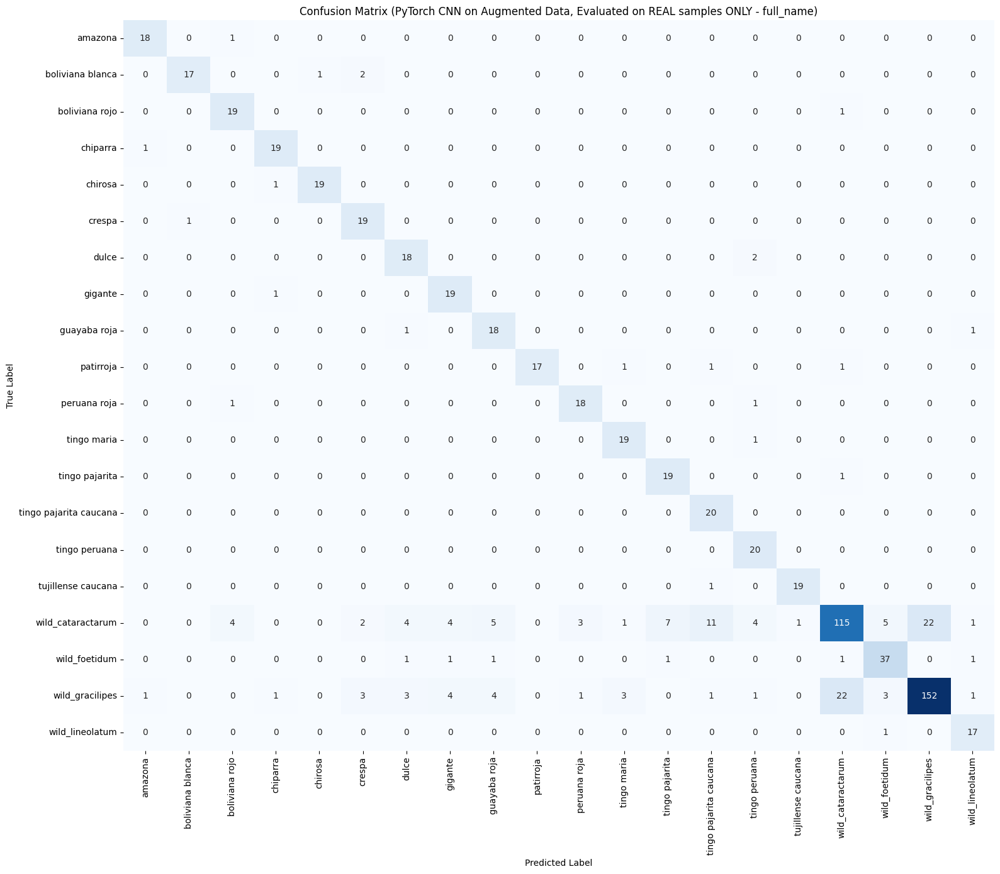

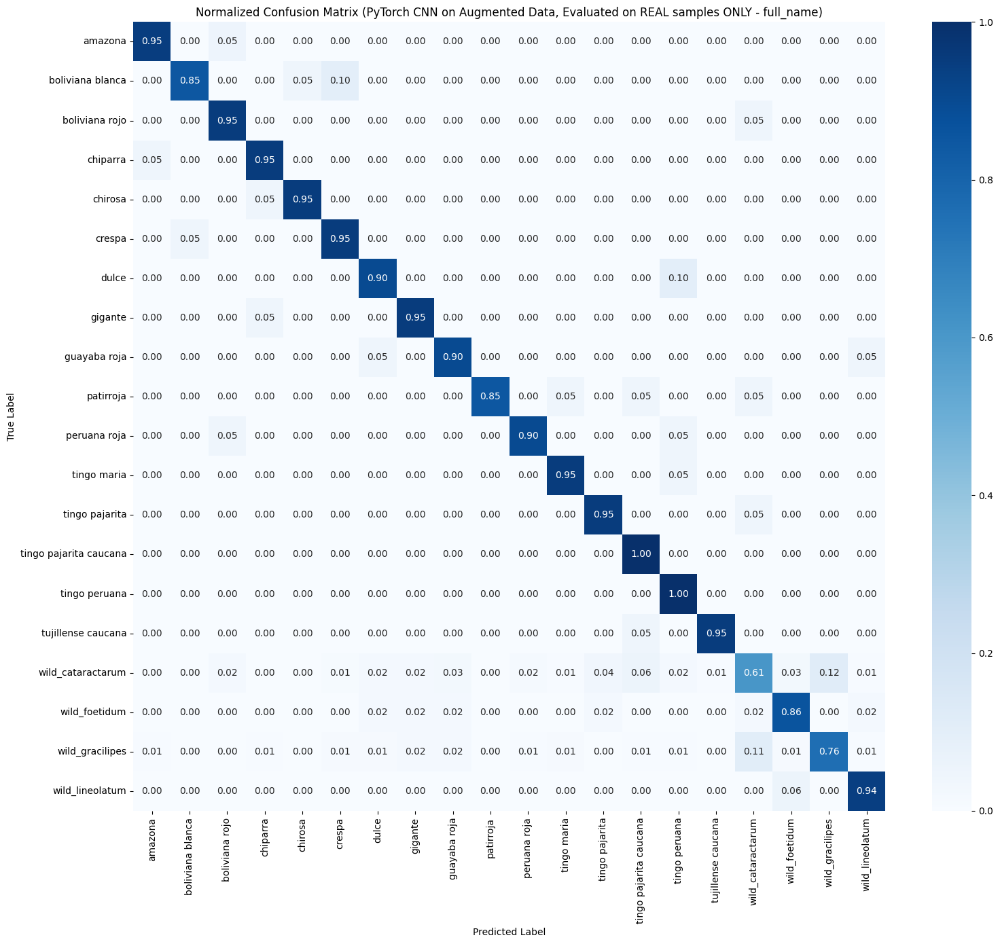

In [29]:
import numpy as np
import pandas as pd
import cv2 # OpenCV for image drawing
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch Imports
import torch
import torch.nn as tnn # Changed alias from nn to tnn to avoid conflicts
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# --- Assume these are already loaded/defined in your notebook ---
# proc_arr: (769, 99, 2) numpy array (Original Procrustes coordinates)
# all_mdata: pandas DataFrame (Original metadata with 'full_name', 'PC1', 'PC2')

# Define the target classification task (e.g., 'full_name' or 'type_name')
TARGET_COLUMN = 'full_name' # Change to 'type_name' if you want to analyze type_name images

# --- Data Preparation (Original Data) ---
X_original = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])
y_original = all_mdata[TARGET_COLUMN]

# --- Re-initialize and fit PCA with maximum components (198) ---
pca_full = PCA(n_components=None, random_state=42)
pca_full.fit(X_original)

X_pca_original_full = pca_full.transform(X_original)

# --- Data Augmentation: SMOTE-like in FULL PCA space (198 components) ---
print("\n--- Starting Data Augmentation ---")
class_counts = y_original.value_counts()
max_samples = class_counts.max()

augmented_X_pca = X_pca_original_full.tolist()
augmented_y = y_original.tolist()
is_real_flag = [True] * len(y_original)

for class_name, count in class_counts.items():
    if count < max_samples:
        samples_to_generate = max_samples - count
        print(f"Augmenting class '{class_name}': generating {samples_to_generate} new samples.")

        class_indices = y_original[y_original == class_name].index
        class_pca_samples = X_pca_original_full[class_indices]

        n_neighbors_for_class = min(len(class_pca_samples), 6)
        if n_neighbors_for_class < 2:
            print(f"Warning: Class '{class_name}' has too few samples ({len(class_pca_samples)}) for meaningful augmentation. Skipping.")
            continue

        nn_model = NearestNeighbors(n_neighbors=n_neighbors_for_class).fit(class_pca_samples) # Renamed nn to nn_model
        distances, indices = nn_model.kneighbors(class_pca_samples) # Renamed nn to nn_model

        generated_count = 0
        while generated_count < samples_to_generate:
            idx_in_class = np.random.randint(0, len(class_pca_samples))
            sample = class_pca_samples[idx_in_class]

            if len(indices[idx_in_class]) < 2:
                 continue

            neighbor_idx_in_nn_output = np.random.randint(1, len(indices[idx_in_class]))
            neighbor_original_idx_in_class_pca = indices[idx_in_class][neighbor_idx_in_nn_output]
            neighbor = class_pca_samples[neighbor_original_idx_in_class_pca]

            alpha = np.random.rand()
            synthetic_pca_sample = sample + alpha * (neighbor - sample)

            augmented_X_pca.append(synthetic_pca_sample)
            augmented_y.append(class_name)
            is_real_flag.append(False)
            generated_count += 1
print("--- Data Augmentation Complete ---")

X_pca_augmented_full = np.array(augmented_X_pca)
y_augmented = np.array(augmented_y)
is_real_flag = np.array(is_real_flag)

X_augmented = pca_full.inverse_transform(X_pca_augmented_full)

num_samples_aug = X_augmented.shape[0]
num_landmarks = 99
num_coords = 2
proc_arr_augmented = X_augmented.reshape(num_samples_aug, num_landmarks, num_coords)

# --- Image Generation Setup ---

all_x_coords = proc_arr_augmented[:, :, 0].flatten()
all_y_coords = proc_arr_augmented[:, :, 1].flatten()

min_x, max_x = np.min(all_x_coords), np.max(all_x_coords)
min_y, max_y = np.min(all_y_coords), np.max(all_y_coords)

data_width = max_x - min_x
data_height = max_y - min_y

# Revert to 128x128 for PyTorch, as it's more memory efficient on MPS
IMAGE_SIZE = 128
PADDING = 10

scale_factor = min((IMAGE_SIZE - 2 * PADDING) / data_width, (IMAGE_SIZE - 2 * PADDING) / data_height)

offset_x = (IMAGE_SIZE / 2) - (data_width / 2 * scale_factor) - (min_x * scale_factor)
offset_y = (IMAGE_SIZE / 2) - (data_height / 2 * scale_factor) - (min_y * scale_factor)

def create_leaf_image(coords_2d, img_size, scale_factor_val, offset_x_val, offset_y_val):
    image = np.zeros((img_size, img_size), dtype=np.uint8)
    scaled_coords = np.copy(coords_2d)
    scaled_coords[:, 0] = (scaled_coords[:, 0] * scale_factor_val) + offset_x_val
    scaled_coords[:, 1] = (scaled_coords[:, 1] * scale_factor_val) + offset_y_val
    pixel_coords = np.array(scaled_coords).astype(np.int32)
    pixel_coords[:, 0] = np.clip(pixel_coords[:, 0], 0, img_size - 1)
    pixel_coords[:, 1] = np.clip(pixel_coords[:, 1], 0, img_size - 1)
    cv2.polylines(image, [pixel_coords], isClosed=True, color=255, thickness=1)
    return image

print(f"\n--- Generating {num_samples_aug} images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")
augmented_images = []
for i in range(len(proc_arr_augmented)):
    leaf_coords = proc_arr_augmented[i]
    img = create_leaf_image(leaf_coords, IMAGE_SIZE, scale_factor, offset_x, offset_y)
    augmented_images.append(img)

X_images_augmented = np.array(augmented_images)

# PyTorch expects (Batch, Channels, Height, Width)
X_images_augmented = X_images_augmented.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated image dataset (X_images_augmented): {X_images_augmented.shape}")


# --- PyTorch Data Preparation ---

# 1. Label Encoding for y_augmented
label_encoder = LabelEncoder()
integer_encoded_y = label_encoder.fit_transform(y_augmented)

# Get the list of original class names in the order of label_encoder
class_names_pt = label_encoder.classes_
num_classes = len(class_names_pt)

print(f"Number of classes for PyTorch CNN: {num_classes}")

# 2. Convert to PyTorch Tensors and Normalize Image Data
# Images: Convert to float32 and normalize (0-255 to 0.0-1.0)
X_images_augmented_tensor = torch.from_numpy(X_images_augmented).float() / 255.0
# Labels: Convert to long tensor (for CrossEntropyLoss)
y_augmented_tensor = torch.from_numpy(integer_encoded_y).long()

# is_real_flag: Convert to boolean tensor (for filtering)
is_real_flag_tensor = torch.from_numpy(is_real_flag).bool()


# Create a custom PyTorch Dataset
class LeafDataset(Dataset):
    def __init__(self, images, labels, is_real_flags):
        self.images = images
        self.labels = labels
        self.is_real_flags = is_real_flags

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx], self.is_real_flags[idx]

# --- Define PyTorch CNN Model Architecture ---

class LeafCNN(tnn.Module): # Corrected from nn.Module to tnn.Module
    def __init__(self, num_classes):
        super(LeafCNN, self).__init__()
        self.features = tnn.Sequential( # Corrected from nn.Sequential to tnn.Sequential
            # Convolutional Layer 1
            tnn.Conv2d(1, 32, kernel_size=3, padding=0), # Corrected from nn.Conv2d to tnn.Conv2d
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.MaxPool2d(kernel_size=2, stride=2), # Corrected from nn.MaxPool2d to tnn.MaxPool2d
            tnn.Dropout(0.25), # Corrected from nn.Dropout to tnn.Dropout

            # Convolutional Layer 2
            tnn.Conv2d(32, 64, kernel_size=3, padding=0), # Corrected from nn.Conv2d to tnn.Conv2d
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.MaxPool2d(kernel_size=2, stride=2), # Corrected from nn.MaxPool2d to tnn.MaxPool2d
            tnn.Dropout(0.25), # Corrected from nn.Dropout to tnn.Dropout

            # Convolutional Layer 3
            tnn.Conv2d(64, 128, kernel_size=3, padding=0), # Corrected from nn.Conv2d to tnn.Conv2d
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.MaxPool2d(kernel_size=2, stride=2), # Corrected from nn.MaxPool2d to tnn.MaxPool2d
            tnn.Dropout(0.25) # Corrected from nn.Dropout to tnn.Dropout
        )
        # Calculate the size of the flattened features dynamically
        # For 128x128 input, (128-2)/2 = 63, (63-2)/2 = 30.5 -> 30, (30-2)/2 = 14
        # So, the final feature map size is 14x14x128
        self.classifier = tnn.Sequential( # Corrected from nn.Sequential to tnn.Sequential
            tnn.Flatten(), # Corrected from nn.Flatten to tnn.Flatten
            tnn.Linear(128 * 14 * 14, 256), # Corrected from nn.Linear to tnn.Linear
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.Dropout(0.5), # Corrected from nn.Dropout to tnn.Dropout
            tnn.Linear(256, num_classes) # Corrected from nn.Linear to tnn.Linear
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Determine the device (MPS for Apple Silicon, or CPU)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

# --- PyTorch CNN Training and Evaluation with Stratified K-Fold (Evaluate on REAL samples ONLY) ---

print(f"\n--- Performing PyTorch CNN with {n_splits}-Fold Stratified Cross-Validation on AUGMENTED image data (Evaluating on REAL samples) ---")

n_splits = 5 # Using 5-fold cross-validation
skf_pytorch = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Lists to store results from real samples across all folds
all_y_true_real_pt = []
all_y_pred_real_pt = []

# Training parameters
BATCH_SIZE = 32 # Reverted to 32, as PyTorch MPS might handle it better
EPOCHS = 50
LEARNING_RATE = 0.001
PATIENCE = 10 # For early stopping

# Iterate through folds
for fold_idx, (train_index, test_index) in enumerate(skf_pytorch.split(X_images_augmented_tensor.cpu().numpy(), y_augmented_tensor.cpu().numpy())):
    print(f"\n--- Fold {fold_idx + 1}/{n_splits} ---")

    # Create datasets and dataloaders for the current fold
    train_dataset = LeafDataset(X_images_augmented_tensor[train_index],
                                y_augmented_tensor[train_index],
                                is_real_flag_tensor[train_index])
    test_dataset = LeafDataset(X_images_augmented_tensor[test_index],
                               y_augmented_tensor[test_index],
                               is_real_flag_tensor[test_index])

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0) # num_workers=0 for MPS compatibility often
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Initialize model, loss function, and optimizer for the current fold
    model = LeafCNN(num_classes=num_classes).to(device) # Move model to device
    criterion = tnn.CrossEntropyLoss() # Corrected from nn.CrossEntropyLoss to tnn.CrossEntropyLoss
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Early stopping variables
    best_val_loss = float('inf')
    epochs_no_improve = 0

    # Training loop for the fold
    for epoch in range(EPOCHS):
        model.train() # Set model to training mode
        running_loss = 0.0
        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device) # Move data to device

            optimizer.zero_grad() # Zero the parameter gradients
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)

        # Validation phase
        model.eval() # Set model to evaluation mode
        val_loss = 0.0
        correct_predictions = 0
        total_samples = 0
        with torch.no_grad(): # Disable gradient calculations for validation
            for images, labels, _ in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs.data, 1)
                total_samples += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        avg_train_loss = running_loss / len(train_loader.dataset)
        avg_val_loss = val_loss / len(test_loader.dataset)
        val_accuracy = correct_predictions / total_samples

        print(f"Epoch {epoch+1}/{EPOCHS}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}") # Added print for progress

        # Early stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            # Optional: Save the best model weights here if you need them later
            # torch.save(model.state_dict(), f'best_model_fold_{fold_idx}.pth')
        else:
            epochs_no_improve += 1
            if epochs_no_improve == PATIENCE:
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.") # Added print for early stopping
                break # Exit epoch loop

    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    # --- Collect predictions for REAL samples in the test fold ---
    model.eval() # Set model to evaluation mode
    y_true_real_fold = []
    y_pred_real_fold = []
    with torch.no_grad():
        for images, labels, is_real in test_loader:
            # Filter for real samples in the current batch
            # Ensure images and labels are on the correct device for the filtered subset
            real_images = images[is_real].to(device) # Apply boolean indexing directly on device
            real_labels = labels[is_real].cpu().numpy() # Move true labels to CPU for later numpy conversion

            if len(real_images) > 0: # Only predict if there are real samples in this batch
                outputs = model(real_images)
                _, predicted_real = torch.max(outputs.data, 1)

                y_true_real_fold.extend(real_labels)
                y_pred_real_fold.extend(predicted_real.cpu().numpy()) # Move predictions to CPU

    all_y_true_real_pt.extend(y_true_real_fold)
    all_y_pred_real_pt.extend(y_pred_real_fold)


# Convert stored results to numpy arrays
all_y_true_real_pt = np.array(all_y_true_real_pt)
all_y_pred_real_pt = np.array(all_y_pred_real_pt)

# Convert integer labels back to original class names for report/matrix
all_y_true_real_pt_names = label_encoder.inverse_transform(all_y_true_real_pt)
all_y_pred_real_pt_names = label_encoder.inverse_transform(all_y_pred_real_pt)

# --- Final Evaluation on REAL samples Only ---

overall_accuracy_real_pt = accuracy_score(all_y_true_real_pt_names, all_y_pred_real_pt_names)
print(f"\n--- Overall Accuracy (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy_real_pt:.4f} ---")

print(f"\n--- Classification Report (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
print(classification_report(all_y_true_real_pt_names, all_y_pred_real_pt_names, target_names=class_names_pt, zero_division=0))

# --- Confusion Matrix Visualization ---
cm_real_pt = confusion_matrix(all_y_true_real_pt_names, all_y_pred_real_pt_names, labels=class_names_pt)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names_pt, yticklabels=class_names_pt)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names_pt, yticklabels=class_names_pt)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## `type_name`


--- Starting Data Augmentation ---
Augmenting class 'wild_cataractarum': generating 11 new samples.
Augmenting class 'coca': generating 20 new samples.
Augmenting class 'ipadu': generating 121 new samples.
Augmenting class 'wild_foetidum': generating 157 new samples.
Augmenting class 'novogranatense': generating 160 new samples.
Augmenting class 'truxillense': generating 180 new samples.
Augmenting class 'wild_lineolatum': generating 182 new samples.
--- Data Augmentation Complete ---

--- Generating 1600 images with size 128x128 ---
Shape of generated image dataset (X_images_augmented): (1600, 1, 128, 128)
Number of classes for PyTorch CNN: 8
Using device: mps

--- Performing PyTorch CNN with 5-Fold Stratified Cross-Validation on AUGMENTED image data (Evaluating on REAL samples) ---

--- Fold 1/5 ---
Epoch 1/50, Train Loss: 2.0484, Val Loss: 1.7694, Val Acc: 0.3250
Epoch 2/50, Train Loss: 1.6736, Val Loss: 1.4418, Val Acc: 0.4375
Epoch 3/50, Train Loss: 1.4445, Val Loss: 1.2756, Val 

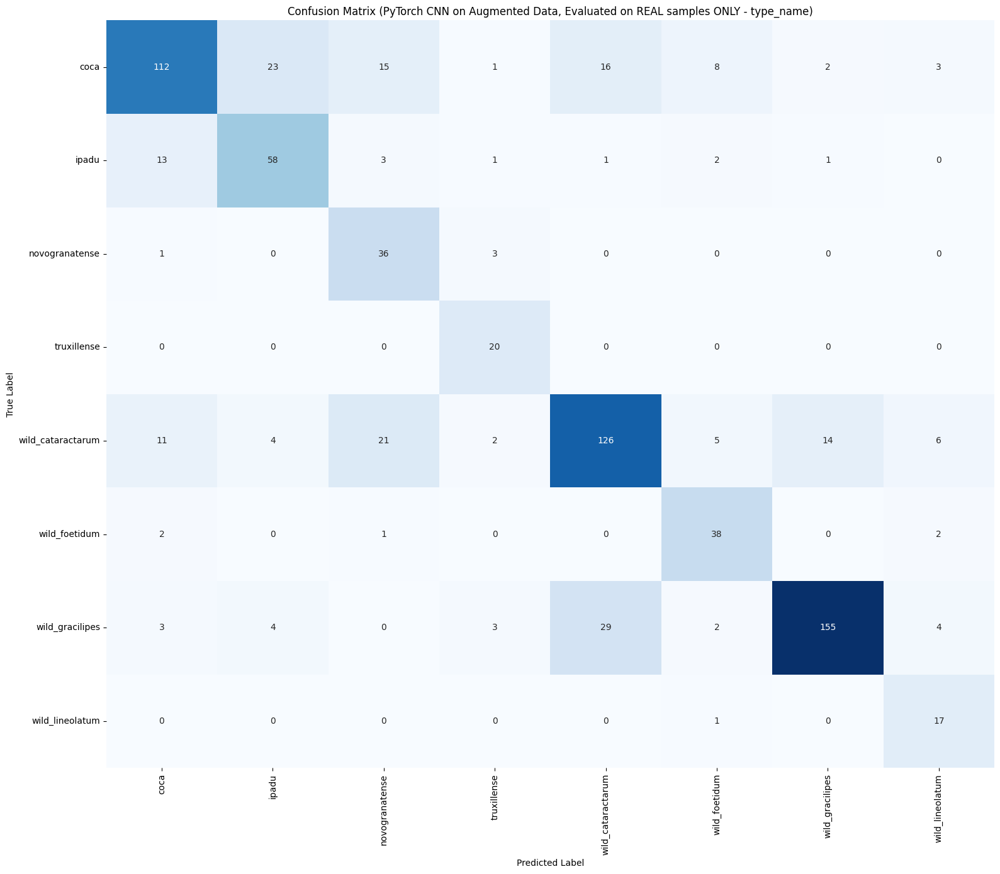

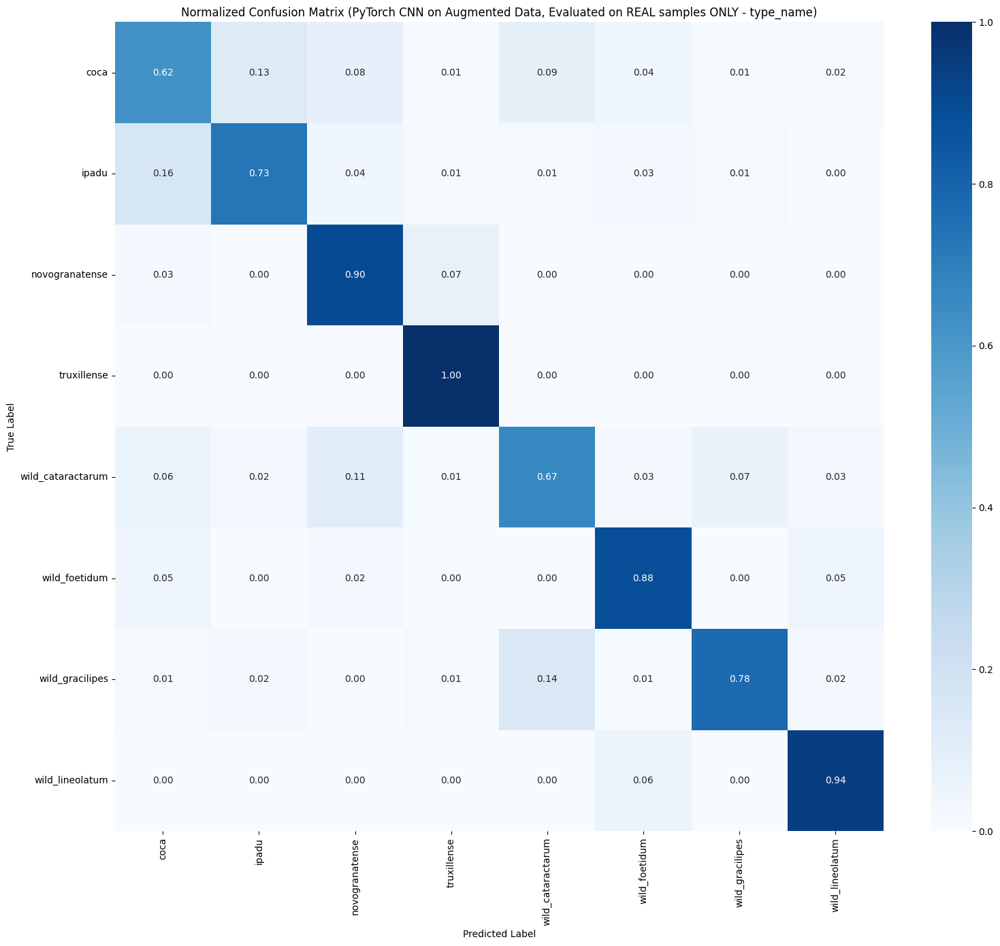

In [27]:
import numpy as np
import pandas as pd
import cv2 # OpenCV for image drawing
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch Imports
import torch
import torch.nn as tnn # Changed alias from nn to tnn to avoid conflicts
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader

# --- Assume these are already loaded/defined in your notebook ---
# proc_arr: (769, 99, 2) numpy array (Original Procrustes coordinates)
# all_mdata: pandas DataFrame (Original metadata with 'full_name', 'PC1', 'PC2')

# Define the target classification task (e.g., 'full_name' or 'type_name')
TARGET_COLUMN = 'type_name' # Change to 'type_name' if you want to analyze type_name images

# --- Data Preparation (Original Data) ---
X_original = proc_arr.reshape(np.shape(proc_arr)[0], np.shape(proc_arr)[1] * np.shape(proc_arr)[2])
y_original = all_mdata[TARGET_COLUMN]

# --- Re-initialize and fit PCA with maximum components (198) ---
pca_full = PCA(n_components=None, random_state=42)
pca_full.fit(X_original)

X_pca_original_full = pca_full.transform(X_original)

# --- Data Augmentation: SMOTE-like in FULL PCA space (198 components) ---
print("\n--- Starting Data Augmentation ---")
class_counts = y_original.value_counts()
max_samples = class_counts.max()

augmented_X_pca = X_pca_original_full.tolist()
augmented_y = y_original.tolist()
is_real_flag = [True] * len(y_original)

for class_name, count in class_counts.items():
    if count < max_samples:
        samples_to_generate = max_samples - count
        print(f"Augmenting class '{class_name}': generating {samples_to_generate} new samples.")

        class_indices = y_original[y_original == class_name].index
        class_pca_samples = X_pca_original_full[class_indices]

        n_neighbors_for_class = min(len(class_pca_samples), 6)
        if n_neighbors_for_class < 2:
            print(f"Warning: Class '{class_name}' has too few samples ({len(class_pca_samples)}) for meaningful augmentation. Skipping.")
            continue

        nn_model = NearestNeighbors(n_neighbors=n_neighbors_for_class).fit(class_pca_samples) # Renamed nn to nn_model
        distances, indices = nn_model.kneighbors(class_pca_samples) # Renamed nn to nn_model

        generated_count = 0
        while generated_count < samples_to_generate:
            idx_in_class = np.random.randint(0, len(class_pca_samples))
            sample = class_pca_samples[idx_in_class]

            if len(indices[idx_in_class]) < 2:
                 continue

            neighbor_idx_in_nn_output = np.random.randint(1, len(indices[idx_in_class]))
            neighbor_original_idx_in_class_pca = indices[idx_in_class][neighbor_idx_in_nn_output]
            neighbor = class_pca_samples[neighbor_original_idx_in_class_pca]

            alpha = np.random.rand()
            synthetic_pca_sample = sample + alpha * (neighbor - sample)

            augmented_X_pca.append(synthetic_pca_sample)
            augmented_y.append(class_name)
            is_real_flag.append(False)
            generated_count += 1
print("--- Data Augmentation Complete ---")

X_pca_augmented_full = np.array(augmented_X_pca)
y_augmented = np.array(augmented_y)
is_real_flag = np.array(is_real_flag)

X_augmented = pca_full.inverse_transform(X_pca_augmented_full)

num_samples_aug = X_augmented.shape[0]
num_landmarks = 99
num_coords = 2
proc_arr_augmented = X_augmented.reshape(num_samples_aug, num_landmarks, num_coords)

# --- Image Generation Setup ---

all_x_coords = proc_arr_augmented[:, :, 0].flatten()
all_y_coords = proc_arr_augmented[:, :, 1].flatten()

min_x, max_x = np.min(all_x_coords), np.max(all_x_coords)
min_y, max_y = np.min(all_y_coords), np.max(all_y_coords)

data_width = max_x - min_x
data_height = max_y - min_y

# Revert to 128x128 for PyTorch, as it's more memory efficient on MPS
IMAGE_SIZE = 128
PADDING = 10

scale_factor = min((IMAGE_SIZE - 2 * PADDING) / data_width, (IMAGE_SIZE - 2 * PADDING) / data_height)

offset_x = (IMAGE_SIZE / 2) - (data_width / 2 * scale_factor) - (min_x * scale_factor)
offset_y = (IMAGE_SIZE / 2) - (data_height / 2 * scale_factor) - (min_y * scale_factor)

def create_leaf_image(coords_2d, img_size, scale_factor_val, offset_x_val, offset_y_val):
    image = np.zeros((img_size, img_size), dtype=np.uint8)
    scaled_coords = np.copy(coords_2d)
    scaled_coords[:, 0] = (scaled_coords[:, 0] * scale_factor_val) + offset_x_val
    scaled_coords[:, 1] = (scaled_coords[:, 1] * scale_factor_val) + offset_y_val
    pixel_coords = np.array(scaled_coords).astype(np.int32)
    pixel_coords[:, 0] = np.clip(pixel_coords[:, 0], 0, img_size - 1)
    pixel_coords[:, 1] = np.clip(pixel_coords[:, 1], 0, img_size - 1)
    cv2.polylines(image, [pixel_coords], isClosed=True, color=255, thickness=1)
    return image

print(f"\n--- Generating {num_samples_aug} images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")
augmented_images = []
for i in range(len(proc_arr_augmented)):
    leaf_coords = proc_arr_augmented[i]
    img = create_leaf_image(leaf_coords, IMAGE_SIZE, scale_factor, offset_x, offset_y)
    augmented_images.append(img)

X_images_augmented = np.array(augmented_images)

# PyTorch expects (Batch, Channels, Height, Width)
X_images_augmented = X_images_augmented.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated image dataset (X_images_augmented): {X_images_augmented.shape}")


# --- PyTorch Data Preparation ---

# 1. Label Encoding for y_augmented
label_encoder = LabelEncoder()
integer_encoded_y = label_encoder.fit_transform(y_augmented)

# Get the list of original class names in the order of label_encoder
class_names_pt = label_encoder.classes_
num_classes = len(class_names_pt)

print(f"Number of classes for PyTorch CNN: {num_classes}")

# 2. Convert to PyTorch Tensors and Normalize Image Data
# Images: Convert to float32 and normalize (0-255 to 0.0-1.0)
X_images_augmented_tensor = torch.from_numpy(X_images_augmented).float() / 255.0
# Labels: Convert to long tensor (for CrossEntropyLoss)
y_augmented_tensor = torch.from_numpy(integer_encoded_y).long()

# is_real_flag: Convert to boolean tensor (for filtering)
is_real_flag_tensor = torch.from_numpy(is_real_flag).bool()


# Create a custom PyTorch Dataset
class LeafDataset(Dataset):
    def __init__(self, images, labels, is_real_flags):
        self.images = images
        self.labels = labels
        self.is_real_flags = is_real_flags

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx], self.is_real_flags[idx]

# --- Define PyTorch CNN Model Architecture ---

class LeafCNN(tnn.Module): # Corrected from nn.Module to tnn.Module
    def __init__(self, num_classes):
        super(LeafCNN, self).__init__()
        self.features = tnn.Sequential( # Corrected from nn.Sequential to tnn.Sequential
            # Convolutional Layer 1
            tnn.Conv2d(1, 32, kernel_size=3, padding=0), # Corrected from nn.Conv2d to tnn.Conv2d
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.MaxPool2d(kernel_size=2, stride=2), # Corrected from nn.MaxPool2d to tnn.MaxPool2d
            tnn.Dropout(0.25), # Corrected from nn.Dropout to tnn.Dropout

            # Convolutional Layer 2
            tnn.Conv2d(32, 64, kernel_size=3, padding=0), # Corrected from nn.Conv2d to tnn.Conv2d
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.MaxPool2d(kernel_size=2, stride=2), # Corrected from nn.MaxPool2d to tnn.MaxPool2d
            tnn.Dropout(0.25), # Corrected from nn.Dropout to tnn.Dropout

            # Convolutional Layer 3
            tnn.Conv2d(64, 128, kernel_size=3, padding=0), # Corrected from nn.Conv2d to tnn.Conv2d
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.MaxPool2d(kernel_size=2, stride=2), # Corrected from nn.MaxPool2d to tnn.MaxPool2d
            tnn.Dropout(0.25) # Corrected from nn.Dropout to tnn.Dropout
        )
        # Calculate the size of the flattened features dynamically
        # For 128x128 input, (128-2)/2 = 63, (63-2)/2 = 30.5 -> 30, (30-2)/2 = 14
        # So, the final feature map size is 14x14x128
        self.classifier = tnn.Sequential( # Corrected from nn.Sequential to tnn.Sequential
            tnn.Flatten(), # Corrected from nn.Flatten to tnn.Flatten
            tnn.Linear(128 * 14 * 14, 256), # Corrected from nn.Linear to tnn.Linear
            tnn.ReLU(), # Corrected from nn.ReLU to tnn.ReLU
            tnn.Dropout(0.5), # Corrected from nn.Dropout to tnn.Dropout
            tnn.Linear(256, num_classes) # Corrected from nn.Linear to tnn.Linear
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

# Determine the device (MPS for Apple Silicon, or CPU)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print(f"Using device: {device}")

# --- PyTorch CNN Training and Evaluation with Stratified K-Fold (Evaluate on REAL samples ONLY) ---

print(f"\n--- Performing PyTorch CNN with {n_splits}-Fold Stratified Cross-Validation on AUGMENTED image data (Evaluating on REAL samples) ---")

n_splits = 5 # Using 5-fold cross-validation
skf_pytorch = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)

# Lists to store results from real samples across all folds
all_y_true_real_pt = []
all_y_pred_real_pt = []

# Training parameters
BATCH_SIZE = 32 # Reverted to 32, as PyTorch MPS might handle it better
EPOCHS = 50
LEARNING_RATE = 0.001
PATIENCE = 10 # For early stopping

# Iterate through folds
for fold_idx, (train_index, test_index) in enumerate(skf_pytorch.split(X_images_augmented_tensor.cpu().numpy(), y_augmented_tensor.cpu().numpy())):
    print(f"\n--- Fold {fold_idx + 1}/{n_splits} ---")

    # Create datasets and dataloaders for the current fold
    train_dataset = LeafDataset(X_images_augmented_tensor[train_index],
                                y_augmented_tensor[train_index],
                                is_real_flag_tensor[train_index])
    test_dataset = LeafDataset(X_images_augmented_tensor[test_index],
                               y_augmented_tensor[test_index],
                               is_real_flag_tensor[test_index])

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=0) # num_workers=0 for MPS compatibility often
    test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

    # Initialize model, loss function, and optimizer for the current fold
    model = LeafCNN(num_classes=num_classes).to(device) # Move model to device
    criterion = tnn.CrossEntropyLoss() # Corrected from nn.CrossEntropyLoss to tnn.CrossEntropyLoss
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    # Early stopping variables
    best_val_loss = float('inf')
    epochs_no_improve = 0

    # Training loop for the fold
    for epoch in range(EPOCHS):
        model.train() # Set model to training mode
        running_loss = 0.0
        for images, labels, _ in train_loader:
            images, labels = images.to(device), labels.to(device) # Move data to device

            optimizer.zero_grad() # Zero the parameter gradients
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item() * images.size(0)

        # Validation phase
        model.eval() # Set model to evaluation mode
        val_loss = 0.0
        correct_predictions = 0
        total_samples = 0
        with torch.no_grad(): # Disable gradient calculations for validation
            for images, labels, _ in test_loader:
                images, labels = images.to(device), labels.to(device)
                outputs = model(images)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * images.size(0)

                _, predicted = torch.max(outputs.data, 1)
                total_samples += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        avg_train_loss = running_loss / len(train_loader.dataset)
        avg_val_loss = val_loss / len(test_loader.dataset)
        val_accuracy = correct_predictions / total_samples

        print(f"Epoch {epoch+1}/{EPOCHS}, Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}, Val Acc: {val_accuracy:.4f}") # Added print for progress

        # Early stopping check
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_no_improve = 0
            # Optional: Save the best model weights here if you need them later
            # torch.save(model.state_dict(), f'best_model_fold_{fold_idx}.pth')
        else:
            epochs_no_improve += 1
            if epochs_no_improve == PATIENCE:
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.") # Added print for early stopping
                break # Exit epoch loop

    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    # --- Collect predictions for REAL samples in the test fold ---
    model.eval() # Set model to evaluation mode
    y_true_real_fold = []
    y_pred_real_fold = []
    with torch.no_grad():
        for images, labels, is_real in test_loader:
            # Filter for real samples in the current batch
            # Ensure images and labels are on the correct device for the filtered subset
            real_images = images[is_real].to(device) # Apply boolean indexing directly on device
            real_labels = labels[is_real].cpu().numpy() # Move true labels to CPU for later numpy conversion

            if len(real_images) > 0: # Only predict if there are real samples in this batch
                outputs = model(real_images)
                _, predicted_real = torch.max(outputs.data, 1)

                y_true_real_fold.extend(real_labels)
                y_pred_real_fold.extend(predicted_real.cpu().numpy()) # Move predictions to CPU

    all_y_true_real_pt.extend(y_true_real_fold)
    all_y_pred_real_pt.extend(y_pred_real_fold)


# Convert stored results to numpy arrays
all_y_true_real_pt = np.array(all_y_true_real_pt)
all_y_pred_real_pt = np.array(all_y_pred_real_pt)

# Convert integer labels back to original class names for report/matrix
all_y_true_real_pt_names = label_encoder.inverse_transform(all_y_true_real_pt)
all_y_pred_real_pt_names = label_encoder.inverse_transform(all_y_pred_real_pt)

# --- Final Evaluation on REAL samples Only ---

overall_accuracy_real_pt = accuracy_score(all_y_true_real_pt_names, all_y_pred_real_pt_names)
print(f"\n--- Overall Accuracy (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy_real_pt:.4f} ---")

print(f"\n--- Classification Report (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
print(classification_report(all_y_true_real_pt_names, all_y_pred_real_pt_names, target_names=class_names_pt, zero_division=0))

# --- Confusion Matrix Visualization ---
cm_real_pt = confusion_matrix(all_y_true_real_pt_names, all_y_pred_real_pt_names, labels=class_names_pt)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=class_names_pt, yticklabels=class_names_pt)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=class_names_pt, yticklabels=class_names_pt)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch CNN on Augmented Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# CNN on ECT

## `full_name`

Using device: mps
Number of classes for PyTorch CNN (full_name): 20
--- Starting Data Augmentation (for ECT input) ---
Shape of augmented procrustes data added: (2860, 99, 2)
--- Data Augmentation Complete ---
Total samples after augmentation: 3629
--- Generating 3629 ECT images with size 128x128 ---
Shape of generated ECT image dataset (X_ect_images): (3629, 1, 128, 128)
--- Performing PyTorch CNN with 5-Fold Stratified Cross-Validation on ECT image data (Evaluating on REAL samples) ---

--- Fold 1/5 ---
Epoch 1/50, Train Loss: 2.9495, Val Loss: 2.9006, Val Acc: 0.1364
Epoch 2/50, Train Loss: 2.8829, Val Loss: 2.8207, Val Acc: 0.0844
Epoch 3/50, Train Loss: 2.8733, Val Loss: 2.8320, Val Acc: 0.0844
Epoch 4/50, Train Loss: 2.6867, Val Loss: 2.5284, Val Acc: 0.1234
Epoch 5/50, Train Loss: 2.4179, Val Loss: 2.3095, Val Acc: 0.2078
Epoch 6/50, Train Loss: 2.2739, Val Loss: 2.3436, Val Acc: 0.2273
Epoch 7/50, Train Loss: 2.1541, Val Loss: 2.2525, Val Acc: 0.2532
Epoch 8/50, Train Loss: 2.0

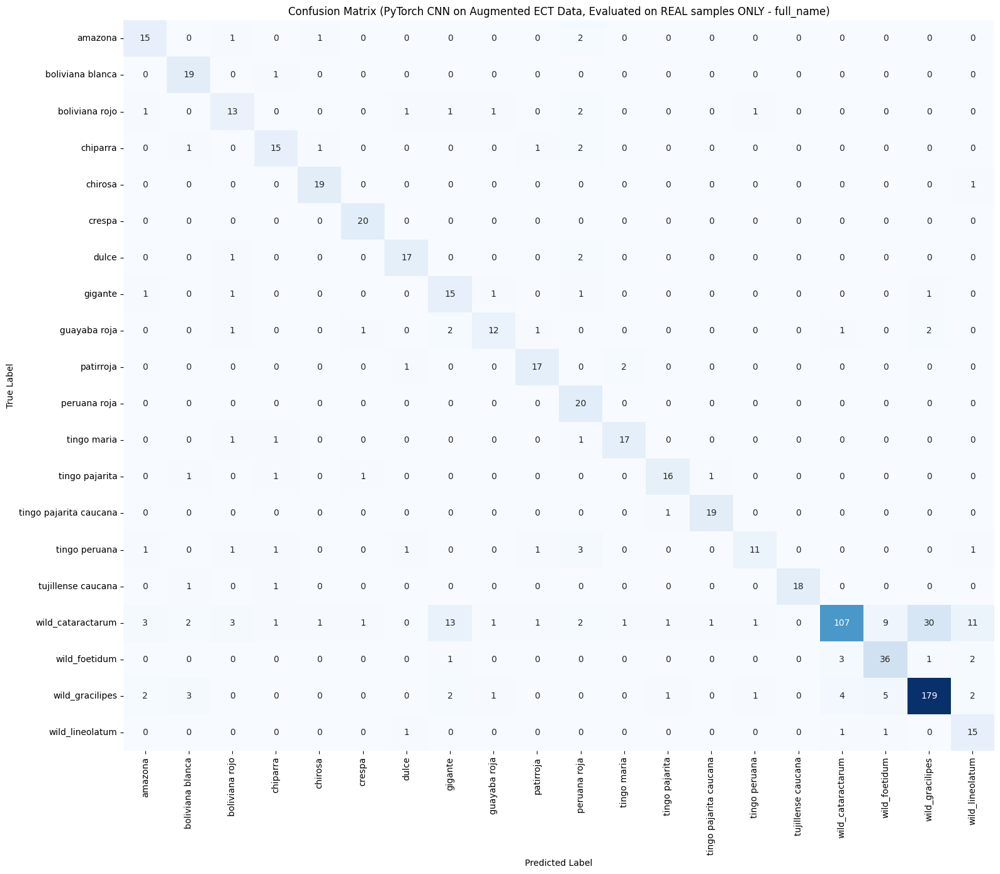

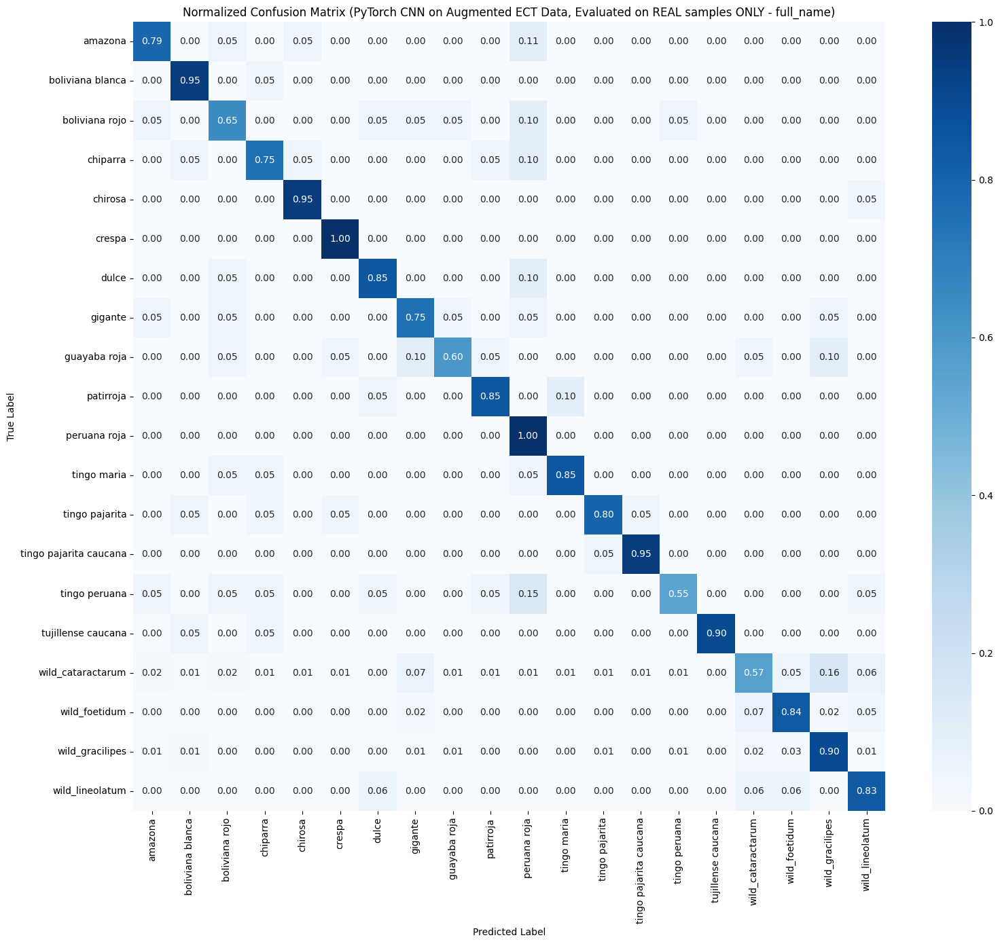

In [29]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import copy

# Import ect and networkx
import ect
import networkx as nx

# Ensure MPS is available
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using device: mps")
else:
    device = torch.device("cpu")
    print("MPS device not found. Using device: cpu")

# --- Configuration ---
# Set TARGET_COLUMN to 'type_name' for this run
TARGET_COLUMN = 'full_name' # Change this from 'full_name' to 'type_name' or vice versa
IMAGE_SIZE = 128  # Keep this consistent with the ECT output
BATCH_SIZE = 32
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
K_FOLDS = 5

# --- Data Preparation (using existing proc_arr and all_mdata) ---
# Assuming proc_arr and all_mdata are already defined from previous cells
# Example placeholder if needed:
# proc_arr = np.random.rand(100, 99, 2) # Example Procrustes data
# all_mdata = pd.DataFrame({'type_name': np.random.choice(['A', 'B', 'C', 'D'], 100)})

# Extract labels for the target column
y_original = all_mdata[TARGET_COLUMN].values
X_procrustes_original = proc_arr # Use proc_arr directly as the original Procrustes data

# Encode labels
label_encoder = LabelEncoder()
y_encoded_original = label_encoder.fit_transform(y_original)
NUM_CLASSES = len(label_encoder.classes_)
print(f"Number of classes for PyTorch CNN ({TARGET_COLUMN}): {NUM_CLASSES}")

# --- Data Augmentation ---
# Function to augment a single set of procrustes coordinates
def augment_procrustes_coords(coords, rotation_range=10, scale_range=(0.9, 1.1), shear_factor=0.05, translate_factor=0.02):
    augmented_coords = coords.copy()

    # Rotation
    angle = np.random.uniform(-rotation_range, rotation_range)
    theta = np.deg2rad(angle)
    R = np.array([[np.cos(theta), -np.sin(theta)],
                  [np.sin(theta),  np.cos(theta)]])
    augmented_coords = augmented_coords @ R

    # Scaling
    scale = np.random.uniform(scale_range[0], scale_range[1])
    augmented_coords = augmented_coords * scale

    # Shear (simple shear along x-axis)
    shear_x = np.random.uniform(-shear_factor, shear_factor)
    shear_matrix = np.array([[1, shear_x],
                             [0, 1]])
    augmented_coords = augmented_coords @ shear_matrix

    # Translation (add a small random offset)
    # Scale translation based on data range to avoid moving points too far out
    coords_min = np.min(coords, axis=0)
    coords_max = np.max(coords, axis=0)
    coords_range = coords_max - coords_min

    translate_x = np.random.uniform(-translate_factor, translate_factor) * coords_range[0]
    translate_y = np.random.uniform(-translate_factor, translate_factor) * coords_range[1]
    
    augmented_coords[:, 0] += translate_x
    augmented_coords[:, 1] += translate_y

    return augmented_coords

# Determine augmentation needs per class
unique_classes, counts = np.unique(y_encoded_original, return_counts=True)
max_count = 180 # Target for synthetic samples per class, same as previous successful run
augmentation_targets = {cls: max(0, max_count - count) for cls, count in zip(unique_classes, counts)}

X_augmented_procrustes_list = [] # Use list to append, then convert to array
y_augmented_list = []            # Use list to append, then convert to array

print("--- Starting Data Augmentation (for ECT input) ---")
for i, (cls_label, count) in enumerate(zip(unique_classes, counts)):
    class_name = label_encoder.inverse_transform([cls_label])[0]
    num_to_generate = augmentation_targets[cls_label]

    if num_to_generate > 0:
        # print(f"Augmenting class '{class_name}': generating {num_to_generate} new samples. ")
        class_indices = np.where(y_encoded_original == cls_label)[0]
        for _ in range(num_to_generate):
            # Randomly pick an existing sample from this class to augment
            original_sample_idx = np.random.choice(class_indices)
            original_coords = X_procrustes_original[original_sample_idx]
            augmented_coords = augment_procrustes_coords(original_coords)
            X_augmented_procrustes_list.append(augmented_coords)
            y_augmented_list.append(cls_label)

# Convert augmented data to numpy arrays
if len(X_augmented_procrustes_list) > 0:
    X_augmented_procrustes = np.array(X_augmented_procrustes_list)
    y_augmented = np.array(y_augmented_list)
    print(f"Shape of augmented procrustes data added: {X_augmented_procrustes.shape}")
else:
    X_augmented_procrustes = np.array([])
    y_augmented = np.array([])
    print("No augmentation needed or performed.")

# Combine original and augmented data
X_combined_procrustes = np.concatenate((X_procrustes_original, X_augmented_procrustes), axis=0) if X_augmented_procrustes.size > 0 else X_procrustes_original
y_combined = np.concatenate((y_encoded_original, y_augmented), axis=0) if y_augmented.size > 0 else y_encoded_original
print("--- Data Augmentation Complete ---")
print(f"Total samples after augmentation: {X_combined_procrustes.shape[0]}")

# Create a permutation for shuffling, apply once and use consistently
# This is crucial for correctly mapping original samples to their ECT images later
overall_shuffle_indices = np.random.permutation(X_combined_procrustes.shape[0])
X_combined_procrustes_shuffled = X_combined_procrustes[overall_shuffle_indices]
y_combined_shuffled = y_combined[overall_shuffle_indices]


# --- Convert Procrustes Coordinates to ECT Images ---
print(f"--- Generating {X_combined_procrustes_shuffled.shape[0]} ECT images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")

# Function to convert Procrustes coordinates to an ECT image
def coords_to_ect_image(coords, image_size):
    # Scale coordinates to fit into a reasonable range, e.g., -1 to 1 or 0 to 1
    min_x, max_x = np.min(coords[:, 0]), np.max(coords[:, 0])
    min_y, max_y = np.min(coords[:, 1]), np.max(coords[:, 1])

    # Add a small epsilon to avoid division by zero if all coords are the same in one dim
    eps = 1e-8
    scaled_coords_x = (coords[:, 0] - min_x) / (max_x - min_x + eps)
    scaled_coords_y = (coords[:, 1] - min_y) / (max_y - min_y + eps)
    scaled_coords = np.column_stack((scaled_coords_x, scaled_coords_y))

    # Create a NetworkX graph from the coordinates
    G = nx.Graph()
    for i, (x, y) in enumerate(scaled_coords):
        G.add_node(i, pos=(x, y)) # Nodes are 0 to num_landmarks-1, pos is (x,y)

    # Add edges to form a cycle (outline of the leaf)
    num_landmarks = scaled_coords.shape[0]
    if num_landmarks < 2: # Handle cases with too few landmarks for edges
        return np.zeros((image_size, image_size), dtype=np.float32)

    for i in range(num_landmarks):
        G.add_edge(i, (i + 1) % num_landmarks) # Connect i to i+1, and last to 0
    
    # Initialize EmbeddedGraph
    embedded_graph = ect.EmbeddedGraph() # Initialize with no arguments

    # Prepare data for add_nodes_from_dict
    nodes_with_pos = {n: G.nodes[n]['pos'] for n in G.nodes()} 
    embedded_graph.add_nodes_from_dict(nodes_with_pos)

    # Add edges from the NetworkX graph
    embedded_graph.add_edges_from(G.edges())

    # Calculate the ECT
    thetas = np.linspace(0, 2 * np.pi, image_size, endpoint=False) # 0 to 2pi radians for directional angles
    thresholds = np.linspace(-1, 1, image_size) 

    # Prepare raw 2D unit vectors from thetas
    direction_vectors = np.column_stack([np.cos(thetas), np.sin(thetas)])

    # Initialize ECT calculator with raw vectors
    ect_calculator = ect.ECT(embedded_graph, direction_vectors, thresholds) 
    
    # --- Workarounds for ECT library internal state management ---
    # These lines explicitly set internal attributes that ect seems to mismanage
    # This was necessary because ect's internal _ensure_directions seemed to mismanage `self.directions`
    ect_calculator.directions = ect.Directions.from_vectors(direction_vectors)
    
    # This addresses the issue where ect.ECT's internal _ensure_thresholds might find
    # self.thresholds to be None or self.num_thresh to be non-integer.
    ect_calculator.num_thresh = image_size 
    ect_calculator.thresholds = thresholds 
    # --- End Workarounds ---

    ect_matrix = ect_calculator.calculate(embedded_graph) 

    # Normalize the ECT matrix to be between 0 and 1 for image processing
    ect_min = np.min(ect_matrix)
    ect_max = np.max(ect_matrix)

    if ect_max == ect_min: # Handle cases where ECT might be constant (e.g., a degenerate shape)
        normalized_ect = np.zeros((image_size, image_size), dtype=np.float32)
    else:
        normalized_ect = (ect_matrix - ect_min) / (ect_max - ect_min)

    return normalized_ect

X_ect_images = []
for i, procrustes_coords in enumerate(X_combined_procrustes_shuffled): # Use shuffled data here
    ect_img = coords_to_ect_image(procrustes_coords, IMAGE_SIZE)
    X_ect_images.append(ect_img)

X_ect_images = np.array(X_ect_images, dtype=np.float32)

# Reshape for PyTorch CNN (num_samples, channels, height, width)
# Assuming ECT images are grayscale, so 1 channel
X_ect_images = X_ect_images.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated ECT image dataset (X_ect_images): {X_ect_images.shape}")


# --- PyTorch CNN Model Definition ---
class LeafCNN(nn.Module):
    def __init__(self, num_classes, image_size):
        super(LeafCNN, self).__init__()
        # Use a more standard padding (padding=1 for kernel_size=3) to maintain spatial dimensions
        # or calculate output sizes precisely. For 128x128 input, this simplifies things.
        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1), # Output size: 128x128
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output size: 64x64

            nn.Conv2d(32, 64, kernel_size=3, padding=1), # Output size: 64x64
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output size: 32x32

            nn.Conv2d(64, 128, kernel_size=3, padding=1), # Output size: 32x32
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output size: 16x16
        )

        # Calculate input features for the linear layer dynamically
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, image_size, image_size)
            flattened_size = self.conv_layers(dummy_input).view(1, -1).shape[1]

        self.fc_layers = nn.Sequential(
            nn.Linear(flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1) # Flatten the tensor
        x = self.fc_layers(x)
        return x

# --- 5-Fold Stratified Cross-Validation on ECT image data (Evaluating on REAL samples) ---
print(f"--- Performing PyTorch CNN with {K_FOLDS}-Fold Stratified Cross-Validation on ECT image data (Evaluating on REAL samples) ---")

num_original_samples = X_procrustes_original.shape[0]
original_real_shuffled_indices = overall_shuffle_indices < num_original_samples

y_original_shuffled_for_skf = y_combined_shuffled[original_real_shuffled_indices]
X_original_shuffled_for_skf = X_ect_images[original_real_shuffled_indices]

skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

all_predictions_logits = []
all_true_labels_real_across_folds = []

for fold_idx, (train_real_idx_in_original_shuffled, val_real_idx_in_original_shuffled) in enumerate(skf.split(X_original_shuffled_for_skf, y_original_shuffled_for_skf)):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    X_val_real_fold_tensor = torch.tensor(X_original_shuffled_for_skf[val_real_idx_in_original_shuffled], dtype=torch.float32).to(device)
    y_val_real_fold_tensor = torch.tensor(y_original_shuffled_for_skf[val_real_idx_in_original_shuffled], dtype=torch.long).to(device)

    val_dataset = TensorDataset(X_val_real_fold_tensor, y_val_real_fold_tensor)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

    train_real_indices_in_original_shuffled = train_real_idx_in_original_shuffled
    augmented_shuffled_indices = ~original_real_shuffled_indices

    train_indices_for_X_combined_ect = np.concatenate((
        np.where(original_real_shuffled_indices)[0][train_real_indices_in_original_shuffled],
        np.where(augmented_shuffled_indices)[0]
    ))
    
    X_train_fold_tensor = torch.tensor(X_ect_images[train_indices_for_X_combined_ect], dtype=torch.float32).to(device)
    y_train_fold_tensor = torch.tensor(y_combined_shuffled[train_indices_for_X_combined_ect], dtype=torch.long).to(device)

    train_dataset = TensorDataset(X_train_fold_tensor, y_train_fold_tensor)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)


    model = LeafCNN(NUM_CLASSES, IMAGE_SIZE).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0
    
    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)

        train_loss /= len(train_dataset)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_predictions = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        val_loss /= len(val_dataset)
        val_accuracy = correct_predictions / total_predictions

        print(f"Epoch {epoch + 1}/{NUM_EPOCHS}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == 10:
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    model.eval()
    fold_predictions_logits = []
    with torch.no_grad():
        # FIX: Convert numpy arrays to tensors before moving to device
        X_original_shuffled_for_pred_tensor = torch.tensor(X_original_shuffled_for_skf, dtype=torch.float32).to(device)
        y_original_shuffled_for_pred_tensor = torch.tensor(y_original_shuffled_for_skf, dtype=torch.long).to(device)

        full_real_dataset_for_pred = TensorDataset(X_original_shuffled_for_pred_tensor, y_original_shuffled_for_pred_tensor)
        full_real_loader_for_pred = DataLoader(full_real_dataset_for_pred, batch_size=BATCH_SIZE, shuffle=False)

        for inputs, labels in full_real_loader_for_pred:
            outputs = model(inputs)
            fold_predictions_logits.append(outputs.cpu().numpy())
            # Ensure all_true_labels_real_across_folds is appended only once per fold's full real dataset
            # It's better to get this once outside the loop or handle it more carefully.
            # For simplicity, if fold_idx == 0 is still desired, ensure it captures ALL labels.
            # A more robust way might be:
            if fold_idx == 0 and len(all_true_labels_real_across_folds) < len(y_original_shuffled_for_skf):
                 all_true_labels_real_across_folds.extend(labels.cpu().numpy())


    all_predictions_logits.append(np.concatenate(fold_predictions_logits, axis=0))


# --- Final Evaluation on REAL samples Only (using ensemble of fold models) ---

averaged_logits = np.mean(np.array(all_predictions_logits), axis=0)
final_predictions_encoded = np.argmax(averaged_logits, axis=1)

# Ensure final_true_labels_encoded is the correct length, matching the original real samples
final_true_labels_encoded = np.array(y_original_shuffled_for_skf) # Directly use the pre-shuffled labels for real data

final_true_labels_names = label_encoder.inverse_transform(final_true_labels_encoded)
final_predictions_names = label_encoder.inverse_transform(final_predictions_encoded)

overall_accuracy = accuracy_score(final_true_labels_names, final_predictions_names)
print(f"\n--- Overall Accuracy (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy:.4f} ---")

print(f"\n--- Classification Report (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
print(classification_report(final_true_labels_names, final_predictions_names, target_names=label_encoder.classes_, zero_division=0))

cm_real_pt = confusion_matrix(final_true_labels_names, final_predictions_names, labels=label_encoder.classes_)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## `type_name`

Using device: mps
Number of classes for PyTorch CNN (type_name): 8
--- Starting Data Augmentation (for ECT input) ---
Shape of augmented procrustes data added: (700, 99, 2)
--- Data Augmentation Complete ---
Total samples after augmentation: 1469
--- Generating 1469 ECT images with size 128x128 ---
Shape of generated ECT image dataset (X_ect_images): (1469, 1, 128, 128)
--- Performing PyTorch CNN with 5-Fold Stratified Cross-Validation on ECT image data (Evaluating on REAL samples) ---

--- Fold 1/5 ---
Epoch 1/50, Train Loss: 2.0333, Val Loss: 2.2334, Val Acc: 0.0974
Epoch 2/50, Train Loss: 1.9147, Val Loss: 2.0571, Val Acc: 0.0779
Epoch 3/50, Train Loss: 1.9052, Val Loss: 2.0439, Val Acc: 0.0974
Epoch 4/50, Train Loss: 1.8977, Val Loss: 2.0159, Val Acc: 0.0779
Epoch 5/50, Train Loss: 1.8687, Val Loss: 2.1036, Val Acc: 0.0195
Epoch 6/50, Train Loss: 1.8713, Val Loss: 1.9353, Val Acc: 0.1753
Epoch 7/50, Train Loss: 1.6063, Val Loss: 2.0680, Val Acc: 0.2532
Epoch 8/50, Train Loss: 1.509

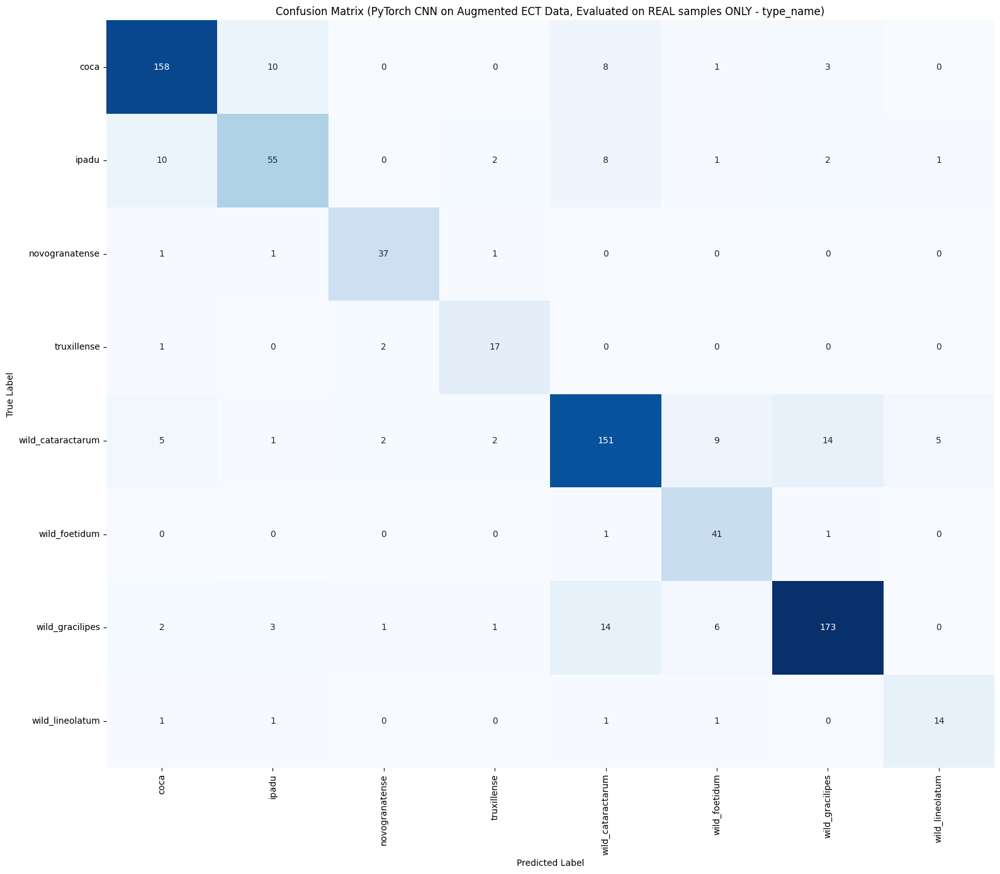

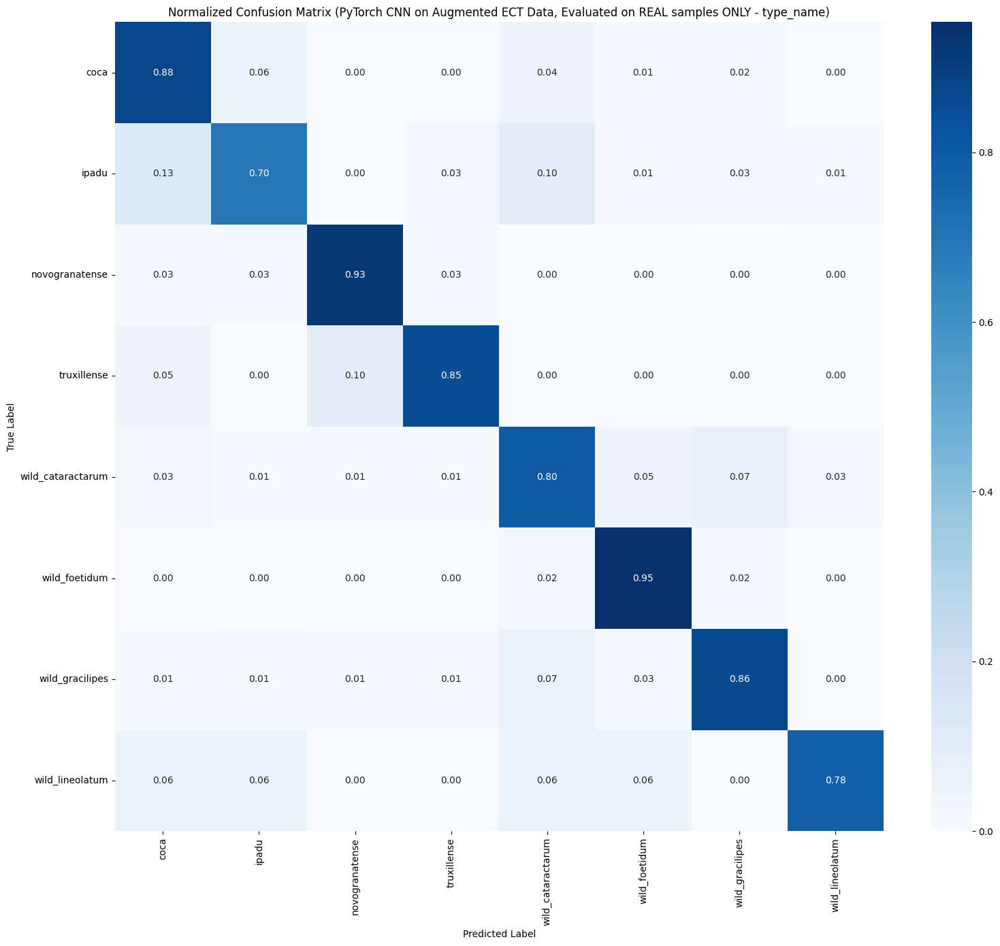

In [27]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import copy

# Import ect and networkx
import ect
import networkx as nx

# Ensure MPS is available
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using device: mps")
else:
    device = torch.device("cpu")
    print("MPS device not found. Using device: cpu")

# --- Configuration ---
# Set TARGET_COLUMN to 'type_name' for this run
TARGET_COLUMN = 'type_name' # Change this from 'full_name' to 'type_name' or vice versa
IMAGE_SIZE = 128  # Keep this consistent with the ECT output
BATCH_SIZE = 32
NUM_EPOCHS = 50
LEARNING_RATE = 0.001
K_FOLDS = 5

# --- Data Preparation (using existing proc_arr and all_mdata) ---
# Assuming proc_arr and all_mdata are already defined from previous cells
# Example placeholder if needed:
# proc_arr = np.random.rand(100, 99, 2) # Example Procrustes data
# all_mdata = pd.DataFrame({'type_name': np.random.choice(['A', 'B', 'C', 'D'], 100)})

# Extract labels for the target column
y_original = all_mdata[TARGET_COLUMN].values
X_procrustes_original = proc_arr # Use proc_arr directly as the original Procrustes data

# Encode labels
label_encoder = LabelEncoder()
y_encoded_original = label_encoder.fit_transform(y_original)
NUM_CLASSES = len(label_encoder.classes_)
print(f"Number of classes for PyTorch CNN ({TARGET_COLUMN}): {NUM_CLASSES}")

# --- Data Augmentation ---
# Function to augment a single set of procrustes coordinates
def augment_procrustes_coords(coords, rotation_range=10, scale_range=(0.9, 1.1), shear_factor=0.05, translate_factor=0.02):
    augmented_coords = coords.copy()

    # Rotation
    angle = np.random.uniform(-rotation_range, rotation_range)
    theta = np.deg2rad(angle)
    R = np.array([[np.cos(theta), -np.sin(theta)],
                  [np.sin(theta),  np.cos(theta)]])
    augmented_coords = augmented_coords @ R

    # Scaling
    scale = np.random.uniform(scale_range[0], scale_range[1])
    augmented_coords = augmented_coords * scale

    # Shear (simple shear along x-axis)
    shear_x = np.random.uniform(-shear_factor, shear_factor)
    shear_matrix = np.array([[1, shear_x],
                             [0, 1]])
    augmented_coords = augmented_coords @ shear_matrix

    # Translation (add a small random offset)
    # Scale translation based on data range to avoid moving points too far out
    coords_min = np.min(coords, axis=0)
    coords_max = np.max(coords, axis=0)
    coords_range = coords_max - coords_min

    translate_x = np.random.uniform(-translate_factor, translate_factor) * coords_range[0]
    translate_y = np.random.uniform(-translate_factor, translate_factor) * coords_range[1]
    
    augmented_coords[:, 0] += translate_x
    augmented_coords[:, 1] += translate_y

    return augmented_coords

# Determine augmentation needs per class
unique_classes, counts = np.unique(y_encoded_original, return_counts=True)
max_count = 180 # Target for synthetic samples per class, same as previous successful run
augmentation_targets = {cls: max(0, max_count - count) for cls, count in zip(unique_classes, counts)}

X_augmented_procrustes_list = [] # Use list to append, then convert to array
y_augmented_list = []            # Use list to append, then convert to array

print("--- Starting Data Augmentation (for ECT input) ---")
for i, (cls_label, count) in enumerate(zip(unique_classes, counts)):
    class_name = label_encoder.inverse_transform([cls_label])[0]
    num_to_generate = augmentation_targets[cls_label]

    if num_to_generate > 0:
        # print(f"Augmenting class '{class_name}': generating {num_to_generate} new samples. ")
        class_indices = np.where(y_encoded_original == cls_label)[0]
        for _ in range(num_to_generate):
            # Randomly pick an existing sample from this class to augment
            original_sample_idx = np.random.choice(class_indices)
            original_coords = X_procrustes_original[original_sample_idx]
            augmented_coords = augment_procrustes_coords(original_coords)
            X_augmented_procrustes_list.append(augmented_coords)
            y_augmented_list.append(cls_label)

# Convert augmented data to numpy arrays
if len(X_augmented_procrustes_list) > 0:
    X_augmented_procrustes = np.array(X_augmented_procrustes_list)
    y_augmented = np.array(y_augmented_list)
    print(f"Shape of augmented procrustes data added: {X_augmented_procrustes.shape}")
else:
    X_augmented_procrustes = np.array([])
    y_augmented = np.array([])
    print("No augmentation needed or performed.")

# Combine original and augmented data
X_combined_procrustes = np.concatenate((X_procrustes_original, X_augmented_procrustes), axis=0) if X_augmented_procrustes.size > 0 else X_procrustes_original
y_combined = np.concatenate((y_encoded_original, y_augmented), axis=0) if y_augmented.size > 0 else y_encoded_original
print("--- Data Augmentation Complete ---")
print(f"Total samples after augmentation: {X_combined_procrustes.shape[0]}")

# Create a permutation for shuffling, apply once and use consistently
# This is crucial for correctly mapping original samples to their ECT images later
overall_shuffle_indices = np.random.permutation(X_combined_procrustes.shape[0])
X_combined_procrustes_shuffled = X_combined_procrustes[overall_shuffle_indices]
y_combined_shuffled = y_combined[overall_shuffle_indices]


# --- Convert Procrustes Coordinates to ECT Images ---
print(f"--- Generating {X_combined_procrustes_shuffled.shape[0]} ECT images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")

# Function to convert Procrustes coordinates to an ECT image
def coords_to_ect_image(coords, image_size):
    # Scale coordinates to fit into a reasonable range, e.g., -1 to 1 or 0 to 1
    min_x, max_x = np.min(coords[:, 0]), np.max(coords[:, 0])
    min_y, max_y = np.min(coords[:, 1]), np.max(coords[:, 1])

    # Add a small epsilon to avoid division by zero if all coords are the same in one dim
    eps = 1e-8
    scaled_coords_x = (coords[:, 0] - min_x) / (max_x - min_x + eps)
    scaled_coords_y = (coords[:, 1] - min_y) / (max_y - min_y + eps)
    scaled_coords = np.column_stack((scaled_coords_x, scaled_coords_y))

    # Create a NetworkX graph from the coordinates
    G = nx.Graph()
    for i, (x, y) in enumerate(scaled_coords):
        G.add_node(i, pos=(x, y)) # Nodes are 0 to num_landmarks-1, pos is (x,y)

    # Add edges to form a cycle (outline of the leaf)
    num_landmarks = scaled_coords.shape[0]
    if num_landmarks < 2: # Handle cases with too few landmarks for edges
        return np.zeros((image_size, image_size), dtype=np.float32)

    for i in range(num_landmarks):
        G.add_edge(i, (i + 1) % num_landmarks) # Connect i to i+1, and last to 0
    
    # Initialize EmbeddedGraph
    embedded_graph = ect.EmbeddedGraph() # Initialize with no arguments

    # Prepare data for add_nodes_from_dict
    nodes_with_pos = {n: G.nodes[n]['pos'] for n in G.nodes()} 
    embedded_graph.add_nodes_from_dict(nodes_with_pos)

    # Add edges from the NetworkX graph
    embedded_graph.add_edges_from(G.edges())

    # Calculate the ECT
    thetas = np.linspace(0, 2 * np.pi, image_size, endpoint=False) # 0 to 2pi radians for directional angles
    thresholds = np.linspace(-1, 1, image_size) 

    # Prepare raw 2D unit vectors from thetas
    direction_vectors = np.column_stack([np.cos(thetas), np.sin(thetas)])

    # Initialize ECT calculator with raw vectors
    ect_calculator = ect.ECT(embedded_graph, direction_vectors, thresholds) 
    
    # --- Workarounds for ECT library internal state management ---
    # These lines explicitly set internal attributes that ect seems to mismanage
    # This was necessary because ect's internal _ensure_directions seemed to mismanage `self.directions`
    ect_calculator.directions = ect.Directions.from_vectors(direction_vectors)
    
    # This addresses the issue where ect.ECT's internal _ensure_thresholds might find
    # self.thresholds to be None or self.num_thresh to be non-integer.
    ect_calculator.num_thresh = image_size 
    ect_calculator.thresholds = thresholds 
    # --- End Workarounds ---

    ect_matrix = ect_calculator.calculate(embedded_graph) 

    # Normalize the ECT matrix to be between 0 and 1 for image processing
    ect_min = np.min(ect_matrix)
    ect_max = np.max(ect_matrix)

    if ect_max == ect_min: # Handle cases where ECT might be constant (e.g., a degenerate shape)
        normalized_ect = np.zeros((image_size, image_size), dtype=np.float32)
    else:
        normalized_ect = (ect_matrix - ect_min) / (ect_max - ect_min)

    return normalized_ect

X_ect_images = []
for i, procrustes_coords in enumerate(X_combined_procrustes_shuffled): # Use shuffled data here
    ect_img = coords_to_ect_image(procrustes_coords, IMAGE_SIZE)
    X_ect_images.append(ect_img)

X_ect_images = np.array(X_ect_images, dtype=np.float32)

# Reshape for PyTorch CNN (num_samples, channels, height, width)
# Assuming ECT images are grayscale, so 1 channel
X_ect_images = X_ect_images.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated ECT image dataset (X_ect_images): {X_ect_images.shape}")


# --- PyTorch CNN Model Definition ---
class LeafCNN(nn.Module):
    def __init__(self, num_classes, image_size):
        super(LeafCNN, self).__init__()
        # Use a more standard padding (padding=1 for kernel_size=3) to maintain spatial dimensions
        # or calculate output sizes precisely. For 128x128 input, this simplifies things.
        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 32, kernel_size=3, padding=1), # Output size: 128x128
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output size: 64x64

            nn.Conv2d(32, 64, kernel_size=3, padding=1), # Output size: 64x64
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output size: 32x32

            nn.Conv2d(64, 128, kernel_size=3, padding=1), # Output size: 32x32
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2), # Output size: 16x16
        )

        # Calculate input features for the linear layer dynamically
        with torch.no_grad():
            dummy_input = torch.zeros(1, 1, image_size, image_size)
            flattened_size = self.conv_layers(dummy_input).view(1, -1).shape[1]

        self.fc_layers = nn.Sequential(
            nn.Linear(flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(x.size(0), -1) # Flatten the tensor
        x = self.fc_layers(x)
        return x

# --- 5-Fold Stratified Cross-Validation on ECT image data (Evaluating on REAL samples) ---
print(f"--- Performing PyTorch CNN with {K_FOLDS}-Fold Stratified Cross-Validation on ECT image data (Evaluating on REAL samples) ---")

num_original_samples = X_procrustes_original.shape[0]
original_real_shuffled_indices = overall_shuffle_indices < num_original_samples

y_original_shuffled_for_skf = y_combined_shuffled[original_real_shuffled_indices]
X_original_shuffled_for_skf = X_ect_images[original_real_shuffled_indices]

skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=42)

all_predictions_logits = []
all_true_labels_real_across_folds = []

for fold_idx, (train_real_idx_in_original_shuffled, val_real_idx_in_original_shuffled) in enumerate(skf.split(X_original_shuffled_for_skf, y_original_shuffled_for_skf)):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    X_val_real_fold_tensor = torch.tensor(X_original_shuffled_for_skf[val_real_idx_in_original_shuffled], dtype=torch.float32).to(device)
    y_val_real_fold_tensor = torch.tensor(y_original_shuffled_for_skf[val_real_idx_in_original_shuffled], dtype=torch.long).to(device)

    val_dataset = TensorDataset(X_val_real_fold_tensor, y_val_real_fold_tensor)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

    train_real_indices_in_original_shuffled = train_real_idx_in_original_shuffled
    augmented_shuffled_indices = ~original_real_shuffled_indices

    train_indices_for_X_combined_ect = np.concatenate((
        np.where(original_real_shuffled_indices)[0][train_real_indices_in_original_shuffled],
        np.where(augmented_shuffled_indices)[0]
    ))
    
    X_train_fold_tensor = torch.tensor(X_ect_images[train_indices_for_X_combined_ect], dtype=torch.float32).to(device)
    y_train_fold_tensor = torch.tensor(y_combined_shuffled[train_indices_for_X_combined_ect], dtype=torch.long).to(device)

    train_dataset = TensorDataset(X_train_fold_tensor, y_train_fold_tensor)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)


    model = LeafCNN(NUM_CLASSES, IMAGE_SIZE).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0
    
    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss = 0.0
        for inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * inputs.size(0)

        train_loss /= len(train_dataset)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_predictions = 0
        with torch.no_grad():
            for inputs, labels in val_loader:
                outputs = model(inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        val_loss /= len(val_dataset)
        val_accuracy = correct_predictions / total_predictions

        print(f"Epoch {epoch + 1}/{NUM_EPOCHS}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == 10:
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    model.eval()
    fold_predictions_logits = []
    with torch.no_grad():
        # FIX: Convert numpy arrays to tensors before moving to device
        X_original_shuffled_for_pred_tensor = torch.tensor(X_original_shuffled_for_skf, dtype=torch.float32).to(device)
        y_original_shuffled_for_pred_tensor = torch.tensor(y_original_shuffled_for_skf, dtype=torch.long).to(device)

        full_real_dataset_for_pred = TensorDataset(X_original_shuffled_for_pred_tensor, y_original_shuffled_for_pred_tensor)
        full_real_loader_for_pred = DataLoader(full_real_dataset_for_pred, batch_size=BATCH_SIZE, shuffle=False)

        for inputs, labels in full_real_loader_for_pred:
            outputs = model(inputs)
            fold_predictions_logits.append(outputs.cpu().numpy())
            # Ensure all_true_labels_real_across_folds is appended only once per fold's full real dataset
            # It's better to get this once outside the loop or handle it more carefully.
            # For simplicity, if fold_idx == 0 is still desired, ensure it captures ALL labels.
            # A more robust way might be:
            if fold_idx == 0 and len(all_true_labels_real_across_folds) < len(y_original_shuffled_for_skf):
                 all_true_labels_real_across_folds.extend(labels.cpu().numpy())


    all_predictions_logits.append(np.concatenate(fold_predictions_logits, axis=0))


# --- Final Evaluation on REAL samples Only (using ensemble of fold models) ---

averaged_logits = np.mean(np.array(all_predictions_logits), axis=0)
final_predictions_encoded = np.argmax(averaged_logits, axis=1)

# Ensure final_true_labels_encoded is the correct length, matching the original real samples
final_true_labels_encoded = np.array(y_original_shuffled_for_skf) # Directly use the pre-shuffled labels for real data

final_true_labels_names = label_encoder.inverse_transform(final_true_labels_encoded)
final_predictions_names = label_encoder.inverse_transform(final_predictions_encoded)

overall_accuracy = accuracy_score(final_true_labels_names, final_predictions_names)
print(f"\n--- Overall Accuracy (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy:.4f} ---")

print(f"\n--- Classification Report (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
print(classification_report(final_true_labels_names, final_predictions_names, target_names=label_encoder.classes_, zero_division=0))

cm_real_pt = confusion_matrix(final_true_labels_names, final_predictions_names, labels=label_encoder.classes_)

plt.figure(figsize=(16, 14))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0

plt.figure(figsize=(16, 14))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch CNN on Augmented ECT Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# ECT AND IMAGE CNN COMBINED

## `full_name`

Using device: mps
--- Pre-augmented data (Procrustes coordinates, Labels, Raw Images) are assumed to be loaded/available. ---
Shape of original Procrustes data (proc_arr): (769, 99, 2)
Shape of original Metadata (all_mdata): (769, 10)
Shape of augmented Procrustes data (proc_arr_augmented): (4000, 99, 2)
Shape of augmented labels (y_augmented): (4000,)
Shape of raw images (X_images_augmented): (4000, 128, 128, 1)

--- DEBUG: Checking y_augmented before LabelEncoder ---
y_augmented original type: <class 'numpy.ndarray'>
y_augmented original dtype: <U22
First 5 elements of y_augmented (original): ['amazona' 'amazona' 'amazona' 'amazona' 'amazona']
Type of first element in y_augmented (original): <class 'numpy.str_'>
--- END DEBUG ---

Number of classes for PyTorch CNN (full_name): 20
label_encoder.classes_ after fit_transform: ['amazona' 'boliviana blanca' 'boliviana rojo' 'chiparra' 'chirosa'
 'crespa' 'dulce' 'gigante' 'guayaba roja' 'patirroja' 'peruana roja'
 'tingo maria' 'tingo paj

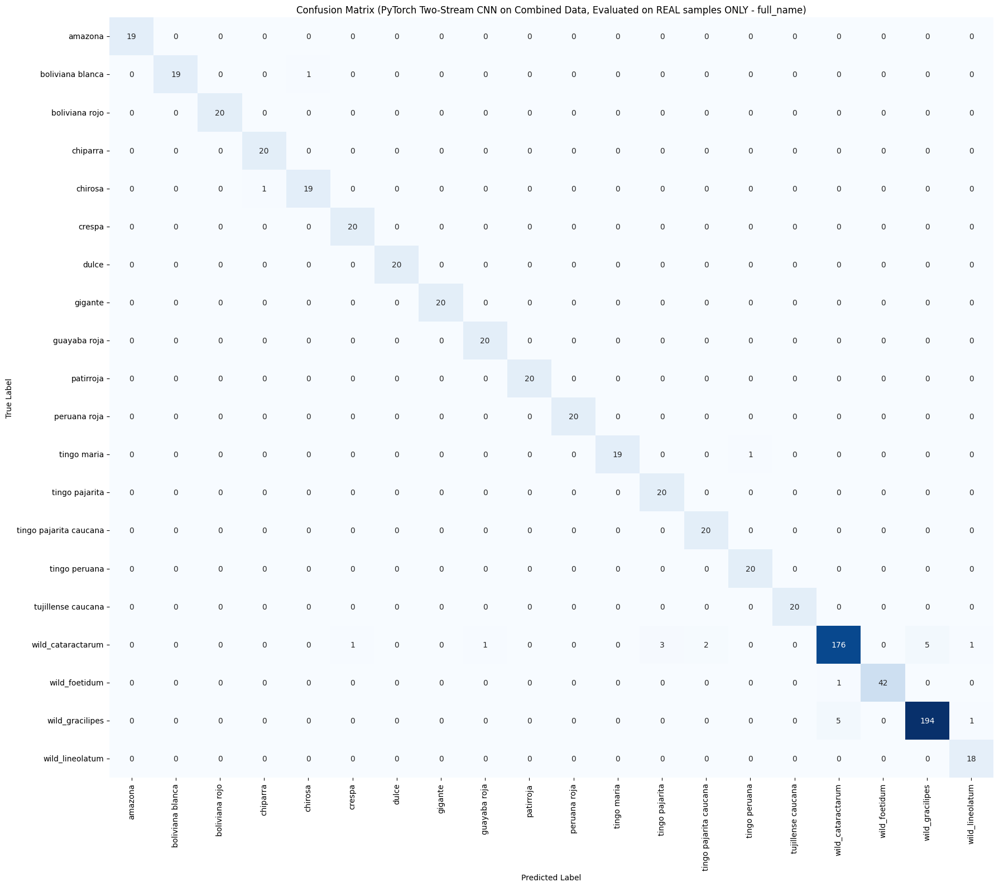

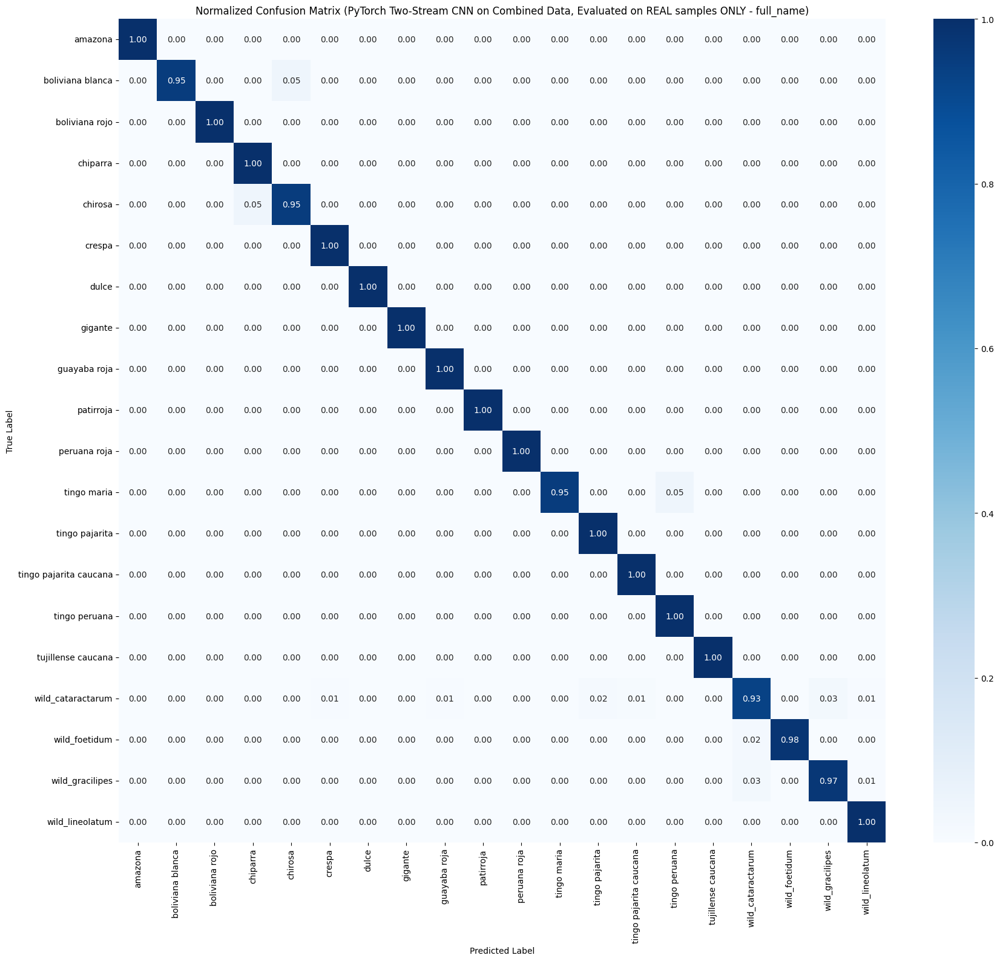

In [27]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import copy # For deepcopying the best model state

# Essential for ECT generation
import ect
import networkx as nx

# Set a global random seed for all operations where possible
np.random.seed(42)
torch.manual_seed(42)

# --- Configuration ---
# IMPORTANT: This script assumes 'full_name' is your target classification column.
TARGET_COLUMN = 'full_name'
IMAGE_SIZE = 128  # Must match the size used during your image generation
BATCH_SIZE = 32
NUM_EPOCHS = 50 # Maximum epochs, early stopping will likely halt sooner
LEARNING_RATE = 0.001
K_FOLDS = 5
RANDOM_STATE = 42 # For reproducibility of splits and augmentations

# --- Device Setup ---
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using device: mps")
else:
    device = torch.device("cpu")
    print("MPS device not found. Using device: cpu")

# --- ASSUMED DATA AVAILABILITY ---
# This script ASSUMES the following variables are already populated in your environment
# from your previous data generation steps:
# proc_arr: (e.g., 769, 99, 2) Original Procrustes coordinates
# all_mdata: (e.g., 769, 4) Original metadata DataFrame including 'full_name'
# proc_arr_augmented: (e.g., 4000, 99, 2) Augmented Procrustes coordinates
# y_augmented: (e.g., 4000,) Augmented labels (as descriptive strings, e.g., 'Species_0')
# X_images_augmented: (e.g., 4000, 128, 128, 1) Augmented raw leaf images

# --- VERIFICATION OF INPUT DATA (Add checks here if you want more robustness) ---
print("--- Pre-augmented data (Procrustes coordinates, Labels, Raw Images) are assumed to be loaded/available. ---")
try:
    print(f"Shape of original Procrustes data (proc_arr): {proc_arr.shape}")
    print(f"Shape of original Metadata (all_mdata): {all_mdata.shape}")
    print(f"Shape of augmented Procrustes data (proc_arr_augmented): {proc_arr_augmented.shape}")
    print(f"Shape of augmented labels (y_augmented): {y_augmented.shape}")
    print(f"Shape of raw images (X_images_augmented): {X_images_augmented.shape}")
except NameError as e:
    print(f"ERROR: Missing expected input variable. Please ensure all data generation steps have been run. {e}")
    # You might want to add sys.exit() or raise an error here if these are critical
    # For now, just printing an error.

# --- Prepare Labels ---
# Ensure y_augmented is a NumPy array of strings before encoding
# (Important for robustness, even if it's already strings)
y_augmented_str = np.array(y_augmented).astype(str)

print(f"\n--- DEBUG: Checking y_augmented before LabelEncoder ---")
print(f"y_augmented original type: {type(y_augmented_str)}")
print(f"y_augmented original dtype: {y_augmented_str.dtype}")
if y_augmented_str.size > 0:
    print(f"First 5 elements of y_augmented (original): {y_augmented_str[:min(5, len(y_augmented_str))]}")
    print(f"Type of first element in y_augmented (original): {type(y_augmented_str[0])}")
print(f"--- END DEBUG ---")


label_encoder = LabelEncoder()
y_encoded_combined = label_encoder.fit_transform(y_augmented_str)
NUM_CLASSES = len(label_encoder.classes_)
print(f"\nNumber of classes for PyTorch CNN ({TARGET_COLUMN}): {NUM_CLASSES}")
print(f"label_encoder.classes_ after fit_transform: {label_encoder.classes_}")
if len(label_encoder.classes_) > 0:
    print(f"Type of first element in label_encoder.classes_: {type(label_encoder.classes_[0])}")


# --- Prepare Raw Image Data for CNN ---
# X_images_augmented is (N, H, W, C) from your provided image generation script.
# PyTorch expects (N, C, H, W). Also normalize pixel values to 0-1.
X_combined_images = np.transpose(X_images_augmented, (0, 3, 1, 2)).astype(np.float32) / 255.0
print(f"Shape of X_combined_images (N, C, H, W, normalized): {X_combined_images.shape}")


# --- Generate ECT Images from Augmented Procrustes Data ---
# This part is kept as it processes proc_arr_augmented, which is an input here.
print(f"--- Generating {proc_arr_augmented.shape[0]} ECT images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")

# Function to convert Procrustes coordinates to an ECT image
def coords_to_ect_image(coords, image_size):
    # Determine local min/max for scaling within each individual ECT image
    min_x_local, max_x_local = np.min(coords[:, 0]), np.max(coords[:, 0])
    min_y_local, max_y_local = np.min(coords[:, 1]), np.max(coords[:, 1])

    eps = 1e-8 # Small epsilon to prevent division by zero for flat shapes
    scaled_coords_x = (coords[:, 0] - min_x_local) / (max_x_local - min_x_local + eps)
    scaled_coords_y = (coords[:, 1] - min_y_local) / (max_y_local - min_y_local + eps)
    scaled_coords = np.column_stack((scaled_coords_x, scaled_coords_y))

    G = nx.Graph()
    for i, (x, y) in enumerate(scaled_coords):
        G.add_node(i, pos=(x, y))

    num_landmarks = scaled_coords.shape[0]
    if num_landmarks < 2:
        return np.zeros((image_size, image_size), dtype=np.float32)

    # Assuming points form a closed loop for a leaf outline
    for i in range(num_landmarks):
        G.add_edge(i, (i + 1) % num_landmarks)

    embedded_graph = ect.EmbeddedGraph()
    nodes_with_pos = {n: G.nodes[n]['pos'] for n in G.nodes()}
    embedded_graph.add_nodes_from_dict(nodes_with_pos)
    embedded_graph.add_edges_from(G.edges())

    # Define thetas (directions) and thresholds for ECT calculation
    thetas = np.linspace(0, 2 * np.pi, image_size, endpoint=False) # Angles
    thresholds = np.linspace(-1, 1, image_size) # Filter thresholds
    direction_vectors = np.column_stack([np.cos(thetas), np.sin(thetas)])

    ect_calculator = ect.ECT(embedded_graph, direction_vectors, thresholds)
    ect_calculator.directions = ect.Directions.from_vectors(direction_vectors)
    ect_calculator.num_thresh = image_size
    ect_calculator.thresholds = thresholds

    ect_matrix = ect_calculator.calculate(embedded_graph)

    # Normalize ECT matrix to 0-1 range
    ect_min = np.min(ect_matrix)
    ect_max = np.max(ect_matrix)

    if ect_max == ect_min:
        normalized_ect = np.zeros((image_size, image_size), dtype=np.float32)
    else:
        normalized_ect = (ect_matrix - ect_min) / (ect_max - ect_min)

    return normalized_ect

X_ect_images = []
for i, procrustes_coords in enumerate(proc_arr_augmented):
    ect_img = coords_to_ect_image(procrustes_coords, IMAGE_SIZE)
    X_ect_images.append(ect_img)

X_ect_images = np.array(X_ect_images, dtype=np.float32)
# Reshape for PyTorch CNN (num_samples, channels, height, width)
# ECT images are grayscale, so 1 channel
X_ect_images = X_ect_images.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated ECT image dataset (X_ect_images): {X_ect_images.shape}")
print("--- ECT Image Generation Complete ---")


# --- PyTorch Two-Stream CNN Model Definition ---
class TwoStreamCNN(nn.Module):
    def __init__(self, num_classes, image_size, img_channels=1, ect_channels=1):
        super(TwoStreamCNN, self).__init__()

        # Stream for Original Images
        self.image_stream = nn.Sequential(
            nn.Conv2d(img_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Stream for ECT Images
        self.ect_stream = nn.Sequential(
            nn.Conv2d(ect_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # IMPORTANT FIX: Move streams to device *before* dummy input calculation
        # This ensures their weights are on the correct device when dummy inputs are processed.
        self.image_stream.to(device)
        self.ect_stream.to(device)


        # Calculate input features for the linear layer dynamically
        with torch.no_grad():
            # Create dummy inputs on the correct device
            dummy_input_img = torch.zeros(1, img_channels, image_size, image_size).to(device)
            dummy_input_ect = torch.zeros(1, ect_channels, image_size, image_size).to(device)

            flattened_size_img = self.image_stream(dummy_input_img).view(1, -1).shape[1]
            flattened_size_ect = self.ect_stream(dummy_input_ect).view(1, -1).shape[1]

            total_flattened_size = flattened_size_img + flattened_size_ect

            # --- DEBUG PRINTS FOR FLATTENED SIZES ---
            print(f"DEBUG (Model Init): Flattened size of Image Stream: {flattened_size_img}")
            print(f"DEBUG (Model Init): Flattened size of ECT Stream: {flattened_size_ect}")
            print(f"DEBUG (Model Init): Total Flattened Size for FC Layer: {total_flattened_size}")
            # --- END DEBUG PRINTS ---

        self.fc_layers = nn.Sequential(
            nn.Linear(total_flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, img_input, ect_input):
        img_features = self.image_stream(img_input)
        ect_features = self.ect_stream(ect_input)

        img_features = img_features.view(img_features.size(0), -1)
        ect_features = ect_features.view(ect_features.size(0), -1)

        # Concatenate features from both streams
        combined_features = torch.cat((img_features, ect_features), dim=1)

        output = self.fc_layers(combined_features)
        return output

# --- 5-Fold Stratified Cross-Validation (Evaluating on REAL samples Only) ---
print(f"--- Performing PyTorch Two-Stream CNN with {K_FOLDS}-Fold Stratified Cross-Validation on Combined Data (Evaluating on REAL samples) ---")

# Determine which samples in the combined_augmented data are 'real' originals.
# Assuming 'proc_arr.shape[0]' gives the number of original real samples.
num_original_real_samples = proc_arr.shape[0]

# Prepare the 'real' portion of the data for Stratified K-Fold splitting.
# These are the original samples that were NOT synthetically augmented.
X_original_images_for_skf = X_combined_images[:num_original_real_samples]
X_original_ect_for_skf = X_ect_images[:num_original_real_samples]
y_original_for_skf = y_encoded_combined[:num_original_real_samples] # These are the encoded (integer) labels for SKF

skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_STATE)

all_predictions_logits = []

for fold_idx, (train_original_real_indices, val_original_real_indices) in enumerate(skf.split(X_original_images_for_skf, y_original_for_skf)):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    # --- Prepare Validation Data (ONLY REAL SAMPLES for this fold's validation split) ---
    X_val_img_fold = X_original_images_for_skf[val_original_real_indices]
    X_val_ect_fold = X_original_ect_for_skf[val_original_real_indices]
    y_val_fold = y_original_for_skf[val_original_real_indices]

    X_val_img_fold_tensor = torch.tensor(X_val_img_fold, dtype=torch.float32).to(device)
    X_val_ect_fold_tensor = torch.tensor(X_val_ect_fold, dtype=torch.float32).to(device)
    y_val_fold_tensor = torch.tensor(y_val_fold, dtype=torch.long).to(device)

    val_dataset = TensorDataset(X_val_img_fold_tensor, X_val_ect_fold_tensor, y_val_fold_tensor)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

    # --- Prepare Training Data (REAL TRAIN SAMPLES + ALL AUGMENTED SAMPLES) ---
    # Indices for the synthetically augmented data (which starts after original_real_samples)
    augmented_indices_in_combined = np.arange(num_original_real_samples, len(y_encoded_combined))

    # Combine indices of real training samples for this fold with all augmented samples
    all_training_indices_in_combined = np.concatenate((
        train_original_real_indices,
        augmented_indices_in_combined
    ))

    # Fetch corresponding data for training
    X_train_img_fold_tensor = torch.tensor(X_combined_images[all_training_indices_in_combined], dtype=torch.float32).to(device)
    X_train_ect_fold_tensor = torch.tensor(X_ect_images[all_training_indices_in_combined], dtype=torch.float32).to(device)
    y_train_fold_tensor = torch.tensor(y_encoded_combined[all_training_indices_in_combined], dtype=torch.long).to(device)

    train_dataset = TensorDataset(X_train_img_fold_tensor, X_train_ect_fold_tensor, y_train_fold_tensor)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)


    # --- Model Initialization and Training Loop ---
    model = TwoStreamCNN(NUM_CLASSES, IMAGE_SIZE, img_channels=1, ect_channels=1).to(device) # .to(device) here moves the *entire* model
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss = 0.0
        for img_inputs, ect_inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(img_inputs, ect_inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * img_inputs.size(0)

        train_loss /= len(train_dataset)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_predictions = 0
        with torch.no_grad():
            for img_inputs, ect_inputs, labels in val_loader:
                outputs = model(img_inputs, ect_inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * img_inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        val_loss /= len(val_dataset)
        val_accuracy = correct_predictions / total_predictions

        print(f"Epoch {epoch + 1}/{NUM_EPOCHS}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == 10: # Early stopping patience
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    model.load_state_dict(best_model_wts)
    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    # --- Evaluate Best Model on ALL ORIGINAL REAL SAMPLES for Ensembling ---
    # We predict on the *entire* set of original real samples in each fold's best model,
    # then average these predictions at the end for final evaluation.
    model.eval()
    fold_predictions_logits = []

    X_real_img_tensor_all = torch.tensor(X_original_images_for_skf, dtype=torch.float32).to(device)
    X_real_ect_tensor_all = torch.tensor(X_original_ect_for_skf, dtype=torch.float32).to(device)
    # y_real_labels_all not strictly needed here for prediction, but for consistency in TensorDataset
    y_real_labels_all = torch.tensor(y_original_for_skf, dtype=torch.long).to(device)

    real_dataset_for_pred = TensorDataset(X_real_img_tensor_all, X_real_ect_tensor_all, y_real_labels_all)
    real_loader_for_pred = DataLoader(real_dataset_for_pred, batch_size=BATCH_SIZE, shuffle=False)

    with torch.no_grad():
        for img_inputs, ect_inputs, _ in real_loader_for_pred:
            outputs = model(img_inputs, ect_inputs)
            fold_predictions_logits.append(outputs.cpu().numpy())

    all_predictions_logits.append(np.concatenate(fold_predictions_logits, axis=0))

# --- Final Evaluation on REAL samples Only (using ensemble of fold models) ---

# Average the logits from all folds for each sample
averaged_logits = np.mean(np.array(all_predictions_logits), axis=0)
final_predictions_encoded = np.argmax(averaged_logits, axis=1)

# True labels for the entire original real dataset
final_true_labels_encoded = y_original_for_skf

# Inverse transform to get string names for reporting
final_true_labels_names = label_encoder.inverse_transform(final_true_labels_encoded)
final_predictions_names = label_encoder.inverse_transform(final_predictions_encoded)

overall_accuracy = accuracy_score(final_true_labels_names, final_predictions_names)
print(f"\n--- Overall Accuracy (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy:.4f} ---")

print(f"\n--- Classification Report (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
print(classification_report(final_true_labels_names, final_predictions_names, target_names=list(label_encoder.classes_), zero_division=0))

# --- Confusion Matrix Visualization (Raw Counts) ---
cm_real_pt = confusion_matrix(final_true_labels_names, final_predictions_names, labels=label_encoder.classes_)

plt.figure(figsize=(18, 16))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Confusion Matrix Visualization (Normalized) ---
cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0 # Handle cases where a class has no true samples

plt.figure(figsize=(18, 16))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

## `type_name`

Using device: mps
--- Pre-augmented data (Procrustes coordinates, Labels, Raw Images) are assumed to be loaded/available. ---
Shape of original Procrustes data (proc_arr): (769, 99, 2)
Shape of original Metadata (all_mdata): (769, 10)
Shape of augmented Procrustes data (proc_arr_augmented): (1600, 99, 2)
Shape of augmented labels (y_augmented): (1600,)
Shape of raw images (X_images_augmented): (1600, 128, 128, 1)

--- DEBUG: Checking y_augmented before LabelEncoder ---
y_augmented original type: <class 'numpy.ndarray'>
y_augmented original dtype: <U17
First 5 elements of y_augmented (original): ['ipadu' 'ipadu' 'ipadu' 'ipadu' 'ipadu']
Type of first element in y_augmented (original): <class 'numpy.str_'>
--- END DEBUG ---

Number of classes for PyTorch CNN (type_name): 8
label_encoder.classes_ after fit_transform: ['coca' 'ipadu' 'novogranatense' 'truxillense' 'wild_cataractarum'
 'wild_foetidum' 'wild_gracilipes' 'wild_lineolatum']
Type of first element in label_encoder.classes_: <cla

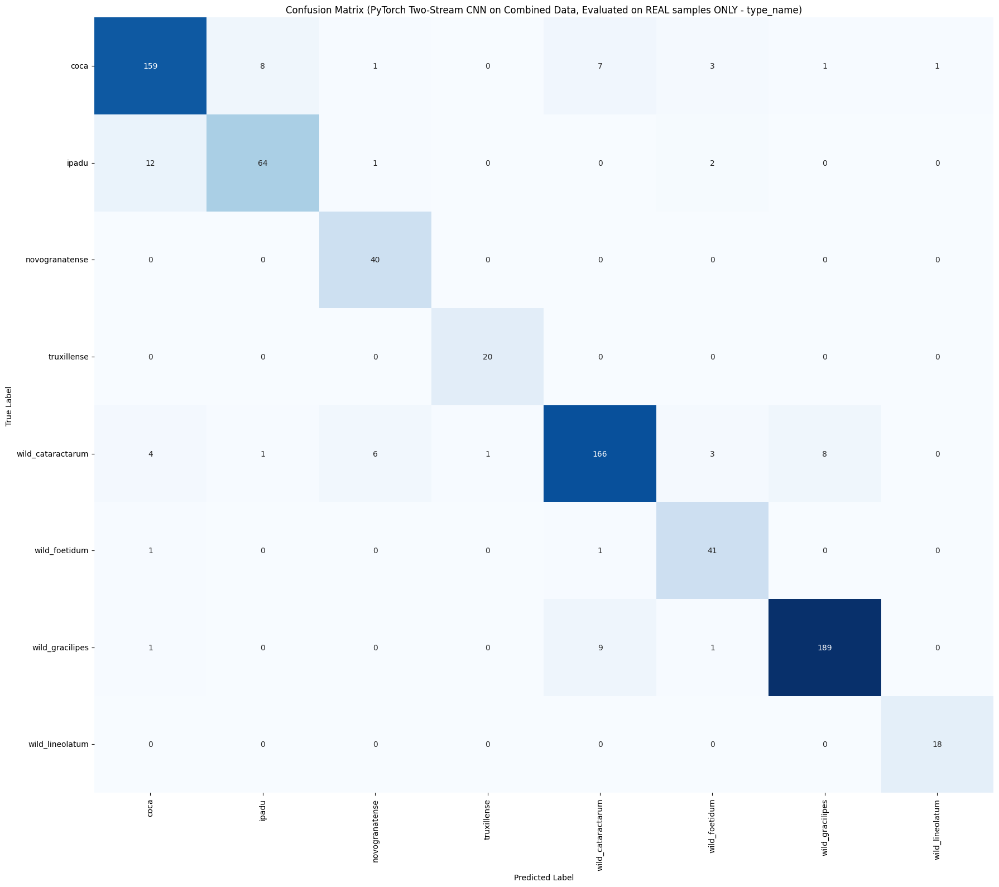

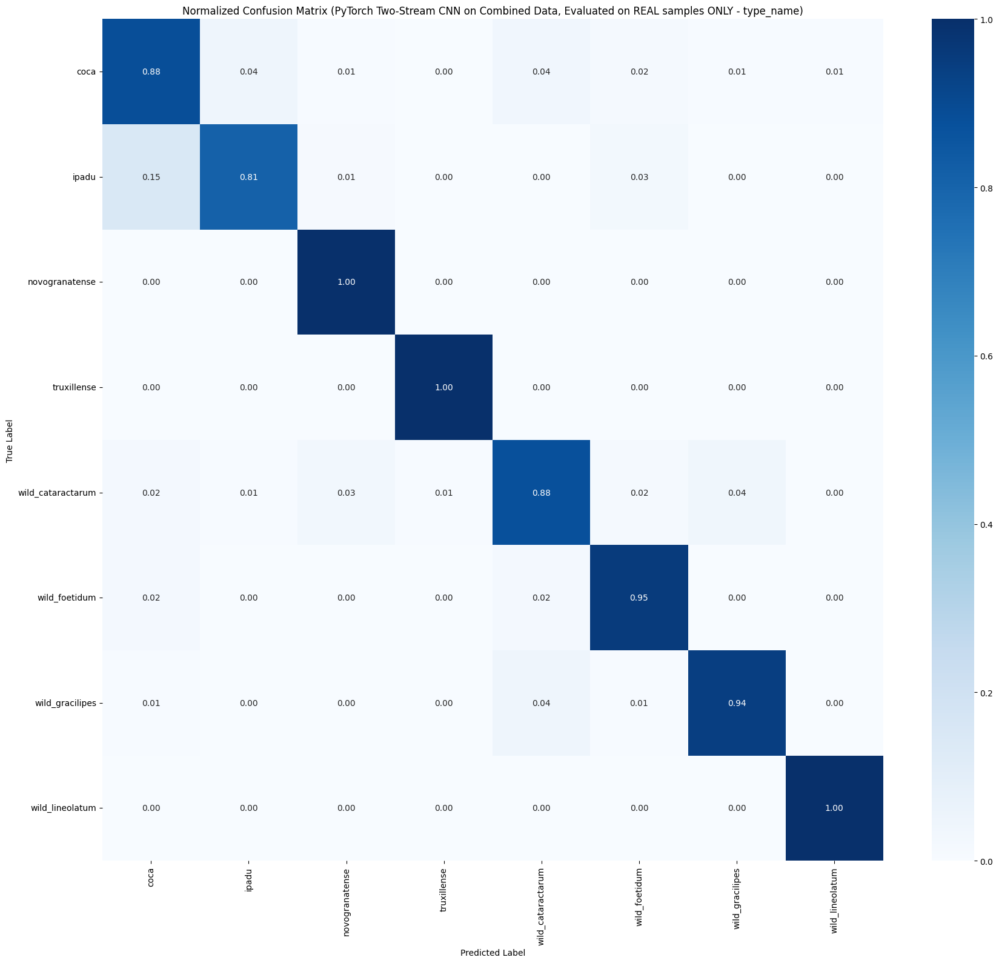

In [26]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
import matplotlib.pyplot as plt
import seaborn as sns
import copy # For deepcopying the best model state

# Essential for ECT generation
import ect
import networkx as nx

# Set a global random seed for all operations where possible
np.random.seed(42)
torch.manual_seed(42)

# --- Configuration ---
# IMPORTANT: This script assumes 'full_name' is your target classification column.
TARGET_COLUMN = 'type_name'
IMAGE_SIZE = 128  # Must match the size used during your image generation
BATCH_SIZE = 32
NUM_EPOCHS = 50 # Maximum epochs, early stopping will likely halt sooner
LEARNING_RATE = 0.001
K_FOLDS = 5
RANDOM_STATE = 42 # For reproducibility of splits and augmentations

# --- Device Setup ---
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("Using device: mps")
else:
    device = torch.device("cpu")
    print("MPS device not found. Using device: cpu")

# --- ASSUMED DATA AVAILABILITY ---
# This script ASSUMES the following variables are already populated in your environment
# from your previous data generation steps:
# proc_arr: (e.g., 769, 99, 2) Original Procrustes coordinates
# all_mdata: (e.g., 769, 4) Original metadata DataFrame including 'full_name'
# proc_arr_augmented: (e.g., 4000, 99, 2) Augmented Procrustes coordinates
# y_augmented: (e.g., 4000,) Augmented labels (as descriptive strings, e.g., 'Species_0')
# X_images_augmented: (e.g., 4000, 128, 128, 1) Augmented raw leaf images

# --- VERIFICATION OF INPUT DATA (Add checks here if you want more robustness) ---
print("--- Pre-augmented data (Procrustes coordinates, Labels, Raw Images) are assumed to be loaded/available. ---")
try:
    print(f"Shape of original Procrustes data (proc_arr): {proc_arr.shape}")
    print(f"Shape of original Metadata (all_mdata): {all_mdata.shape}")
    print(f"Shape of augmented Procrustes data (proc_arr_augmented): {proc_arr_augmented.shape}")
    print(f"Shape of augmented labels (y_augmented): {y_augmented.shape}")
    print(f"Shape of raw images (X_images_augmented): {X_images_augmented.shape}")
except NameError as e:
    print(f"ERROR: Missing expected input variable. Please ensure all data generation steps have been run. {e}")
    # You might want to add sys.exit() or raise an error here if these are critical
    # For now, just printing an error.

# --- Prepare Labels ---
# Ensure y_augmented is a NumPy array of strings before encoding
# (Important for robustness, even if it's already strings)
y_augmented_str = np.array(y_augmented).astype(str)

print(f"\n--- DEBUG: Checking y_augmented before LabelEncoder ---")
print(f"y_augmented original type: {type(y_augmented_str)}")
print(f"y_augmented original dtype: {y_augmented_str.dtype}")
if y_augmented_str.size > 0:
    print(f"First 5 elements of y_augmented (original): {y_augmented_str[:min(5, len(y_augmented_str))]}")
    print(f"Type of first element in y_augmented (original): {type(y_augmented_str[0])}")
print(f"--- END DEBUG ---")


label_encoder = LabelEncoder()
y_encoded_combined = label_encoder.fit_transform(y_augmented_str)
NUM_CLASSES = len(label_encoder.classes_)
print(f"\nNumber of classes for PyTorch CNN ({TARGET_COLUMN}): {NUM_CLASSES}")
print(f"label_encoder.classes_ after fit_transform: {label_encoder.classes_}")
if len(label_encoder.classes_) > 0:
    print(f"Type of first element in label_encoder.classes_: {type(label_encoder.classes_[0])}")


# --- Prepare Raw Image Data for CNN ---
# X_images_augmented is (N, H, W, C) from your provided image generation script.
# PyTorch expects (N, C, H, W). Also normalize pixel values to 0-1.
X_combined_images = np.transpose(X_images_augmented, (0, 3, 1, 2)).astype(np.float32) / 255.0
print(f"Shape of X_combined_images (N, C, H, W, normalized): {X_combined_images.shape}")


# --- Generate ECT Images from Augmented Procrustes Data ---
# This part is kept as it processes proc_arr_augmented, which is an input here.
print(f"--- Generating {proc_arr_augmented.shape[0]} ECT images with size {IMAGE_SIZE}x{IMAGE_SIZE} ---")

# Function to convert Procrustes coordinates to an ECT image
def coords_to_ect_image(coords, image_size):
    # Determine local min/max for scaling within each individual ECT image
    min_x_local, max_x_local = np.min(coords[:, 0]), np.max(coords[:, 0])
    min_y_local, max_y_local = np.min(coords[:, 1]), np.max(coords[:, 1])

    eps = 1e-8 # Small epsilon to prevent division by zero for flat shapes
    scaled_coords_x = (coords[:, 0] - min_x_local) / (max_x_local - min_x_local + eps)
    scaled_coords_y = (coords[:, 1] - min_y_local) / (max_y_local - min_y_local + eps)
    scaled_coords = np.column_stack((scaled_coords_x, scaled_coords_y))

    G = nx.Graph()
    for i, (x, y) in enumerate(scaled_coords):
        G.add_node(i, pos=(x, y))

    num_landmarks = scaled_coords.shape[0]
    if num_landmarks < 2:
        return np.zeros((image_size, image_size), dtype=np.float32)

    # Assuming points form a closed loop for a leaf outline
    for i in range(num_landmarks):
        G.add_edge(i, (i + 1) % num_landmarks)

    embedded_graph = ect.EmbeddedGraph()
    nodes_with_pos = {n: G.nodes[n]['pos'] for n in G.nodes()}
    embedded_graph.add_nodes_from_dict(nodes_with_pos)
    embedded_graph.add_edges_from(G.edges())

    # Define thetas (directions) and thresholds for ECT calculation
    thetas = np.linspace(0, 2 * np.pi, image_size, endpoint=False) # Angles
    thresholds = np.linspace(-1, 1, image_size) # Filter thresholds
    direction_vectors = np.column_stack([np.cos(thetas), np.sin(thetas)])

    ect_calculator = ect.ECT(embedded_graph, direction_vectors, thresholds)
    ect_calculator.directions = ect.Directions.from_vectors(direction_vectors)
    ect_calculator.num_thresh = image_size
    ect_calculator.thresholds = thresholds

    ect_matrix = ect_calculator.calculate(embedded_graph)

    # Normalize ECT matrix to 0-1 range
    ect_min = np.min(ect_matrix)
    ect_max = np.max(ect_matrix)

    if ect_max == ect_min:
        normalized_ect = np.zeros((image_size, image_size), dtype=np.float32)
    else:
        normalized_ect = (ect_matrix - ect_min) / (ect_max - ect_min)

    return normalized_ect

X_ect_images = []
for i, procrustes_coords in enumerate(proc_arr_augmented):
    ect_img = coords_to_ect_image(procrustes_coords, IMAGE_SIZE)
    X_ect_images.append(ect_img)

X_ect_images = np.array(X_ect_images, dtype=np.float32)
# Reshape for PyTorch CNN (num_samples, channels, height, width)
# ECT images are grayscale, so 1 channel
X_ect_images = X_ect_images.reshape(-1, 1, IMAGE_SIZE, IMAGE_SIZE)

print(f"Shape of generated ECT image dataset (X_ect_images): {X_ect_images.shape}")
print("--- ECT Image Generation Complete ---")


# --- PyTorch Two-Stream CNN Model Definition ---
class TwoStreamCNN(nn.Module):
    def __init__(self, num_classes, image_size, img_channels=1, ect_channels=1):
        super(TwoStreamCNN, self).__init__()

        # Stream for Original Images
        self.image_stream = nn.Sequential(
            nn.Conv2d(img_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # Stream for ECT Images
        self.ect_stream = nn.Sequential(
            nn.Conv2d(ect_channels, 32, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # IMPORTANT FIX: Move streams to device *before* dummy input calculation
        # This ensures their weights are on the correct device when dummy inputs are processed.
        self.image_stream.to(device)
        self.ect_stream.to(device)


        # Calculate input features for the linear layer dynamically
        with torch.no_grad():
            # Create dummy inputs on the correct device
            dummy_input_img = torch.zeros(1, img_channels, image_size, image_size).to(device)
            dummy_input_ect = torch.zeros(1, ect_channels, image_size, image_size).to(device)

            flattened_size_img = self.image_stream(dummy_input_img).view(1, -1).shape[1]
            flattened_size_ect = self.ect_stream(dummy_input_ect).view(1, -1).shape[1]

            total_flattened_size = flattened_size_img + flattened_size_ect

            # --- DEBUG PRINTS FOR FLATTENED SIZES ---
            print(f"DEBUG (Model Init): Flattened size of Image Stream: {flattened_size_img}")
            print(f"DEBUG (Model Init): Flattened size of ECT Stream: {flattened_size_ect}")
            print(f"DEBUG (Model Init): Total Flattened Size for FC Layer: {total_flattened_size}")
            # --- END DEBUG PRINTS ---

        self.fc_layers = nn.Sequential(
            nn.Linear(total_flattened_size, 512),
            nn.ReLU(),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes)
        )

    def forward(self, img_input, ect_input):
        img_features = self.image_stream(img_input)
        ect_features = self.ect_stream(ect_input)

        img_features = img_features.view(img_features.size(0), -1)
        ect_features = ect_features.view(ect_features.size(0), -1)

        # Concatenate features from both streams
        combined_features = torch.cat((img_features, ect_features), dim=1)

        output = self.fc_layers(combined_features)
        return output

# --- 5-Fold Stratified Cross-Validation (Evaluating on REAL samples Only) ---
print(f"--- Performing PyTorch Two-Stream CNN with {K_FOLDS}-Fold Stratified Cross-Validation on Combined Data (Evaluating on REAL samples) ---")

# Determine which samples in the combined_augmented data are 'real' originals.
# Assuming 'proc_arr.shape[0]' gives the number of original real samples.
num_original_real_samples = proc_arr.shape[0]

# Prepare the 'real' portion of the data for Stratified K-Fold splitting.
# These are the original samples that were NOT synthetically augmented.
X_original_images_for_skf = X_combined_images[:num_original_real_samples]
X_original_ect_for_skf = X_ect_images[:num_original_real_samples]
y_original_for_skf = y_encoded_combined[:num_original_real_samples] # These are the encoded (integer) labels for SKF

skf = StratifiedKFold(n_splits=K_FOLDS, shuffle=True, random_state=RANDOM_STATE)

all_predictions_logits = []

for fold_idx, (train_original_real_indices, val_original_real_indices) in enumerate(skf.split(X_original_images_for_skf, y_original_for_skf)):
    print(f"\n--- Fold {fold_idx + 1}/{K_FOLDS} ---")

    # --- Prepare Validation Data (ONLY REAL SAMPLES for this fold's validation split) ---
    X_val_img_fold = X_original_images_for_skf[val_original_real_indices]
    X_val_ect_fold = X_original_ect_for_skf[val_original_real_indices]
    y_val_fold = y_original_for_skf[val_original_real_indices]

    X_val_img_fold_tensor = torch.tensor(X_val_img_fold, dtype=torch.float32).to(device)
    X_val_ect_fold_tensor = torch.tensor(X_val_ect_fold, dtype=torch.float32).to(device)
    y_val_fold_tensor = torch.tensor(y_val_fold, dtype=torch.long).to(device)

    val_dataset = TensorDataset(X_val_img_fold_tensor, X_val_ect_fold_tensor, y_val_fold_tensor)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)

    # --- Prepare Training Data (REAL TRAIN SAMPLES + ALL AUGMENTED SAMPLES) ---
    # Indices for the synthetically augmented data (which starts after original_real_samples)
    augmented_indices_in_combined = np.arange(num_original_real_samples, len(y_encoded_combined))

    # Combine indices of real training samples for this fold with all augmented samples
    all_training_indices_in_combined = np.concatenate((
        train_original_real_indices,
        augmented_indices_in_combined
    ))

    # Fetch corresponding data for training
    X_train_img_fold_tensor = torch.tensor(X_combined_images[all_training_indices_in_combined], dtype=torch.float32).to(device)
    X_train_ect_fold_tensor = torch.tensor(X_ect_images[all_training_indices_in_combined], dtype=torch.float32).to(device)
    y_train_fold_tensor = torch.tensor(y_encoded_combined[all_training_indices_in_combined], dtype=torch.long).to(device)

    train_dataset = TensorDataset(X_train_img_fold_tensor, X_train_ect_fold_tensor, y_train_fold_tensor)
    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)


    # --- Model Initialization and Training Loop ---
    model = TwoStreamCNN(NUM_CLASSES, IMAGE_SIZE, img_channels=1, ect_channels=1).to(device) # .to(device) here moves the *entire* model
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

    best_val_loss = float('inf')
    epochs_no_improve = 0
    best_model_wts = copy.deepcopy(model.state_dict())

    for epoch in range(NUM_EPOCHS):
        model.train()
        train_loss = 0.0
        for img_inputs, ect_inputs, labels in train_loader:
            optimizer.zero_grad()
            outputs = model(img_inputs, ect_inputs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * img_inputs.size(0)

        train_loss /= len(train_dataset)

        model.eval()
        val_loss = 0.0
        correct_predictions = 0
        total_predictions = 0
        with torch.no_grad():
            for img_inputs, ect_inputs, labels in val_loader:
                outputs = model(img_inputs, ect_inputs)
                loss = criterion(outputs, labels)
                val_loss += loss.item() * img_inputs.size(0)
                _, predicted = torch.max(outputs.data, 1)
                total_predictions += labels.size(0)
                correct_predictions += (predicted == labels).sum().item()

        val_loss /= len(val_dataset)
        val_accuracy = correct_predictions / total_predictions

        print(f"Epoch {epoch + 1}/{NUM_EPOCHS}, Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

        if val_loss < best_val_loss:
            best_val_loss = val_loss
            best_model_wts = copy.deepcopy(model.state_dict())
            epochs_no_improve = 0
        else:
            epochs_no_improve += 1
            if epochs_no_improve == 10: # Early stopping patience
                print(f"Early stopping at epoch {epoch+1} due to no improvement in validation loss.")
                break

    model.load_state_dict(best_model_wts)
    print(f"Fold {fold_idx + 1} training complete. Best validation loss: {best_val_loss:.4f}")

    # --- Evaluate Best Model on ALL ORIGINAL REAL SAMPLES for Ensembling ---
    # We predict on the *entire* set of original real samples in each fold's best model,
    # then average these predictions at the end for final evaluation.
    model.eval()
    fold_predictions_logits = []

    X_real_img_tensor_all = torch.tensor(X_original_images_for_skf, dtype=torch.float32).to(device)
    X_real_ect_tensor_all = torch.tensor(X_original_ect_for_skf, dtype=torch.float32).to(device)
    # y_real_labels_all not strictly needed here for prediction, but for consistency in TensorDataset
    y_real_labels_all = torch.tensor(y_original_for_skf, dtype=torch.long).to(device)

    real_dataset_for_pred = TensorDataset(X_real_img_tensor_all, X_real_ect_tensor_all, y_real_labels_all)
    real_loader_for_pred = DataLoader(real_dataset_for_pred, batch_size=BATCH_SIZE, shuffle=False)

    with torch.no_grad():
        for img_inputs, ect_inputs, _ in real_loader_for_pred:
            outputs = model(img_inputs, ect_inputs)
            fold_predictions_logits.append(outputs.cpu().numpy())

    all_predictions_logits.append(np.concatenate(fold_predictions_logits, axis=0))

# --- Final Evaluation on REAL samples Only (using ensemble of fold models) ---

# Average the logits from all folds for each sample
averaged_logits = np.mean(np.array(all_predictions_logits), axis=0)
final_predictions_encoded = np.argmax(averaged_logits, axis=1)

# True labels for the entire original real dataset
final_true_labels_encoded = y_original_for_skf

# Inverse transform to get string names for reporting
final_true_labels_names = label_encoder.inverse_transform(final_true_labels_encoded)
final_predictions_names = label_encoder.inverse_transform(final_predictions_encoded)

overall_accuracy = accuracy_score(final_true_labels_names, final_predictions_names)
print(f"\n--- Overall Accuracy (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}): {overall_accuracy:.4f} ---")

print(f"\n--- Classification Report (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN}) ---")
print(classification_report(final_true_labels_names, final_predictions_names, target_names=list(label_encoder.classes_), zero_division=0))

# --- Confusion Matrix Visualization (Raw Counts) ---
cm_real_pt = confusion_matrix(final_true_labels_names, final_predictions_names, labels=label_encoder.classes_)

plt.figure(figsize=(18, 16))
sns.heatmap(cm_real_pt, annot=True, fmt='d', cmap='Blues', cbar=False,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Confusion Matrix (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

# --- Confusion Matrix Visualization (Normalized) ---
cm_normalized_real_pt = cm_real_pt.astype('float') / cm_real_pt.sum(axis=1)[:, np.newaxis]
cm_normalized_real_pt[np.isnan(cm_normalized_real_pt)] = 0 # Handle cases where a class has no true samples

plt.figure(figsize=(18, 16))
sns.heatmap(cm_normalized_real_pt, annot=True, fmt='.2f', cmap='Blues', cbar=True,
            xticklabels=label_encoder.classes_, yticklabels=label_encoder.classes_)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title(f'Normalized Confusion Matrix (PyTorch Two-Stream CNN on Combined Data, Evaluated on REAL samples ONLY - {TARGET_COLUMN})')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

### PHATE (Potential of Heat-diffusion for Affinity-based Trajectory Embedding)

Create classes of leaves to analyze

In [28]:
# create "grac_cata", "line_foet", "cult" column in df all_mdata

types = [] # store type names

for i in range(len(all_mdata)):
    if "grac" in all_mdata["type_name"].iloc[i]:
        types.append("grac_cata")
    elif "cata" in all_mdata["type_name"].iloc[i]:
        types.append("grac_cata")
    elif "line" in all_mdata["type_name"].iloc[i]:
        types.append("line_foet")
    elif "foet" in all_mdata["type_name"].iloc[i]:
        types.append("line_foet")
    else:
        types.append("cult")

# add to dataframe
all_mdata["type"] = types  


In [29]:
# create a flat array of Procrustes shapes
flat_arr = np.reshape(proc_arr,(np.shape(proc_arr)[0],
                                np.shape(proc_arr)[1]*np.shape(proc_arr)[2]))

# perform PHATE
phate_operator = phate.PHATE(n_components=3,random_state=42)
phate_cult_wild = phate_operator.fit_transform(flat_arr)

# save PHATE scores to df
all_mdata["PHATE1"] = phate_cult_wild[:,0]
all_mdata["PHATE2"] = phate_cult_wild[:,1]
all_mdata["PHATE3"] = phate_cult_wild[:,2]

Calculating PHATE...
  Running PHATE on 769 observations and 198 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 4.65 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.07 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 4.77 seconds.
  Calculating optimal t...
    Automatically selected t = 31
  Calculated optimal t in 0.38 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.35 seconds.
  Calculating metric MDS...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


  Calculated metric MDS in 2.64 seconds.
Calculated PHATE in 8.15 seconds.


Visualize PHATE space

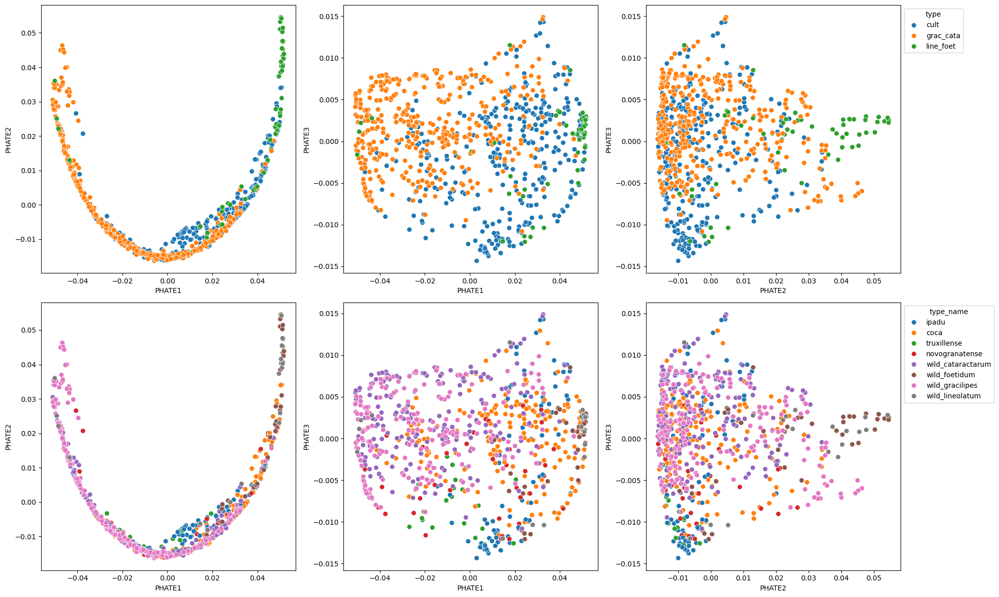

In [31]:
plt.figure(figsize=(20,12))

plt.subplot(231)
sns.scatterplot(data=all_mdata, x="PHATE1", y="PHATE2", hue="type", s=50, legend=None)

plt.subplot(232)
sns.scatterplot(data=all_mdata, x="PHATE1", y="PHATE3", hue="type", s=50, legend=None)

plt.subplot(233)
ax1 = sns.scatterplot(data=all_mdata, x="PHATE2", y="PHATE3", hue="type", s=50)
sns.move_legend(ax1, "upper left", bbox_to_anchor=(1, 1))

plt.subplot(234)
sns.scatterplot(data=all_mdata, x="PHATE1", y="PHATE2", hue="type_name", s=50, legend=None)

plt.subplot(235)
sns.scatterplot(data=all_mdata, x="PHATE1", y="PHATE3", hue="type_name", s=50, legend=None)

plt.subplot(236)
ax2 = sns.scatterplot(data=all_mdata, x="PHATE2", y="PHATE3", hue="type_name", s=50)
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))

plt.tight_layout()

plt.savefig("figure_4a.png")

### Comparison of grac_cata, line_foet, and cultivated types

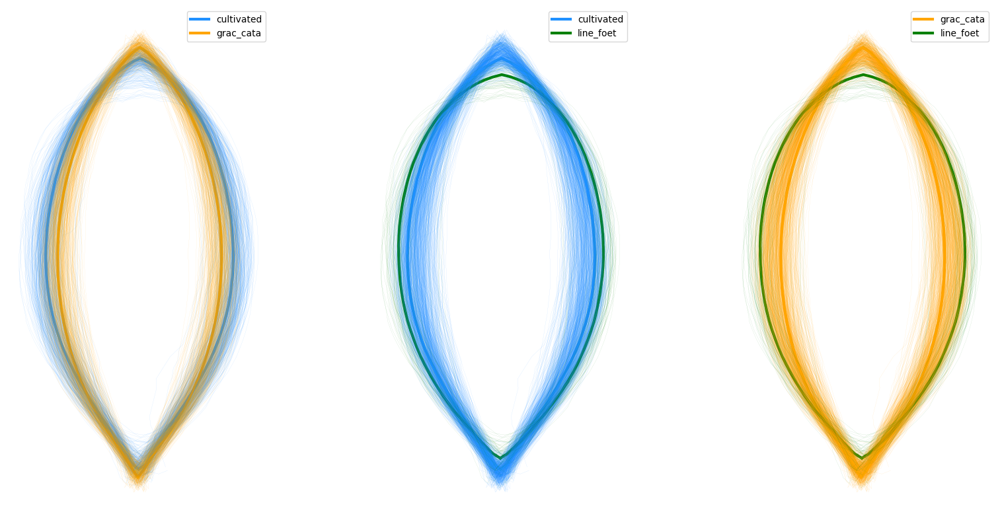

In [33]:
# get grac_cata, line_foet, and cultivated leaf coords from proc_arr using indices from df all_mdata
cult_lfs = proc_arr[np.array(all_mdata[all_mdata["type"]=="cult"].index)]
grac_cata_lfs = proc_arr[np.array(all_mdata[all_mdata["type"]=="grac_cata"].index)]
line_foet_lfs = proc_arr[np.array(all_mdata[all_mdata["type"]=="line_foet"].index)]

# create mean leaves for grac_cata, line_foet, and cultivated, pairwise combinations, and overall mean
cult_mean = np.mean(cult_lfs, axis=0)
grac_cata_mean = np.mean(grac_cata_lfs, axis=0)
line_foet_mean = np.mean(line_foet_lfs, axis=0)

cult_GC_mean = np.mean(np.row_stack((cult_lfs, grac_cata_lfs)), axis=0)
cult_LF_mean = np.mean(np.row_stack((cult_lfs, line_foet_lfs)), axis=0)
GC_LF_mean = np.mean(np.row_stack((grac_cata_lfs, line_foet_lfs)), axis=0)

overall_mean = np.mean(proc_arr, axis=0)

# plot our comparison of grac_cata, line_foet, cultivated procrustean leaves and means
plt.figure(figsize=(20,10))

cult_col = "dodgerblue"
grac_cata_col = "orange"
line_foet_col = "green"

#########################
# cultivated vs grac_cata
#########################

plt.subplot(131)
plt.plot(cult_mean[:,0],cult_mean[:,1], c=cult_col, lw=3, label="cultivated")
plt.plot(grac_cata_mean[:,0],grac_cata_mean[:,1], c=grac_cata_col, lw=3, label="grac_cata")
plt.legend()

for i in range(len(proc_arr)):

    if all_mdata["type"].iloc[i]=="grac_cata":
        col = grac_cata_col
    else:
        col = cult_col

    plt.plot(proc_arr[i,:,0],proc_arr[i,:,1], c=col, lw=0.05, alpha=0.8)
    plt.gca().set_aspect("equal")

plt.axis("off")

#########################
# cultivated vs line_foet
#########################

plt.subplot(132)
plt.plot(cult_mean[:,0],cult_mean[:,1], c=cult_col, lw=3, label="cultivated")
plt.plot(line_foet_mean[:,0],line_foet_mean[:,1], c=line_foet_col, lw=3, label="line_foet")
plt.legend()

for i in range(len(proc_arr)):

    if all_mdata["type"].iloc[i]=="line_foet":
        col = line_foet_col
    else:
        col = cult_col

    plt.plot(proc_arr[i,:,0],proc_arr[i,:,1], c=col, lw=0.05, alpha=0.8)
    plt.gca().set_aspect("equal")

plt.axis("off")

#########################
# grac_cata vs line_foet
#########################

plt.subplot(133)
plt.plot(grac_cata_mean[:,0],grac_cata_mean[:,1], c=grac_cata_col, lw=3, label="grac_cata")
plt.plot(line_foet_mean[:,0],line_foet_mean[:,1], c=line_foet_col, lw=3, label="line_foet")
plt.legend()

for i in range(len(proc_arr)):

    if all_mdata["type"].iloc[i]=="line_foet":
        col = line_foet_col
    else:
        col = grac_cata_col

    plt.plot(proc_arr[i,:,0],proc_arr[i,:,1], c=col, lw=0.05, alpha=0.8)
    plt.gca().set_aspect("equal")

plt.axis("off")

plt.savefig("figure_4b.png")


For each pseudo-landmark, use a Kruskal-Wallis test to compare the Euclidean distance to the group mean compared to the overall mean

In [34]:
#########################
#########################
### GRAC_CATA VS CULT ###
#########################
#########################

grac_cata_cult_p_vals = [] # store p values for each landmark

for i in range(np.shape(proc_arr)[1]):

    ## GROUP 1##
    # eulidean distances of cultivated sample to cultivated mean
    cult_eds = euclid_dist(cult_lfs[:,i,0],cult_lfs[:,i,1],
                cult_mean[i,0],cult_mean[i,1])
    # eulidean distances of grac_cata sample to grac_cata mean
    grac_cata_eds = euclid_dist(grac_cata_lfs[:,i,0],grac_cata_lfs[:,i,1],
                grac_cata_mean[i,0],grac_cata_mean[i,1])
    # group 1 = euclidean distances to group mean
    group1 = np.concatenate((cult_eds, grac_cata_eds))

    ## GROUP 2##
    # eulidean distances of cultivated sample to pairwise mean
    ovr_cult_eds = euclid_dist(cult_lfs[:,i,0],cult_lfs[:,i,1],
                cult_GC_mean[i,0],cult_GC_mean[i,1])
    # eulidean distances of grac_cata sample to pairwise mean
    ovr_grac_cata_eds = euclid_dist(grac_cata_lfs[:,i,0],grac_cata_lfs[:,i,1],
                cult_GC_mean[i,0],cult_GC_mean[i,1])
    # group 2 = euclidean distances to group mean
    group2 = np.concatenate((ovr_cult_eds, ovr_grac_cata_eds))
    
    # perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(group1, group2)
    # store p value
    grac_cata_cult_p_vals.append(p_value)
    
# Adjust p-values using the Bonferroni correction
grac_cata_cult_fdrBH_pvals = multitest.multipletests(grac_cata_cult_p_vals, method='fdr_bh')

# get -log10 p values
grac_cata_cult_neg_log10 = -np.log10(grac_cata_cult_fdrBH_pvals[1])

#########################
#########################
### LINE_FOET VS CULT ###
#########################
#########################

line_foet_cult_p_vals = [] # store p values for each landmark

for i in range(np.shape(proc_arr)[1]):

    ## GROUP 1##
    # eulidean distances of cultivated sample to cultivated mean
    cult_eds = euclid_dist(cult_lfs[:,i,0],cult_lfs[:,i,1],
                cult_mean[i,0],cult_mean[i,1])
    # eulidean distances of line_foet sample to line_foet mean
    line_foet_eds = euclid_dist(line_foet_lfs[:,i,0],line_foet_lfs[:,i,1],
                line_foet_mean[i,0],line_foet_mean[i,1])
    # group 1 = euclidean distances to group mean
    group1 = np.concatenate((cult_eds, line_foet_eds))

    ## GROUP 2##
    # eulidean distances of cultivated sample to pairwise mean
    ovr_cult_eds = euclid_dist(cult_lfs[:,i,0],cult_lfs[:,i,1],
                cult_LF_mean[i,0],cult_LF_mean[i,1])
    # eulidean distances of line_foet sample to pairwise mean
    ovr_line_foet_eds = euclid_dist(line_foet_lfs[:,i,0],line_foet_lfs[:,i,1],
                cult_LF_mean[i,0],cult_LF_mean[i,1])
    # group 2 = euclidean distances to group mean
    group2 = np.concatenate((ovr_cult_eds, ovr_line_foet_eds))
    
    # perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(group1, group2)
    # store p value
    line_foet_cult_p_vals.append(p_value)
    
# Adjust p-values using the Bonferroni correction
line_foet_cult_fdrBH_pvals = multitest.multipletests(line_foet_cult_p_vals, method='fdr_bh')

# get -log10 p values
line_foet_cult_neg_log10 = -np.log10(line_foet_cult_fdrBH_pvals[1])

###############################
###############################
### GRAC_CATA VS LINE_FOET  ###
###############################
###############################

line_foet_grac_cata_p_vals = [] # store p values for each landmark

for i in range(np.shape(proc_arr)[1]):

    ## GROUP 1##
    # eulidean distances of grac_cata sample to grac_cata mean
    grac_cata_eds = euclid_dist(grac_cata_lfs[:,i,0],grac_cata_lfs[:,i,1],
                grac_cata_mean[i,0],grac_cata_mean[i,1])
    # eulidean distances of line_foet sample to line_foet mean
    line_foet_eds = euclid_dist(line_foet_lfs[:,i,0],line_foet_lfs[:,i,1],
                line_foet_mean[i,0],line_foet_mean[i,1])
    # group 1 = euclidean distances to group mean
    group1 = np.concatenate((grac_cata_eds, line_foet_eds))

    ## GROUP 2##
    # eulidean distances of cultivated sample to pairwise mean
    ovr_grac_cata_eds = euclid_dist(grac_cata_lfs[:,i,0],grac_cata_lfs[:,i,1],
                GC_LF_mean[i,0],GC_LF_mean[i,1])
    # eulidean distances of line_foet sample to pairwise mean
    ovr_line_foet_eds = euclid_dist(line_foet_lfs[:,i,0],line_foet_lfs[:,i,1],
                GC_LF_mean[i,0],GC_LF_mean[i,1])
    # group 2 = euclidean distances to group mean
    group2 = np.concatenate((ovr_grac_cata_eds, ovr_line_foet_eds))
    
    # perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(group1, group2)
    # store p value
    line_foet_grac_cata_p_vals.append(p_value)
    
# Adjust p-values using the FDR BH correction
line_foet_grac_cata_fdrBH_pvals = multitest.multipletests(line_foet_grac_cata_p_vals, method='fdr_bh')

# get -log10 p values
line_foet_grac_cata_neg_log10 = -np.log10(line_foet_grac_cata_fdrBH_pvals[1])

#######################
#######################
### CREATE PVAL DF  ###
#######################
#######################

# create a pandas dataframe with overall mean leaf coordinates for plotting
pval_df = pd.DataFrame({"xval":overall_mean[:,0],
                        "yval":overall_mean[:,1],
                        "GC_C_pval":grac_cata_cult_neg_log10,
                       "LF_C_pval":line_foet_cult_neg_log10,
                       "GC_LF_pval":line_foet_grac_cata_neg_log10})


In [35]:
# Reset -log10 p values to -log10(0.05) if equal to or lower than that value for plotting

pval_df["GC_C_pval"] = np.where(pval_df["GC_C_pval"]<=-np.log10(0.05), -np.log10(0.05), pval_df["GC_C_pval"])
pval_df["LF_C_pval"] = np.where(pval_df["LF_C_pval"]<=-np.log10(0.05), -np.log10(0.05), pval_df["LF_C_pval"])
pval_df["GC_LF_pval"] = np.where(pval_df["GC_LF_pval"]<=-np.log10(0.05), -np.log10(0.05), pval_df["GC_LF_pval"])

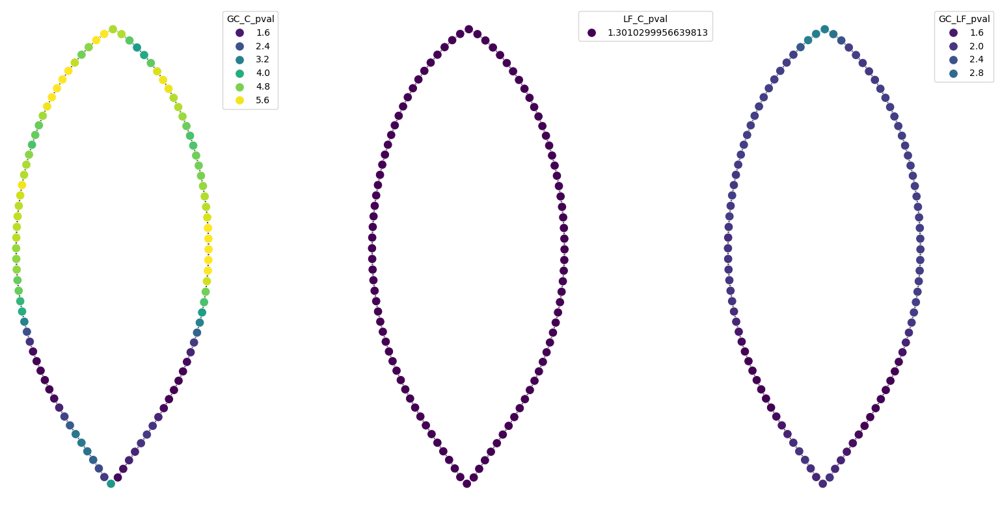

In [37]:
# project negative log10 FDR BH pvals on mean leaf

plt.figure(figsize=(20,10))

plt.subplot(131)
plt.plot(pval_df["xval"],pval_df["yval"], c="k", zorder=0) # plot of mean leaf
ax=sns.scatterplot(data=pval_df, x="xval", y="yval", hue="GC_C_pval", palette="viridis", s=100, 
                   hue_norm=plt.Normalize(-np.log10(0.05), np.max(grac_cata_cult_neg_log10))
                  ) # pvals
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.gca().set_aspect("equal")
plt.axis("off")

plt.subplot(132)
plt.plot(pval_df["xval"],pval_df["yval"], c="k", zorder=0) # plot of mean leaf
ax=sns.scatterplot(data=pval_df, x="xval", y="yval", hue="LF_C_pval", palette="viridis", s=100,
                  hue_norm=plt.Normalize(-np.log10(0.05), np.max(grac_cata_cult_neg_log10))
                  ) # pvals
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.gca().set_aspect("equal")
plt.axis("off")

plt.subplot(133)
plt.plot(pval_df["xval"],pval_df["yval"], c="k", zorder=0) # plot of mean leaf
ax=sns.scatterplot(data=pval_df, x="xval", y="yval", hue="GC_LF_pval", palette="viridis", s=100,
                  hue_norm=plt.Normalize(-np.log10(0.05), np.max(grac_cata_cult_neg_log10))
                  ) # pvals
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig("figure_4c.png")

______
### Cultivated analysis
________

### Read in *cultivated* data
Read in the cultivated data again, but with petioles this time.

In [38]:
########################
### READ IN METADATA ###
########################

mdata = pd.read_csv("./cultivated_metadata.csv") # read in csv

mdata.head() # head data to check

,file,variety,full_name,type,plant,leaf,px_cm,base_x,base_y,tip_x,tip_y
0,AMA1_d.tif,AMA,amazona,ipadu,1,d,28.42,95.5,180.5,305.5,197.5
1,AMA1_c.tif,AMA,amazona,ipadu,1,c,28.42,107.0,206.0,293.5,193.5
2,AMA1_b.tif,AMA,amazona,ipadu,1,b,28.42,94.0,203.0,305.5,194.5
3,AMA1_a.tif,AMA,amazona,ipadu,1,a,28.42,94.5,201.5,306.5,191.5
4,AMA4_e.tif,AMA,amazona,ipadu,4,e,28.42,85.5,203.5,313.5,200.5


In [39]:
#######################################
### MAKE A LIST OF IMAGE FILE NAMES ###
#######################################

data_dir = "./cultivated_images_with_petiole/" # set data directory

file_names = [f for f in listdir(data_dir) if isfile(join(data_dir, f))] # create a list of file names

file_names.remove('.DS_Store') # remove .DS_Store file

file_names.sort() # sort the list of file names

file_names # check list of file names

['AMA1_a.tif',
 'AMA1_b.tif',
 'AMA1_c.tif',
 'AMA1_d.tif',
 'AMA2_a.tif',
 'AMA2_b.tif',
 'AMA2_c.tif',
 'AMA2_d.tif',
 'AMA2_e.tif',
 'AMA3_a.tif',
 'AMA3_b.tif',
 'AMA3_c.tif',
 'AMA3_d.tif',
 'AMA3_e.tif',
 'AMA4_a.tif',
 'AMA4_b.tif',
 'AMA4_c.tif',
 'AMA4_d.tif',
 'AMA4_e.tif',
 'BOB1_a.tif',
 'BOB1_b.tif',
 'BOB1_c.tif',
 'BOB1_d.tif',
 'BOB1_e.tif',
 'BOB2_a.tif',
 'BOB2_b.tif',
 'BOB2_c.tif',
 'BOB2_d.tif',
 'BOB2_e.tif',
 'BOB3_a.tif',
 'BOB3_b.tif',
 'BOB3_c.tif',
 'BOB3_d.tif',
 'BOB3_e.tif',
 'BOB4_a.tif',
 'BOB4_b.tif',
 'BOB4_c.tif',
 'BOB4_d.tif',
 'BOB4_e.tif',
 'BRO1_a.tif',
 'BRO1_b.tif',
 'BRO1_c.tif',
 'BRO1_d.tif',
 'BRO1_e.tif',
 'BRO2_a.tif',
 'BRO2_b.tif',
 'BRO2_c.tif',
 'BRO2_d.tif',
 'BRO2_e.tif',
 'BRO3_a.tif',
 'BRO3_b.tif',
 'BRO3_c.tif',
 'BRO3_d.tif',
 'BRO3_e.tif',
 'BRO4_a.tif',
 'BRO4_b.tif',
 'BRO4_c.tif',
 'BRO4_d.tif',
 'BRO4_e.tif',
 'CHA1_a.tif',
 'CHA1_b.tif',
 'CHA1_c.tif',
 'CHA1_d.tif',
 'CHA1_e.tif',
 'CHA2_a.tif',
 'CHA2_b.tif',
 'CHA2_c.t

### Process and landmark *cultivated* data

- Read in image in grayscale
- Select the contour of the largest object (the leaf)
- Interpolate with a high resolution of pseudo-landmarks
- Find the base and tip index point on the high resolution contour
- Reset the base index to zero
- Interpolate each side with desired number of equidistant pseudo-landmarks
- Rotate leaves and scale to centimeters
- Save pseudo-landmarks scaled to centimeters in an array

PARAMETERS AND INDEXING:
- `high_res_pts` is an arbitrarily high number of points to initially interpolate
- `res` is the desired number of points to interpolate on each side of the leaf
- The total number of pseudo-landmarks will be `2*res - 1`
- The base index will be `0`
- The tip index will be `res-1`
- The returned leaves in `cm_arr` are scaled in size to centimeters

Each cultivated coca variety leaf was read in as a binary image file using the python module OpenCV ([Bradski and Kaehler, 2008](https://www.google.com/books/edition/Learning_OpenCV/seAgiOfu2EIC?hl=en&gbpv=0)). The largest contour was selected as the leaf outline and the manually placed estimations of base and tip points used to find the respective points. Otherwise, pseudo-landmarks were similarly placed for cultivated leaves as they were for wild.

In [40]:
######################
### SET PARAMETERS ###
######################

# the number of equidistant points to create
# an initial high resolution outline of the leaf
high_res_pts = 10000

# the ultimate number of equidistant points on each side of the leaf
# (-1 for the tip)
# the leaf will have res*2-1 pseudo-landmarks
#################
#################
#################
res = 50 ########
#################
#################
#################

# an array to store pseudo-landmarks
cult_cm_arr = np.zeros((len(mdata),(res*2)-1,2))

# for each leaf . . .
for lf in range(len(mdata)):

    ###############################
    ### READ IN GRAYSCALE IMAGE ###
    ###############################

    curr_image = mdata["file"][lf] # select the current image
    print(lf, curr_image) # print each leaf in case there are problems later

    # read in image
    # convert to grayscale
    # invert the binary
    img = cv2.bitwise_not(cv2.cvtColor(cv2.imread(data_dir + curr_image),cv2.COLOR_BGR2GRAY))

    # find contours of binary objects
    contours, hierarchy = cv2.findContours(img,  
        cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    ##############################
    ### SELECT LARGEST CONTOUR ###
    ##############################

    # ideally there is only one leaf in the image
    # in the case there are smaller objects
    # this code selects the largest object (the leaf)
    # if there is one and only one object in the image
    # then the following code is not necessary

    x_conts = [] # list of lists of contour x vals
    y_conts = [] # list of lists of contour y vals
    areas_conts = [] # list of bounding box areas of contours
    for c in contours: # for each contour
        x_vals = [] # store x vals for current contour 
        y_vals = [] # store y vals for current contour
        for i in range(len(c)): # for each point in current contour
            x_vals.append(c[i][0][0]) # isolate x val
            y_vals.append(c[i][0][1]) # isolate y val
        area = (max(x_vals) - min(x_vals))*(max(y_vals) - min(y_vals)) # calculate bounding box area of contour
        x_conts.append(x_vals) # append the current contour x vals
        y_conts.append(y_vals) # append the current contour y vals
        areas_conts.append(area) # append the current contour bounding box areas

    area_inds = np.flip(np.argsort(areas_conts)) # get indices to sort contours by area
    sorted_x_conts = np.array(x_conts, dtype=object)[area_inds][0:] # areas sorted largest to smallest, x vals
    sorted_y_conts = np.array(y_conts, dtype=object)[area_inds][0:] # areas sorted largest to smallest, y vals

    ################################################
    ### INTERPOLATE HIGH RES NUMBER OF LANDMARKS ###
    ################################################

    # convert the leaf to high resolution number of landmarks
    # using high_res_pt value
    # need to convert arrays of pixel int to floats first
    high_res_x, high_res_y = interpolation(np.array(sorted_x_conts[0], dtype=np.float32), 
                                           np.array(sorted_y_conts[0], dtype=np.float32), high_res_pts)

    ###############################
    ### FIND BASE AND TIP INDEX ###
    ###############################

    # get the base and tip landmark point values
    base_pt = np.array((mdata["base_x"][lf], mdata["base_y"][lf]))
    tip_pt = np.array((mdata["tip_x"][lf], mdata["tip_y"][lf]))

    base_dists = [] # store distance of each high res point to base
    tip_dists = [] # store distance of each high res point to tip

    for pt in range(len(high_res_x)): # for each of the high resolution points

        # euclidean distance of the current point from the base and tip landmark
        ed_base = euclid_dist(base_pt[0], base_pt[1], high_res_x[pt], high_res_y[pt])
        ed_tip = euclid_dist(tip_pt[0], tip_pt[1], high_res_x[pt], high_res_y[pt])

        # store distance of current point from base/tip
        base_dists.append(ed_base)
        tip_dists.append(ed_tip)

    # get index of base and tip points
    base_ind = np.argmin(base_dists)
    tip_ind = np.argmin(tip_dists)

    ################################
    ### RESET BASE INDEX TO ZERO ###
    ################################

    # reset base index position to zero
    high_res_x = np.concatenate((high_res_x[base_ind:],high_res_x[:base_ind]))
    high_res_y = np.concatenate((high_res_y[base_ind:],high_res_y[:base_ind]))

    # recalculate indices with new indexing
    tip_ind = tip_ind-base_ind # note: negative index if tip_ind<base_ind
    base_ind = base_ind-base_ind

    # create single array for leaf coordinates
    lf_contour = np.column_stack((high_res_x, high_res_y))

    ##############################################################
    ### INTERPOLATE EACH SIDE WITH DESIRED NUMBER OF LANDMARKS ###
    ##############################################################

    # interpolate at desired resolution the left and right sides of the leaf
    left_inter_x, left_inter_y = interpolation(lf_contour[base_ind:tip_ind+1,0],lf_contour[base_ind:tip_ind+1,1],res)
    right_inter_x, right_inter_y = interpolation(lf_contour[tip_ind:,0],lf_contour[tip_ind:,1],res)

    # the start of the right side and end of the left side
    # both contain the tip landmark
    # delete the last point on the left side
    left_inter_x = np.delete(left_inter_x, -1)
    left_inter_y = np.delete(left_inter_y, -1)

    # BASE OF LEAF IS INDEX 0
    # TIP INDEX IS RES-1 IF BOTH LEFT & RIGHT POINTS
    # TOTAL PSEUDOLANDMARKS IS 2*RES-1
    lf_pts_left = np.column_stack((left_inter_x, left_inter_y))
    lf_pts_right = np.column_stack((right_inter_x, right_inter_y))
    lf_pts = np.row_stack((lf_pts_left, lf_pts_right))

    ##########################################################
    ### ROTATE LEAVES UPWARD AND SCALE SIZE TO CENTIMETERS ###
    ##########################################################

    tip_point = lf_pts[res-1,:] # get tip point
    base_point = lf_pts[0,:] # get base point

    # calculate angle between tip. base, and an arbitrary reference
    ang = angle_between(tip_point, base_point, (base_point[0]+1,base_point[1]) )

    # rotate points upwards
    rot_x, rot_y = rotate_points(lf_pts[:,0], lf_pts[:,1], ang) 
    rot_pts = np.column_stack((rot_x, rot_y))
    
    # calculate leaf area in pixels^2
    lf_area_px2 = poly_area(rot_pts[:,0], rot_pts[:,1])
    
    # get px_cm
    px_cm = mdata["px_cm"][lf]

    # scale leaf into cm
    cm_lf = rot_pts/(px_cm)
    
    # store the leaf scaled into cm into the cm_arr
    cult_cm_arr[lf,:,:] = cm_lf

0 AMA1_d.tif
1 AMA1_c.tif
2 AMA1_b.tif
3 AMA1_a.tif
4 AMA4_e.tif
5 AMA4_d.tif
6 AMA4_c.tif
7 AMA4_b.tif
8 AMA4_a.tif
9 AMA3_e.tif
10 AMA3_d.tif
11 AMA3_c.tif
12 AMA3_b.tif
13 AMA3_a.tif
14 AMA2_e.tif
15 AMA2_d.tif
16 AMA2_c.tif
17 AMA2_b.tif
18 AMA2_a.tif
19 BOB4_e.tif
20 BOB4_d.tif
21 BOB4_c.tif
22 BOB4_b.tif
23 BOB4_a.tif
24 BOB3_e.tif
25 BOB3_d.tif
26 BOB3_c.tif
27 BOB3_b.tif
28 BOB3_a.tif
29 BOB2_e.tif
30 BOB2_d.tif
31 BOB2_c.tif
32 BOB2_b.tif
33 BOB2_a.tif
34 BOB1_e.tif
35 BOB1_d.tif
36 BOB1_c.tif
37 BOB1_b.tif
38 BOB1_a.tif
39 BRO4_e.tif
40 BRO4_d.tif
41 BRO4_c.tif
42 BRO4_b.tif
43 BRO4_a.tif
44 BRO3_e.tif
45 BRO3_d.tif
46 BRO3_c.tif
47 BRO3_b.tif
48 BRO3_a.tif
49 BRO2_e.tif
50 BRO2_d.tif
51 BRO2_c.tif
52 BRO2_b.tif
53 BRO2_a.tif
54 BRO1_e.tif
55 BRO1_d.tif
56 BRO1_c.tif
57 BRO1_b.tif
58 BRO1_a.tif
59 CHA4_e.tif
60 CHA4_d.tif
61 CHA4_c.tif
62 CHA4_b.tif
63 CHA4_a.tif
64 CHA3_e.tif
65 CHA3_d.tif
66 CHA3_c.tif
67 CHA3_b.tif
68 CHA3_a.tif
69 CHA2_e.tif
70 CHA2_d.tif
71 CHA2_c.tif
72

### Procrustes analysis

Perform a Procrustes analysis to translate, scale, and rotate leaf shapes

- Select number of pseudo-landmarks and dimensions
- Calculate the GPA mean leaf shape using the `gpa_mean` function
- Align all leaves to the GPA mean
- Store Procrustes super-imposed leaves in an array, `proc_arr`
- Calculate a PCA for all possible axes and their variance (the number of leaves)
- Calculate a PCA for just the axes needed for reconstruction of eigenleaves for morphospace (probably 2)

Procrustean alignment was carried out for all leaves together. To superimpose contours by minimizing the overall distance between pseudo-landmark values through the functions of translation, scaling, rotation, and reflection, a generalized Procrustes analysis (GPA) is used ([Gower, 1975](https://link.springer.com/article/10.1007/BF02291478)). A function was defined to calculate a GPA mean. To calculate the GPA mean, an arbitrary leaf is first chosen and all other leaves are aligned to it using Procrustean superimposition. A mean from the aligned shapes is calculated, which is used as the reference shape for alignment in the next iteration. The algorithm stops when the Procrustes distance between means calculated between two successive iterations falls below an arbitrarily low value. All leaves are then aligned to the final GPA mean shape. The Procrustean superimposition was visualized for all leaves by plotting each leaf with high transparency together with overall GPA mean and for each cultivated type and each wild species with respect to group means.

In [41]:
landmark_num = (res*2)-1 # select number of landmarks
dim_num = 2 # select number of coordinate value dimensions

##########################
### CALCULATE GPA MEAN ###
##########################

mean_shape = gpa_mean(cult_cm_arr, landmark_num, dim_num)

################################
### ALIGN LEAVES TO GPA MEAN ###
################################

# array to store Procrustes aligned shapes
proc_arr = np.zeros(np.shape(cult_cm_arr)) 

for i in range(len(cult_cm_arr)):
    s1, s2, distance = procrustes(mean_shape, cult_cm_arr[i,:,:]) # calculate procrustes adjusted shape to ref for current leaf
    proc_arr[i] = s2 # store procrustes adjusted shape to array

Visualize all leaves plotted against the mean Procrustes leaf

Text(0.5, 1.0, 'overall mean leaf')

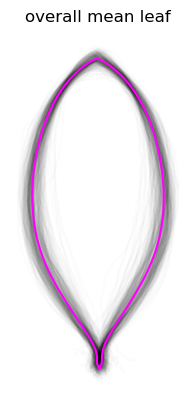

In [42]:
for i in range(len(proc_arr)):
    plt.plot(proc_arr[i,:,0], proc_arr[i,:,1], c="k", alpha=0.01)

plt.plot(np.mean(proc_arr, axis=0)[:,0], np.mean(proc_arr, axis=0)[:,1], c="magenta")
plt.gca().set_aspect("equal")
plt.axis("off")
plt.title("overall mean leaf")

### Check if significant differences between cultivars

For each pairwise combination of cultivars, compare the Procrustes distances to the respective group vs. overall mean to determine if significant differences between cultivar leaf shape. Use significance values to create cultivar morphotypes.

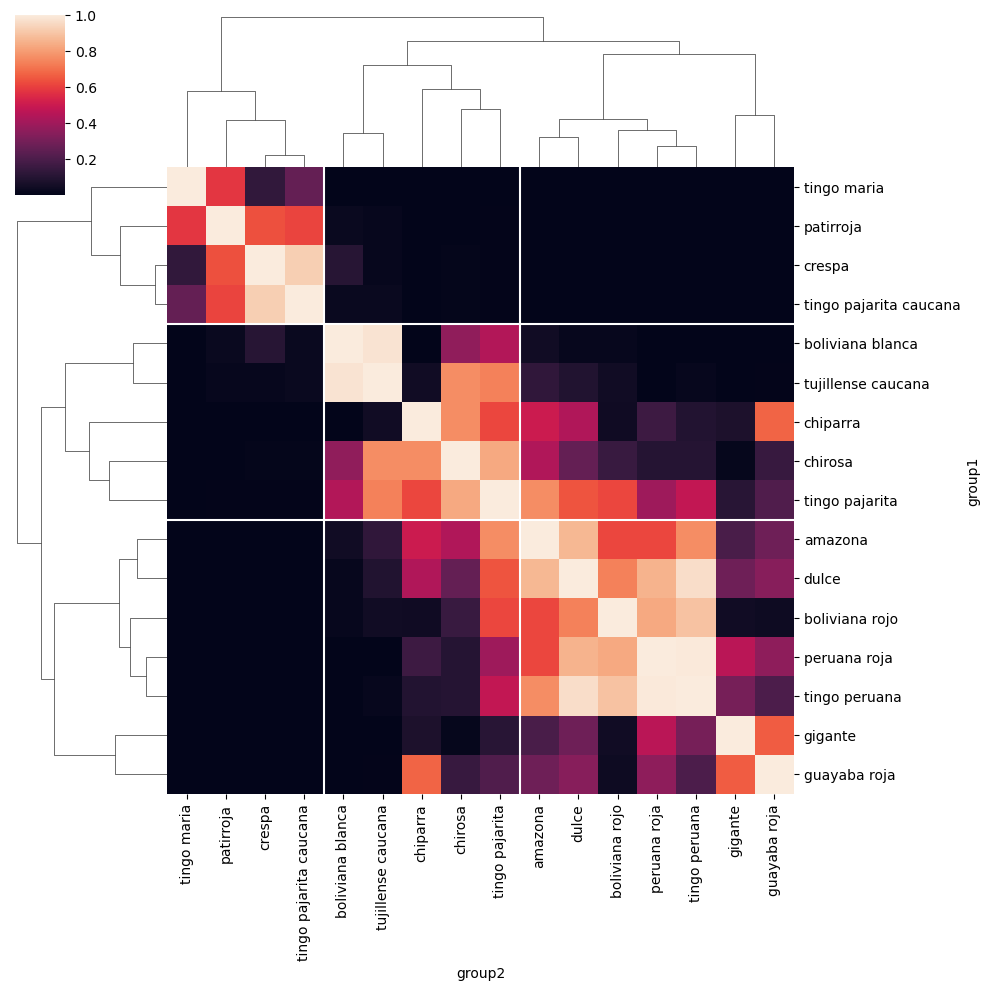

In [44]:
# get all cultivar names
cult_names = mdata["full_name"].unique()

# get all pairwise combinations of cultivar names
combinations = list(itertools.combinations(cult_names, 2))

group1_names = [] # a list to store group1 names
group2_names = [] # a list to store group2 names
p_vals = [] # a list to store pvals

for i in range(len(combinations)): # for each combination

    group1 = combinations[i][0] # get the first group name
    group2 = combinations[i][1] # get the second group name
    
    # get the Procrustean coordinates from each group
    group1_lfs = proc_arr[np.array(mdata[mdata["full_name"]==group1].index)]
    group2_lfs = proc_arr[np.array(mdata[mdata["full_name"]==group2].index)]
    all_lfs = proc_arr[np.array(mdata[(mdata["full_name"]==group1) | (mdata["full_name"]==group2)].index)]
    
    # calculate mean leaf for each group
    group1_mean = np.mean(group1_lfs, axis=0)
    group2_mean = np.mean(group2_lfs, axis=0)
    all_mean = np.mean(all_lfs, axis=0)
    
    # calculate Procrustes distance of each leaf to respective group mean
    group1_dists = []
    for i in range(len(group1_lfs)):
        s1, s2, distance = procrustes(group1_lfs[i,:,:], group1_mean) 
        group1_dists.append(distance)
    
    group2_dists = []
    for i in range(len(group2_lfs)):
        s1, s2, distance = procrustes(group2_lfs[i,:,:], group2_mean) 
        group2_dists.append(distance)
    
    # concatenate arrays to group mean 
    group_mean_dists = np.array(group1_dists+group2_dists)
    
    # calculate Procrustes distance of each leaf to overall mean
    all_dists = []
    for i in range(len(all_lfs)):
        s1, s2, distance = procrustes(all_lfs[i,:,:], all_mean) 
        all_dists.append(distance)
    all_dists = np.array(all_dists)
    
    # calculate p value
    statistic, p_value = stats.kruskal(group_mean_dists, all_dists)

    # store data
    p_vals.append(p_value)
    group1_names.append(group1)
    group2_names.append(group2)

# Adjust p-values using the FDR BH correction
BH_pvals = multitest.multipletests(p_vals, method='fdr_bh', alpha=0.05)

# create a matrix for clustermap
group_df = pd.DataFrame({

    "group1":group1_names,
    "group2":group2_names,
    "significant":BH_pvals[0],
    "BH":BH_pvals[1]
})

inv_group_df = pd.DataFrame({
    "group1":group2_names,
    "group2":group1_names,
    "significant":BH_pvals[0],
    "BH":BH_pvals[1]
})


pairwise_df = pd.concat([group_df, inv_group_df])

matrix = (pairwise_df.pivot(index='group1', columns='group2', values='BH')
   .fillna(1, downcast='infer')
)

g = sns.clustermap(matrix)
ax = g.ax_heatmap
[ax.axhline(y=i, color='white', linestyle='-') for i in [4,9]]
[ax.axvline(x=i, color='white', linestyle='-') for i in [4,9]]

plt.savefig("figure_5a.png")

### Compare average outlines to each other

In [45]:
# create arrays for each variety
GA_C00_tingo_maria_arr = proc_arr[all_mdata[all_mdata["full_name"]=="tingo maria"].index.values,:,:]
GA_C01_patirroja_arr = proc_arr[all_mdata[all_mdata["full_name"]=="patirroja"].index.values,:,:]
GA_T02_crespa_arr = proc_arr[all_mdata[all_mdata["full_name"]=="crespa"].index.values,:,:]
GA_N03_tingo_pajarita_caucana_arr = proc_arr[all_mdata[all_mdata["full_name"]=="tingo pajarita caucana"].index.values,:,:]

GB_I04_boliviana_blanca_arr = proc_arr[all_mdata[all_mdata["full_name"]=="boliviana blanca"].index.values,:,:]
GB_I05_trujillense_caucana_arr = proc_arr[all_mdata[all_mdata["full_name"]=="tujillense caucana"].index.values,:,:]
GB_C06_chiparra_arr = proc_arr[all_mdata[all_mdata["full_name"]=="chiparra"].index.values,:,:]
GB_C07_chirosa_arr = proc_arr[all_mdata[all_mdata["full_name"]=="chirosa"].index.values,:,:]
GB_N08_tingo_pajarita_arr = proc_arr[all_mdata[all_mdata["full_name"]=="tingo pajarita"].index.values,:,:]

GC_I09_amazona_arr = proc_arr[all_mdata[all_mdata["full_name"]=="amazona"].index.values,:,:]
GC_C10_dulce_arr = proc_arr[all_mdata[all_mdata["full_name"]=="dulce"].index.values,:,:]
GC_C11_boliviana_roja_arr = proc_arr[all_mdata[all_mdata["full_name"]=="boliviana rojo"].index.values,:,:]
GC_C12_peruana_roja_arr = proc_arr[all_mdata[all_mdata["full_name"]=="peruana roja"].index.values,:,:]
GC_C13_tingo_peruana_arr = proc_arr[all_mdata[all_mdata["full_name"]=="tingo peruana"].index.values,:,:]
GC_I14_gigante_arr = proc_arr[all_mdata[all_mdata["full_name"]=="gigante"].index.values,:,:]
GC_C15_guayaba_roja_arr = proc_arr[all_mdata[all_mdata["full_name"]=="guayaba roja"].index.values,:,:]

# create list of arrays
array_list = [
    GA_C00_tingo_maria_arr,
    GA_C01_patirroja_arr,
    GA_T02_crespa_arr,
    GA_N03_tingo_pajarita_caucana_arr,


    GB_I04_boliviana_blanca_arr,
    GB_I05_trujillense_caucana_arr,
    GB_C06_chiparra_arr,
    GB_C07_chirosa_arr,
    GB_N08_tingo_pajarita_arr,

    GC_I09_amazona_arr,
    GC_C10_dulce_arr,
    GC_C11_boliviana_roja_arr,
    GC_C12_peruana_roja_arr,
    GC_C13_tingo_peruana_arr,
    GC_I14_gigante_arr,
    GC_C15_guayaba_roja_arr,
]

# a list of group IDs
group_list = ["A","A","A","A",
              "B","B","B","B","B",
              "C","C","C","C","C","C","C"]

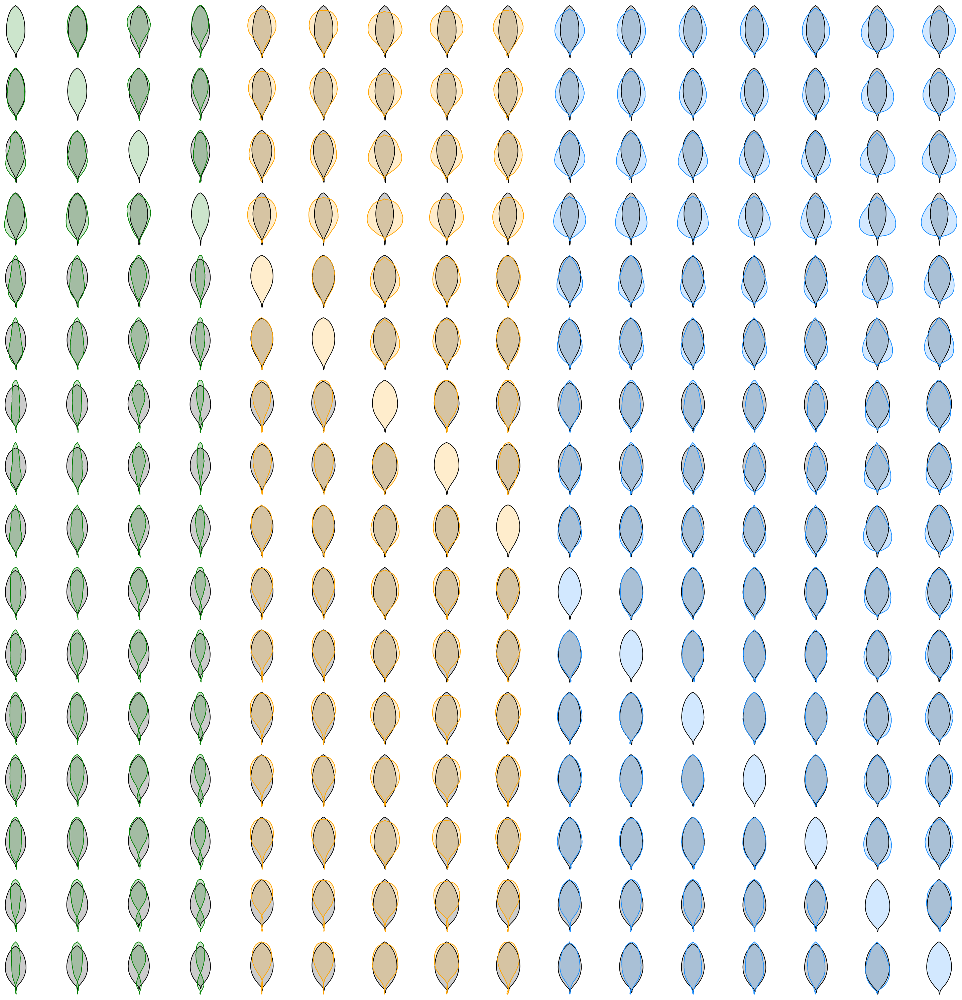

In [47]:
plt.figure(figsize=(30,30))

mag = 3.0

group1_count=0 # count for group1 names
count=1 # count for subplot

for first_arr in array_list:

    group1_name = group_list[group1_count]
    group1_count+=1
    if group1_name=="A":
        g1_col = "green"
    elif group1_name=="B":
        g1_col = "orange"
    elif group1_name=="C":
        g1_col = "dodgerblue"

    group2_count=0 # count for group2 names
    
    for second_arr in array_list:

        group2_name = group_list[group2_count]
        group2_count+=1
        if group2_name=="A":
            g2_col = "green"
        elif group2_name=="B":
            g2_col = "orange"
        elif group2_name=="C":
            g2_col = "dodgerblue"
        
        difference = np.mean(np.mean(second_arr, axis=0) - np.mean(first_arr, axis=0))        
        
        if difference==0:
            plt.subplot(16,16,count)
            plt.fill(np.mean(first_arr, axis=0)[:,0], np.mean(first_arr, axis=0)[:,1], c=g1_col, alpha=0.2)
            plt.plot(np.mean(first_arr, axis=0)[:,0], np.mean(first_arr, axis=0)[:,1], c="k", alpha=1)
            plt.axis("off")
            plt.gca().set_aspect("equal")
            
            count+=1
            
        else:
            
            plt.subplot(16,16,count)
            plt.fill(np.mean(first_arr, axis=0)[:,0], np.mean(first_arr, axis=0)[:,1], c="k", alpha=0.2)
            plt.plot(np.mean(first_arr, axis=0)[:,0], np.mean(first_arr, axis=0)[:,1], c="k", alpha=1)

            diff_arr = np.mean(second_arr, axis=0) - np.mean(first_arr, axis=0)
            mag_arr = np.mean(first_arr, axis=0) + mag*diff_arr

            plt.plot(mag_arr[:,0], mag_arr[:,1], c=g2_col, alpha=1)
            plt.fill(mag_arr[:,0], mag_arr[:,1], c=g2_col, alpha=0.2)


            plt.axis("off")
            plt.gca().set_aspect("equal")

            count+=1
        
plt.tight_layout()

plt.savefig("figure_5b.png")

### PHATE visualization of cultivar groups

Add group identity to mdata df

Calculating PHATE...
  Running PHATE on 319 observations and 198 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 4.08 seconds.
    Calculating KNN search...
    Calculated KNN search in 0.02 seconds.
    Calculating affinities...
  Calculated graph and diffusion operator in 4.14 seconds.
  Calculating optimal t...
    Automatically selected t = 25
  Calculated optimal t in 0.24 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.02 seconds.
  Calculating metric MDS...


/opt/anaconda3/lib/python3.12/site-packages/sklearn/manifold/_mds.py:298: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


  Calculated metric MDS in 0.35 seconds.
Calculated PHATE in 4.77 seconds.


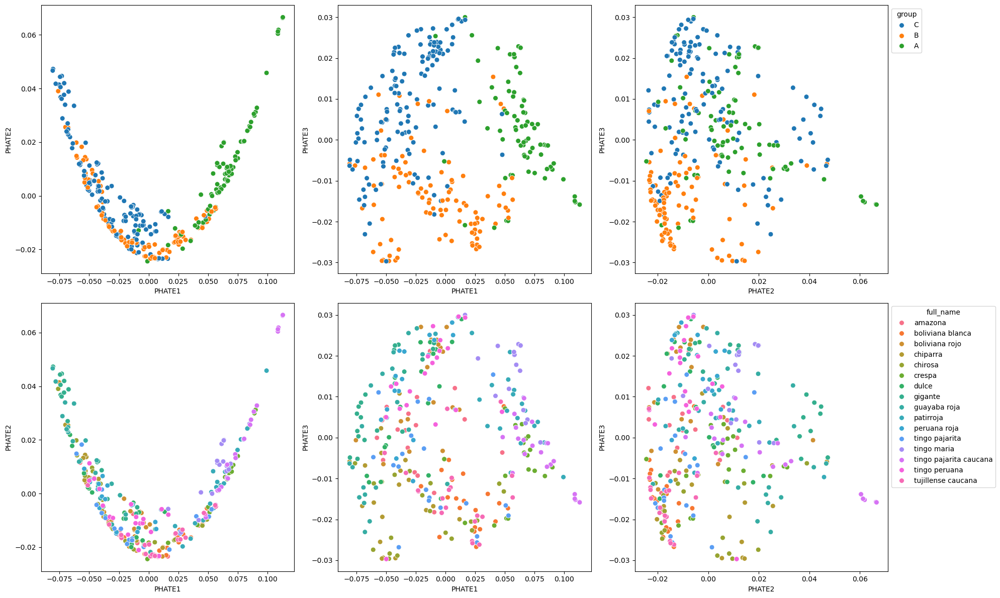

In [55]:
groups = [] # a list of group names

for i in range(len(mdata)):
    if mdata["full_name"].iloc[i]=='tingo maria':
        groups.append("A")
    elif mdata["full_name"].iloc[i]=='patirroja':
        groups.append("A")
    elif mdata["full_name"].iloc[i]=='crespa':
        groups.append("A")
    elif mdata["full_name"].iloc[i]=='tingo pajarita caucana':
        groups.append("A")
    elif mdata["full_name"].iloc[i]=='boliviana blanca':
        groups.append("B")
    elif mdata["full_name"].iloc[i]=='tujillense caucana':
        groups.append("B")
    elif mdata["full_name"].iloc[i]=='chiparra':
        groups.append("B")
    elif mdata["full_name"].iloc[i]=='chirosa':
        groups.append("B")
    elif mdata["full_name"].iloc[i]=='tingo pajarita':
        groups.append("B")
    elif mdata["full_name"].iloc[i]=='amazona':
        groups.append("C")
    elif mdata["full_name"].iloc[i]=='dulce':
        groups.append("C")
    elif mdata["full_name"].iloc[i]=='boliviana rojo':
        groups.append("C")
    elif mdata["full_name"].iloc[i]=='peruana roja':
        groups.append("C")
    elif mdata["full_name"].iloc[i]=='tingo peruana':
        groups.append("C")
    elif mdata["full_name"].iloc[i]=='gigante':
        groups.append("C")
    elif mdata["full_name"].iloc[i]=='guayaba roja':
        groups.append("C")

# save group info
mdata["group"] = groups

# create a flat array of Procrustes shapes
flat_arr = np.reshape(proc_arr,(np.shape(proc_arr)[0],
                                np.shape(proc_arr)[1]*np.shape(proc_arr)[2]))

# perform PHATE
phate_operator = phate.PHATE(n_components=3,random_state=42)
phate_cultivars = phate_operator.fit_transform(flat_arr)

# save PHATE scores to df
mdata["PHATE1"] = phate_cultivars[:,0]
mdata["PHATE2"] = phate_cultivars[:,1]
mdata["PHATE3"] = phate_cultivars[:,2]

# Visualize PHATE
plt.figure(figsize=(20,12))

plt.subplot(231)
sns.scatterplot(data=mdata, x="PHATE1", y="PHATE2", hue="group", s=50, legend=None)

plt.subplot(232)
sns.scatterplot(data=mdata, x="PHATE1", y="PHATE3", hue="group", s=50, legend=None)

plt.subplot(233)
ax1 = sns.scatterplot(data=mdata, x="PHATE2", y="PHATE3", hue="group", s=50)
sns.move_legend(ax1, "upper left", bbox_to_anchor=(1, 1))

plt.subplot(234)
sns.scatterplot(data=mdata, x="PHATE1", y="PHATE2", hue="full_name", s=50, legend=None)

plt.subplot(235)
sns.scatterplot(data=mdata, x="PHATE1", y="PHATE3", hue="full_name", s=50, legend=None)

plt.subplot(236)
ax2 = sns.scatterplot(data=mdata, x="PHATE2", y="PHATE3", hue="full_name", s=50)
sns.move_legend(ax2, "upper left", bbox_to_anchor=(1, 1))

plt.tight_layout()

plt.savefig("figure_6a.png")

### Comparison of Group A, B, and C types

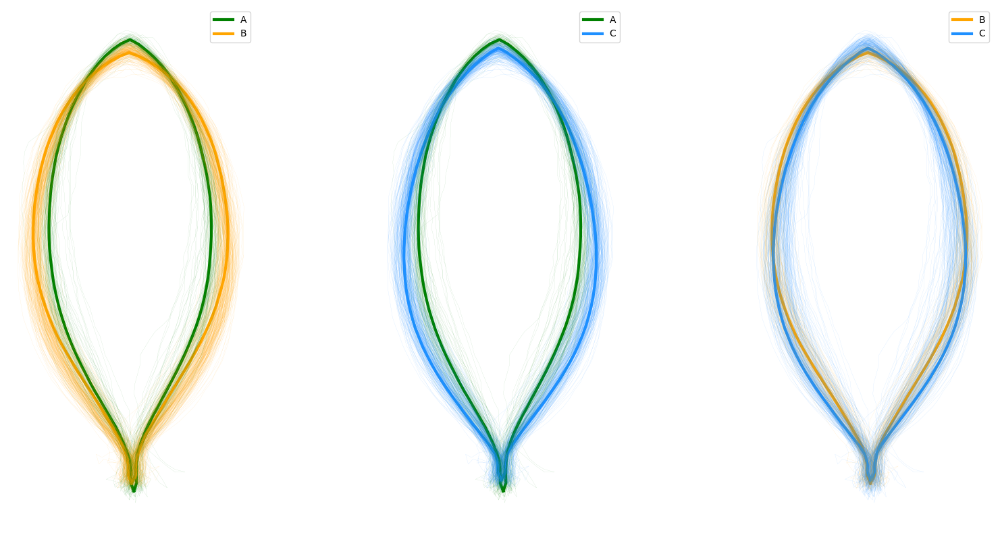

In [56]:
# get A, B, and C leaf coords from proc_arr using indices from df all_mdata
A_lfs = proc_arr[np.array(mdata[mdata["group"]=="A"].index)]
B_lfs = proc_arr[np.array(mdata[mdata["group"]=="B"].index)]
C_lfs = proc_arr[np.array(mdata[mdata["group"]=="C"].index)]

# create mean leaves for A, B, and C, pairwise, and overall mean
A_mean = np.mean(A_lfs, axis=0)
B_mean = np.mean(B_lfs, axis=0)
C_mean = np.mean(C_lfs, axis=0)

A_B_mean = np.mean(np.row_stack((A_lfs, B_lfs)), axis=0)
A_C_mean = np.mean(np.row_stack((A_lfs, C_lfs)), axis=0)
B_C_mean = np.mean(np.row_stack((B_lfs, C_lfs)), axis=0)

overall_mean = np.mean(proc_arr, axis=0)

# plot our comparison of A, B, and C procrustean leaves and means
plt.figure(figsize=(20,10))

A_col = "green"
B_col = "orange"
C_col = "dodgerblue"

#########################
# A vs B
#########################

plt.subplot(131)
plt.plot(A_mean[:,0],A_mean[:,1], c=A_col, lw=3, label="A")
plt.plot(B_mean[:,0],B_mean[:,1], c=B_col, lw=3, label="B")
plt.legend()

for i in range(len(proc_arr)):

    if mdata["group"].iloc[i]=="A":
        col = A_col
    else:
        col = B_col

    plt.plot(proc_arr[i,:,0],proc_arr[i,:,1], c=col, lw=0.05, alpha=0.8)
    plt.gca().set_aspect("equal")

plt.axis("off")

#########################
# A vs C
#########################

plt.subplot(132)
plt.plot(A_mean[:,0],A_mean[:,1], c=A_col, lw=3, label="A")
plt.plot(C_mean[:,0],C_mean[:,1], c=C_col, lw=3, label="C")
plt.legend()

for i in range(len(proc_arr)):

    if mdata["group"].iloc[i]=="A":
        col = A_col
    else:
        col = C_col

    plt.plot(proc_arr[i,:,0],proc_arr[i,:,1], c=col, lw=0.05, alpha=0.8)
    plt.gca().set_aspect("equal")

plt.axis("off")

#########################
# B vs C
#########################

plt.subplot(133)
plt.plot(B_mean[:,0],B_mean[:,1], c=B_col, lw=3, label="B")
plt.plot(C_mean[:,0],C_mean[:,1], c=C_col, lw=3, label="C")
plt.legend()

for i in range(len(proc_arr)):

    if mdata["group"].iloc[i]=="B":
        col = B_col
    else:
        col = C_col

    plt.plot(proc_arr[i,:,0],proc_arr[i,:,1], c=col, lw=0.05, alpha=0.8)
    plt.gca().set_aspect("equal")

plt.axis("off")

plt.savefig("figure_6b.png")

For each pseudo-landmark, use a Kruskal-Wallis test to compare the Euclidean distance to the group mean compared to the overall mean

In [57]:
#########################
#########################
######## A VS B #########
#########################
#########################

A_B_p_vals = [] # store p values for each landmark

for i in range(np.shape(proc_arr)[1]):

    ## GROUP 1##
    # eulidean distances of A sample to A mean
    A_eds = euclid_dist(A_lfs[:,i,0],A_lfs[:,i,1],
                A_mean[i,0],A_mean[i,1])
    # eulidean distances of B sample to B mean
    B_eds = euclid_dist(B_lfs[:,i,0],B_lfs[:,i,1],
                B_mean[i,0],B_mean[i,1])
    # group 1 = euclidean distances to group mean
    group1 = np.concatenate((A_eds, B_eds))

    ## GROUP 2##
    # eulidean distances of A to pairwise mean
    ovr_A_eds = euclid_dist(A_lfs[:,i,0],A_lfs[:,i,1],
                A_B_mean[i,0],A_B_mean[i,1])
    # eulidean distances of B sample to pairwise mean
    ovr_B_eds = euclid_dist(B_lfs[:,i,0],B_lfs[:,i,1],
                A_B_mean[i,0],A_B_mean[i,1])
    # group 2 = euclidean distances to group mean
    group2 = np.concatenate((ovr_A_eds, ovr_B_eds))
    
    # perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(group1, group2)
    # store p value
    A_B_p_vals.append(p_value)
    
# Adjust p-values using the BH correction
A_B_fdrBH_pvals = multitest.multipletests(A_B_p_vals, method='fdr_bh')

# get -log10 p values
A_B_neg_log10 = -np.log10(A_B_fdrBH_pvals[1])


#########################
#########################
######## A VS C #########
#########################
#########################

A_C_p_vals = [] # store p values for each landmark

for i in range(np.shape(proc_arr)[1]):

    ## GROUP 1##
    # eulidean distances of A sample to A mean
    A_eds = euclid_dist(A_lfs[:,i,0],A_lfs[:,i,1],
                A_mean[i,0],A_mean[i,1])
    # eulidean distances of C sample to C mean
    C_eds = euclid_dist(C_lfs[:,i,0],C_lfs[:,i,1],
                C_mean[i,0],C_mean[i,1])
    # group 1 = euclidean distances to group mean
    group1 = np.concatenate((A_eds, C_eds))

    ## GROUP 2##
    # eulidean distances of A to pairwise mean
    ovr_A_eds = euclid_dist(A_lfs[:,i,0],A_lfs[:,i,1],
                A_C_mean[i,0],A_C_mean[i,1])
    # eulidean distances of C sample to overall mean
    ovr_C_eds = euclid_dist(C_lfs[:,i,0],C_lfs[:,i,1],
                A_C_mean[i,0],A_C_mean[i,1])
    # group 2 = euclidean distances to group mean
    group2 = np.concatenate((ovr_A_eds, ovr_C_eds))
    
    # perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(group1, group2)
    # store p value
    A_C_p_vals.append(p_value)
    
# Adjust p-values using the BH correction
A_C_fdrBH_pvals = multitest.multipletests(A_C_p_vals, method='fdr_bh')

# get -log10 p values
A_C_neg_log10 = -np.log10(A_C_fdrBH_pvals[1])

#########################
#########################
######## B VS C #########
#########################
#########################

B_C_p_vals = [] # store p values for each landmark

for i in range(np.shape(proc_arr)[1]):

    ## GROUP 1##
    # eulidean distances of A sample to A mean
    B_eds = euclid_dist(B_lfs[:,i,0],B_lfs[:,i,1],
                B_mean[i,0],B_mean[i,1])
    # eulidean distances of C sample to C mean
    C_eds = euclid_dist(C_lfs[:,i,0],C_lfs[:,i,1],
                C_mean[i,0],C_mean[i,1])
    # group 1 = euclidean distances to group mean
    group1 = np.concatenate((B_eds, C_eds))

    ## GROUP 2##
    # eulidean distances of A to overall mean
    ovr_B_eds = euclid_dist(B_lfs[:,i,0],B_lfs[:,i,1],
                B_C_mean[i,0],B_C_mean[i,1])
    # eulidean distances of C sample to overall mean
    ovr_C_eds = euclid_dist(C_lfs[:,i,0],C_lfs[:,i,1],
                B_C_mean[i,0],B_C_mean[i,1])
    # group 2 = euclidean distances to group mean
    group2 = np.concatenate((ovr_B_eds, ovr_C_eds))
    
    # perform Kruskal-Wallis test
    statistic, p_value = stats.kruskal(group1, group2)
    # store p value
    B_C_p_vals.append(p_value)
    
# Adjust p-values using the BH correction
B_C_fdrBH_pvals = multitest.multipletests(B_C_p_vals, method='fdr_bh')

# get -log10 p values
B_C_neg_log10 = -np.log10(B_C_fdrBH_pvals[1])

#######################
#######################
### CREATE PVAL DF  ###
#######################
#######################

# create a pandas dataframe with overall mean leaf coordinates for plotting
pval_df = pd.DataFrame({"xval":overall_mean[:,0],
                        "yval":overall_mean[:,1],
                        "A_B_pval":A_B_neg_log10,
                       "A_C_pval":A_C_neg_log10,
                       "B_C_pval":B_C_neg_log10})


In [58]:
# Reset -log10 p values to -log10(0.05) if equal to or lower than that value for plotting

pval_df["A_B_pval"] = np.where(pval_df["A_B_pval"]<=-np.log10(0.05), -np.log10(0.05), pval_df["A_B_pval"])
pval_df["A_C_pval"] = np.where(pval_df["A_C_pval"]<=-np.log10(0.05), -np.log10(0.05), pval_df["A_C_pval"])
pval_df["B_C_pval"] = np.where(pval_df["B_C_pval"]<=-np.log10(0.05), -np.log10(0.05), pval_df["B_C_pval"])

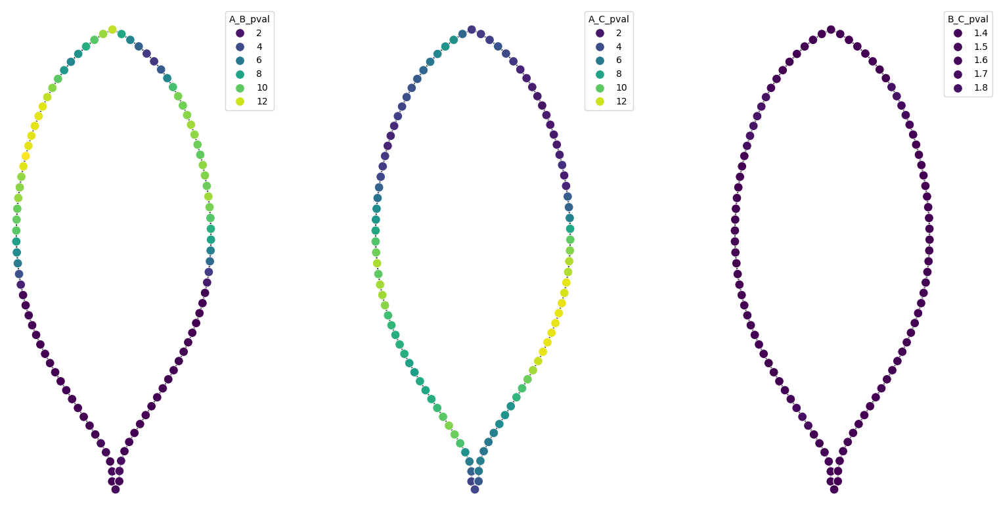

In [59]:
# project negative log10 FDR BH pvals on mean leaf

plt.figure(figsize=(20,10))

plt.subplot(131)
plt.plot(pval_df["xval"],pval_df["yval"], c="k", zorder=0) # plot of mean leaf
ax=sns.scatterplot(data=pval_df, x="xval", y="yval", hue="A_B_pval", palette="viridis", s=100, 
                   hue_norm=plt.Normalize(-np.log10(0.05), np.max(A_B_neg_log10))
                  ) # pvals
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.gca().set_aspect("equal")
plt.axis("off")

plt.subplot(132)
plt.plot(pval_df["xval"],pval_df["yval"], c="k", zorder=0) # plot of mean leaf
ax=sns.scatterplot(data=pval_df, x="xval", y="yval", hue="A_C_pval", palette="viridis", s=100,
                  hue_norm=plt.Normalize(-np.log10(0.05), np.max(A_B_neg_log10))
                  ) # pvals
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.gca().set_aspect("equal")
plt.axis("off")

plt.subplot(133)
plt.plot(pval_df["xval"],pval_df["yval"], c="k", zorder=0) # plot of mean leaf
ax=sns.scatterplot(data=pval_df, x="xval", y="yval", hue="B_C_pval", palette="viridis", s=100,
                  hue_norm=plt.Normalize(-np.log10(0.05), np.max(A_B_neg_log10))
                  ) # pvals
sns.move_legend(ax, "upper left", bbox_to_anchor=(1, 1))
plt.gca().set_aspect("equal")
plt.axis("off")

plt.savefig("figure_6c.png")